# Power Consumption in ACs

## Data cleaning

Let us first import the required libraries and the dataset to see what we are dealing with here.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from matplotlib import rcParams

rcParams["figure.figsize"] = 24, 20

data = pd.read_csv("AC_data.csv")
print(data.shape)
print(data.head())

(87840, 19)
                     0      AC 1      AC 2  AC 3  AC 4      AC 5      AC 6  \
0  2019-08-01 00:00:00  7.518632  8.788315   0.0   0.0  2.617045  4.079041   
1  2019-08-01 00:01:00       NaN       NaN   NaN   NaN       NaN       NaN   
2  2019-08-01 00:02:00  7.426114  8.940615   0.0   0.0  2.581625  3.781231   
3  2019-08-01 00:03:00       NaN       NaN   NaN   NaN       NaN       NaN   
4  2019-08-01 00:04:00  7.052986  9.161103   0.0   0.0  2.592095  3.800127   

       AC 7      AC 8      AC 9     AC 10     AC 11     AC 12     AC 13  \
0  2.782276  4.624447  5.222060  2.151238  1.585072  0.560373  3.142941   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2  2.529366  5.057423  5.349465  2.414715  2.168184  1.818730  3.085110   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4  2.332304  6.322521  3.995392  2.237114  3.345624  2.310409  3.132799   

      AC 14     AC 15     AC 16     AC 17     AC 18  
0  2.749470  5

What we see here is that the first column, "column 0", has the format of date and time with a differnce of a minute between any 2 consecutive rows. But, the power consumption values of each AC are provided after a 2 minute gap, leading to NaN values. So, first step will be to remove these rows which constitute half of the rows in our data frame.

We have a few options on how to go about dropping these NA values. Let's try dropna(). 

In [2]:
data0 = data.loc[:, data.columns == "0"]
dataAC = data.loc[:, data.columns != "0"]
data0['index'] = np.arange(1, data0.shape[0] + 1)
dataAC['index'] = np.arange(1, dataAC.shape[0] + 1)

dataAC.dropna(inplace = True, how = 'any', axis = 0)
data_cleaned = pd.merge(data0, dataAC, on='index')
print(data_cleaned.shape)
print(data_cleaned.head())

(34642, 20)
                     0  index      AC 1      AC 2  AC 3  AC 4      AC 5  \
0  2019-08-01 00:00:00      1  7.518632  8.788315   0.0   0.0  2.617045   
1  2019-08-01 00:02:00      3  7.426114  8.940615   0.0   0.0  2.581625   
2  2019-08-01 00:04:00      5  7.052986  9.161103   0.0   0.0  2.592095   
3  2019-08-01 00:06:00      7  6.665446  9.065626   0.0   0.0  2.575639   
4  2019-08-01 00:08:00      9  6.674838  9.096130   0.0   0.0  2.021472   

       AC 6      AC 7      AC 8      AC 9     AC 10     AC 11     AC 12  \
0  4.079041  2.782276  4.624447  5.222060  2.151238  1.585072  0.560373   
1  3.781231  2.529366  5.057423  5.349465  2.414715  2.168184  1.818730   
2  3.800127  2.332304  6.322521  3.995392  2.237114  3.345624  2.310409   
3  3.772891  2.596200  5.805132  3.553778  1.878356  2.737645  2.510972   
4  3.155697  2.845417  6.315060  3.042244  1.914650  2.452500  2.171791   

      AC 13     AC 14     AC 15     AC 16     AC 17     AC 18  
0  3.142941  2.749470 

<ipython-input-2-3a4ac49022f7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data0['index'] = np.arange(1, data0.shape[0] + 1)


Okay. data_cleaned has less than half number of observations. Further exploration of dat reveals rows with alternating NA values. That led to removal of some samples. How about we resample our data for every 2 minutes?

In [3]:
data.loc[:, '0'] = pd.to_datetime(data['0'])
data['Date_Time'] = data['0']
data.set_index('Date_Time', drop=True, inplace=True)
data_2 = data.resample('2Min').sum()
print(data_2.shape)
print(data_2.head())

(43920, 18)
                         AC 1      AC 2  AC 3  AC 4      AC 5      AC 6  \
Date_Time                                                                 
2019-08-01 00:00:00  7.518632  8.788315   0.0   0.0  2.617045  4.079041   
2019-08-01 00:02:00  7.426114  8.940615   0.0   0.0  2.581625  3.781231   
2019-08-01 00:04:00  7.052986  9.161103   0.0   0.0  2.592095  3.800127   
2019-08-01 00:06:00  6.665446  9.065626   0.0   0.0  2.575639  3.772891   
2019-08-01 00:08:00  6.674838  9.096130   0.0   0.0  2.021472  3.155697   

                         AC 7      AC 8      AC 9     AC 10     AC 11  \
Date_Time                                                               
2019-08-01 00:00:00  2.782276  4.624447  5.222060  2.151238  1.585072   
2019-08-01 00:02:00  2.529366  5.057423  5.349465  2.414715  2.168184   
2019-08-01 00:04:00  2.332304  6.322521  3.995392  2.237114  3.345624   
2019-08-01 00:06:00  2.596200  5.805132  3.553778  1.878356  2.737645   
2019-08-01 00:08:00  2.8

That works! Exactly half. Let's check whether any values are NA.

In [4]:
null_data = data_2.isnull().sum()
print(null_data)

AC 1     0
AC 2     0
AC 3     0
AC 4     0
AC 5     0
AC 6     0
AC 7     0
AC 8     0
AC 9     0
AC 10    0
AC 11    0
AC 12    0
AC 13    0
AC 14    0
AC 15    0
AC 16    0
AC 17    0
AC 18    0
dtype: int64


So that works! Let's check the summary of the data now.

In [5]:
print(data_2.describe())

               AC 1          AC 2          AC 3          AC 4          AC 5  \
count  43920.000000  43920.000000  43920.000000  43920.000000  43920.000000   
mean       2.367883      3.850482      2.556306      2.383379      1.415096   
std        2.277260      2.553006      1.494530      1.800963      0.771625   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.000000      2.093627      1.692456      1.238621      0.964796   
50%        2.081219      3.779912      2.480197      2.300987      1.376681   
75%        3.653354      5.451999      3.434028      3.470321      1.867081   
max       11.194789     11.147141      8.430909      9.879500      5.495358   

               AC 6          AC 7          AC 8          AC 9         AC 10  \
count  43920.000000  43920.000000  43920.000000  43920.000000  43920.000000   
mean       2.506499      2.964527      2.536176      3.165096      1.530288   
std        1.660726      1.486085      1.511464    

Well, this gives us a couple of insights. Like the answer to the first question is probably AC 18 given the maximum max power consumption per 2 minutes and maximum mean of all. Let's settle this question now by counting number of zeros and sum of power consumption for each AC.

In [6]:
zeros_data = (data_2 == 0).astype(int).sum(axis=0)
sum_consum = data_2.sum(axis=0)
print(zeros_data)
print(sum_consum)

AC 1     14207
AC 2      6366
AC 3      5011
AC 4      9790
AC 5      4404
AC 6      9232
AC 7      4181
AC 8      6838
AC 9      3042
AC 10     2481
AC 11     7211
AC 12     5089
AC 13     2503
AC 14     1972
AC 15     4212
AC 16     4712
AC 17     1186
AC 18     1598
dtype: int64
AC 1     103997.423000
AC 2     169113.147946
AC 3     112272.957042
AC 4     104678.005269
AC 5      62151.007653
AC 6     110085.431915
AC 7     130202.009333
AC 8     111388.856216
AC 9     139011.024092
AC 10     67210.227984
AC 11    105076.190097
AC 12    118009.300995
AC 13    187112.630994
AC 14    127466.561772
AC 15    176883.259424
AC 16    122390.195279
AC 17    184428.462396
AC 18    282567.569146
dtype: float64


So, the answer to your question depends on how you define "most used AC". Above tells us that maximum power consumption was by AC 8 and minimum by AC 5. But according to number of zeros, which can be construed as the times AC was not switched on or not being used, AC 1 was least used whereas most used was AC 17. Obviously, this result according to number of zeros is based on a hypothesis.

## Correlations, Trends and Stationarity.

Now, let us try to understand how all these variables, i.e, power consumptions of each AC every 2 minutes relate with each other. Also, we will look at the trends and seasons of each individual time series in the panel data given.

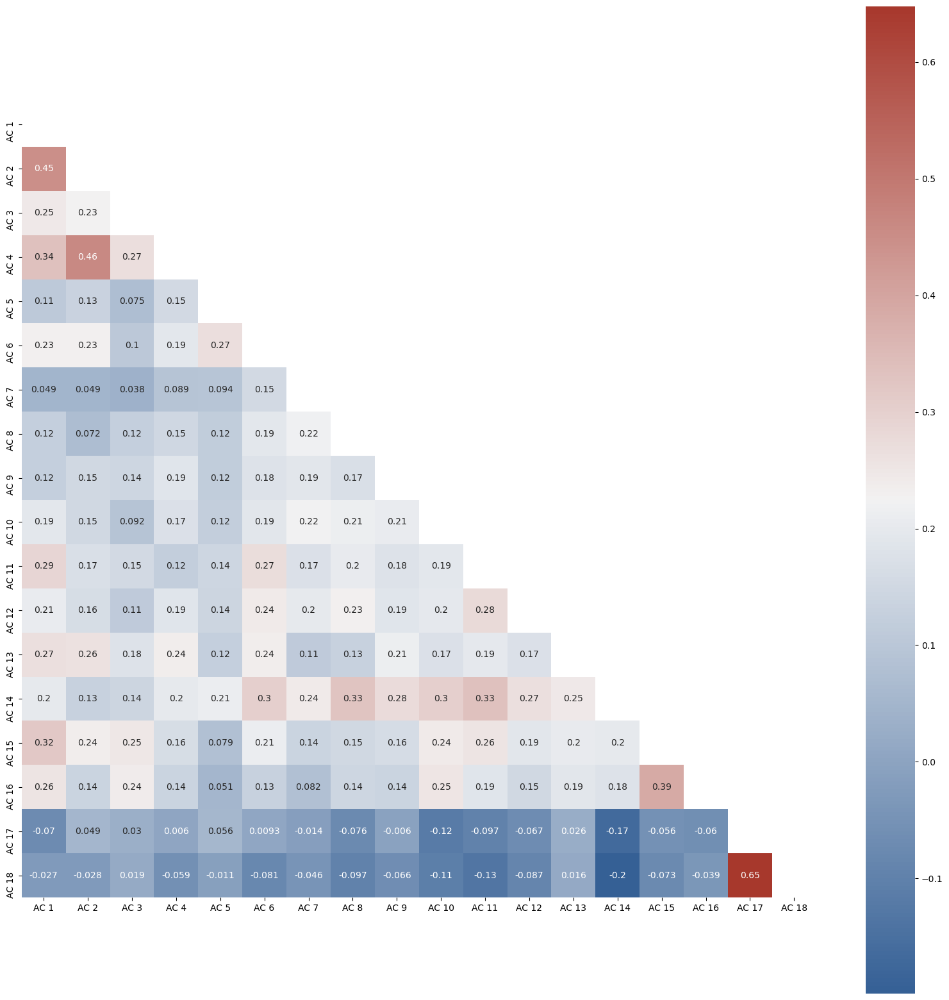

In [7]:
corrs_all = data_2.corr()

cmap = sns.diverging_palette(250, 15, s=75, l=40, n=9, center="light", as_cmap=True)
mask = np.triu(np.ones_like(corrs_all, dtype=bool))

fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrs_all, mask=mask, cmap=cmap, square=True, annot=True, ax=ax)
plt.show();

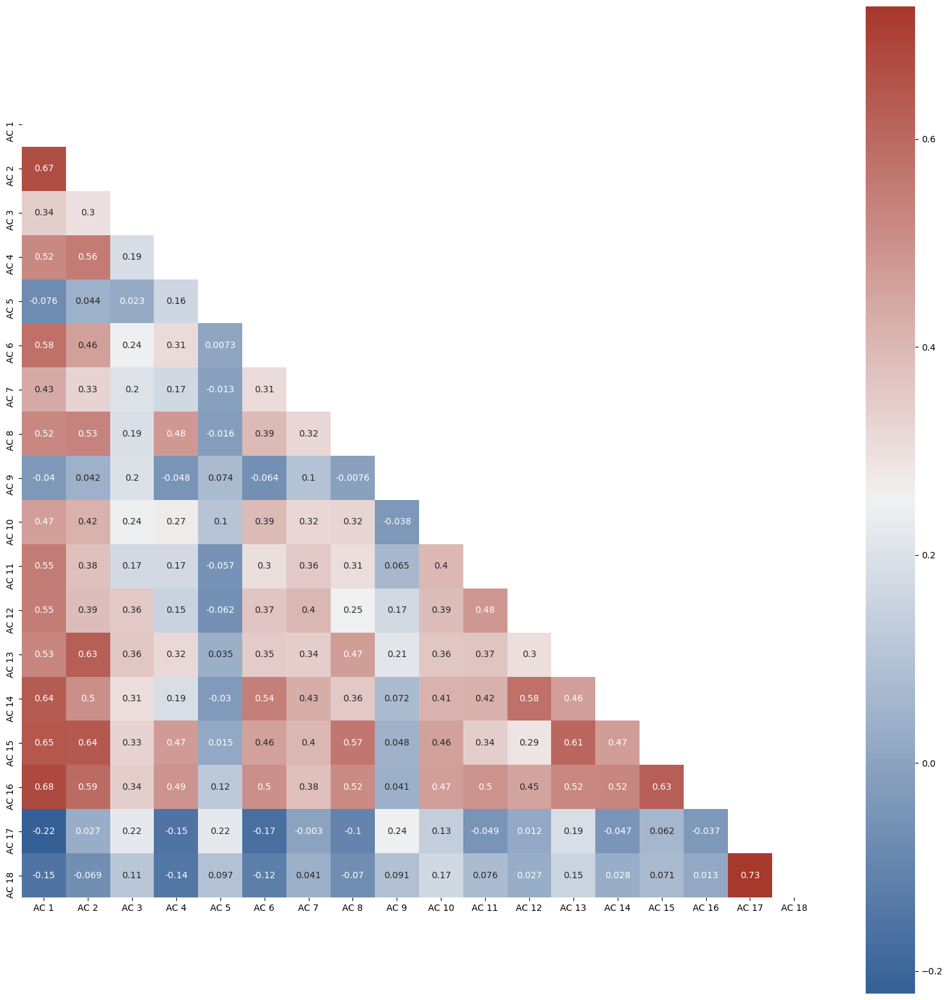

In [8]:
data_2.reset_index(inplace=True)
data_2.loc[:, 'Month'] = data_2['Date_Time'].dt.month
data_2.loc[:, 'Day'] = data_2["Date_Time"].dt.day
corrs = data_2.drop(["Date_Time"], axis = 1).groupby(["Month", "Day"]).corr()

mask = np.triu(np.ones_like(corrs.loc[(8,2)], dtype=bool))

fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrs.loc[(8,2)], mask=mask, cmap=cmap, square=True, annot=True, ax=ax)
plt.show();

Above are two heatmaps for illustrating the correlations of power consumption of the ACs 
1) with all sample points 
2) on a particular day. 

As we can see, there are a few strong correlations and most are weak. But still, a few inferences can be drawn over. Like AC 17 and AC 18 are strongly correlated, both on the single day and all over. Same can be argued for AC 1, AC 2, AC 15, AC 14, AC 16 in the second map for a single day.

Let us visualise the data for AC 17 and 18.

<Figure size 2400x2000 with 0 Axes>

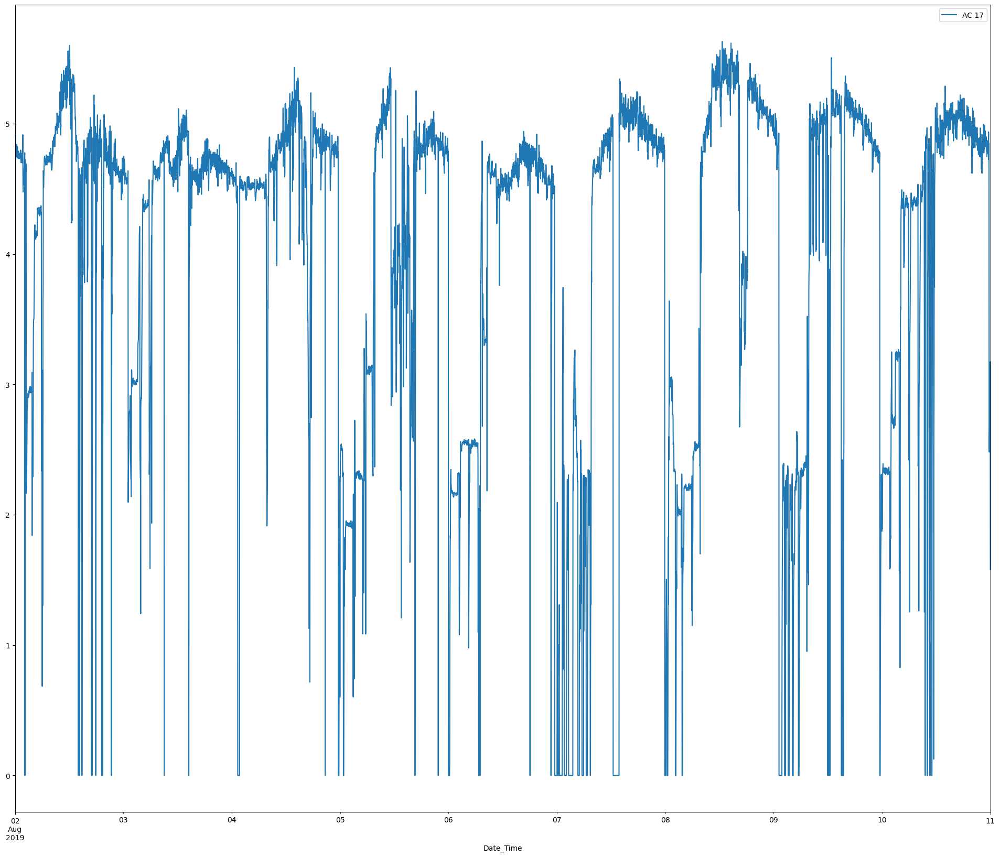

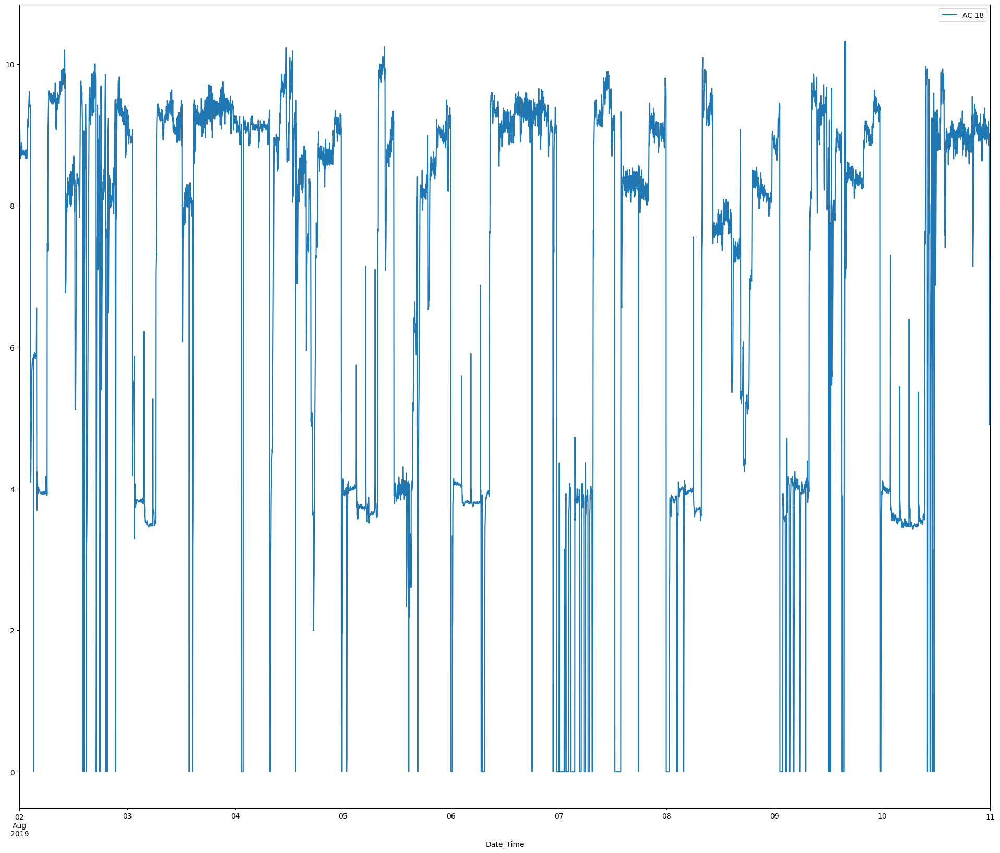

In [9]:
plt.figure()
data_2.loc[720:7200].plot(x = "Date_Time", y = "AC 17", kind = "line")
data_2.loc[720:7200].plot(x = "Date_Time", y = "AC 18", kind = "line")
plt.show()

Well, the data is pretty rough. Maybe a smoothening can help us understand the data better. Let us calculate the rolling means with a window of 30 steps, i.e, an hour, for all the power consumptions.

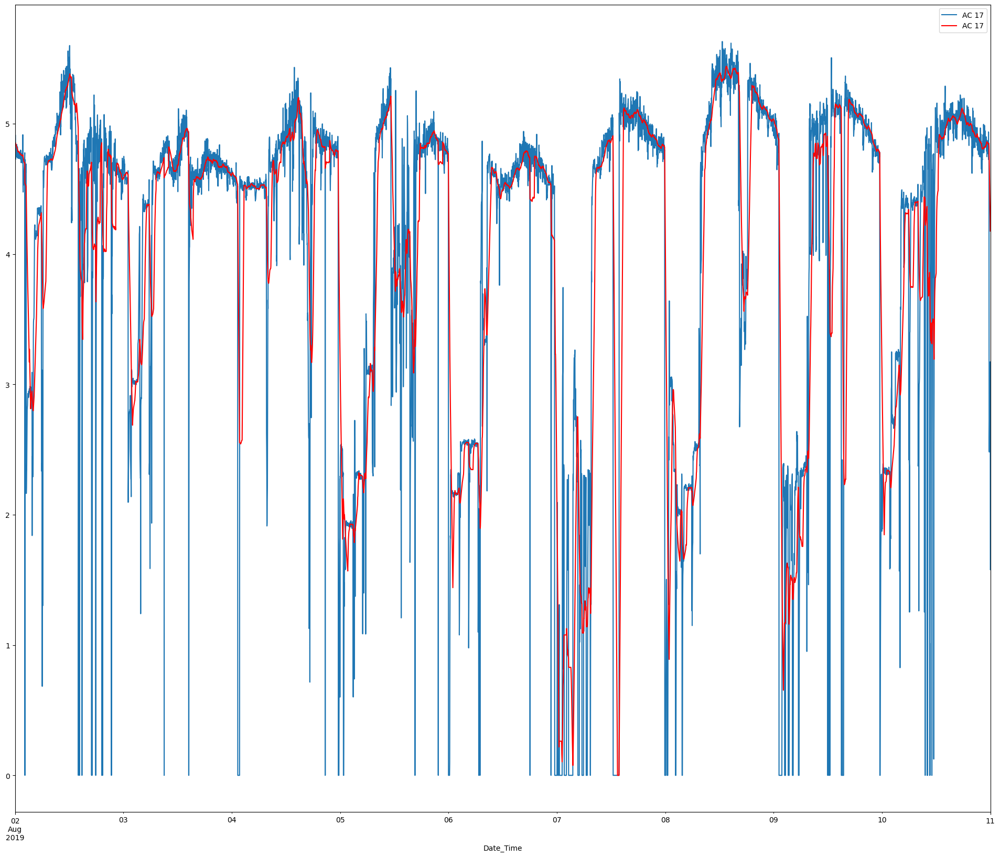

In [10]:
ACs = data_2.drop(["Date_Time", "Month", "Day"], axis=1).columns.values.tolist()
hourly_mavg = pd.DataFrame(data_2.loc[:, ["Date_Time", "Month", "Day"]])

for name in ACs:
    hourly_mavg.loc[:, name] = data_2[name].rolling(window=30).mean()
    
ax = data_2.loc[720:7200].plot(x="Date_Time", y="AC 17", kind="line")
hourly_mavg.loc[720:7200].plot(x="Date_Time", y="AC 17", kind="line", ax=ax, color="red")
plt.show()

Well, definitely it has smoothed a bit, but not much to give us any idea of trend or seasonality. So, let us find out the trends and seasonality of these series with a seasonal decomp. We cannot use a multiplicative model as the data has zero values.

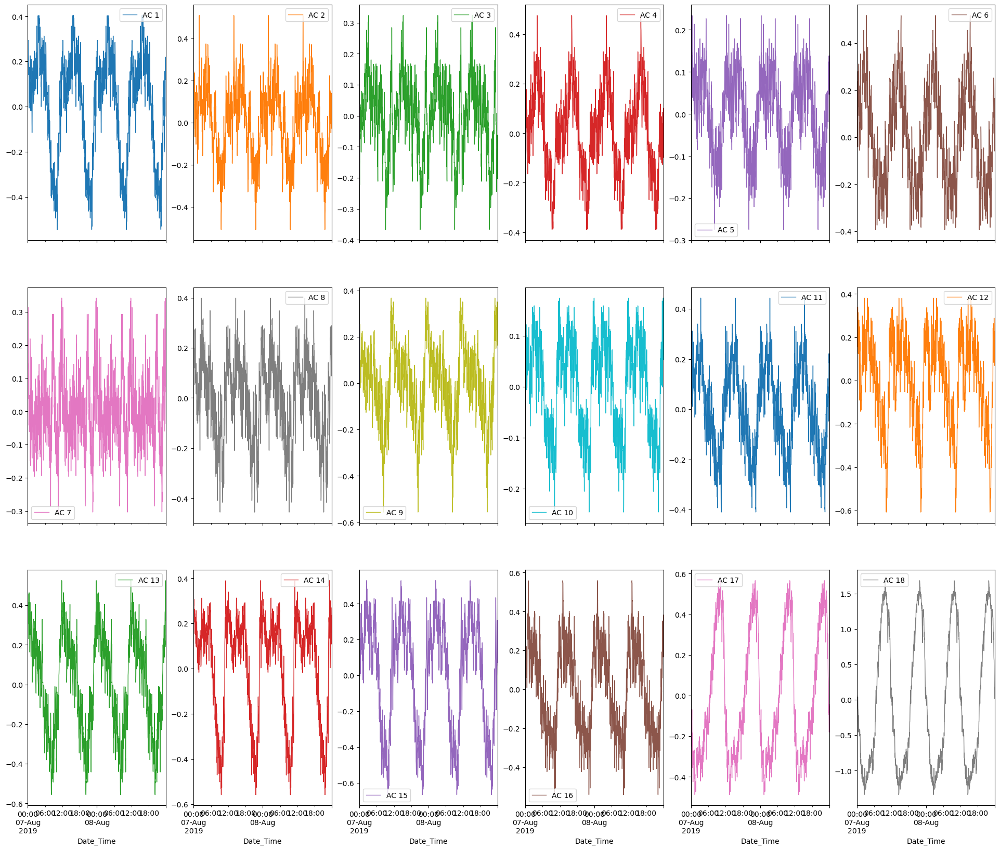

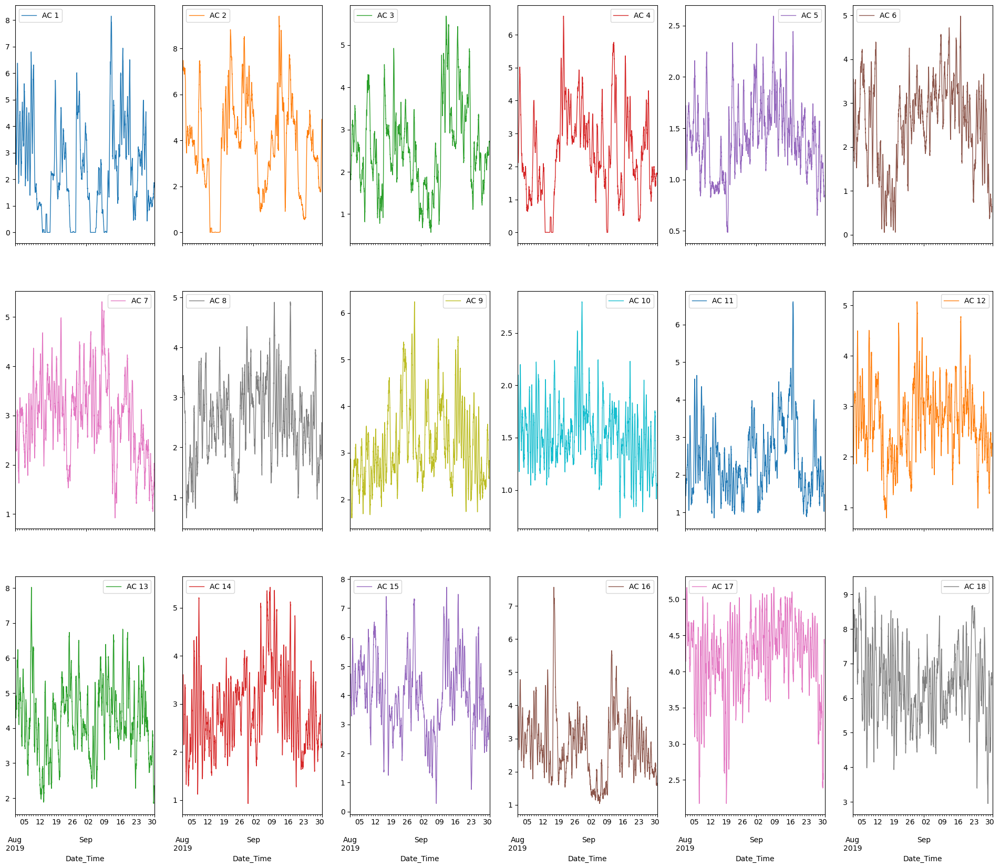

In [11]:
import statsmodels.tsa.seasonal as seasonal

data_2.set_index("Date_Time", drop=True, inplace=True)
seasonality_data = {}
trend_data = {}
residual_data = {}
decomp_freq = 6*60

for name in data_2.drop(["Month", "Day"], axis=1).columns.values.tolist():
    decomp = seasonal.seasonal_decompose(data_2[name], model = "additive", period= decomp_freq)
    seasonality_data[name] = decomp.seasonal
    trend_data[name] = decomp.trend
    residual_data[name] = decomp.resid

pd.DataFrame(seasonality_data)["2019-08-07":"2019-08-08"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(trend_data)["2019-08-01":"2019-09-30"].plot(subplots = True, layout = (3 , 6), linewidth=1)
#pd.DataFrame(residual_data)["2019-08-07":"2019-09-07"].plot(subplots = True, layout = (3 , 6), linewidth=1)
plt.show()

And here! From above, we can see that over a single day, there are 2 seasons for each AC, i.e, there is a seasonality of 12hours in our data. And for the trend over in each AC, we cannot say much as the trends are not very explicity increasing or decreasing.

Now lets us see how the underlying components of these time series are related with each other.

C:\Users\ak000\.conda\envs\al_env\lib\site-packages\seaborn\matrix.py:1216: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


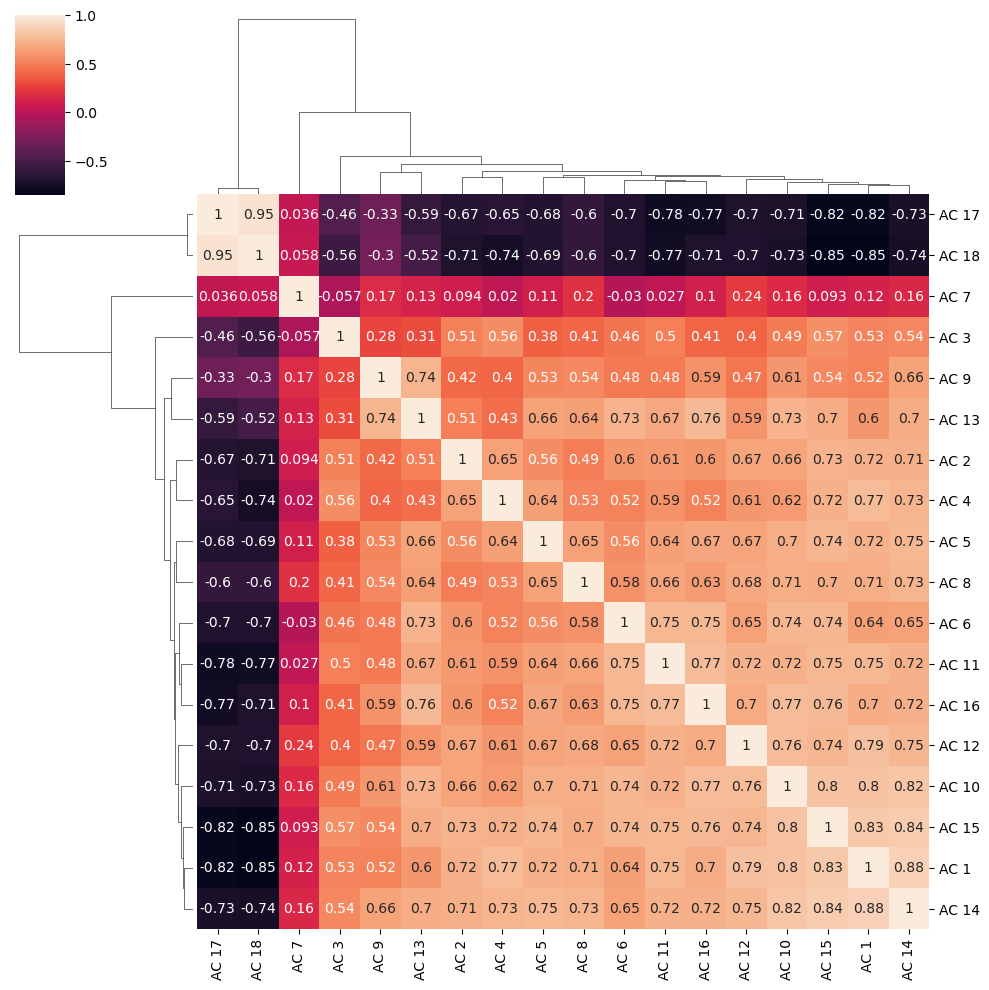

In [12]:
seasonality_corrd = pd.DataFrame(seasonality_data).corr()

sns.clustermap(seasonality_corrd, annot=True, square=True)
plt.show();

As we can see from above clustermap,

1) AC 17 and AC 18's seasonal trends are highly correlated. That means the increase/decrease patterns of their power consumption often matched over the periods.

2) Looking at the dendograms, again we can say that AC 10, AC 14, AC 15, AC 1 to have higly correlated seasonal trends.

3) Simlarly, we can group and classify the seasonal trends using the dendograms and correlations of above heatmap.

And by the way, the above table explains our seasonality plots . Say, we pick AC 18 and AC 17 and we see their high negative correlations with other seasonalities. Which makes sense given that all our seasonality plots looked like a sine curve starting from 0 whereas AC 17 and AC 18 look like a sine curve out of phase by $-\pi/2$.

Now, let us check the trends.

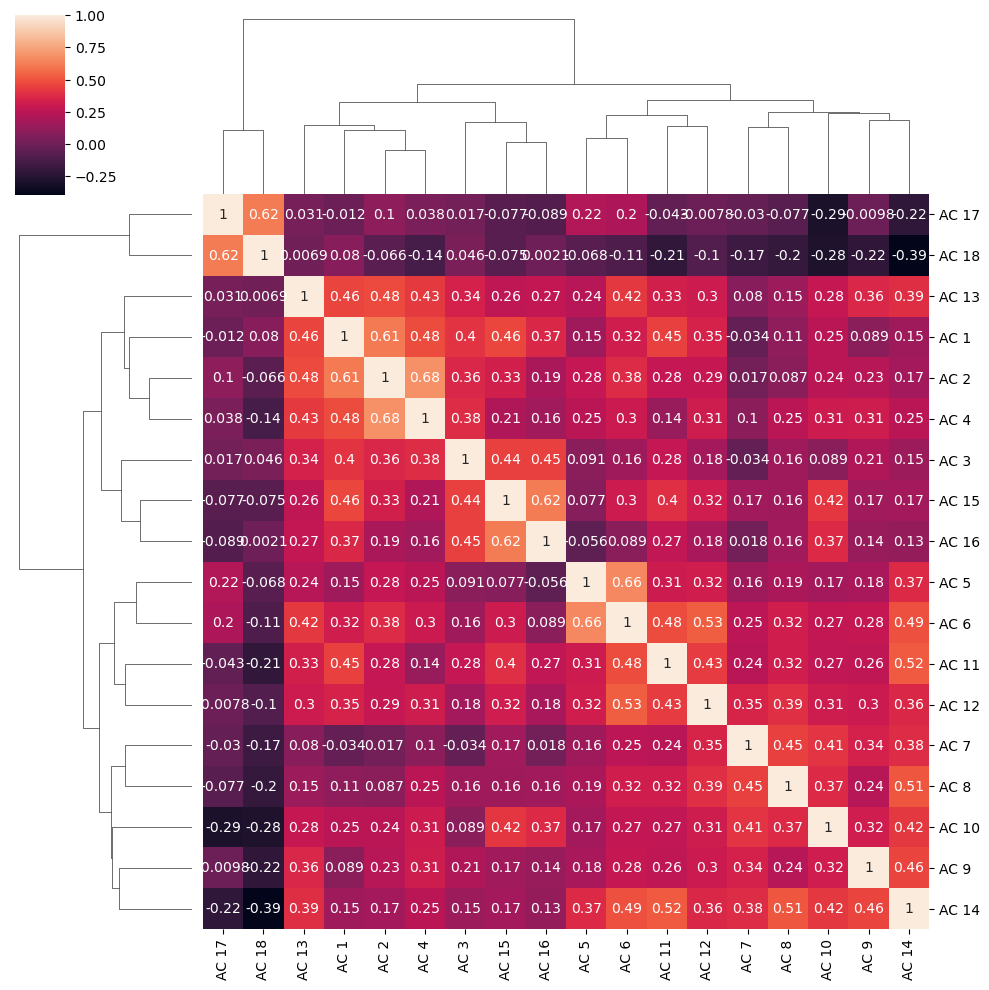

In [13]:
trend_corrd = pd.DataFrame(trend_data).corr()

sns.clustermap(trend_corrd, annot=True, square=True)
plt.show();

A look at correlations can confirm our suspicions that we had by looking at the plots; trends are not much correlated. A few noteworthy inferences of all from above map:

1) The trends of AC 17 and AC 18 have a high correlation, but not like the seasonality.

2) AC 2, AC 1 and AC 13 too are well correlated in trends.

Well, that's for the correlations between different ACs. Now, let us check auto-correlation graphs for all these time series.

AC 1


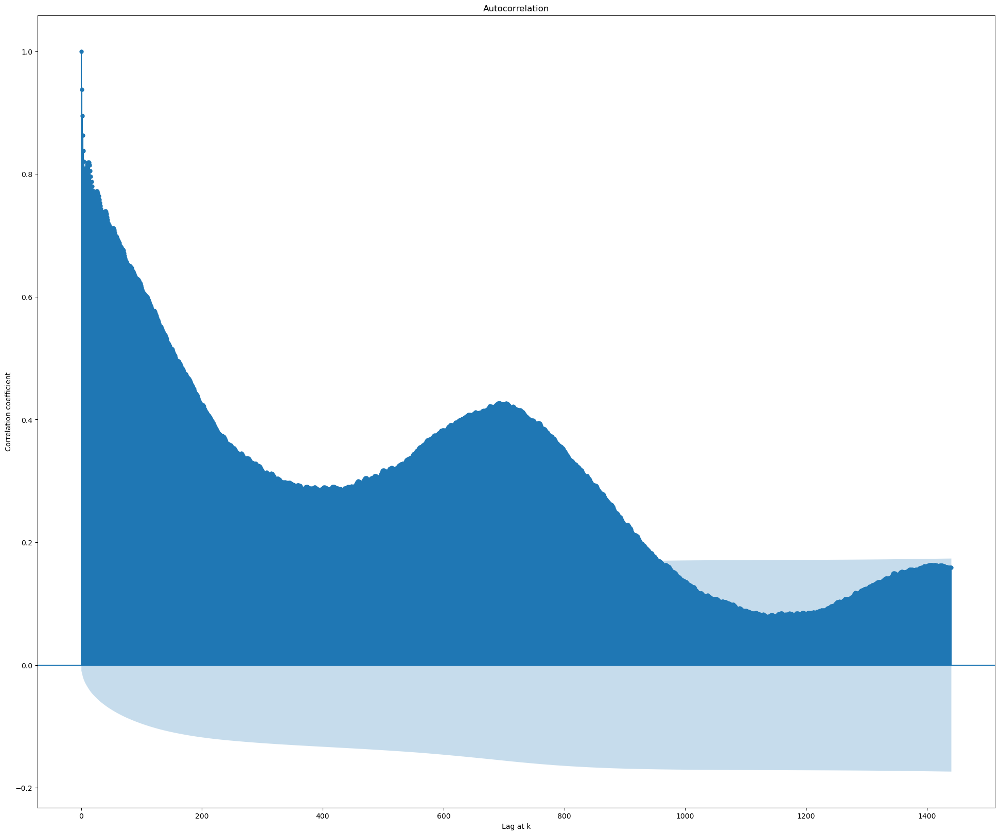

AC 2


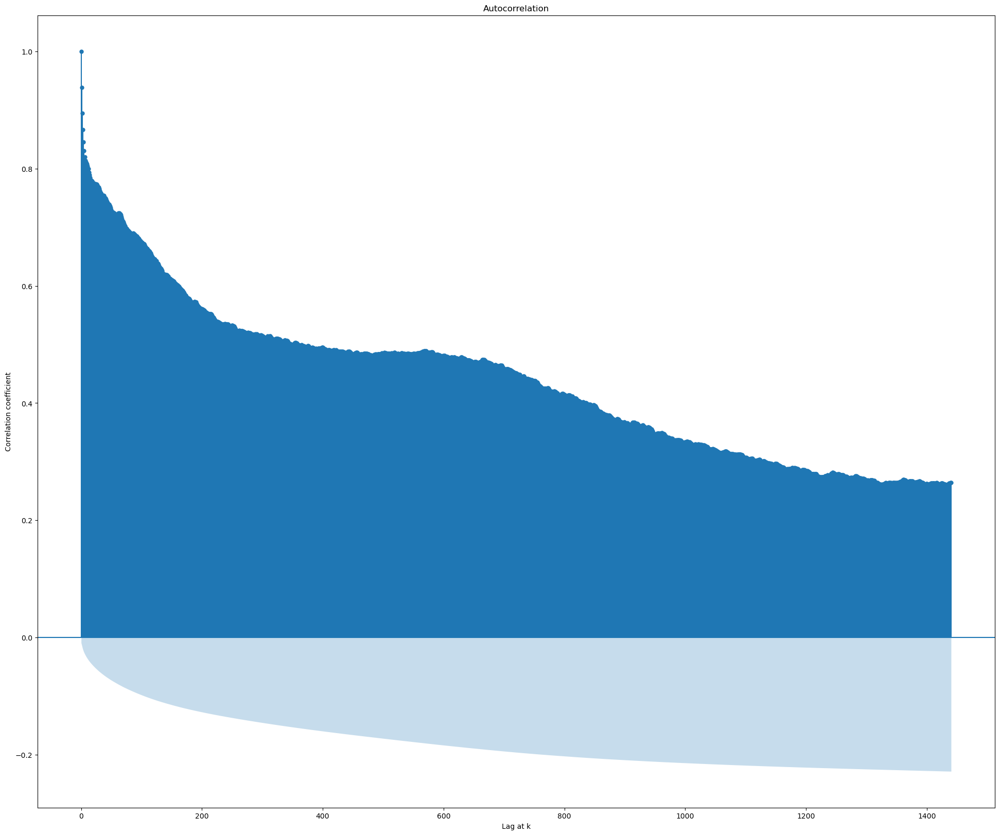

AC 3


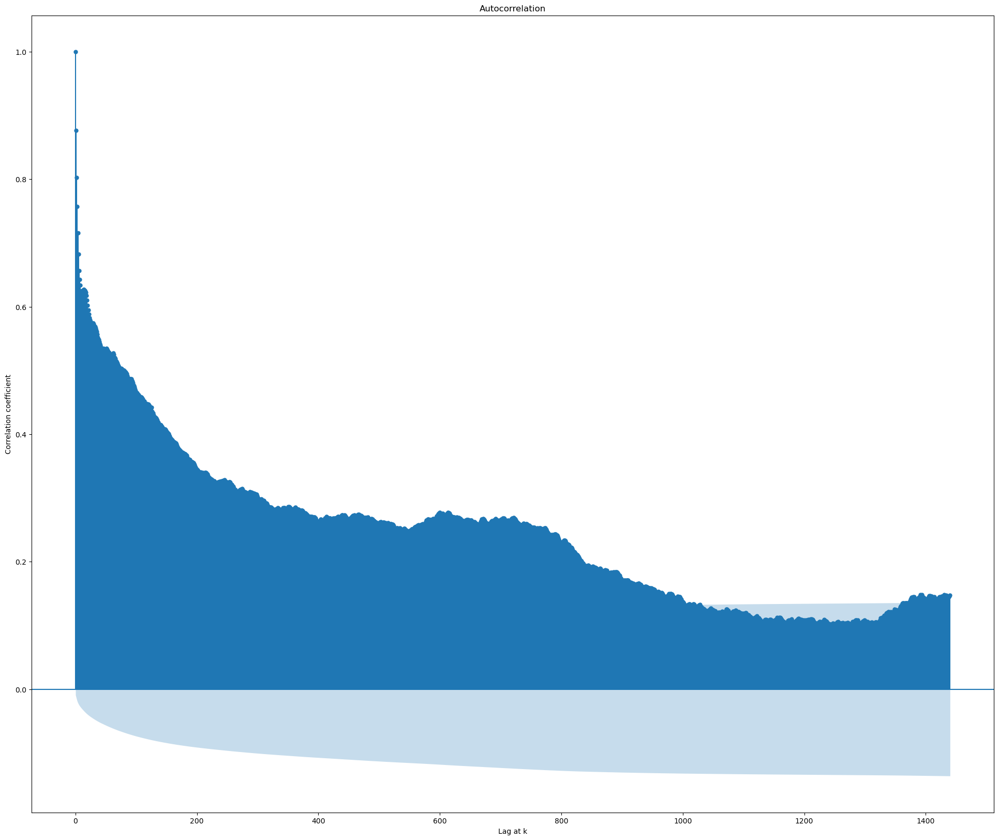

AC 4


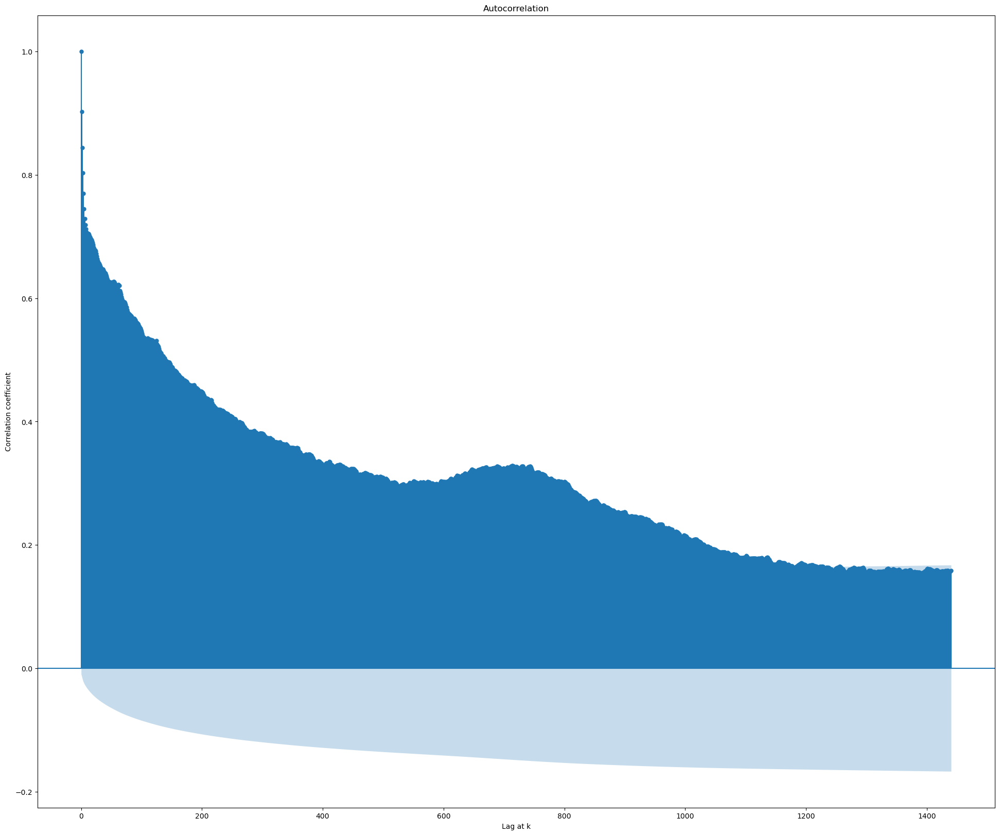

AC 5


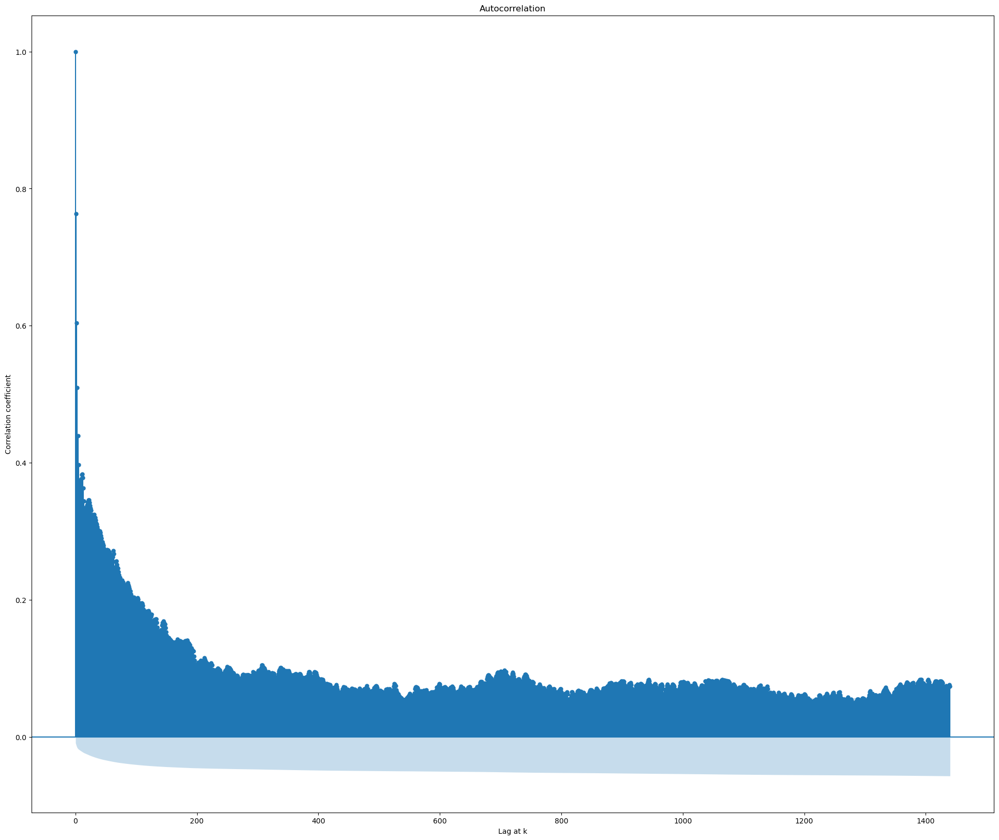

AC 6


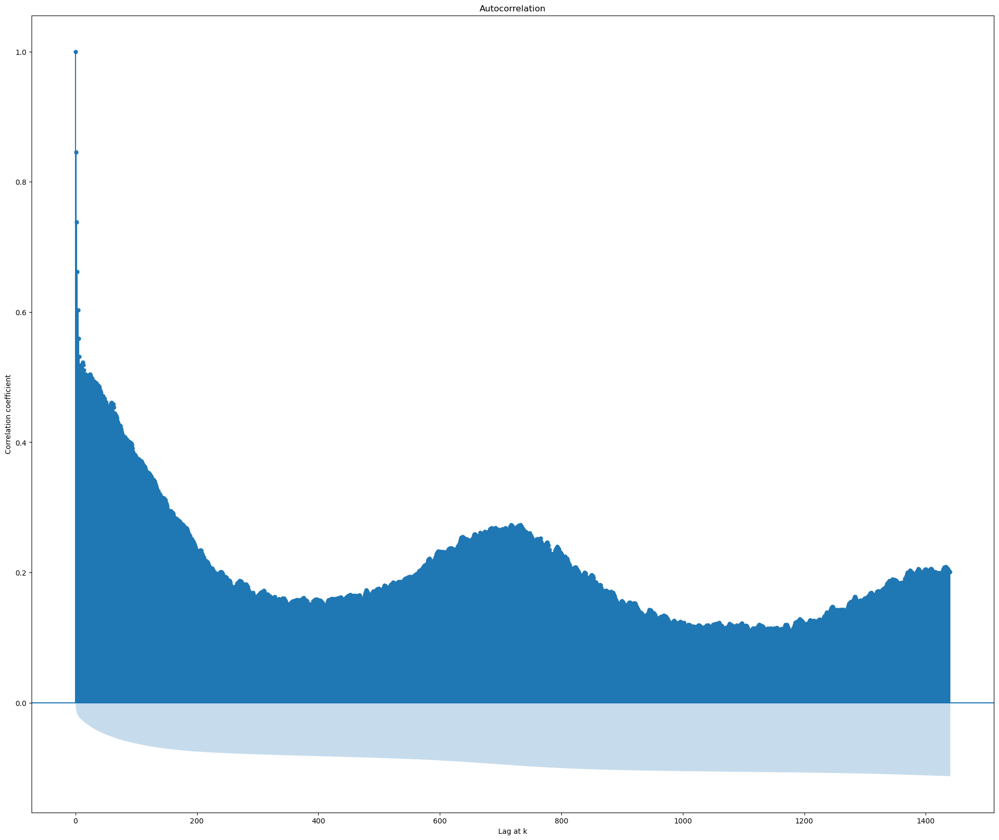

AC 7


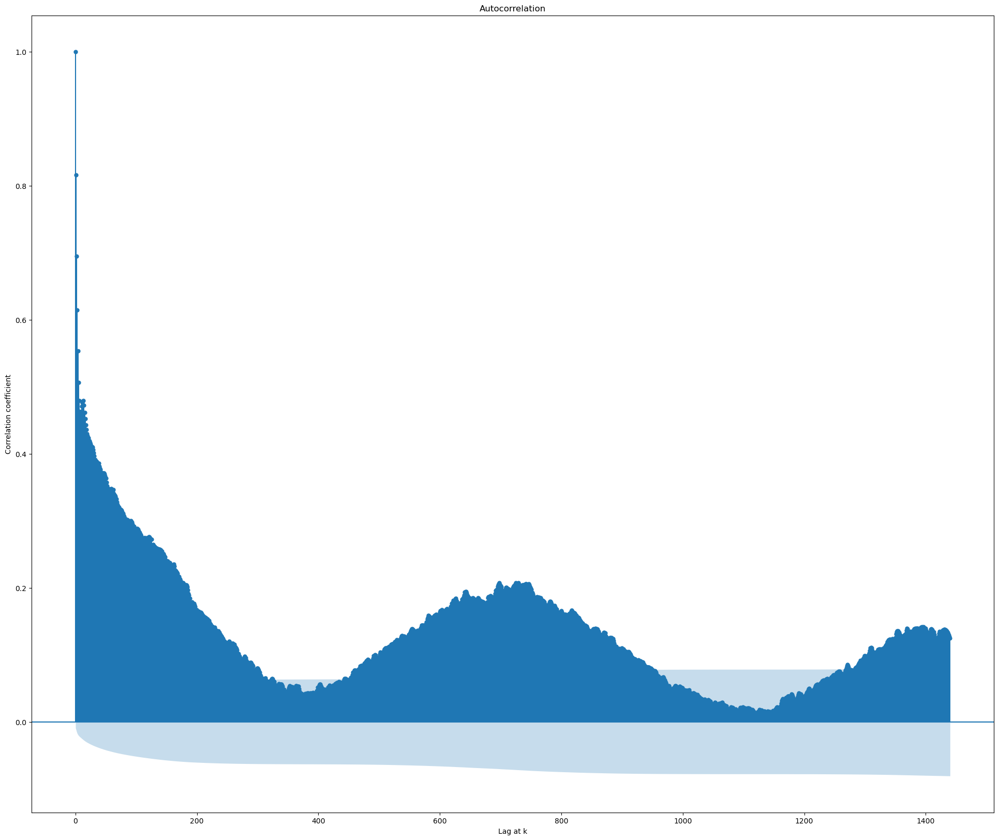

AC 8


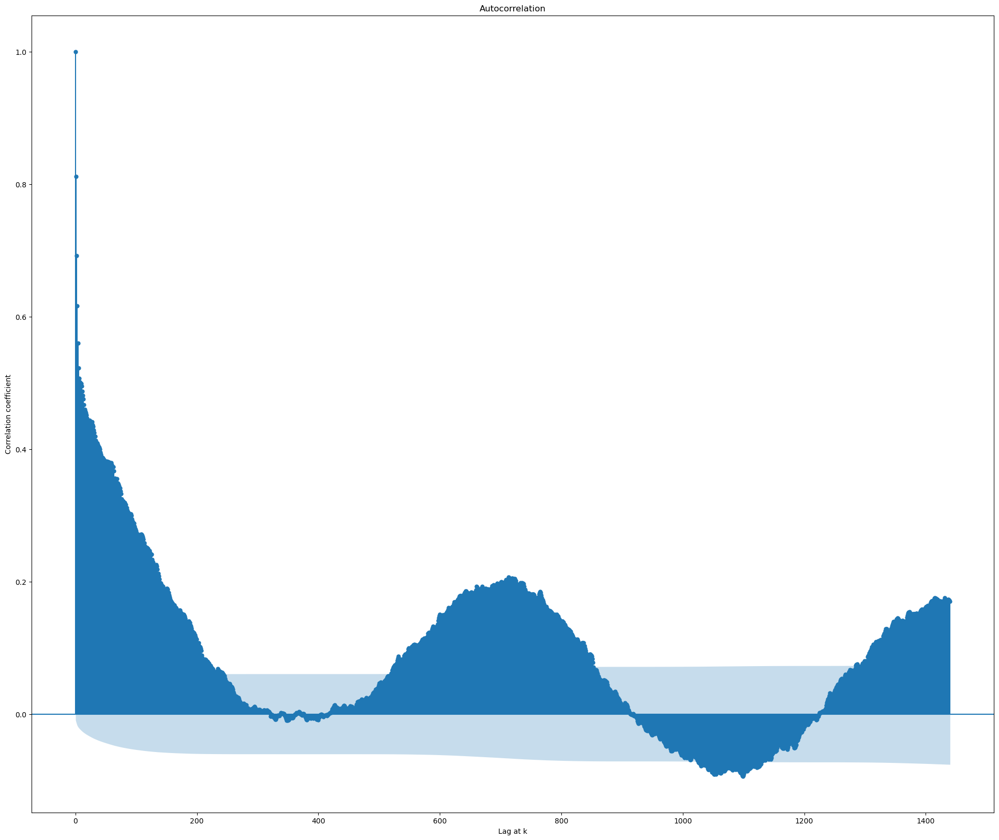

AC 9


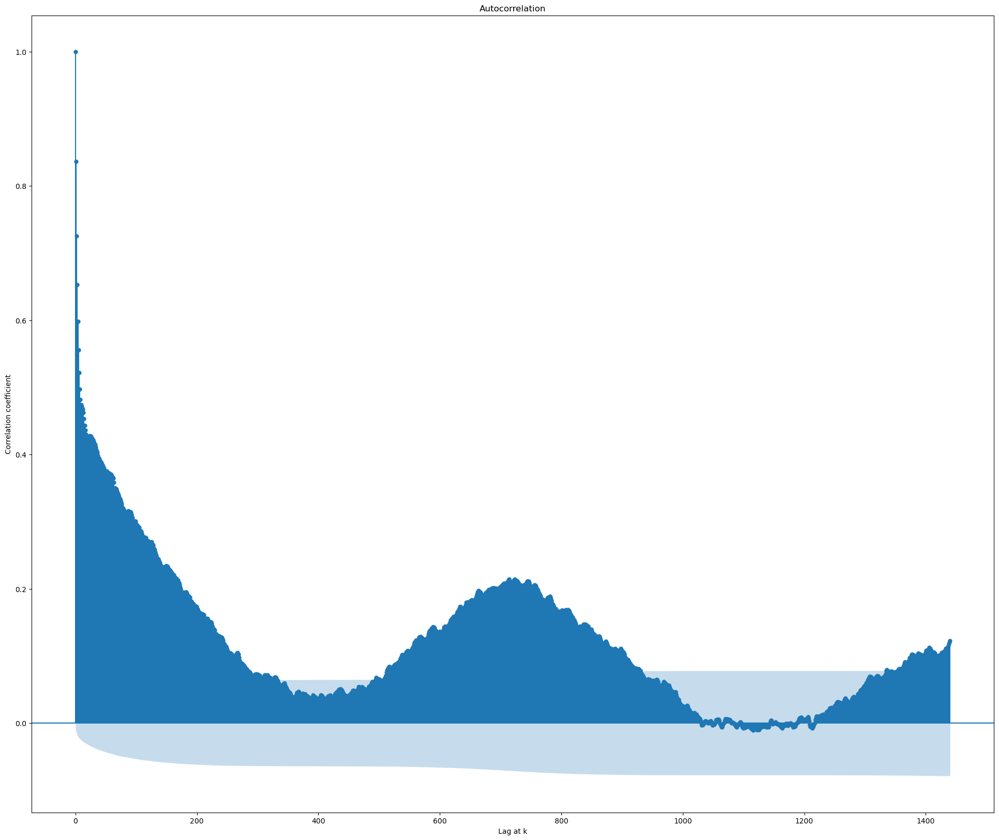

AC 10


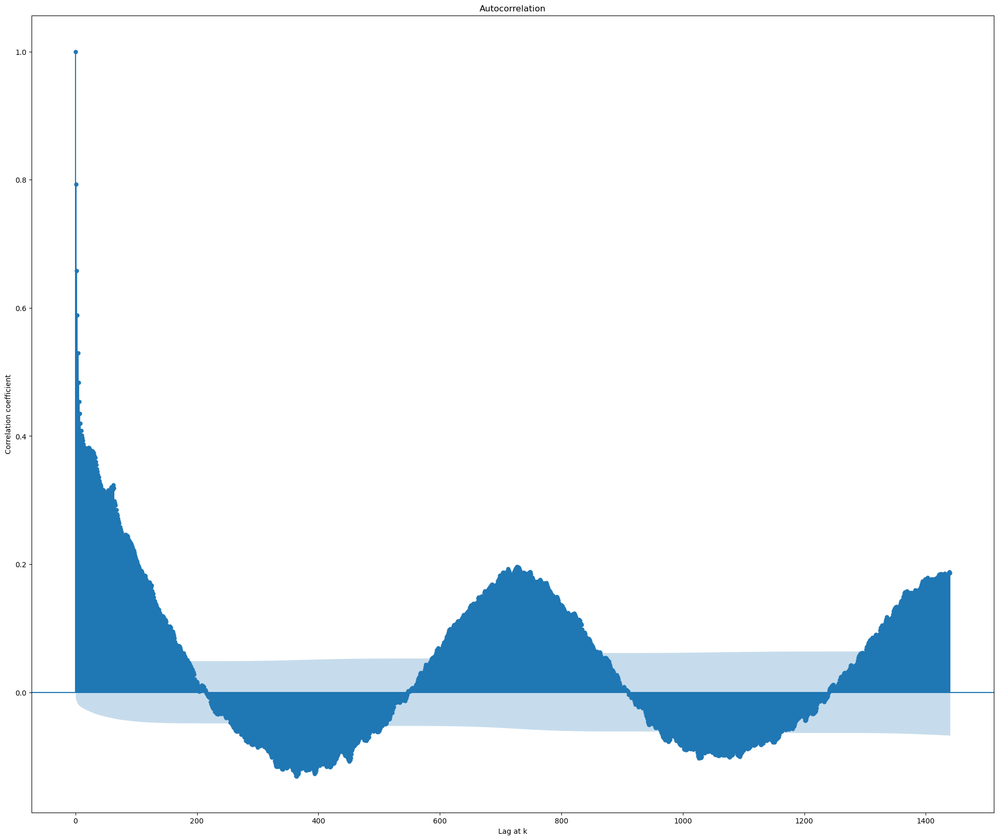

AC 11


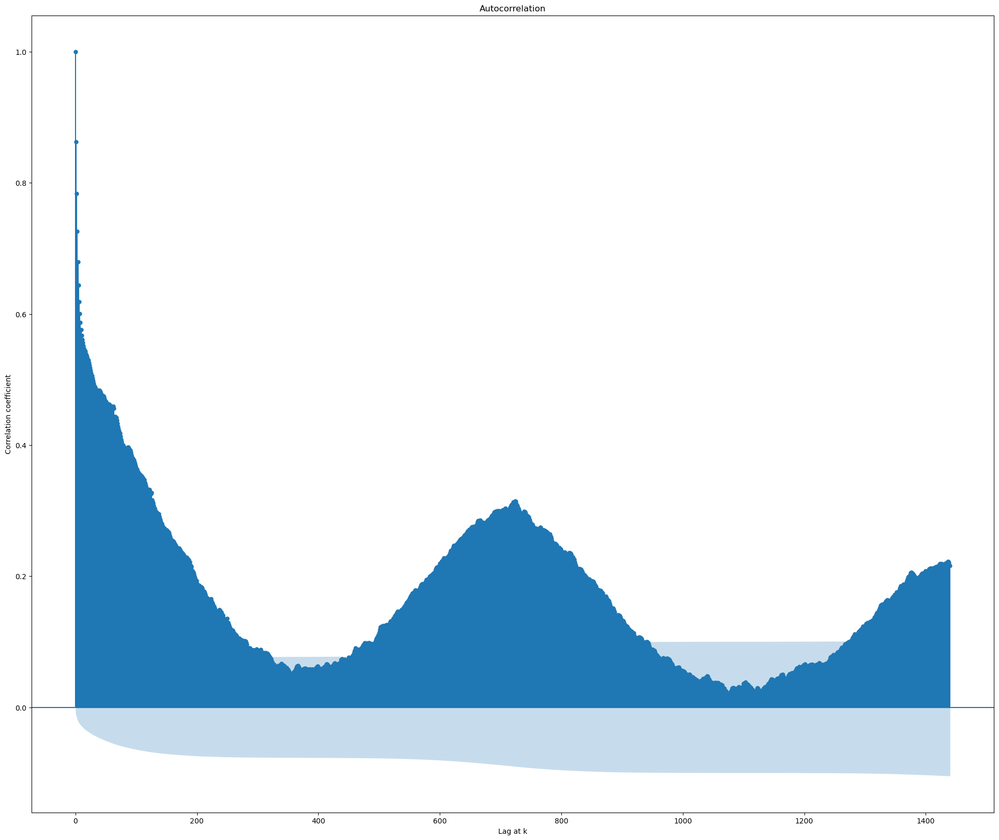

AC 12


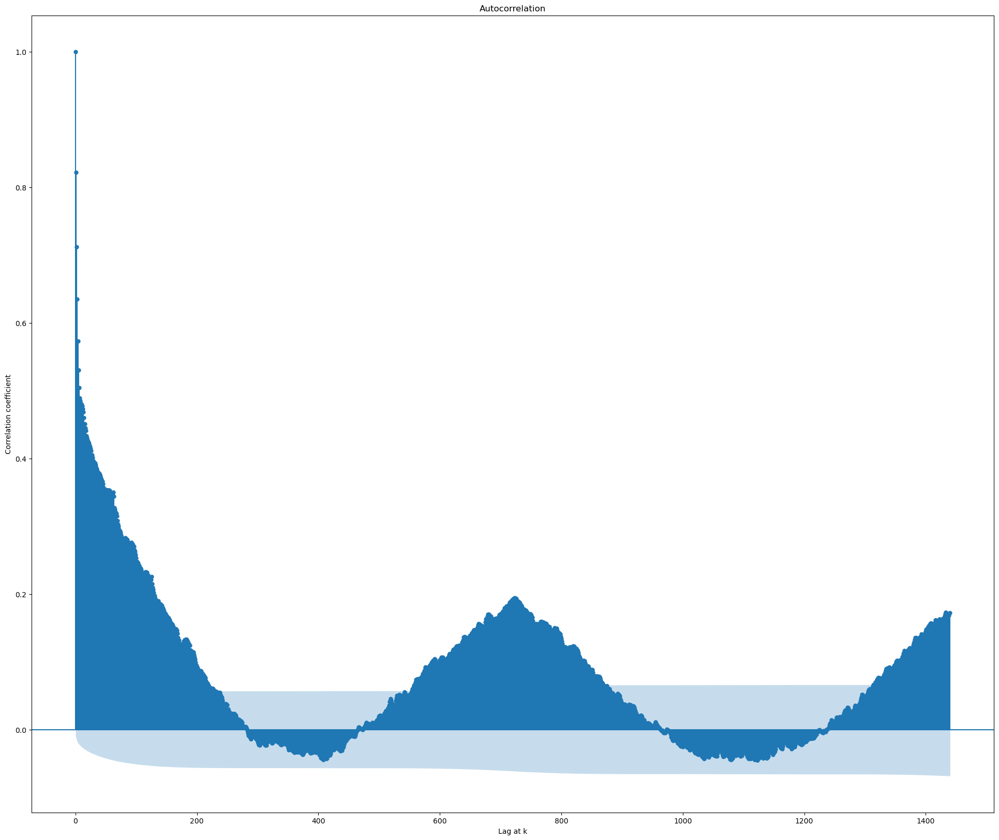

AC 13


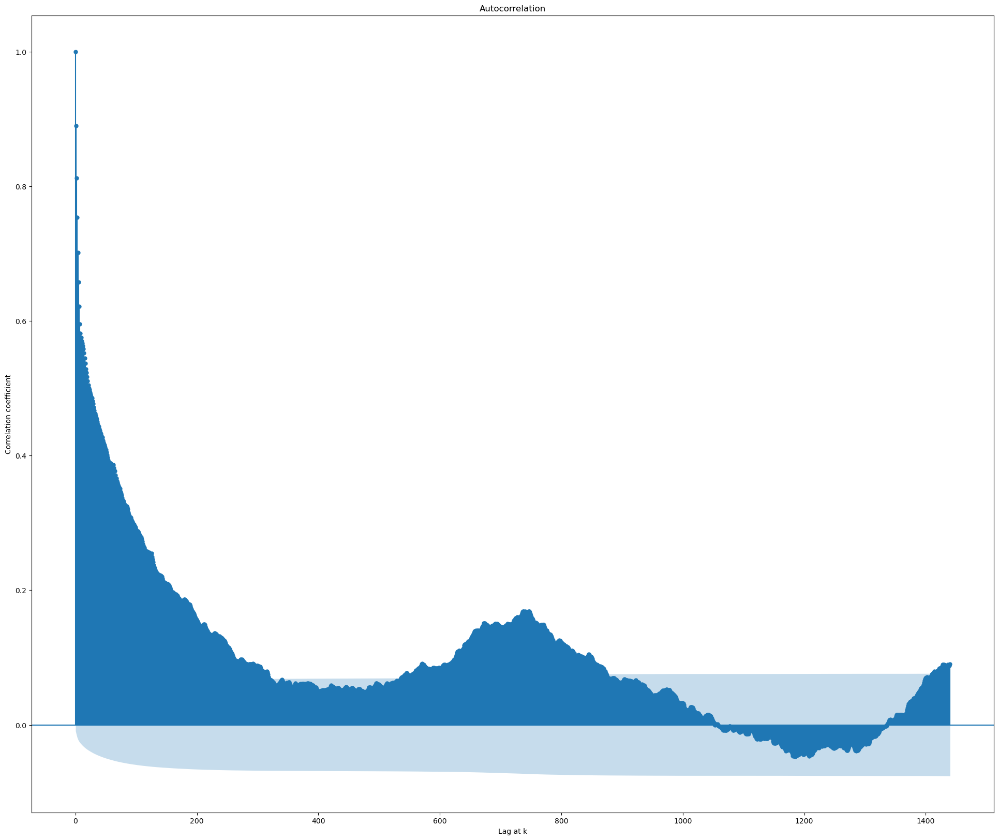

AC 14


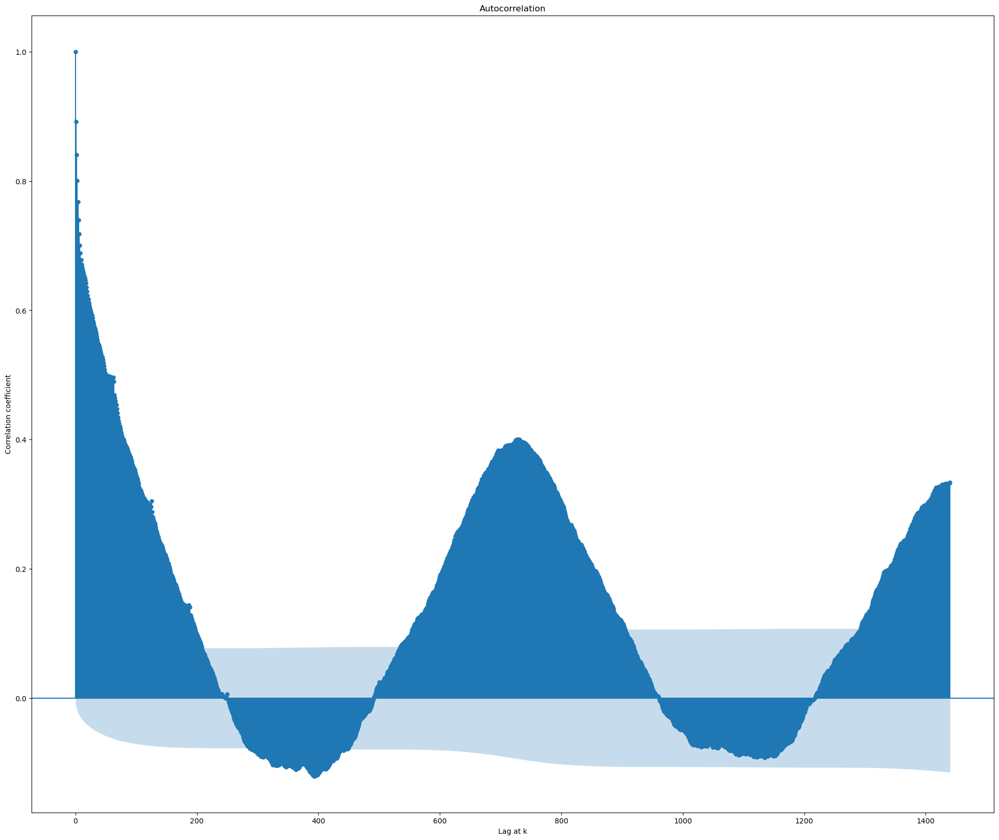

AC 15


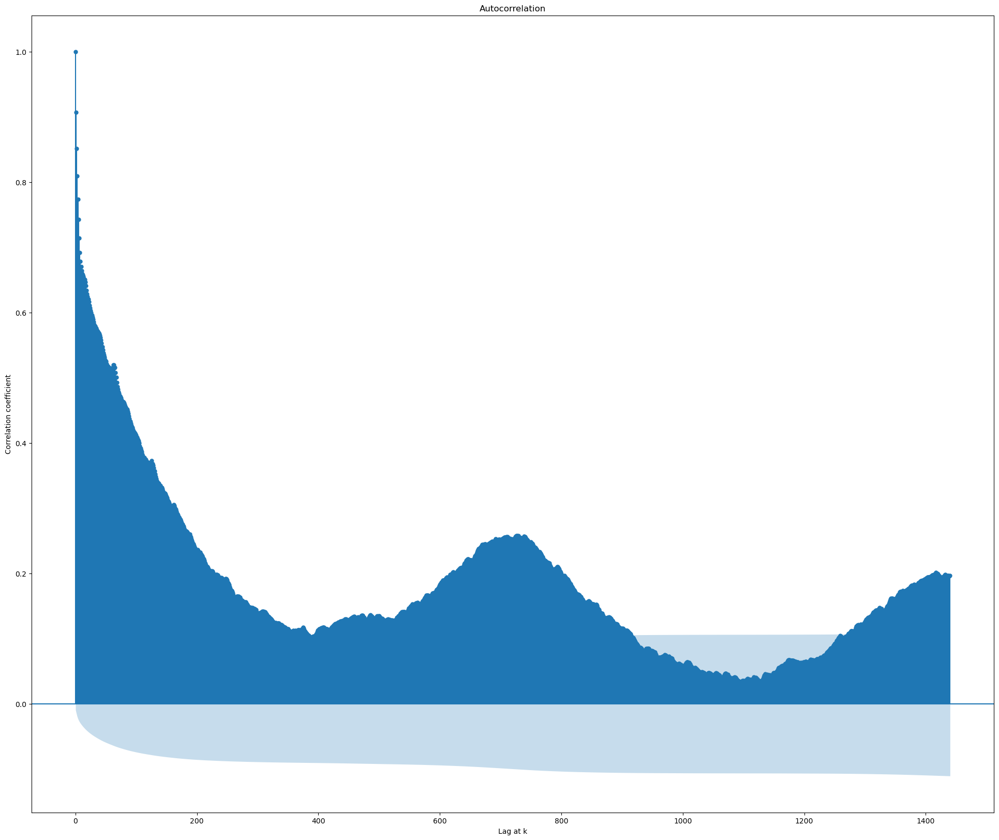

AC 16


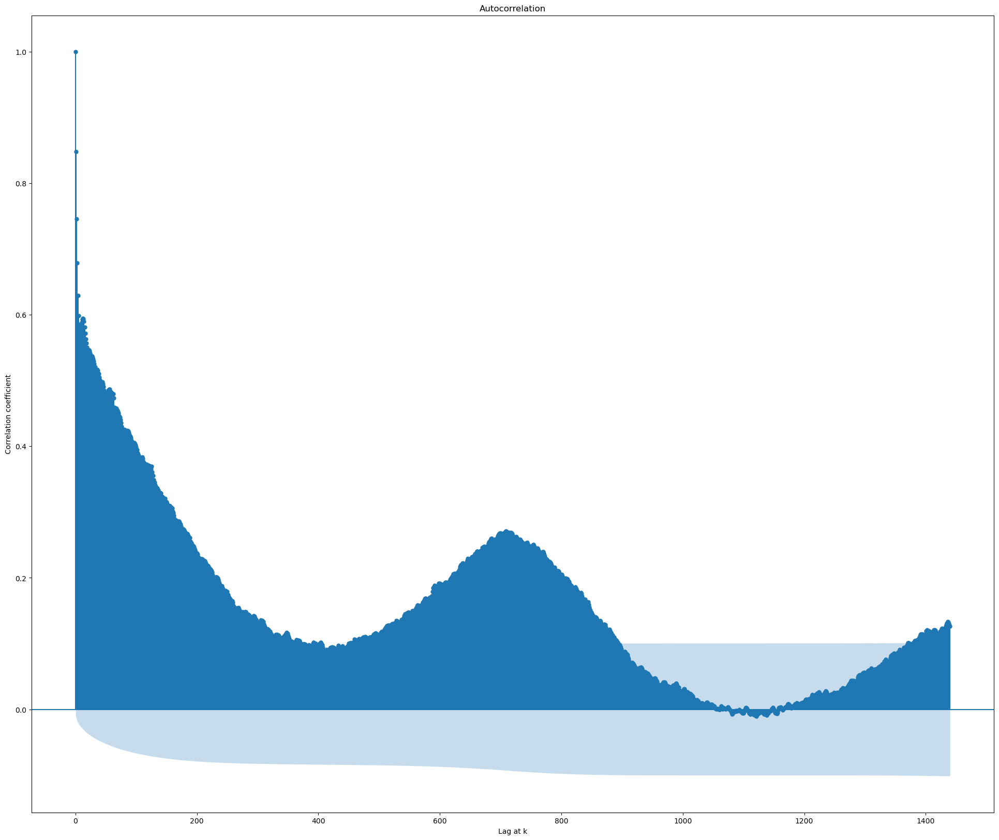

AC 17


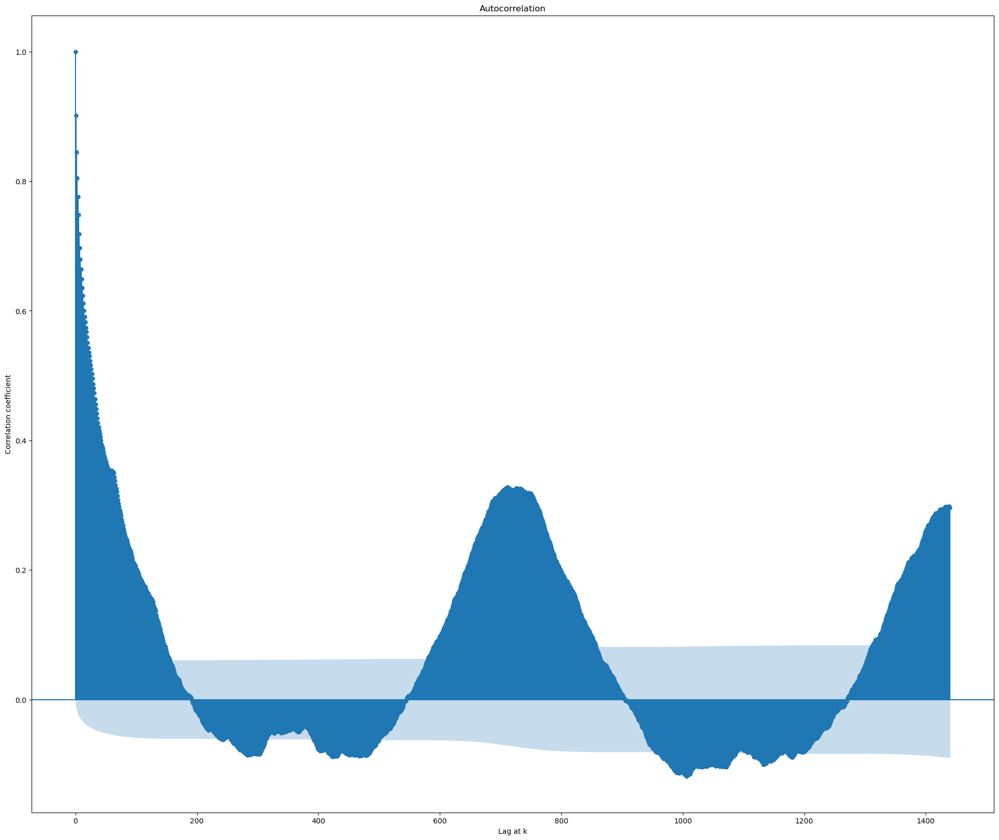

AC 18


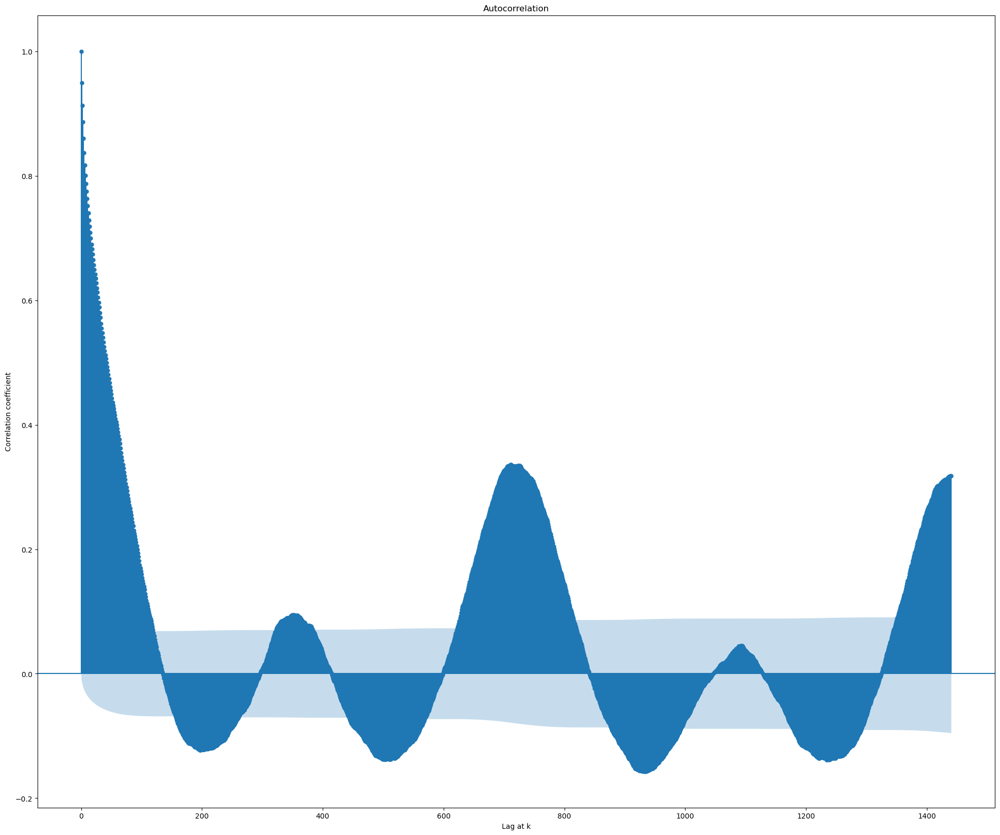

In [14]:
from statsmodels.graphics import tsaplots

for name in data_2.drop(["Month", "Day"], axis=1).columns.values.tolist():
    print(name)
    fig = tsaplots.plot_acf(data_2[name], lags=1440)
    plt.xlabel("Lag at k")
    plt.ylabel("Correlation coefficient")
    plt.show()

A few points to note:

1) We see that each ACs autocorrelation is high at small lags of upto 3 or 4. This shows a clear trend exists ffor each of them.

2) We can see that in 2 day lags (1440), we can see our seasonality at work, with all having a peak at 720 lags, which repeats further.

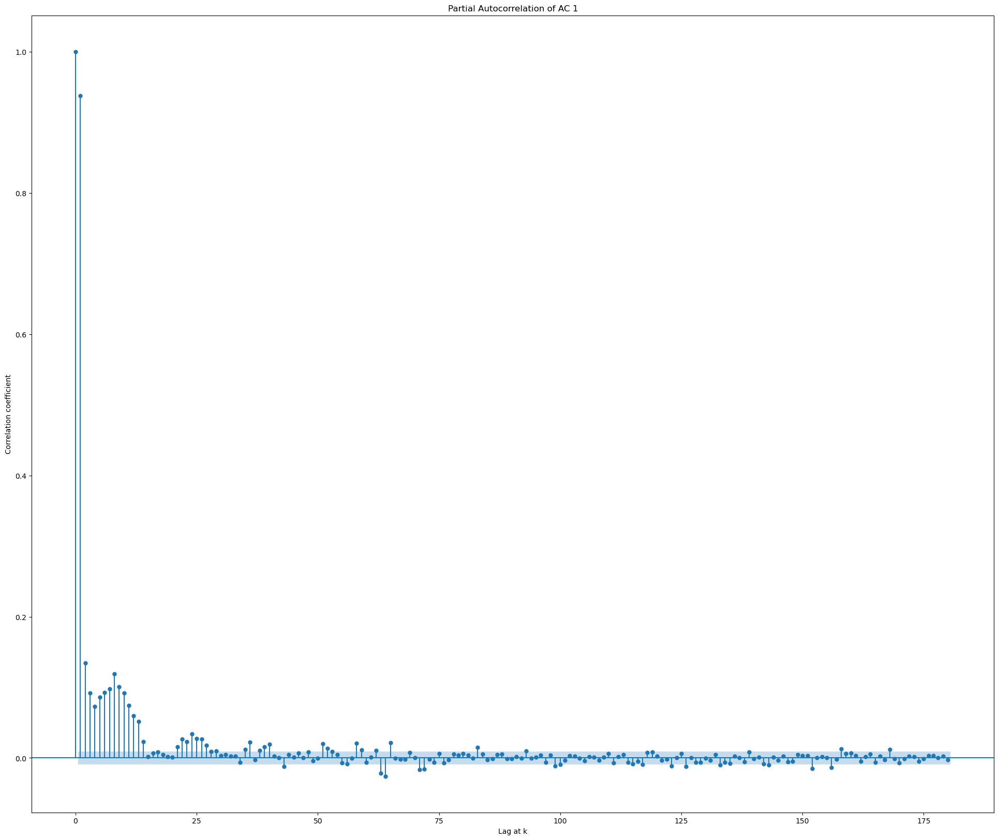

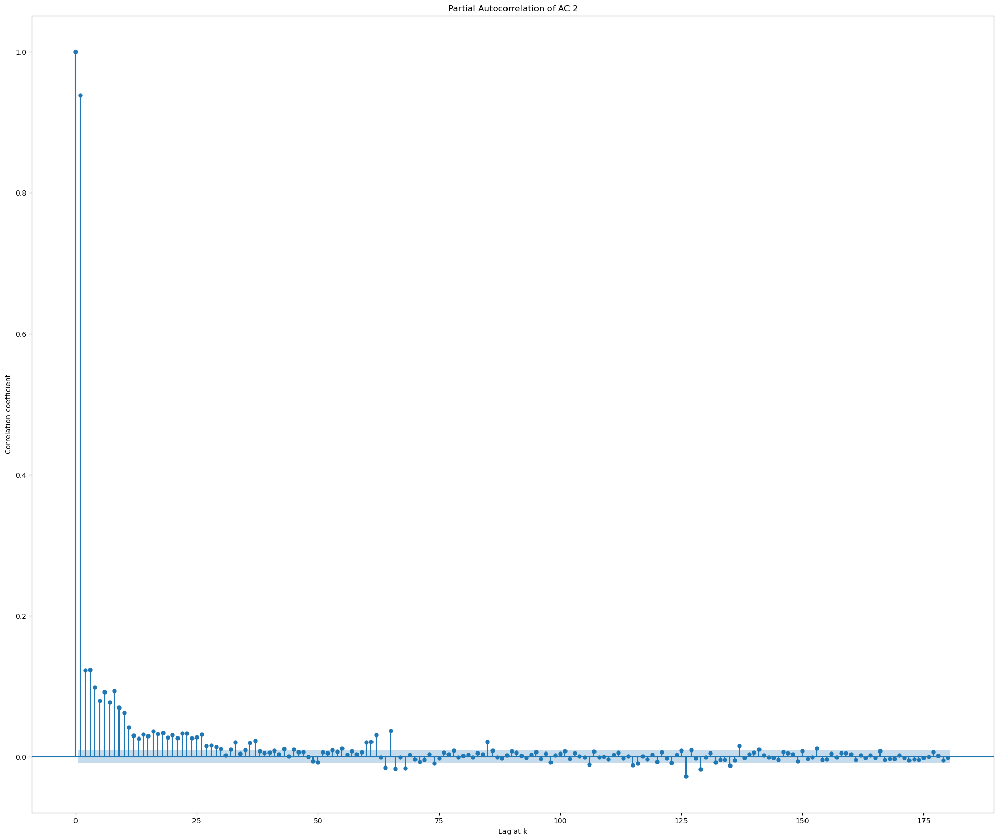

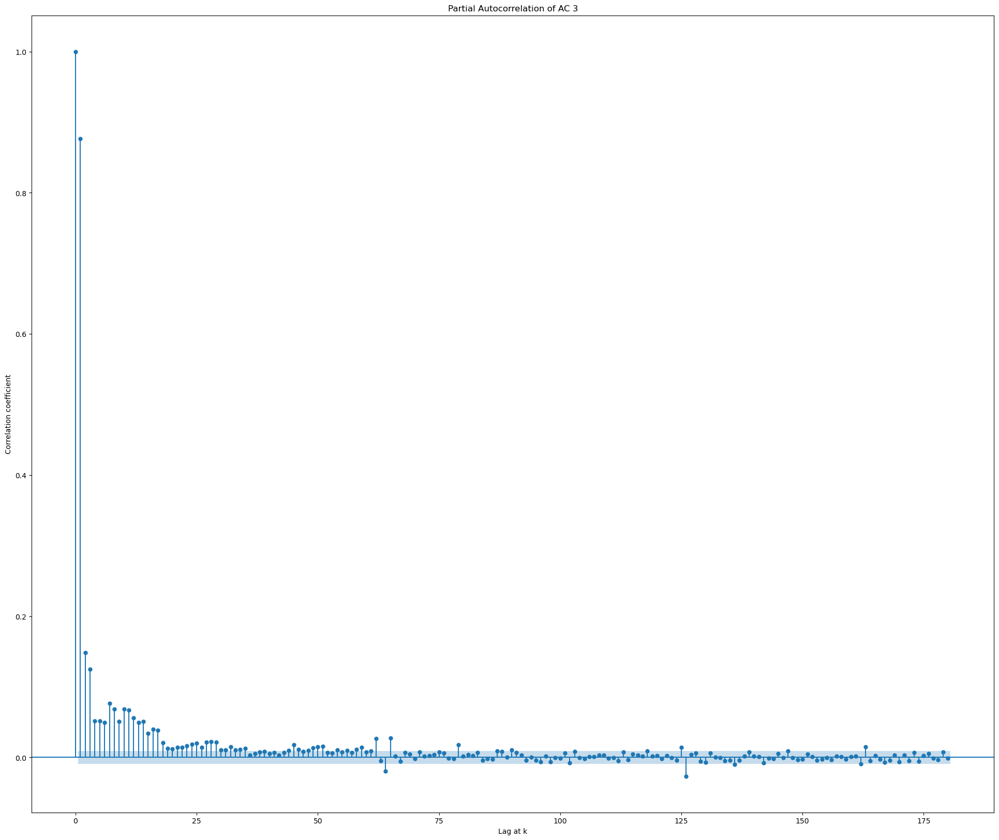

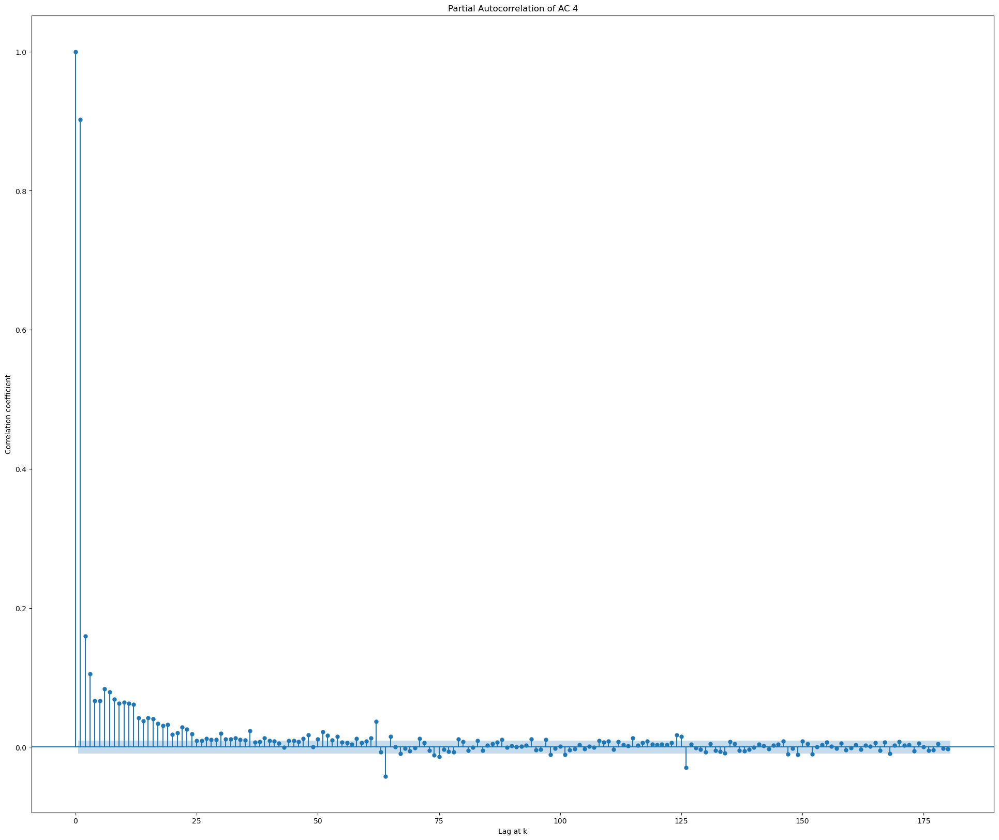

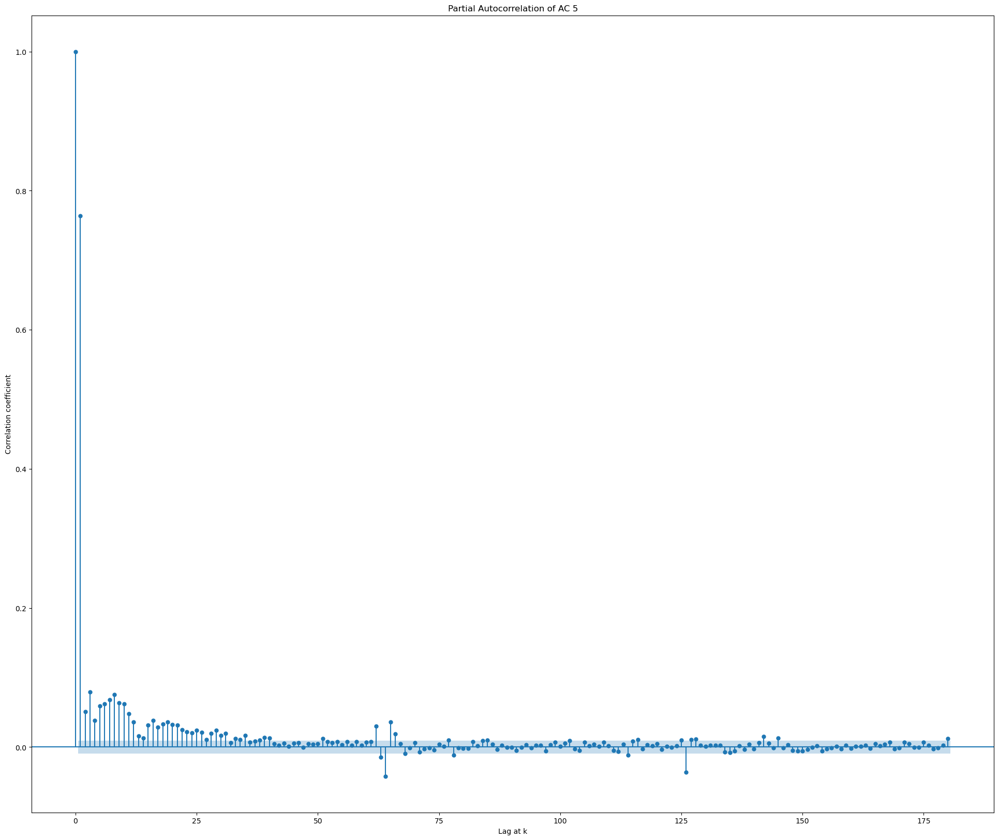

...

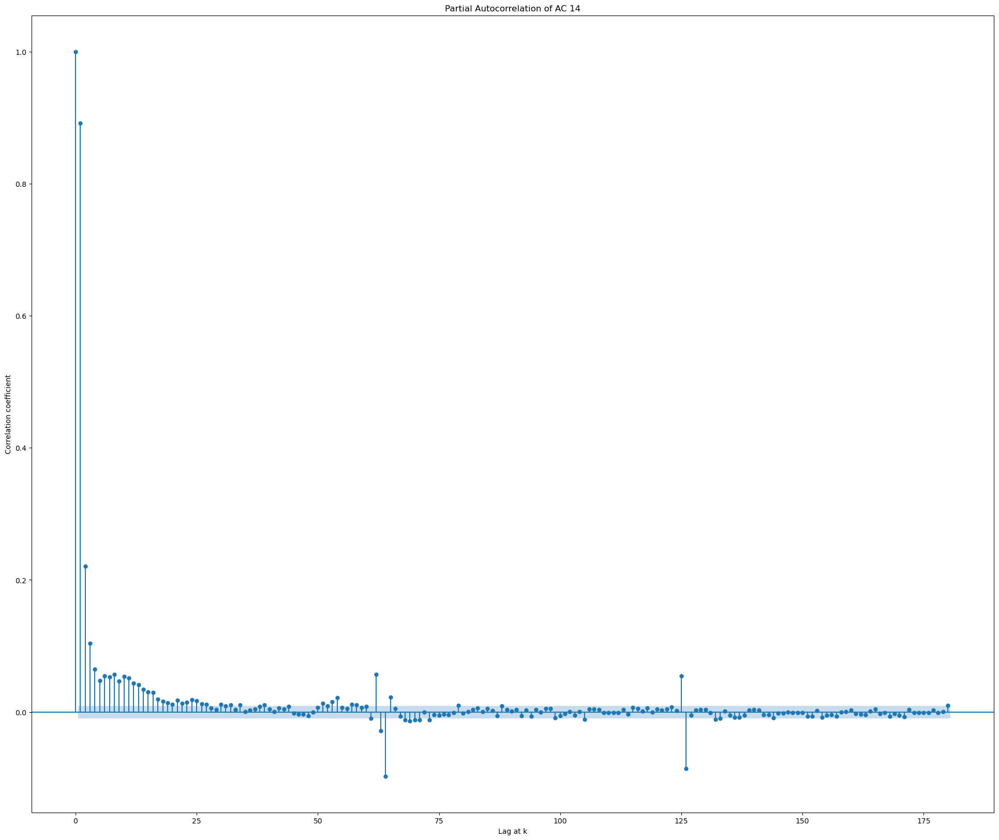

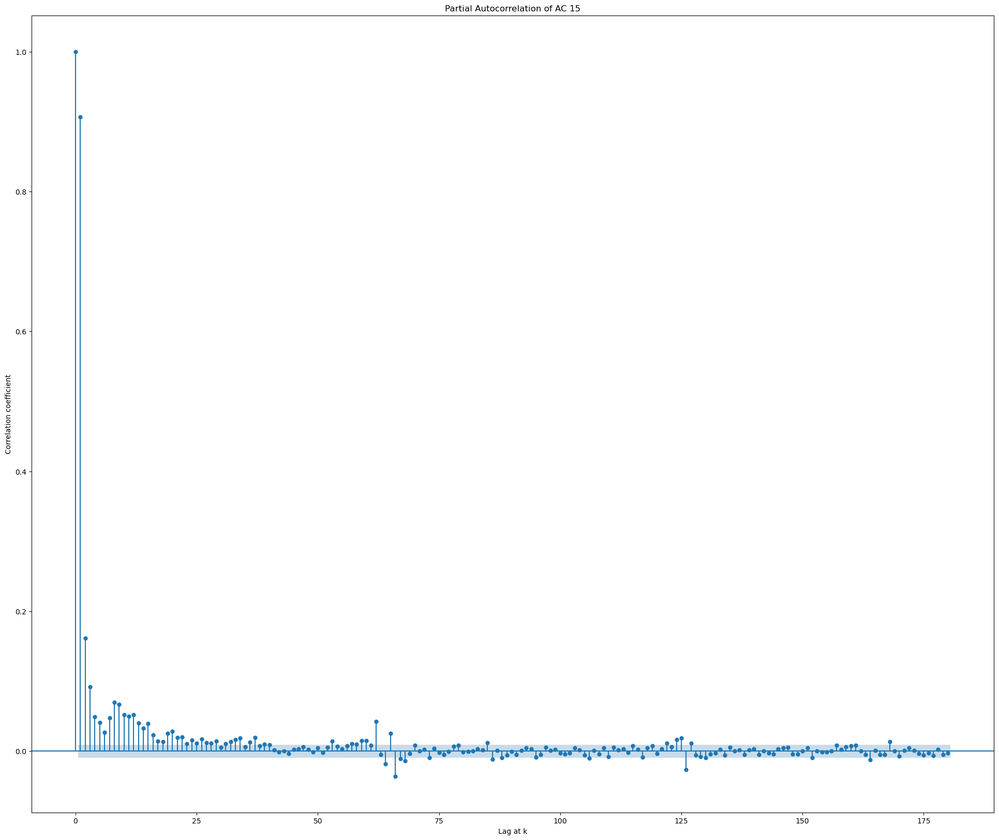

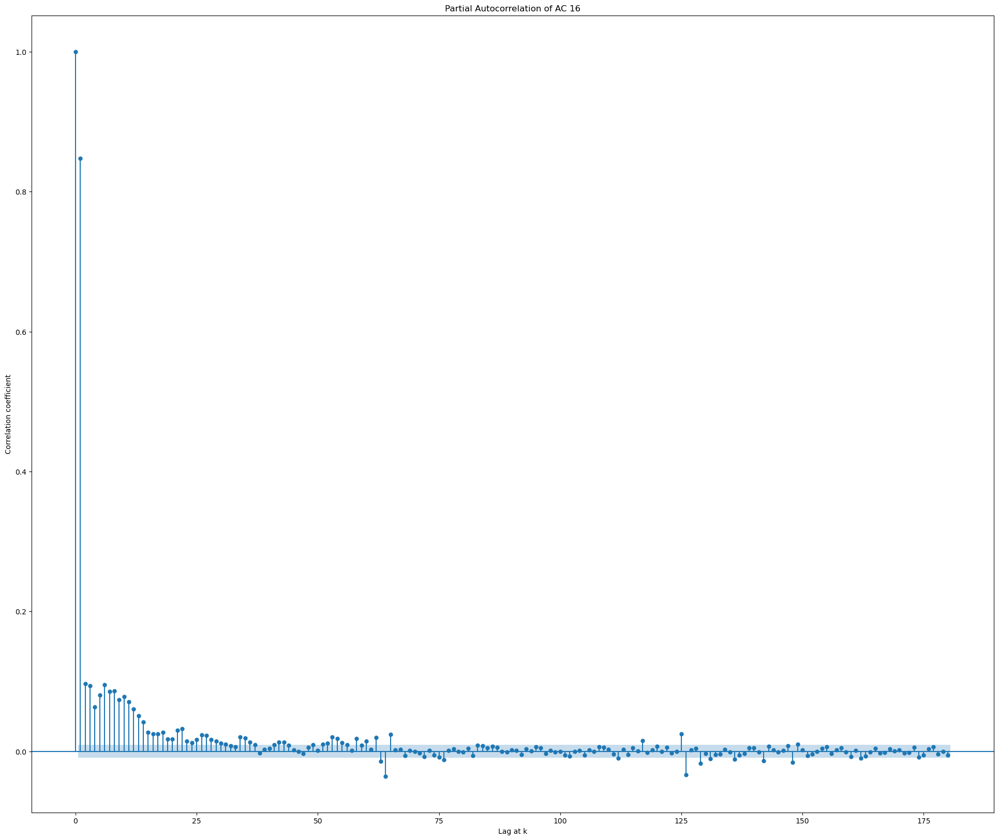

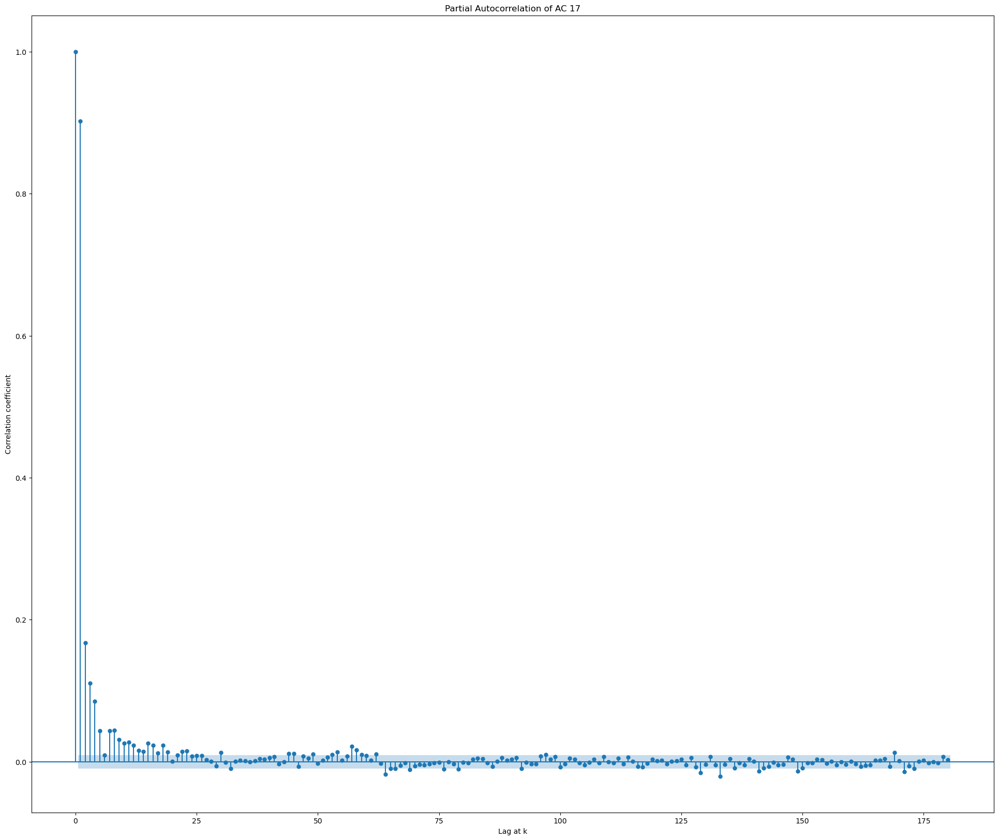

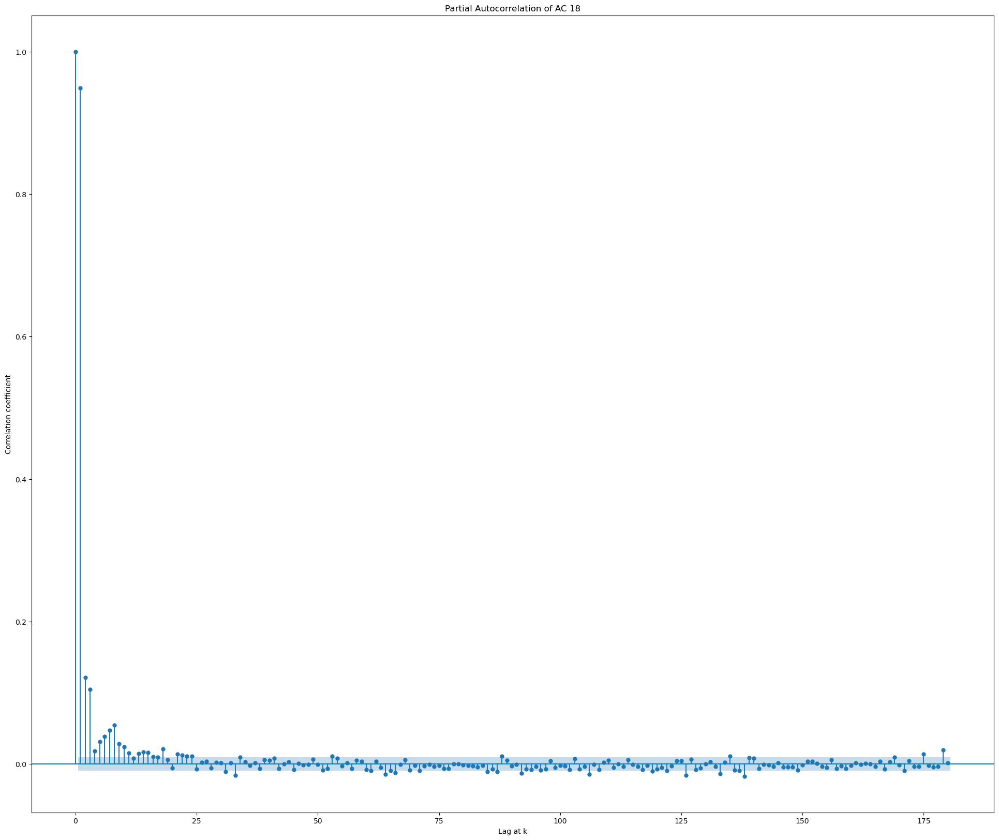

In [15]:
for name in data_2.drop(["Month", "Day"], axis=1).columns.values.tolist():
    fig = tsaplots.plot_pacf(data_2[name], lags= 180)
    plt.title("Partial Autocorrelation of {}".format(name))
    plt.xlabel("Lag at k")
    plt.ylabel("Correlation coefficient")
    plt.show()

We will come back to 

For now, let's check out the stationarity of our time sries by using KPSS test and ADF test.

In [16]:
import statsmodels.tsa.stattools as stools
import warnings
warnings.filterwarnings("ignore")

def kpss_test(timeseries):
    kpsstest = stools.kpss(timeseries, regression="c",nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value

    if kpss_output["p-value"] >= 0.05:
        return "Yes"
    else:
        return "No"

def adf_test(timeseries):
    dftest = stools.adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    
    if dfoutput["p-value"] >= 0.05:
        return "No"
    else:
        return "Yes"
    
station_test = pd.DataFrame()

for name in data_2.drop(["Month", "Day"], axis=1).columns.values.tolist():
    station_test.loc[name, "ADF"] = adf_test(data_2[name])
    station_test.loc[name, "KPSS"] = kpss_test(data_2[name])

print(station_test)

       ADF KPSS
AC 1   Yes   No
AC 2   Yes   No
AC 3   Yes   No
AC 4   Yes   No
AC 5   Yes   No
AC 6   Yes   No
AC 7   Yes   No
AC 8   Yes   No
AC 9   Yes   No
AC 10  Yes   No
AC 11  Yes   No
AC 12  Yes   No
AC 13  Yes  Yes
AC 14  Yes   No
AC 15  Yes   No
AC 16  Yes   No
AC 17  Yes   No
AC 18  Yes   No


KPSS is a test for trend-stationarity, whether a series trend stationary or not. ADF on the other hand is a test for the existence of a unit root. The above table tells us whether series is stationary or not according to these tests. As we can see, KPSS test tells us that no series is trend stationary except AC 12. Whereas, ADF test tells us that there is no unit root in the time series, which implies that the series is stationary by the effects of unit root.

So how do we bring  stationarity in our data? As you have already seen above, the trends are not much informative or clear in that they increase and decrease with no discernible pattern. (We want to use SARIMA later.)

Let us try differencing of first order.

In [17]:
data_diff = data_2.drop(["Month", "Day"], axis=1).diff()
data_diff.drop("2019-08-01 00:00:00", inplace = True)

seasonality_diff = {}
trend_diff = {}
residual_diff = {}

for name in data_diff.columns.values.tolist():
    station_test.loc[name, "ADF_diff"] = adf_test(data_diff[name])
    station_test.loc[name, "KPSS_diff"] = kpss_test(data_diff[name])

print(station_test)

       ADF KPSS ADF_diff KPSS_diff
AC 1   Yes   No      Yes       Yes
AC 2   Yes   No      Yes       Yes
AC 3   Yes   No      Yes       Yes
AC 4   Yes   No      Yes       Yes
AC 5   Yes   No      Yes       Yes
AC 6   Yes   No      Yes       Yes
AC 7   Yes   No      Yes       Yes
AC 8   Yes   No      Yes       Yes
AC 9   Yes   No      Yes       Yes
AC 10  Yes   No      Yes       Yes
AC 11  Yes   No      Yes       Yes
AC 12  Yes   No      Yes       Yes
AC 13  Yes  Yes      Yes       Yes
AC 14  Yes   No      Yes       Yes
AC 15  Yes   No      Yes       Yes
AC 16  Yes   No      Yes       Yes
AC 17  Yes   No      Yes       Yes
AC 18  Yes   No      Yes       Yes


Ah stationarity! Now let us plot the auto-correlation and partial auto-correlation plots for our differenced data.

AC 1


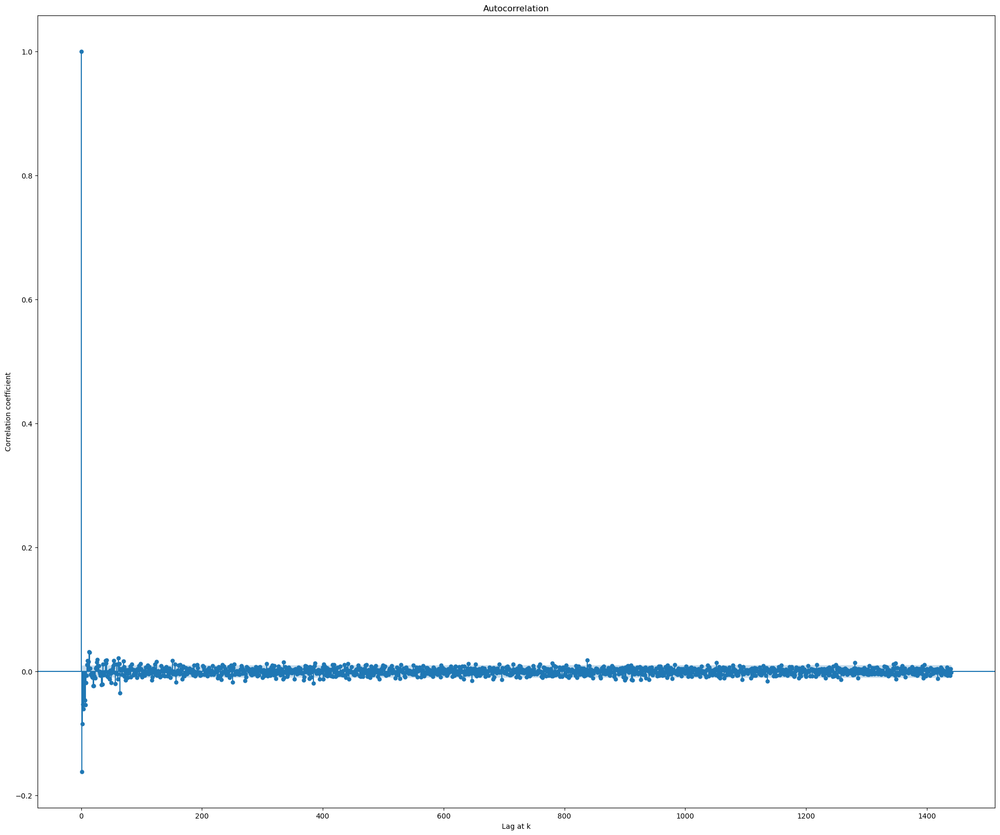

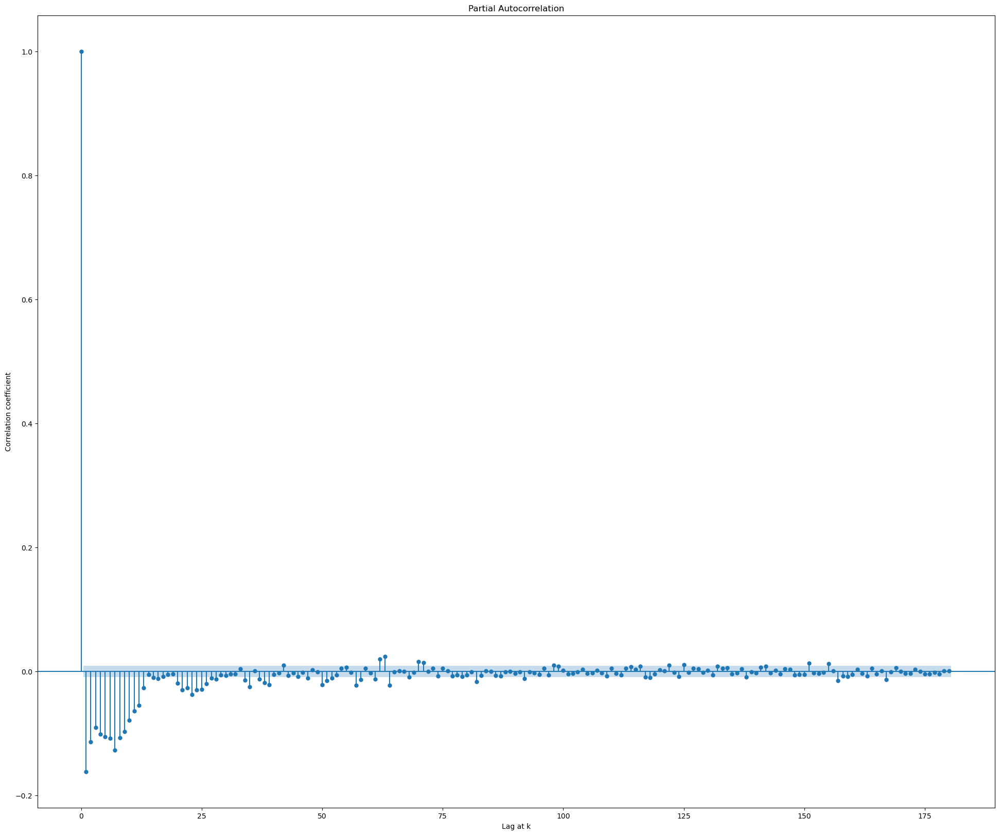

AC 2


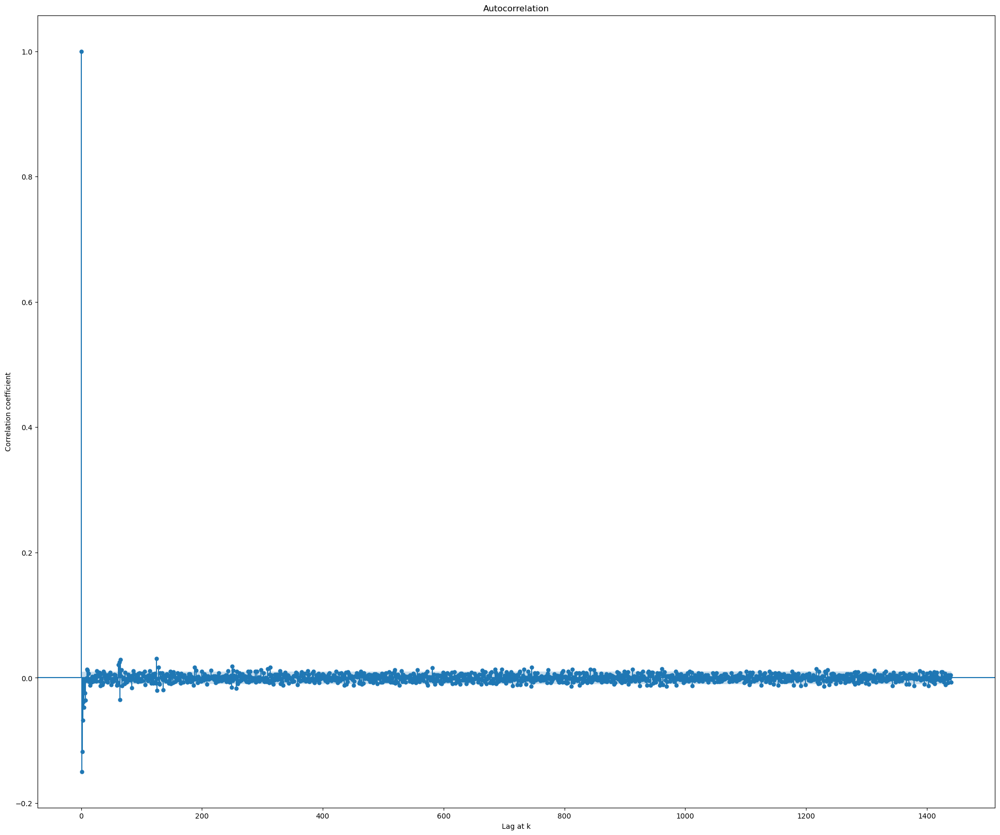

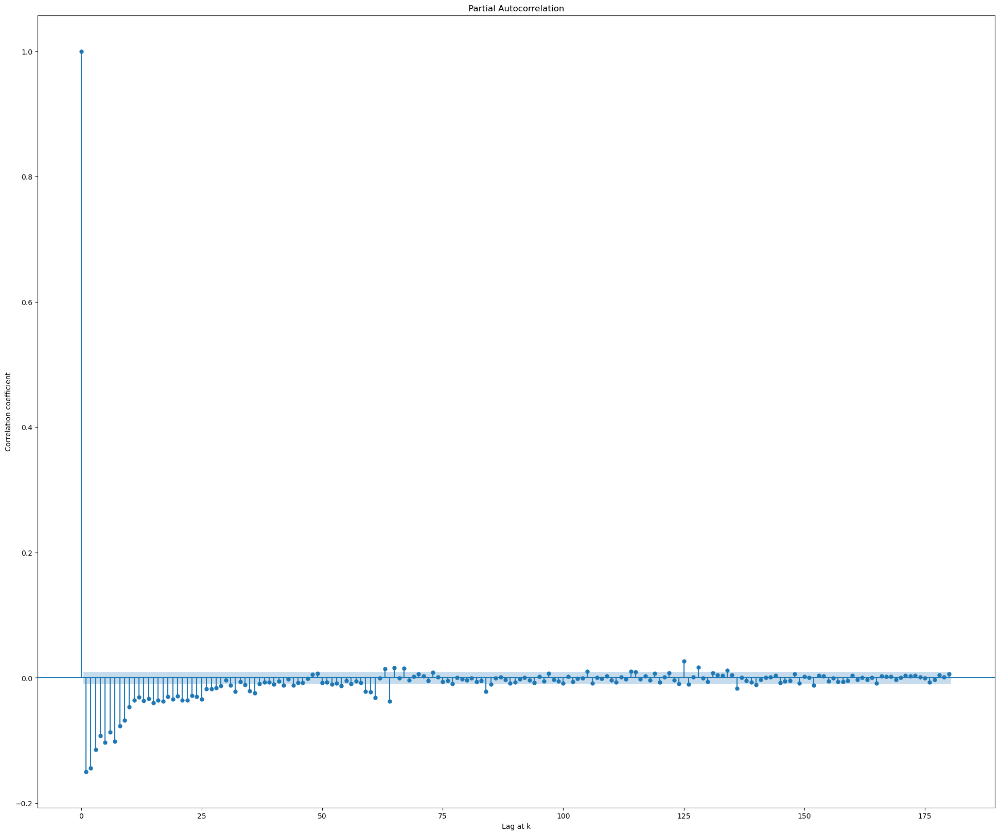

AC 3


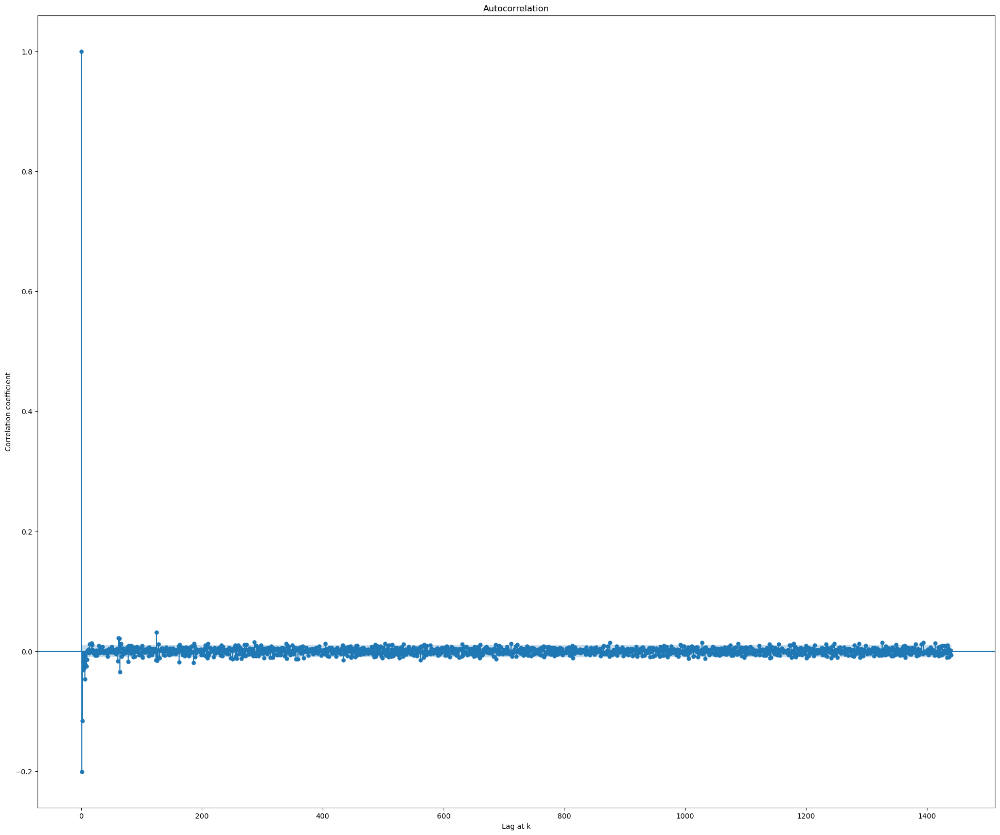

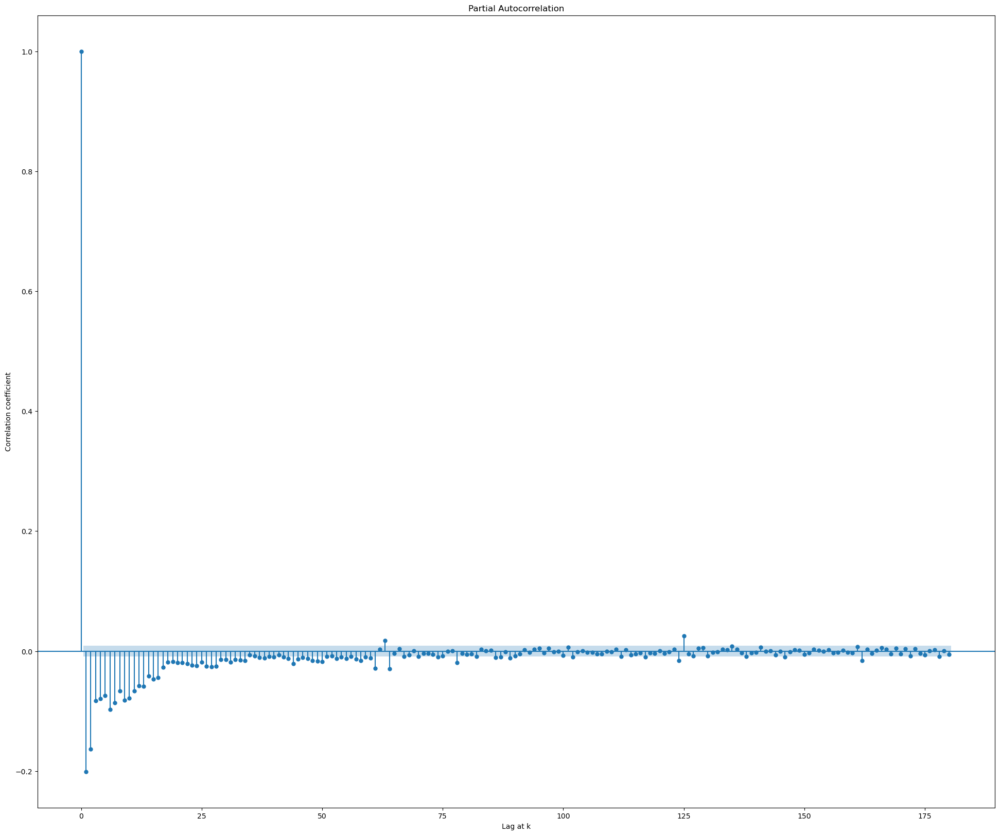

AC 4


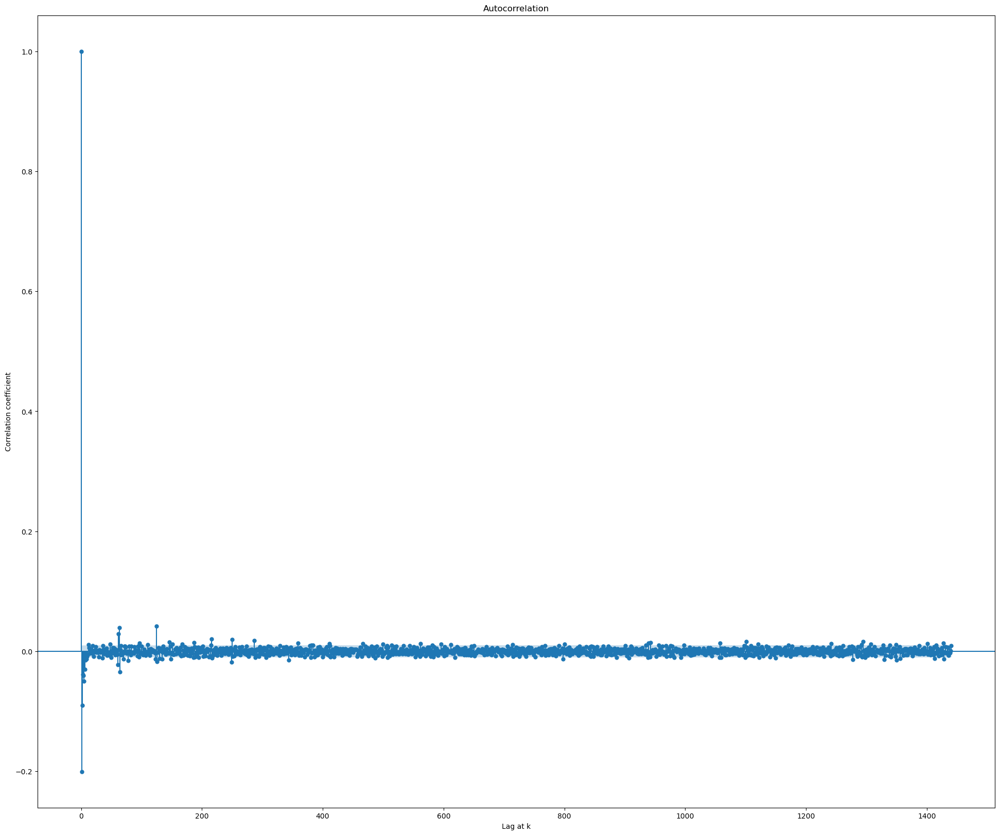

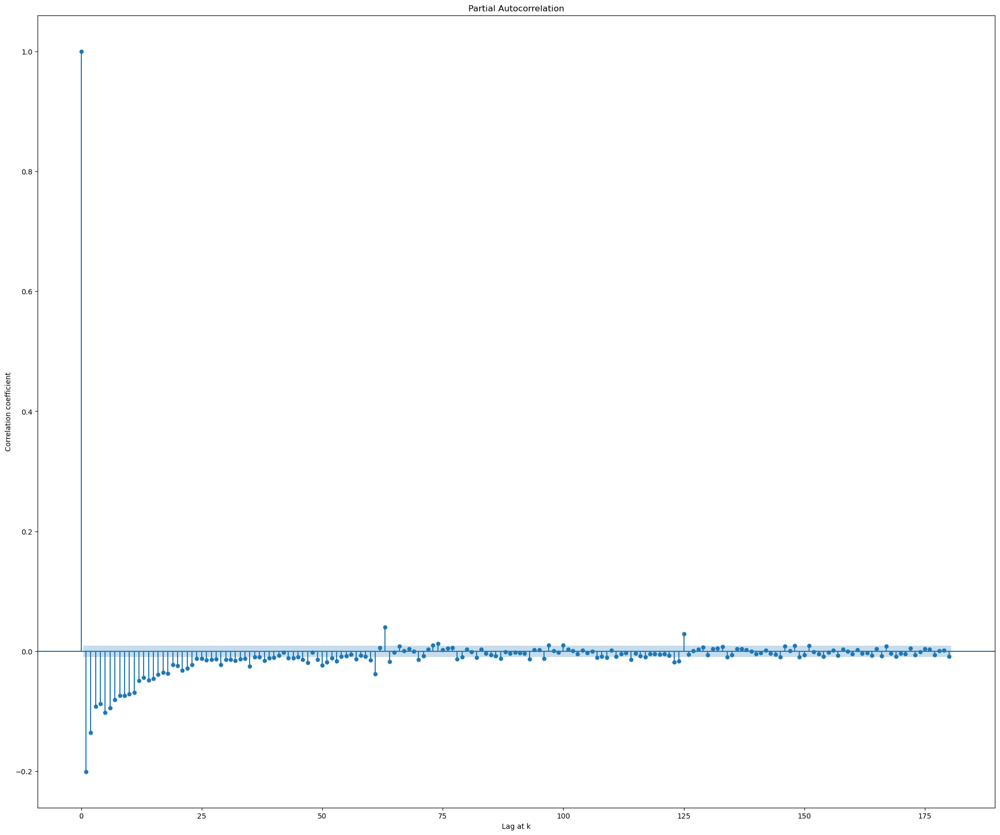

AC 5


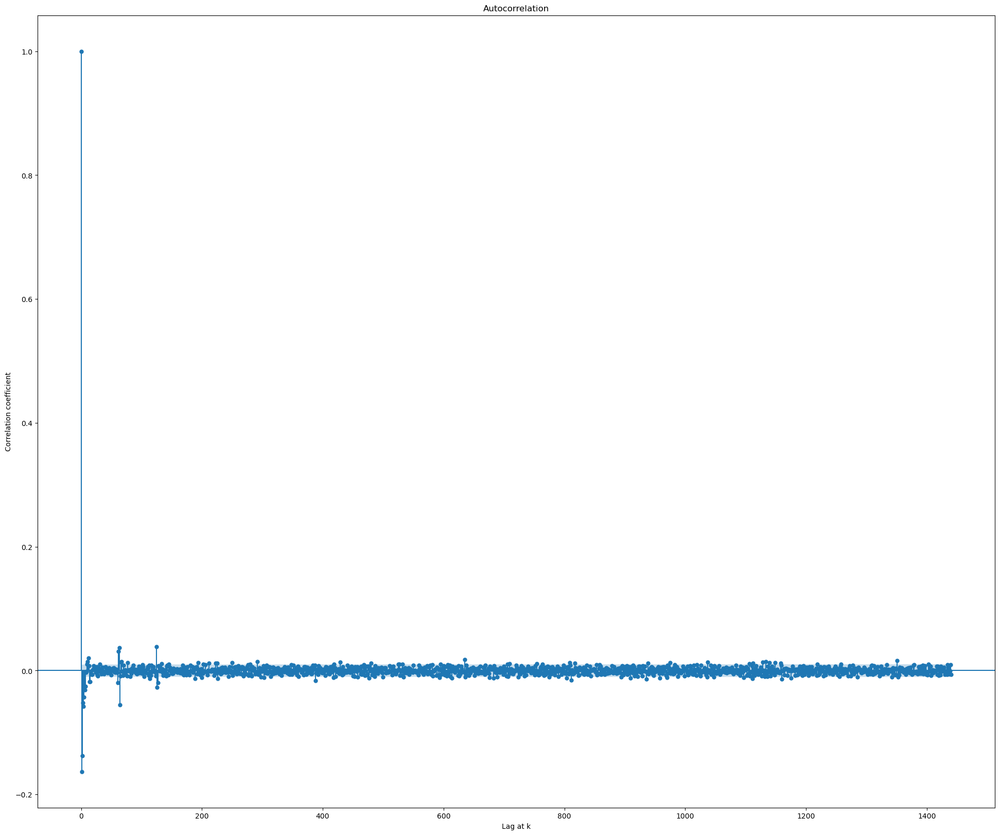

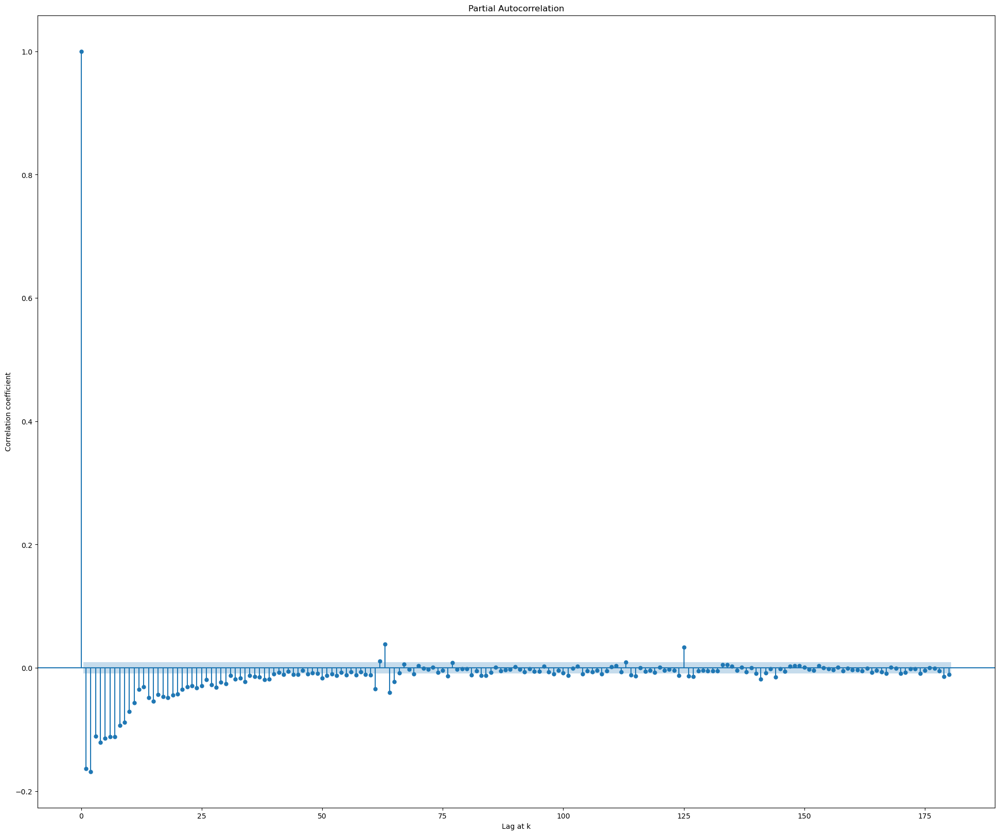

AC 6


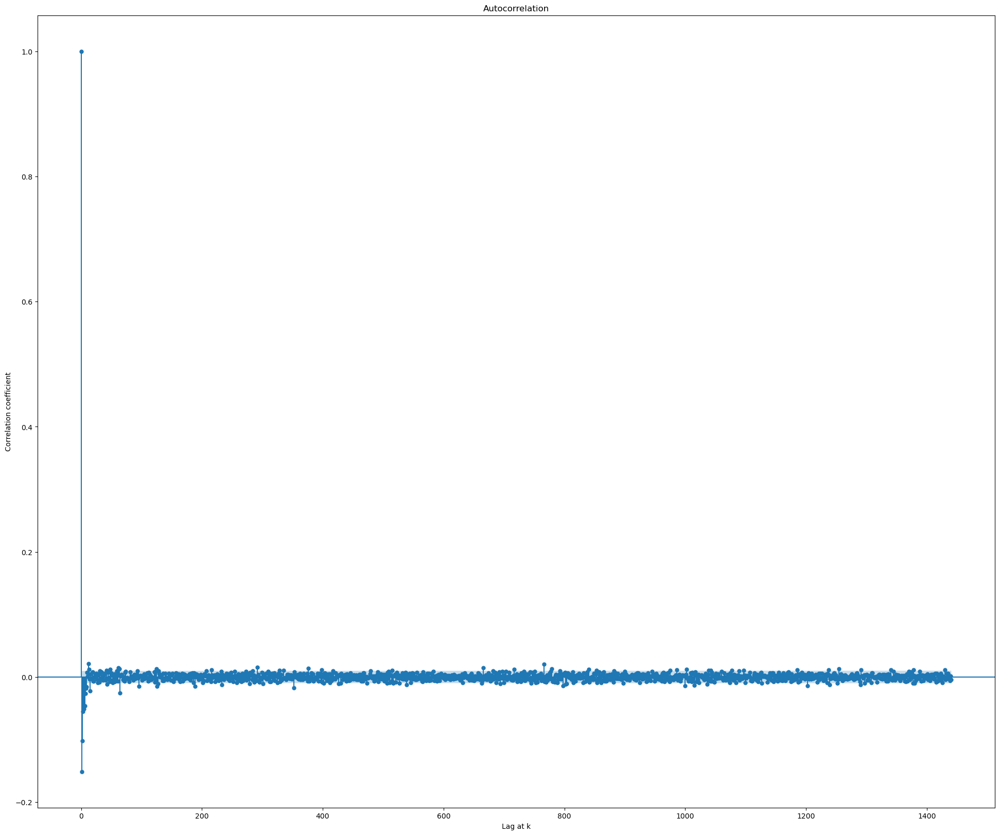

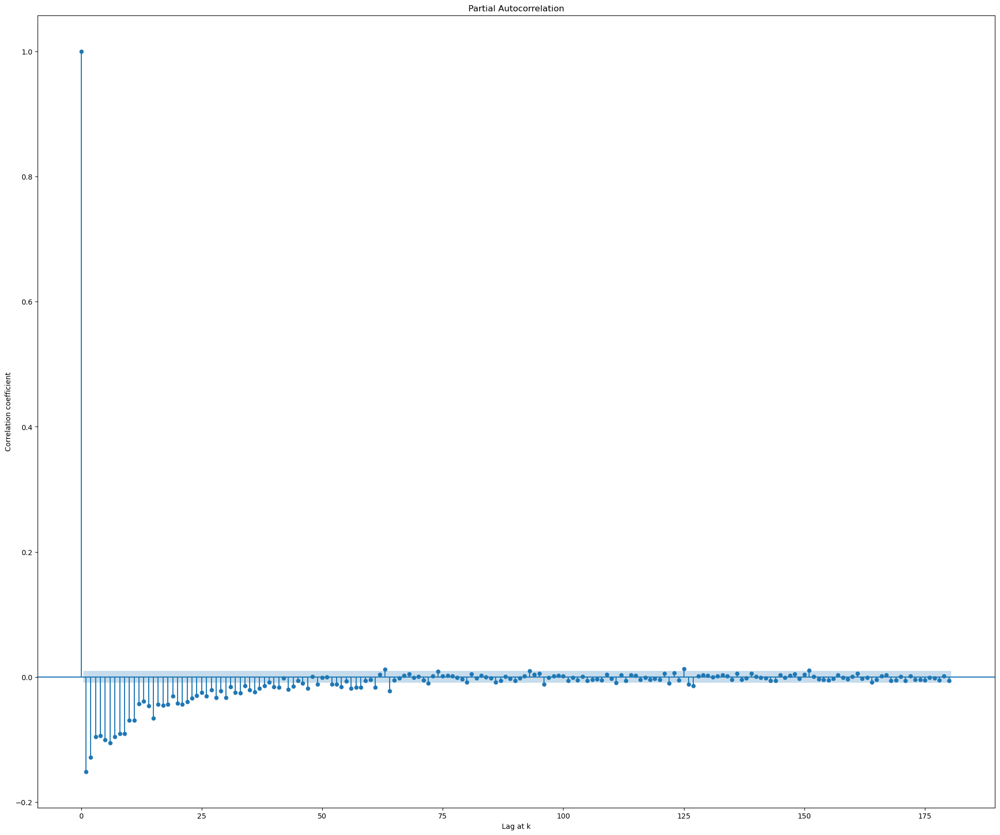

AC 7


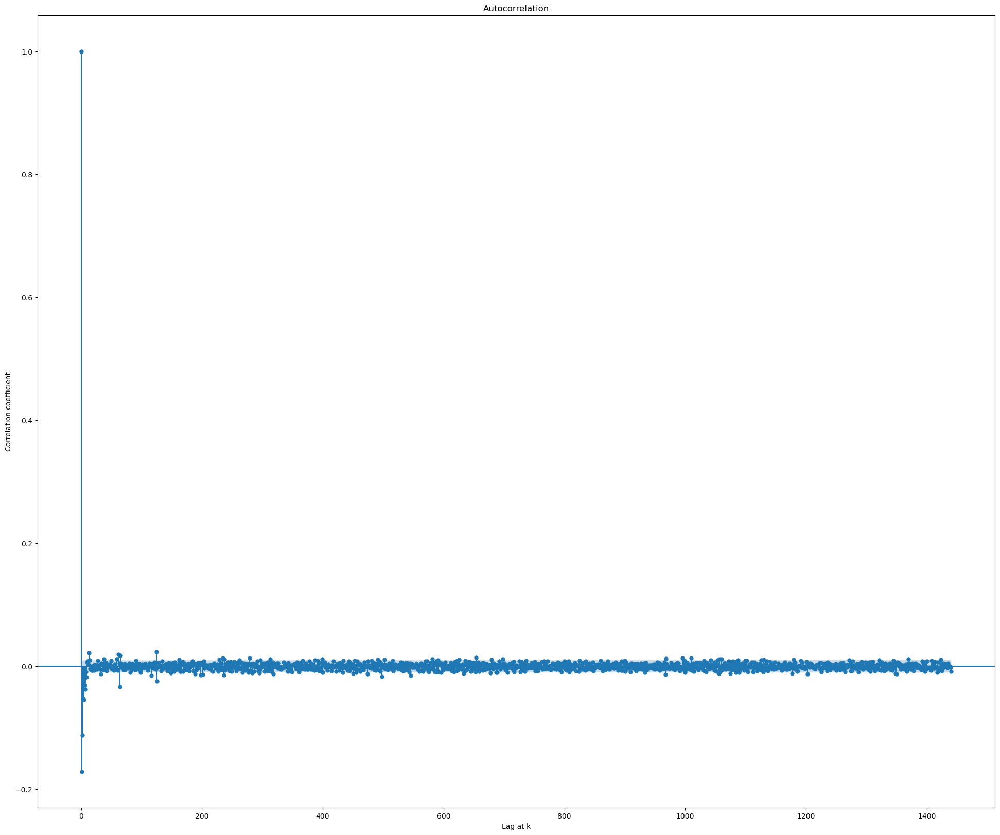

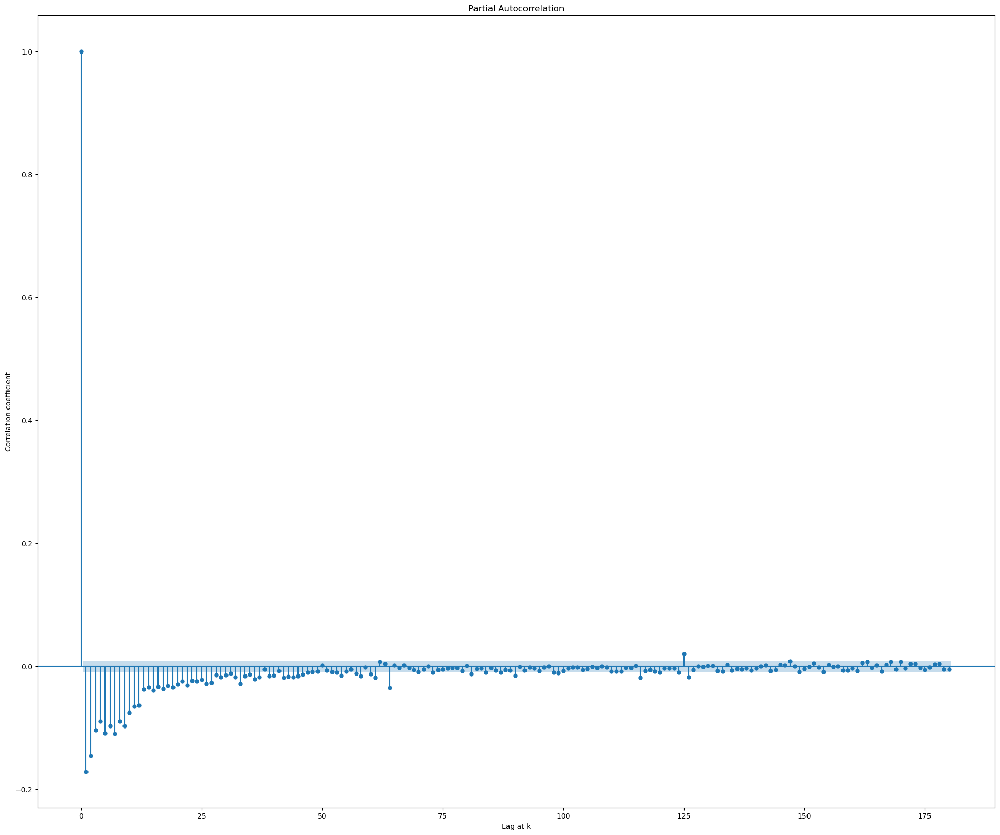

AC 8


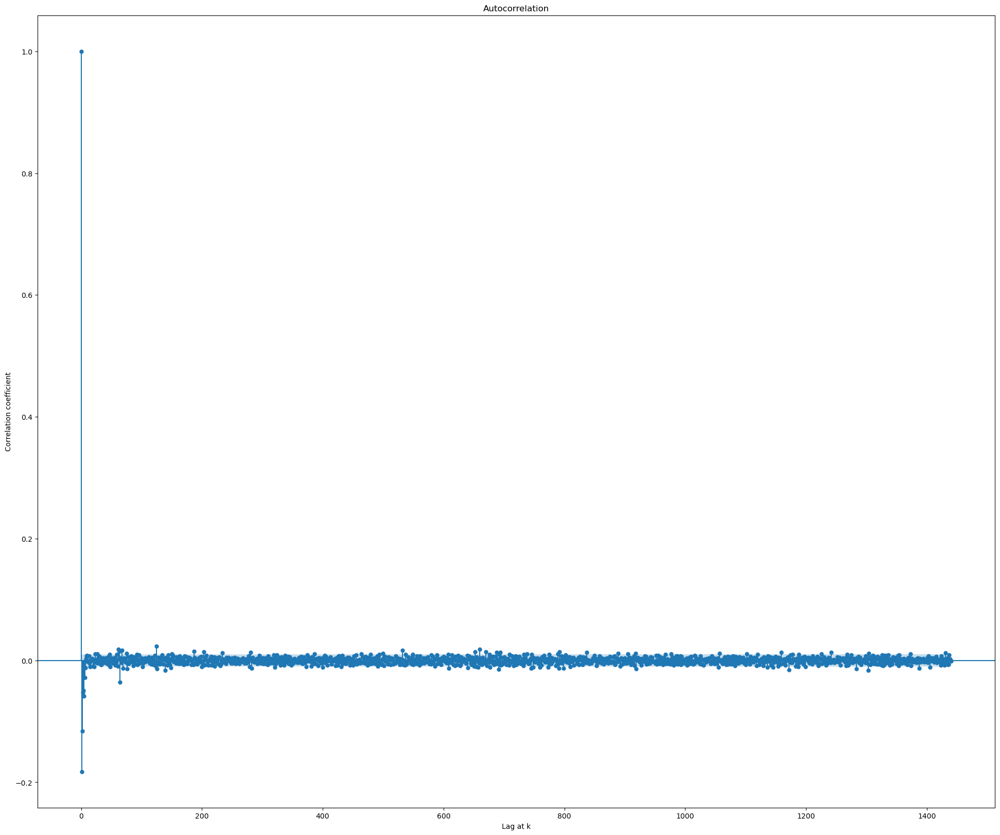

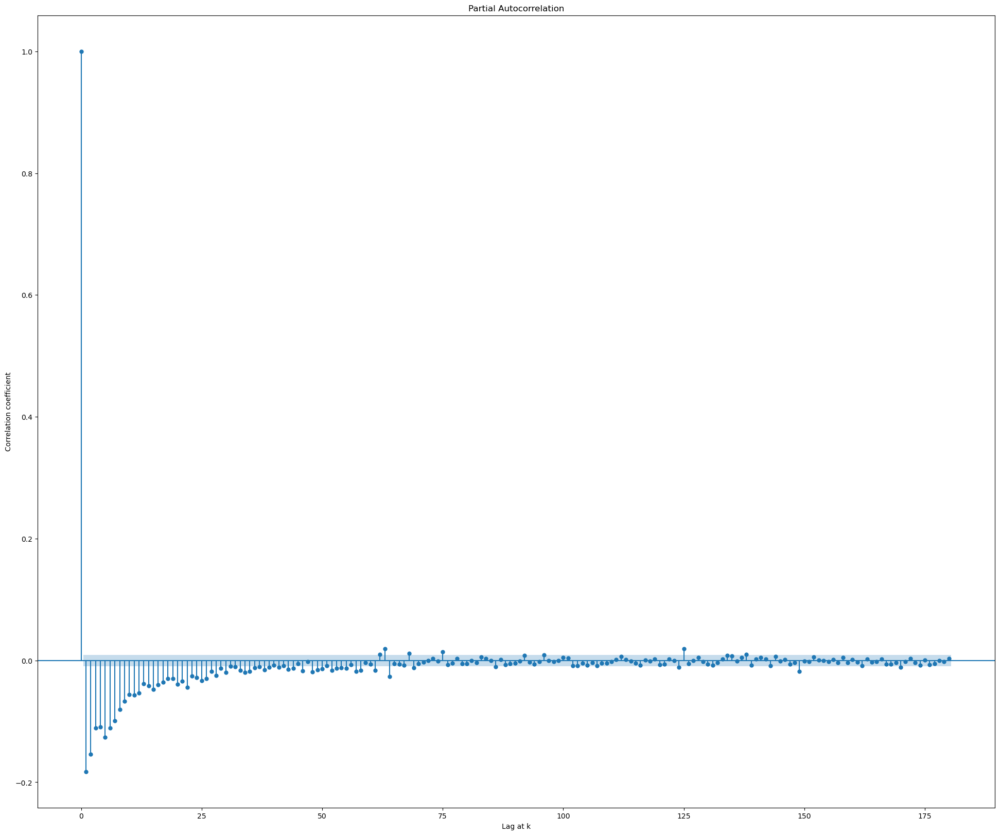

AC 9


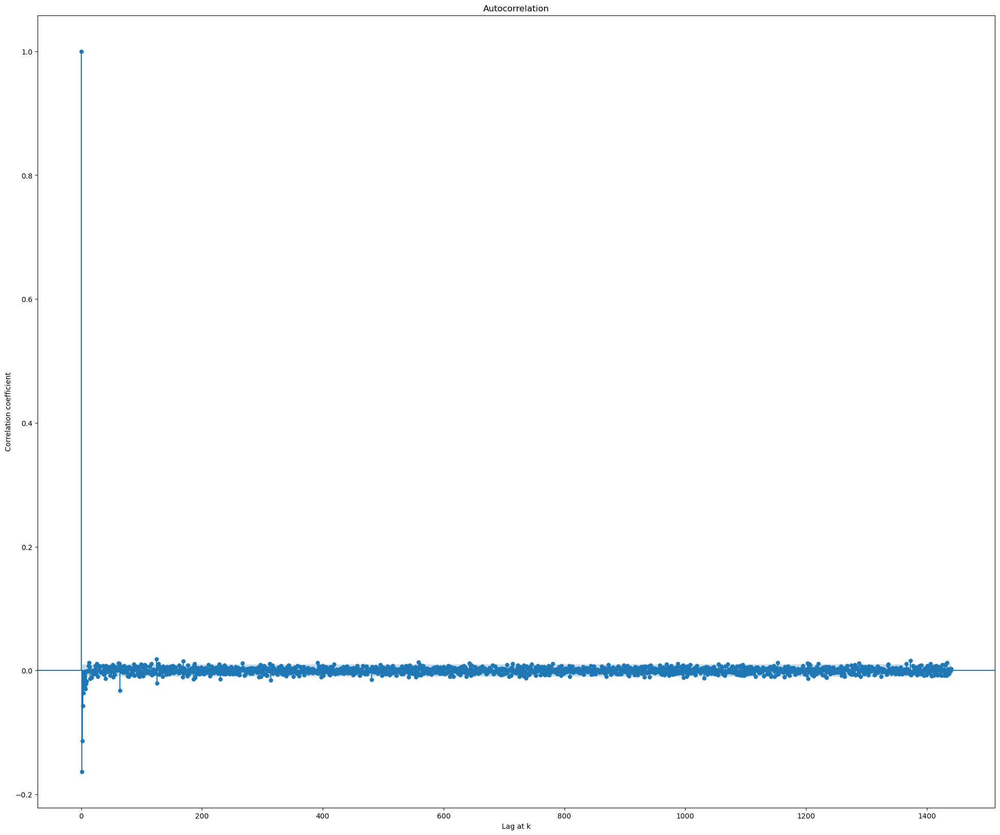

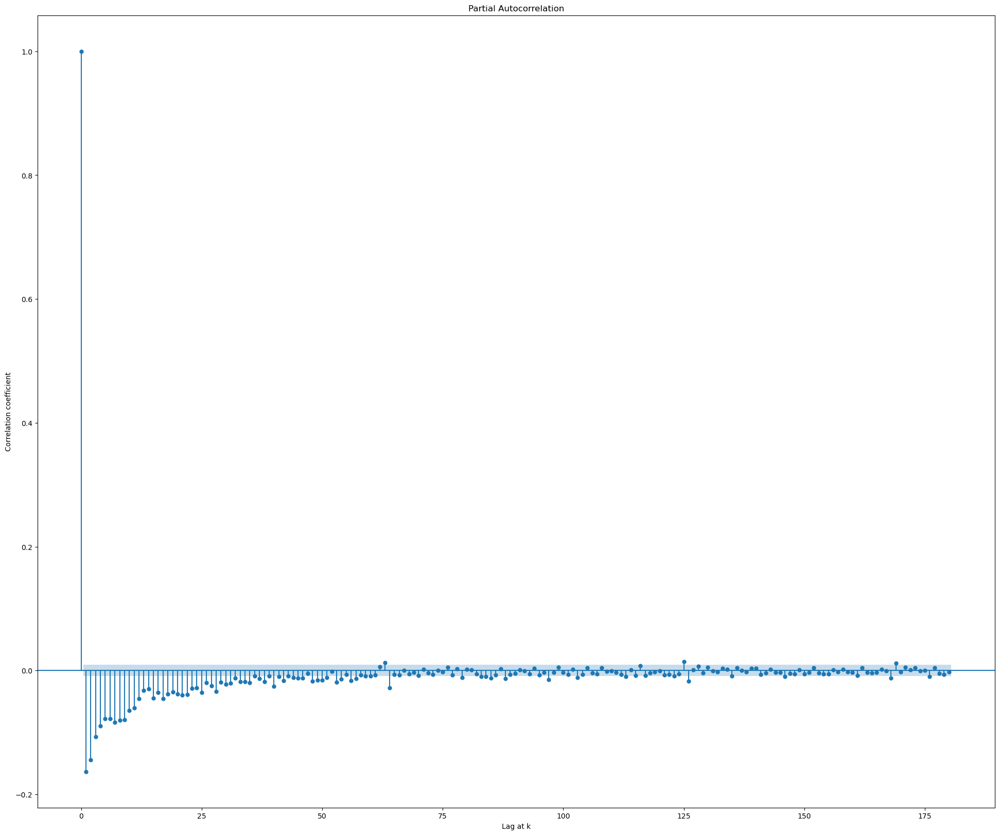

AC 10


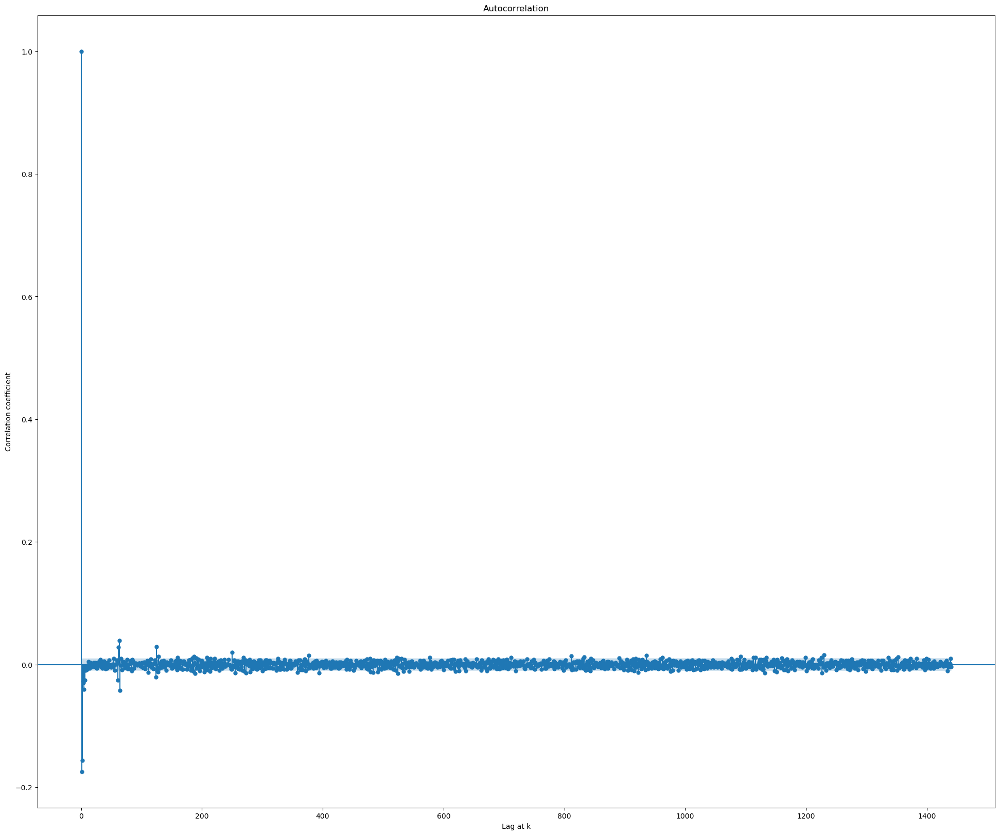

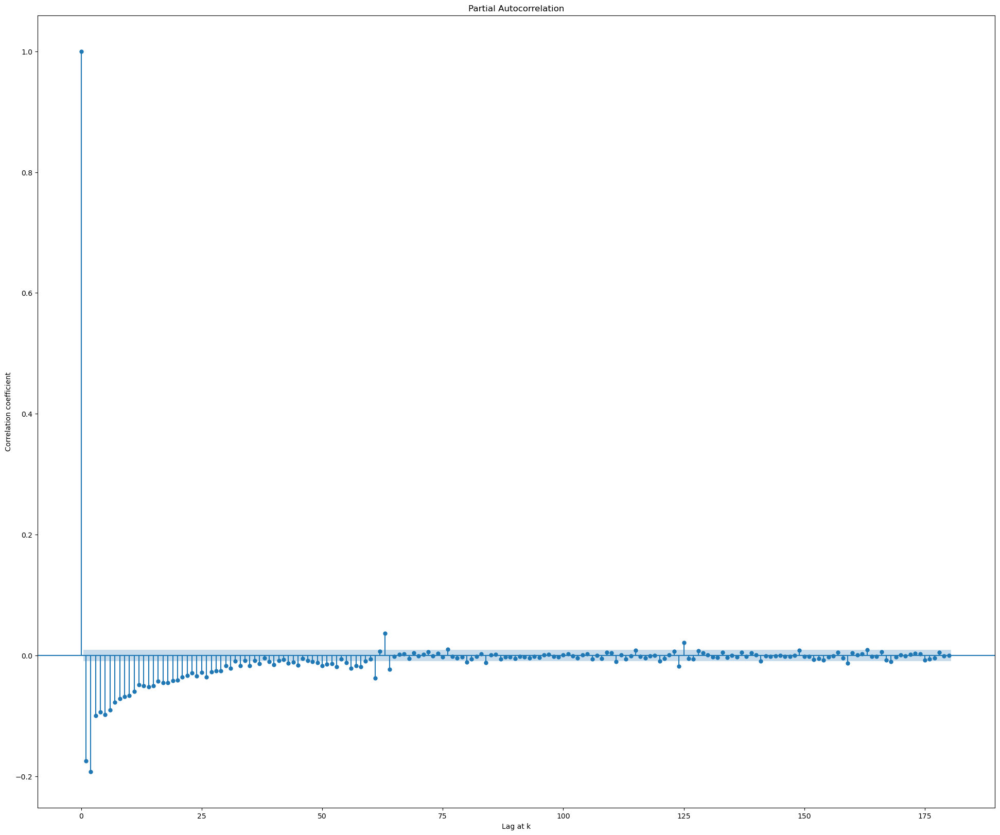

AC 11


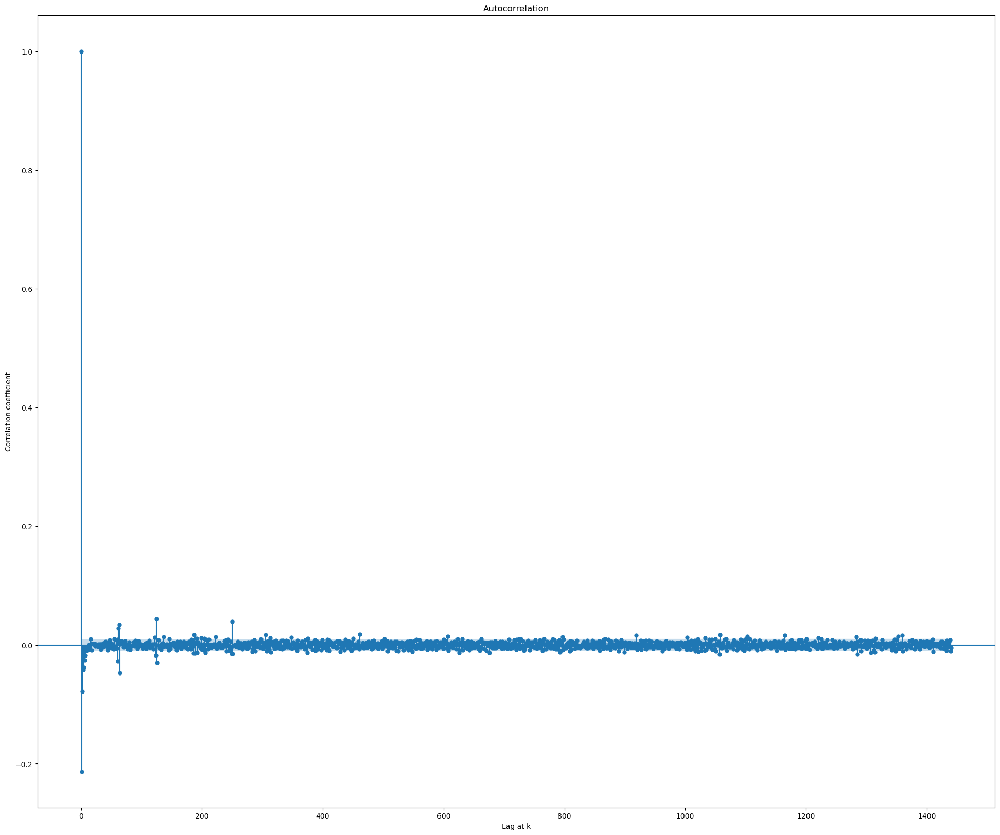

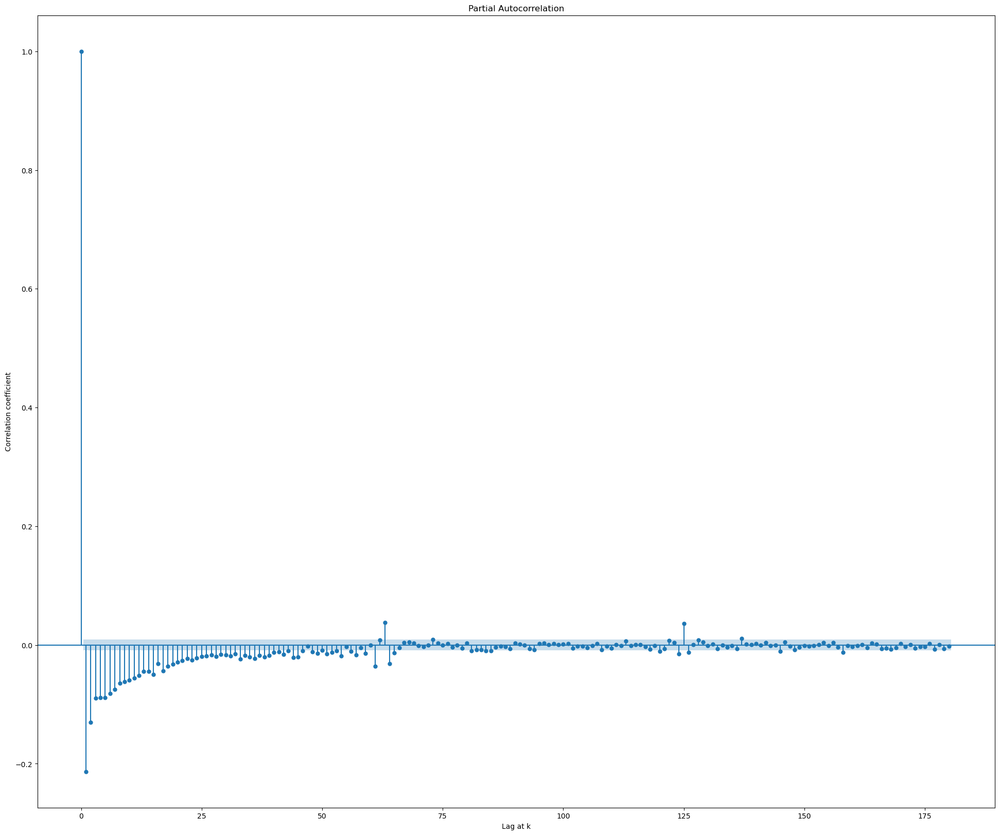

AC 12


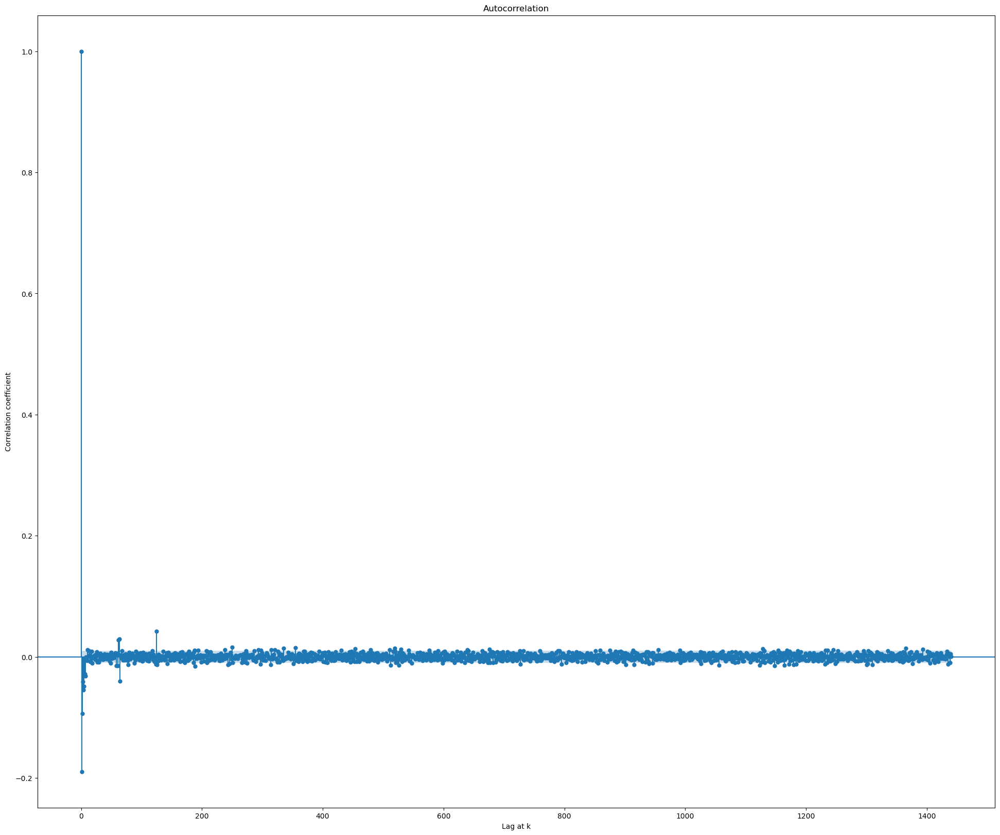

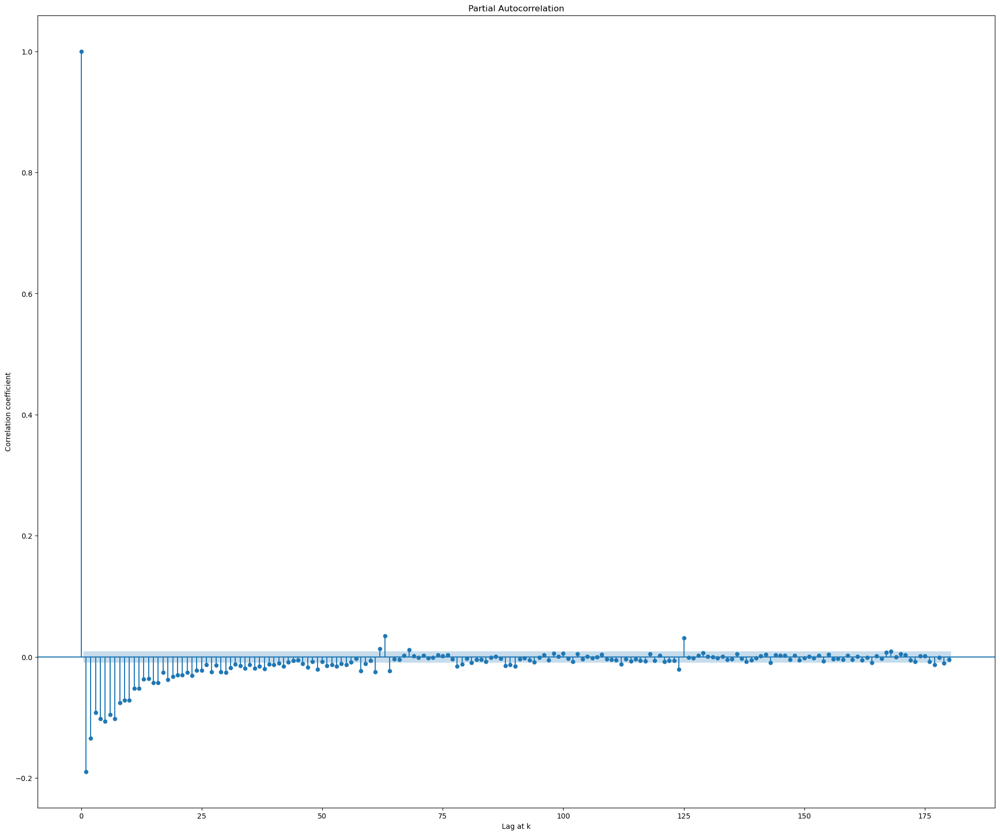

AC 13


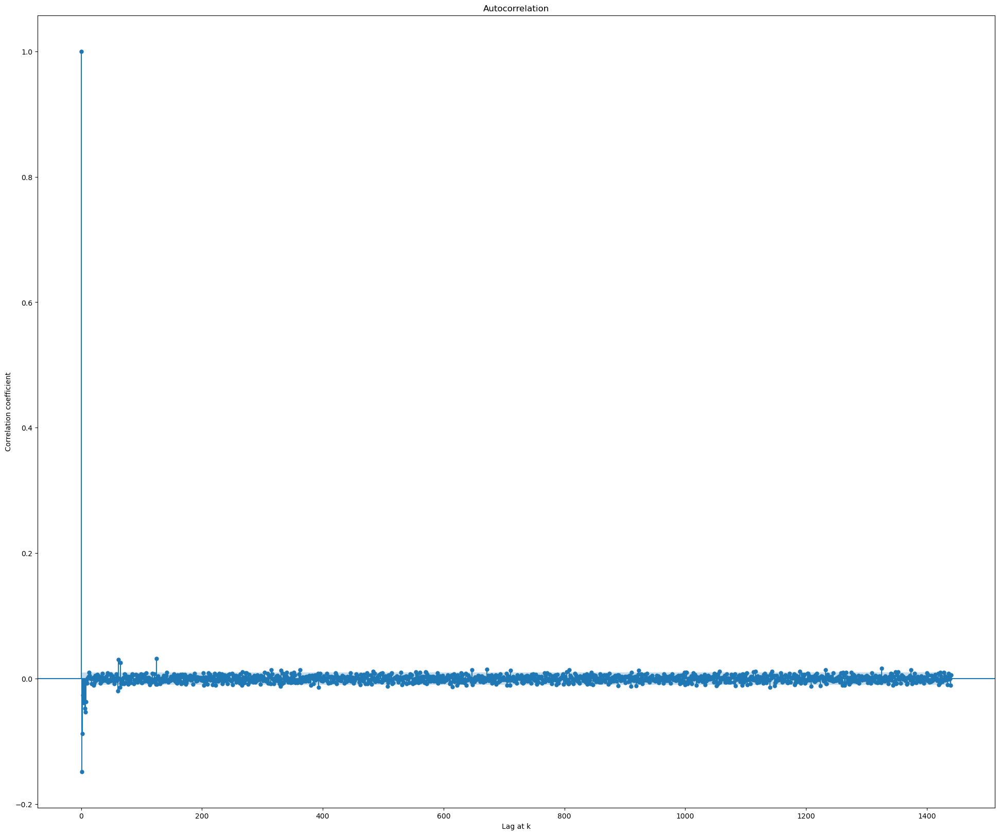

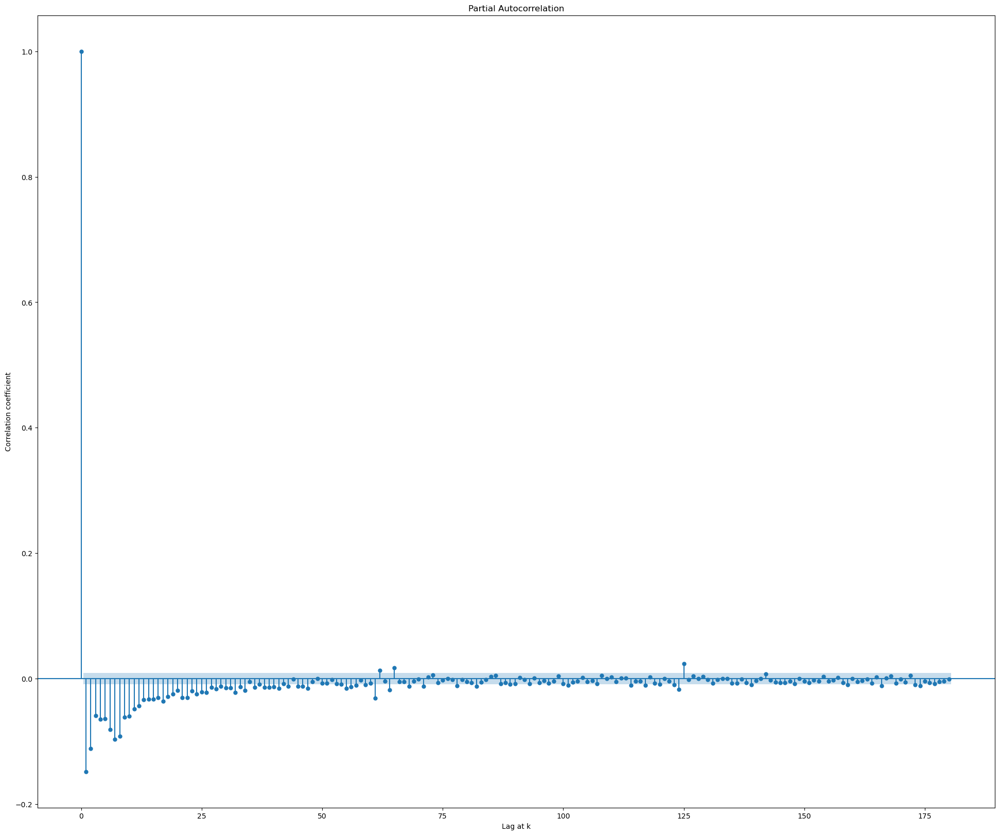

AC 14


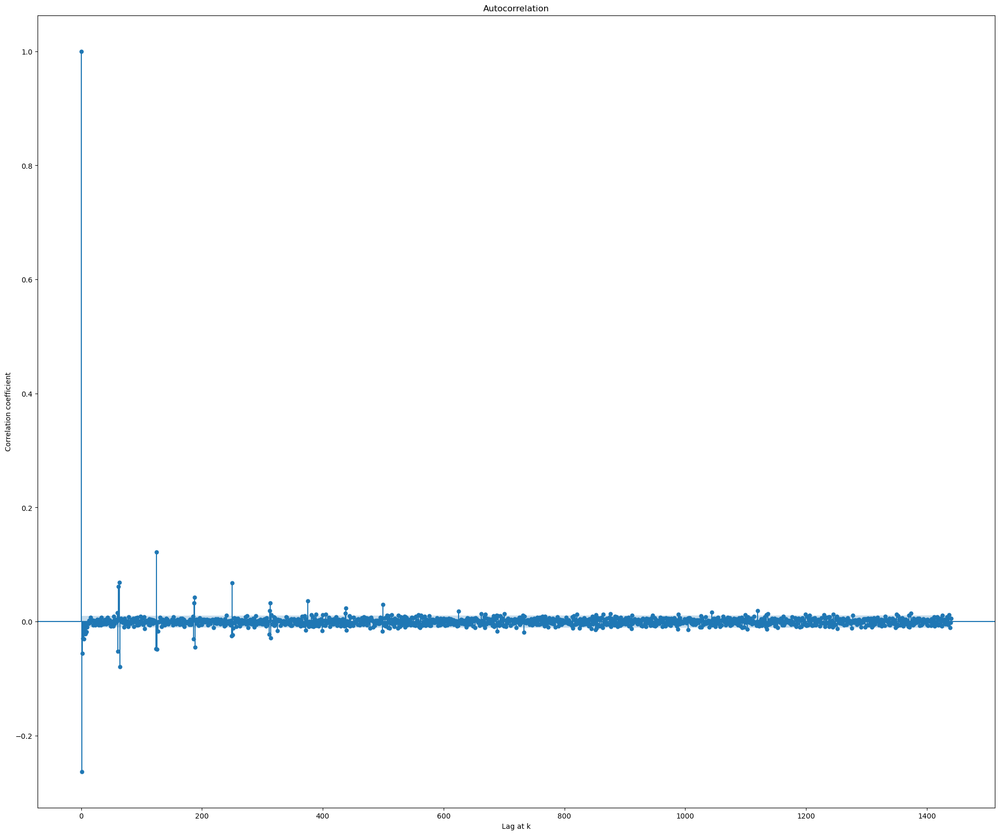

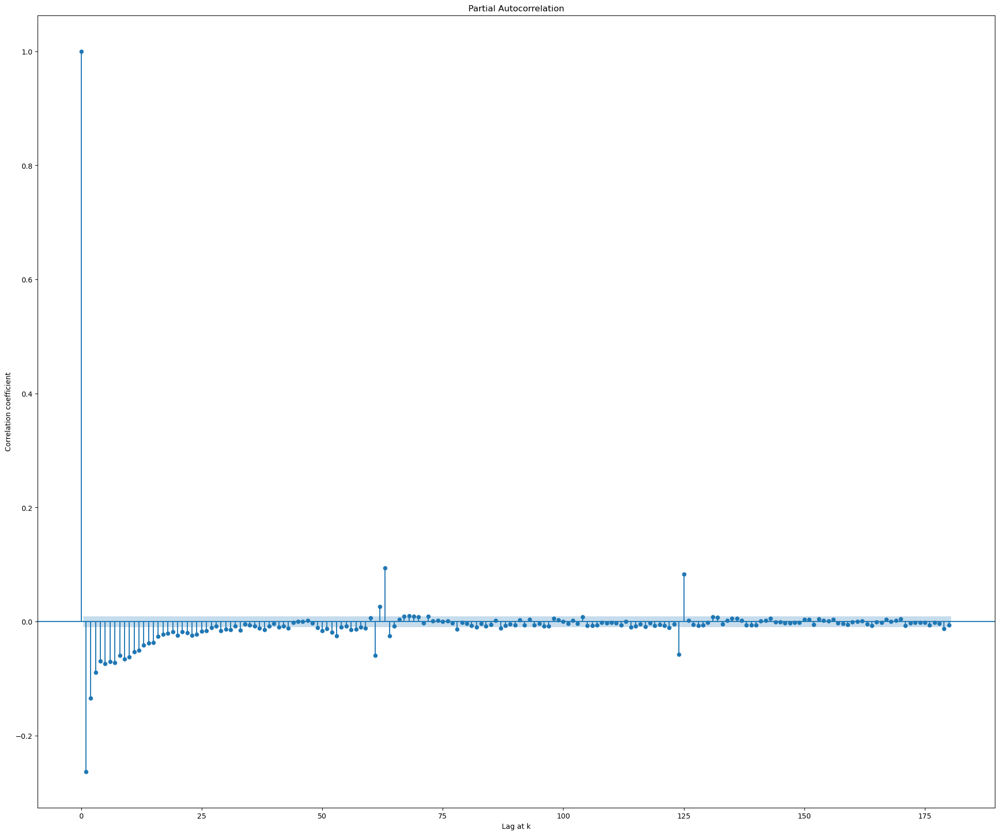

AC 15


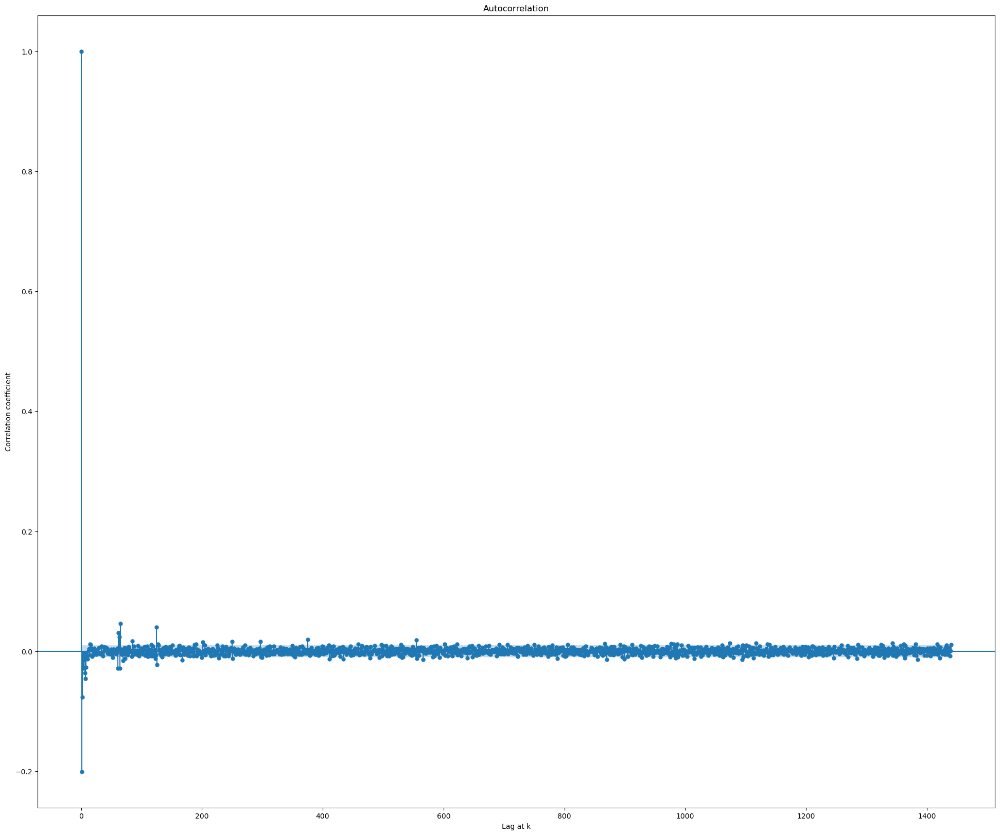

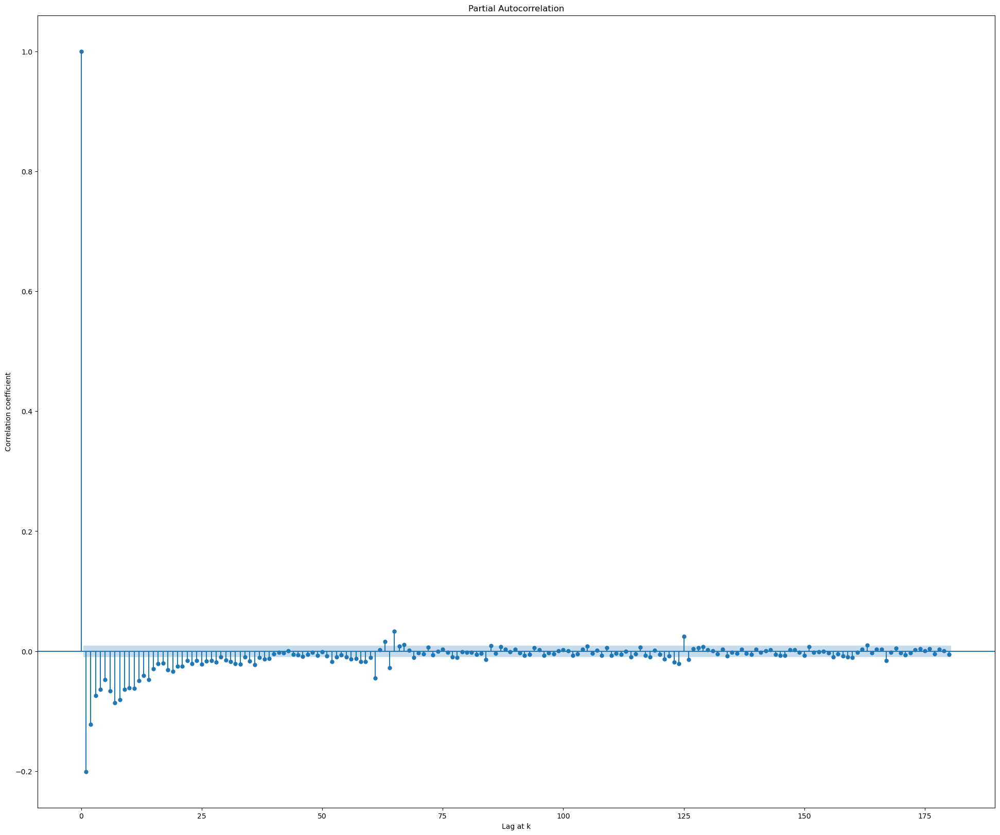

AC 16


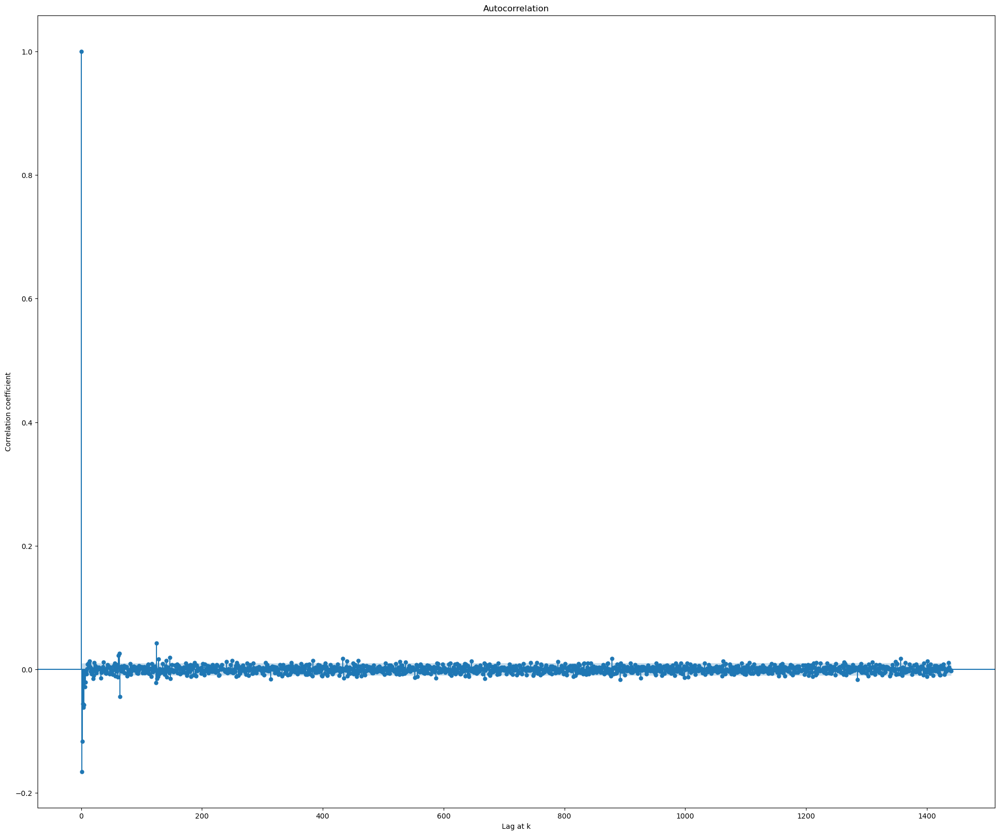

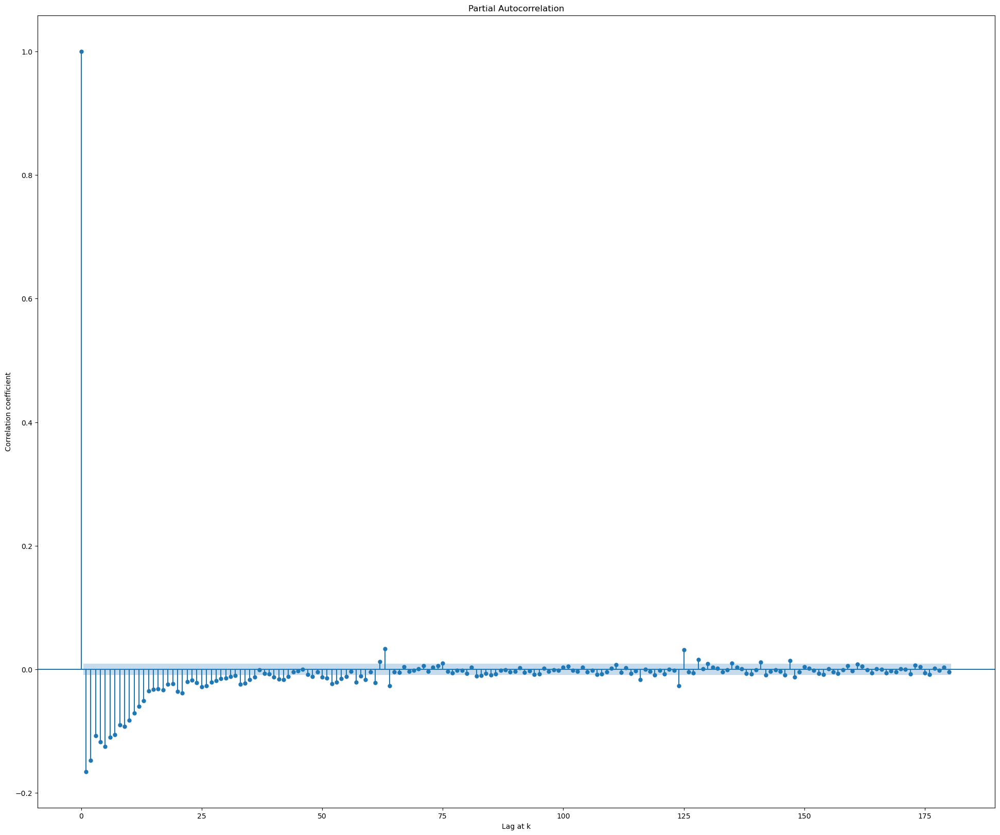

AC 17


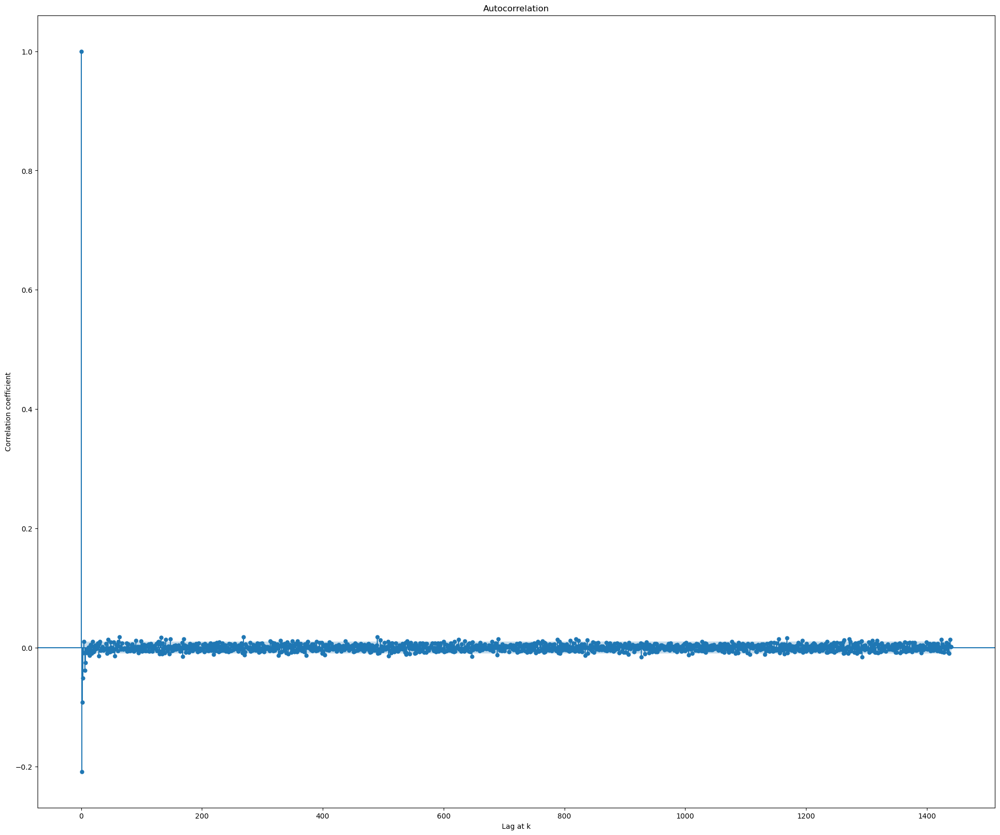

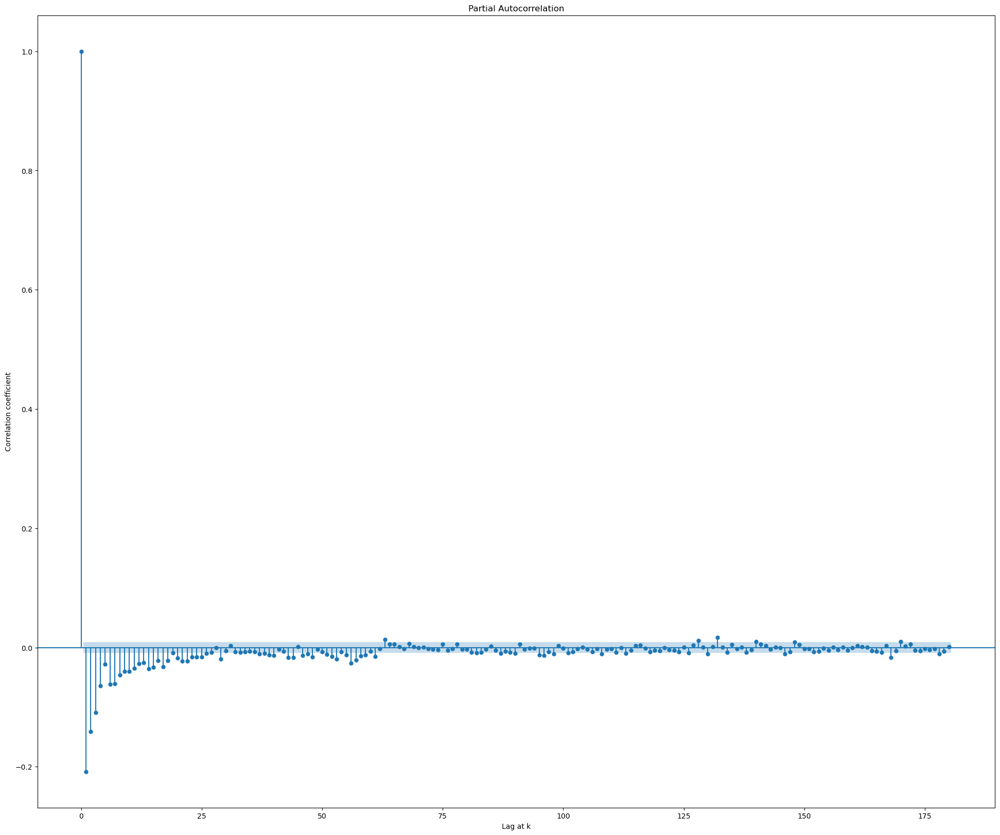

AC 18


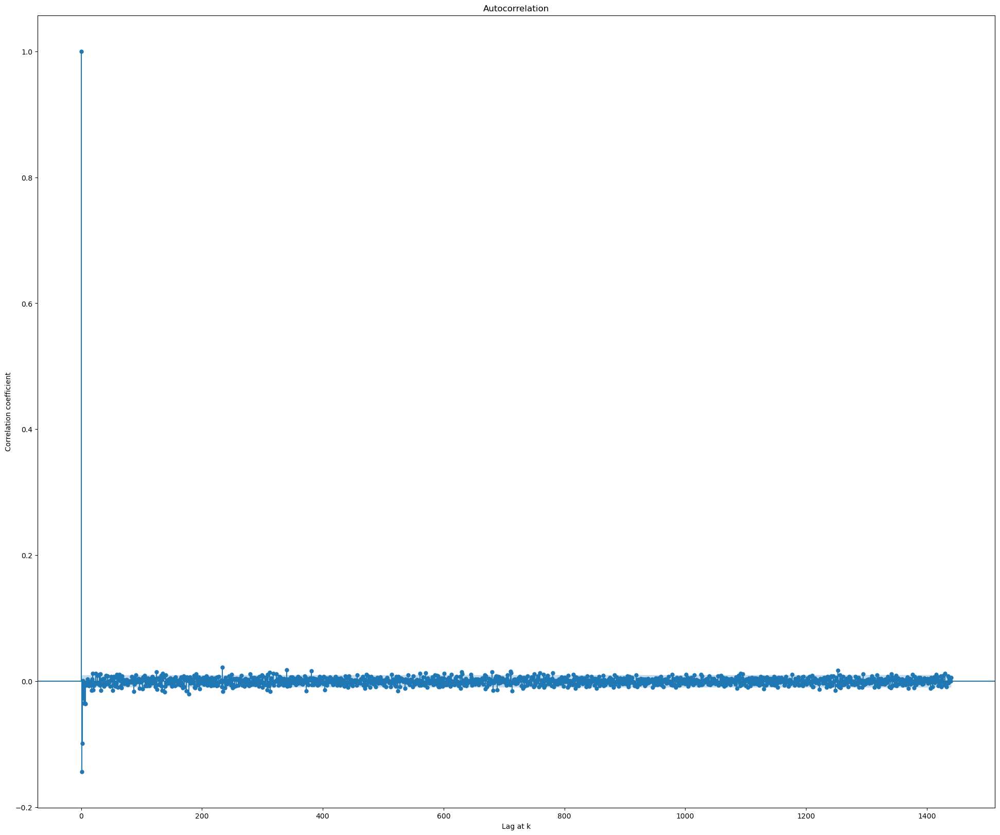

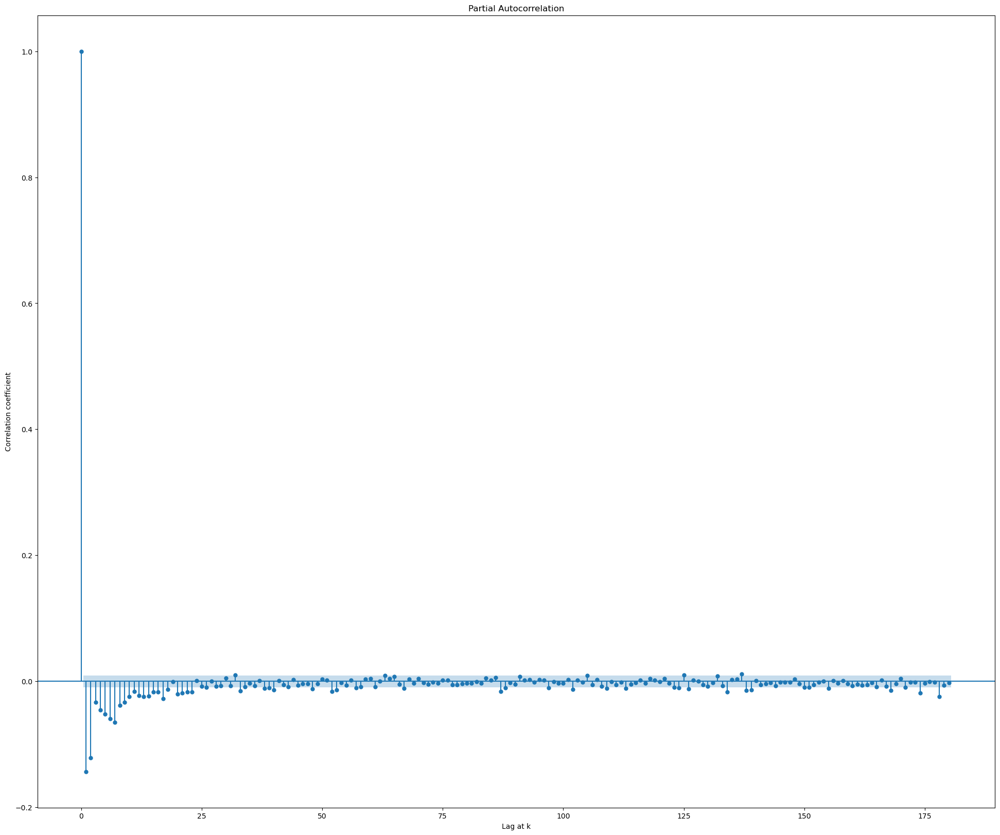

In [18]:
for name in data_diff.columns.values.tolist():
    print(name)
    fig = tsaplots.plot_acf(data_diff[name], lags=1440)
    plt.xlabel("Lag at k")
    plt.ylabel("Correlation coefficient")
    plt.show()
    
    fig = tsaplots.plot_pacf(data_diff[name], lags=180)
    plt.xlabel("Lag at k")
    plt.ylabel("Correlation coefficient")
    plt.show()

Keeping in mind the rules of fitting a time series to ARIMA by Robert Nau in Statistical Forecasting, we see that none of the first lag correlations are lower than -0.5 and are negative and small and patternless. hence, our series does not need a another order of differenceing and we can use these multiple univariate time series to forecast by ARIMA/SARIMA models.

Lastly, let us plot the correlations, seasonality and trends of the differnced data.

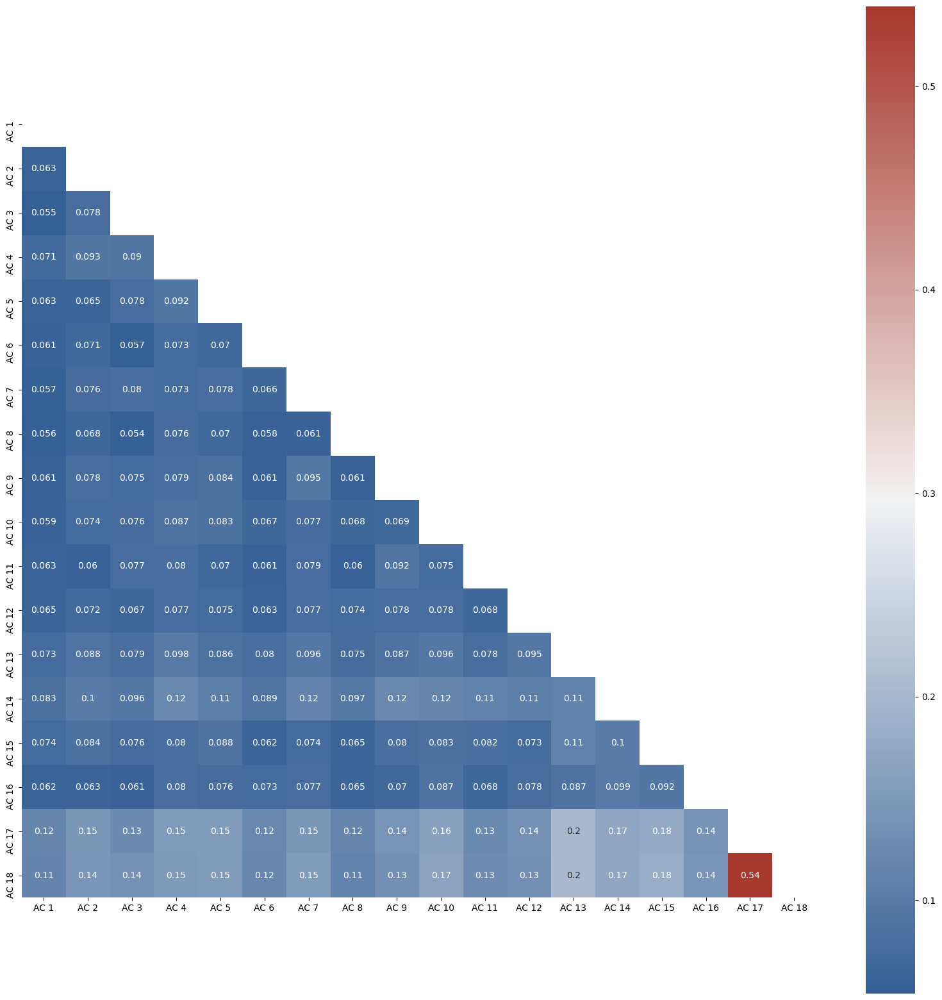

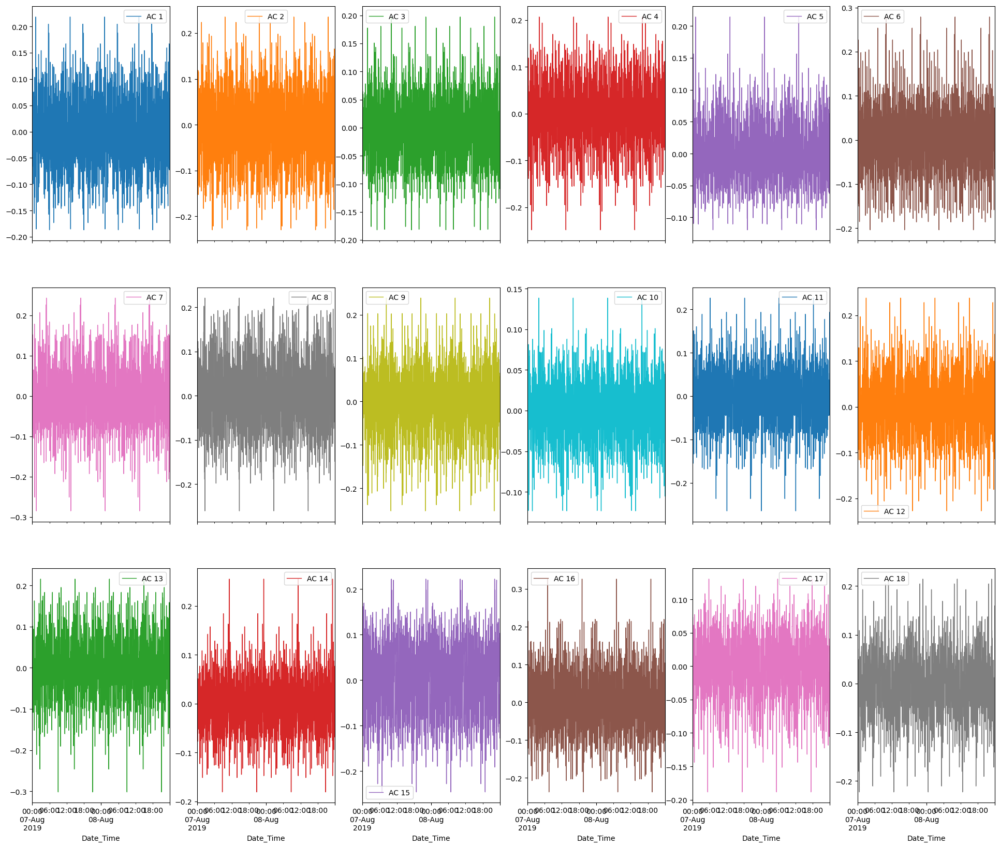

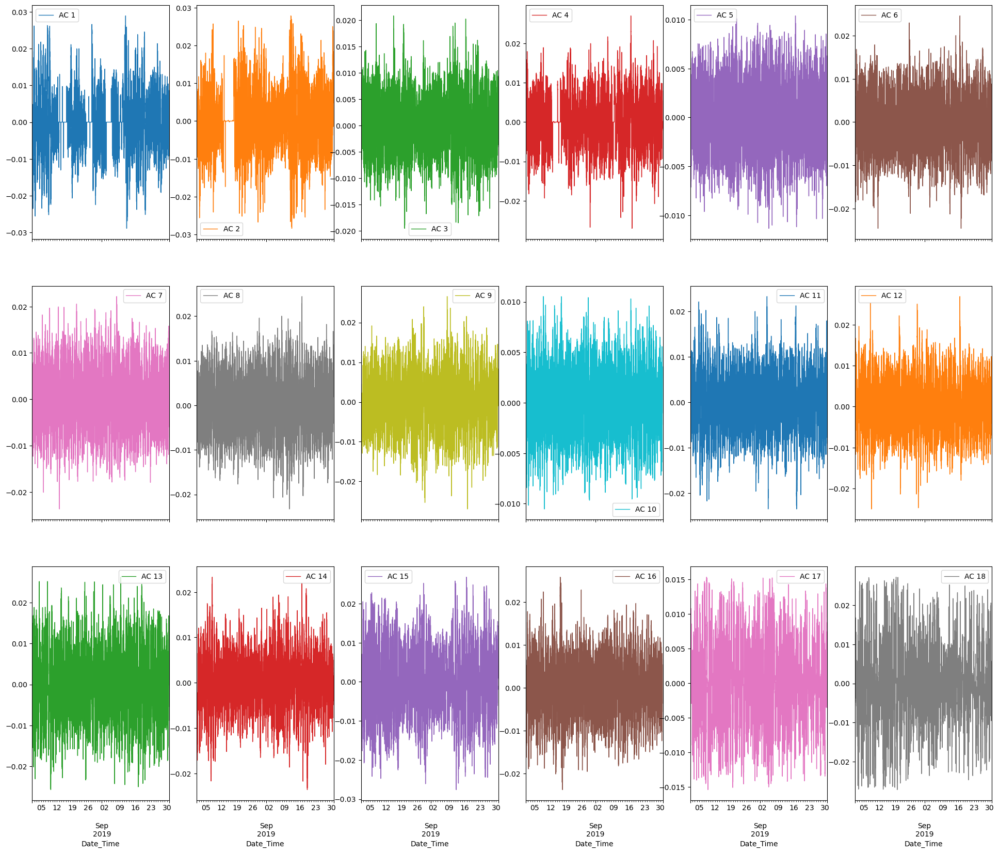

In [19]:
corrs_diff = data_diff.corr()

mask = np.triu(np.ones_like(corrs_diff, dtype=bool))

fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrs_diff, mask=mask, cmap=cmap, square=True, annot=True, ax=ax)
plt.show()

seasonality_diff = {}
trend_diff = {}
residual_diff = {}

for name in data_diff.columns.values.tolist():
    decomp = seasonal.seasonal_decompose(data_diff[name], model = "additive", period= decomp_freq)
    seasonality_diff[name] = decomp.seasonal
    trend_diff[name] = decomp.trend
    residual_diff[name] = decomp.resid

pd.DataFrame(seasonality_diff)["2019-08-07":"2019-08-08"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(trend_diff)["2019-08-01":"2019-09-30"].plot(subplots = True, layout = (3 , 6), linewidth=1)
#pd.DataFrame(residual_diff)["2019-08-07":"2019-09-07"].plot(subplots = True, layout = (3 , 6), linewidth=1)
plt.show()

As we can see, no series is much correlated with other except AC 17 and AC18. Also, the trends and seasonality have been neutralized.

## A few more tests and forecasting (Optional)

Now, what we will go three ways about this task at hand: First, we will try and forecast each series individually by fitting the series to a Holt's Sesonal Exponential Smoothing model. Secondly, we will try and forecast each series by using ARIMA on our stationarized differenced data. Lastly, we will work with the complete panel data and fit it using a FE/RE method.

### Holt's Seasonal Exponential Smoothing

Let us divide the dataset in train and test (50 days and 10 days) and fit it to Holt's Seasonal Exponential Smoothing.

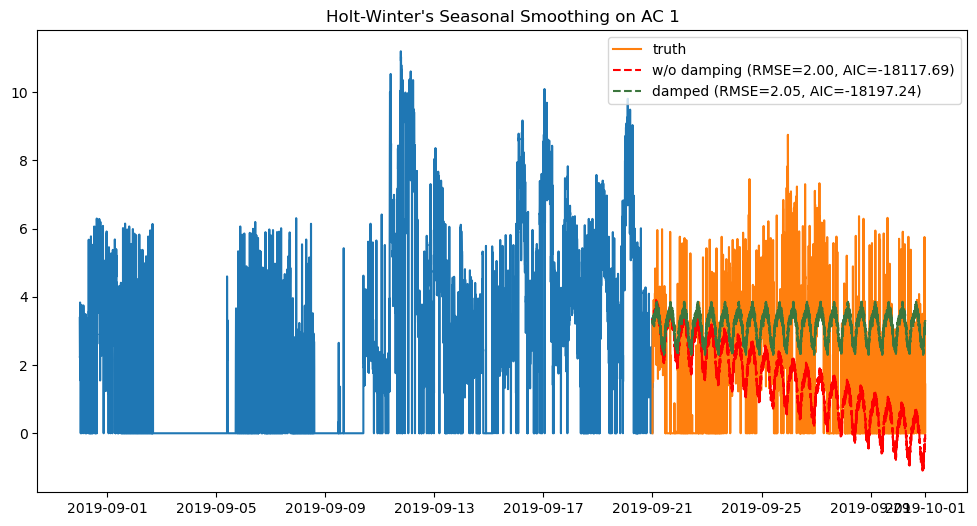

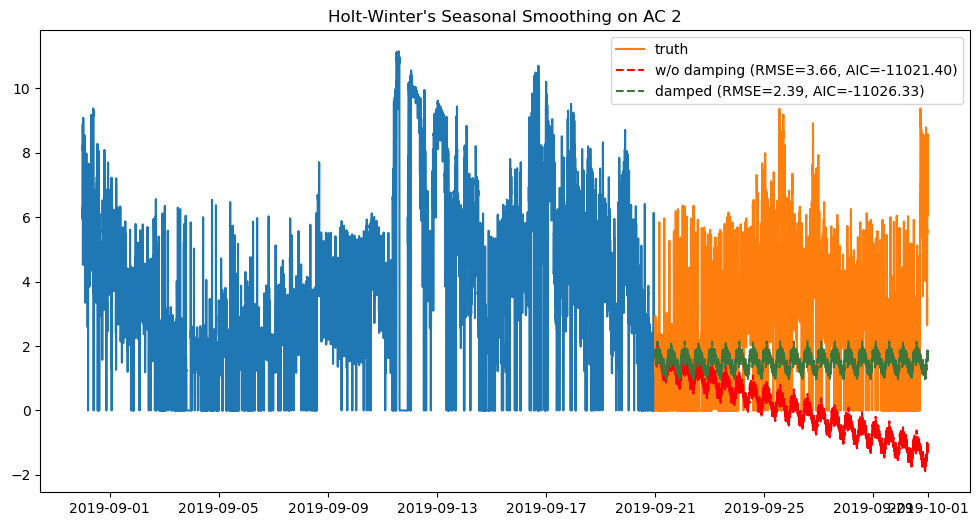

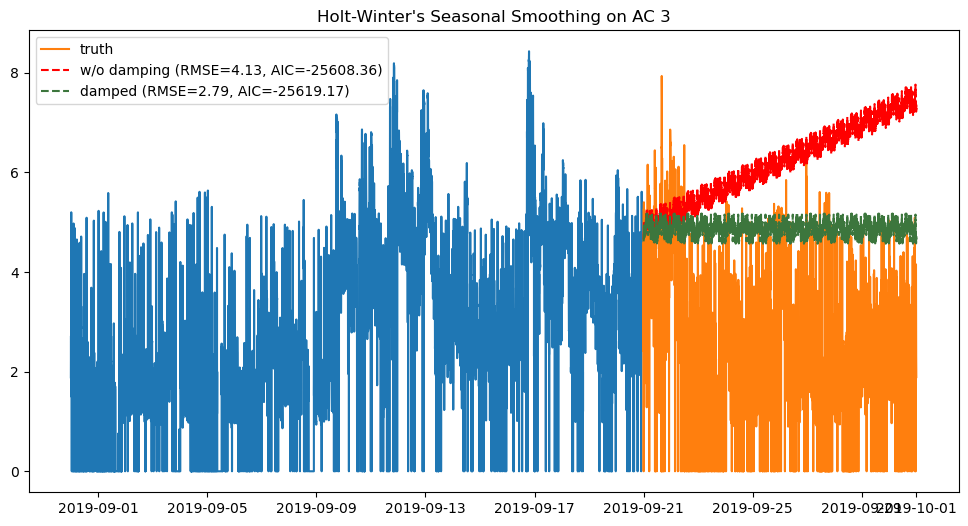

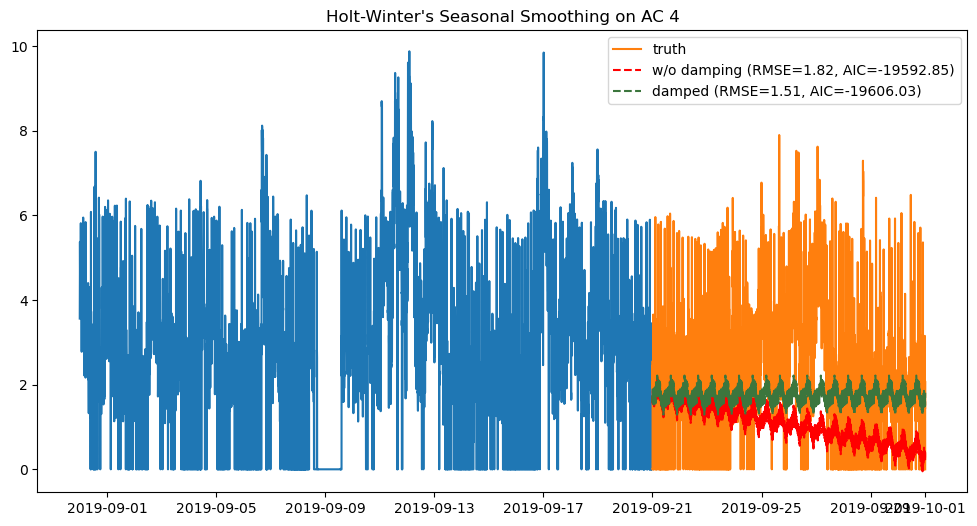

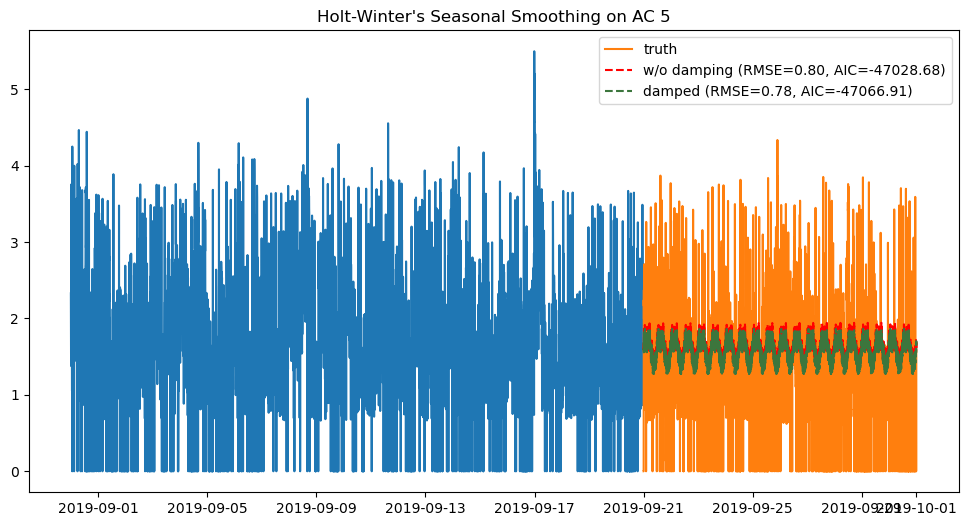

...

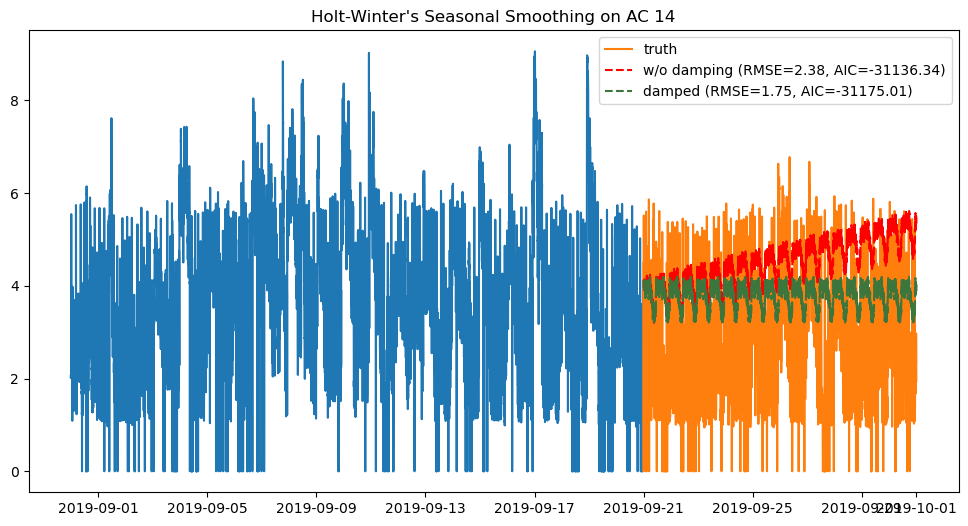

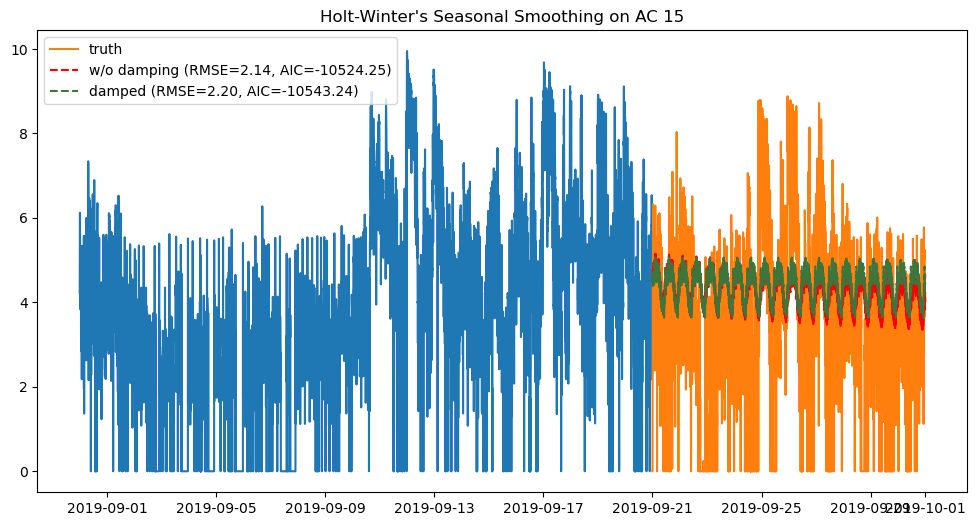

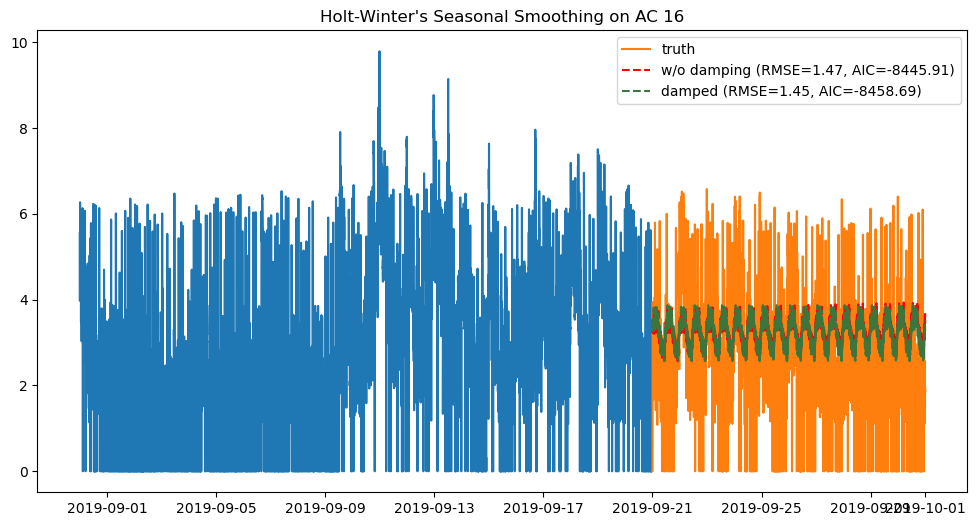

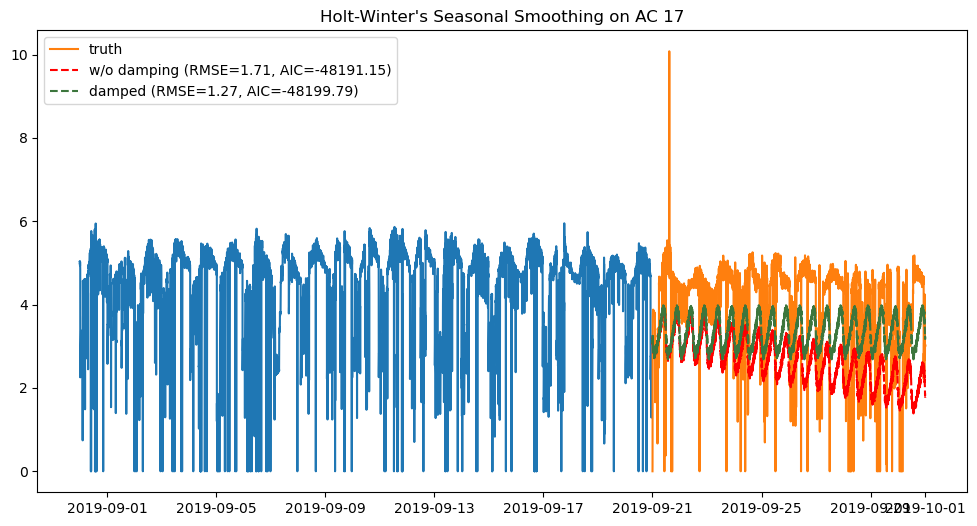

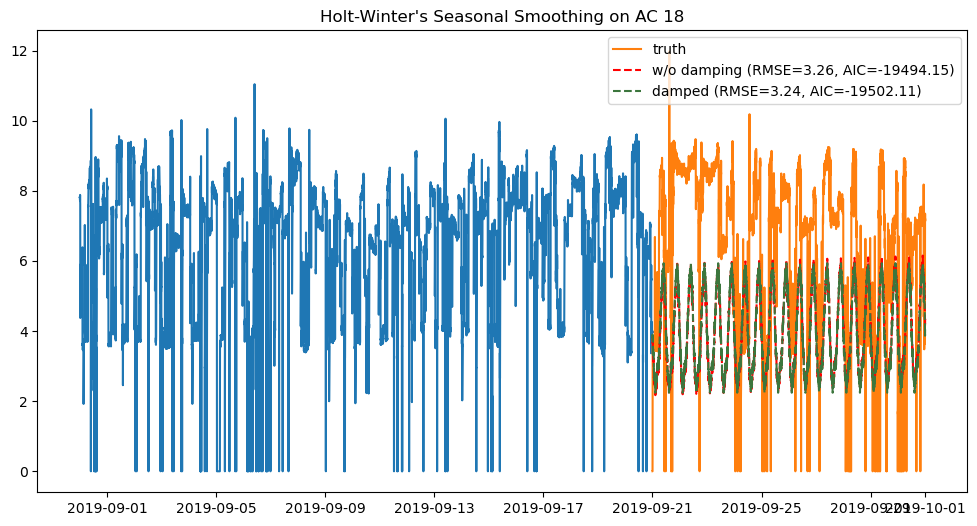

In [20]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

train = data_2.drop(["Month", "Day"], axis=1).iloc[:-7200, :]
test = data_2.drop(["Month", "Day"], axis=1).iloc[-7200:, :]
pred = {}
pred2 = {}

for name in train.columns.values.tolist():
    model = ExponentialSmoothing(train[name], trend="add", seasonal="add", seasonal_periods= 360)
    model2 = ExponentialSmoothing(train[name], trend="add", seasonal="add", seasonal_periods= 360, damped=True)
    fit = model.fit()
    pred[name] = fit.forecast(7200)
    fit2 = model2.fit()
    pred2[name] = fit2.forecast(7200)

    sse1 = np.sqrt(np.mean(np.square(test[name].values - pred[name].values)))
    sse2 = np.sqrt(np.mean(np.square(test[name].values - pred2[name].values)))

    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(train[name].index[21600:], train[name].values[21600:])
    ax.plot(test[name].index, test[name].values, label='truth')
    ax.plot(test[name].index, pred[name], linestyle='--', color='#ff0000', label="w/o damping (RMSE={:0.2f}, AIC={:0.2f})".format(sse1, fit.aic));
    ax.plot(test[name].index, pred2[name], linestyle='--', color='#3c763d', label="damped (RMSE={:0.2f}, AIC={:0.2f})".format(sse2, fit2.aic)); 
    ax.legend()
    ax.set_title("Holt-Winter's Seasonal Smoothing on {}".format(name))
    plt.show()

So, we can see the forecasts. We have run two models on each series: One that includes damping and the other that is without damping. As a general trend, damping helps us get better predictions for these time series, except for one or two like AC 1. Also, as we can see, the predictions of each model don't seem to have the noise of the true values.

Let us check a few statistics of the predicted values before moving onto the next model for comparing performances.

In [21]:
pred_sum = pd.DataFrame.from_dict(pred2).sum(axis = 0)
test_sum = test.sum(axis = 0)
print("Predicted Sum: ", pred_sum)
print("Test Sum: ", test_sum)

pred_mean = pd.DataFrame.from_dict(pred2).mean()
test_mean = test.mean()
print("Predicted Mean: ", pred_mean)
print("Test Mean: ", test_mean)

pred_std = pd.DataFrame.from_dict(pred2).std()
test_std = test.std()
print("Predicted Deviation: ", pred_std)
print("Test Deviation: ", test_std)

Predicted Sum:  AC 1     22669.447524
AC 2     11000.646318
AC 3     35118.056876
AC 4     12513.051274
AC 5     11385.620738
AC 6     25775.067753
AC 7     21251.327702
AC 8     22503.752514
AC 9     27220.741741
AC 10     8454.848037
AC 11    19938.105718
AC 12    26262.793588
AC 13    34500.389982
AC 14    27275.166534
AC 15    31905.901405
AC 16    23434.377083
AC 17    24065.842349
AC 18    28495.208760
dtype: float64
Test Sum:  AC 1     14612.390182
AC 2     20270.684982
AC 3     17619.607941
AC 4     14494.045792
AC 5      8918.565546
AC 6     14296.426441
AC 7     15574.755119
AC 8     16825.868664
AC 9     20519.615934
AC 10     9722.067180
AC 11    13593.765351
AC 12    17497.858555
AC 13    28496.576180
AC 14    17609.655484
AC 15    24741.481843
AC 16    17831.404085
AC 17    29099.508413
AC 18    45606.348590
dtype: float64
Predicted Mean:  AC 1     3.148534
AC 2     1.527868
AC 3     4.877508
AC 4     1.737924
AC 5     1.581336
AC 6     3.579871
AC 7     2.951573
AC 8    

Yeah, the predictions aren't very good. But given that this is a univariate model, we are losing the panel data information here, i.e, we havent used the data of other AC's power consumption to forecast the consumption value for a particular AC.

### Univariate ARIMA 

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 1   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -41229.458
Method:                       css-mle   S.D. of innovations              0.744
Date:                Sun, 10 Oct 2021   AIC                          82466.915
Time:                        11:28:37   BIC                          82500.960
Sample:                    08-01-2019   HQIC                         82477.735
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0001      0.001     -0.162      0.871      -0.002       0.001
ar.L1.D.AC 1     0.6646      0.005    120.988      0.000       0.654       0.675
ma.L1.D.AC 1    -0.9306      0.003   -351.90

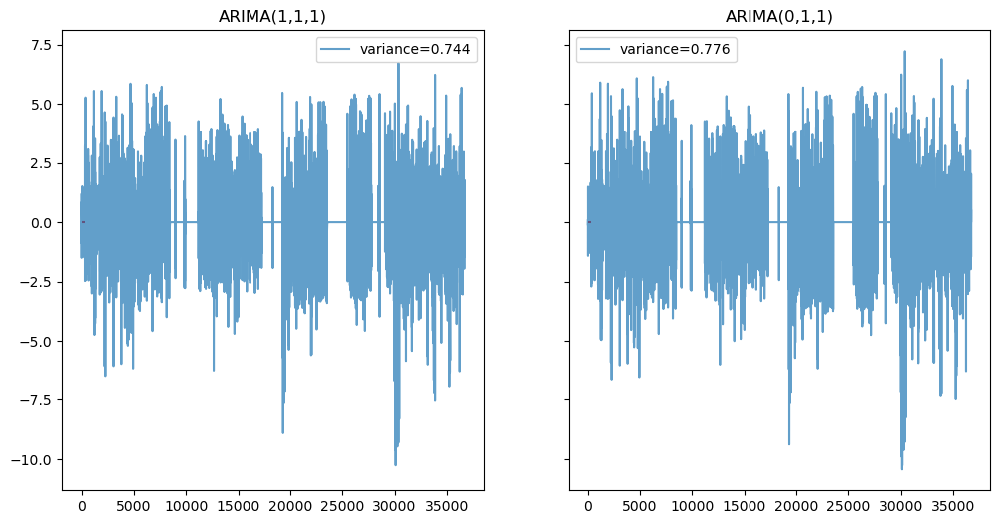

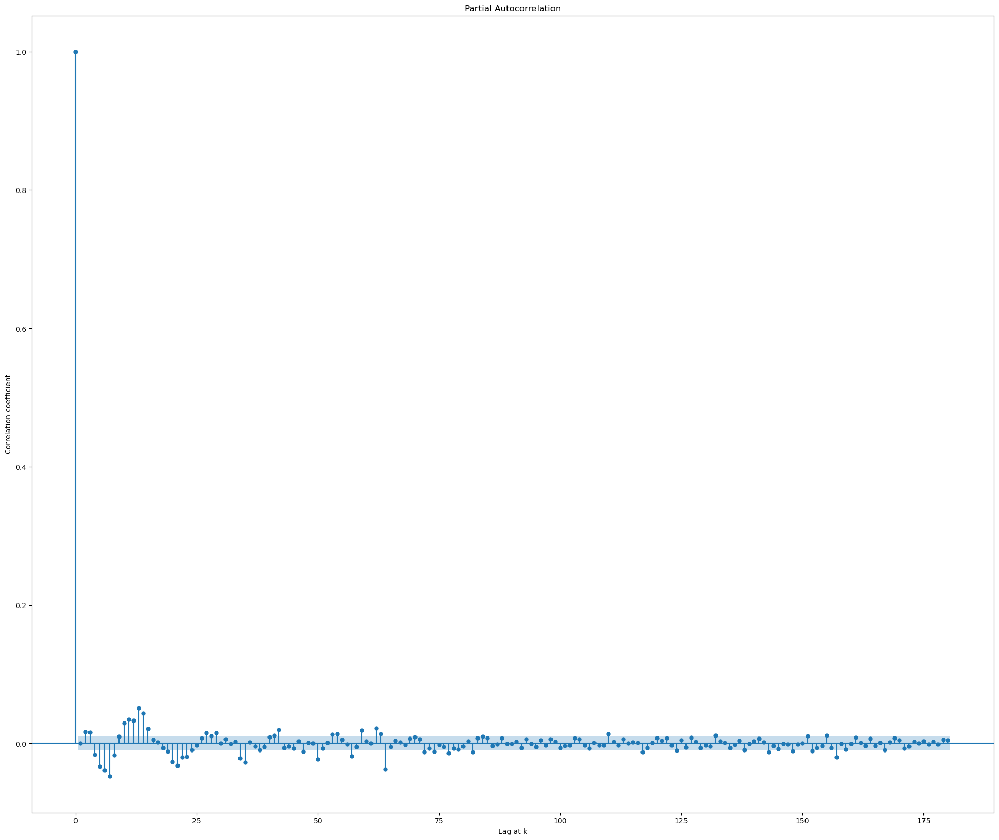

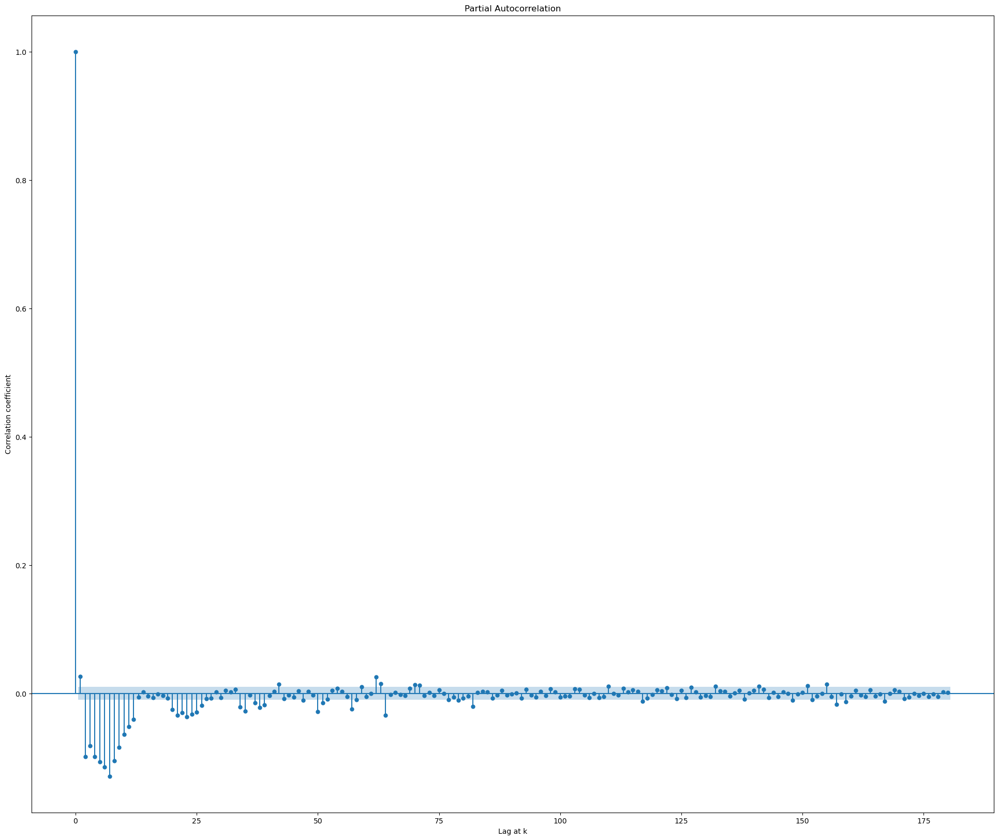

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 2   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -44844.202
Method:                       css-mle   S.D. of innovations              0.821
Date:                Sun, 10 Oct 2021   AIC                          89696.405
Time:                        11:30:36   BIC                          89730.449
Sample:                    08-01-2019   HQIC                         89707.224
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0002      0.001     -0.249      0.804      -0.002       0.001
ar.L1.D.AC 2     0.6886      0.005    127.031      0.000       0.678       0.699
ma.L1.D.AC 2    -0.9442      0.003   -365.63

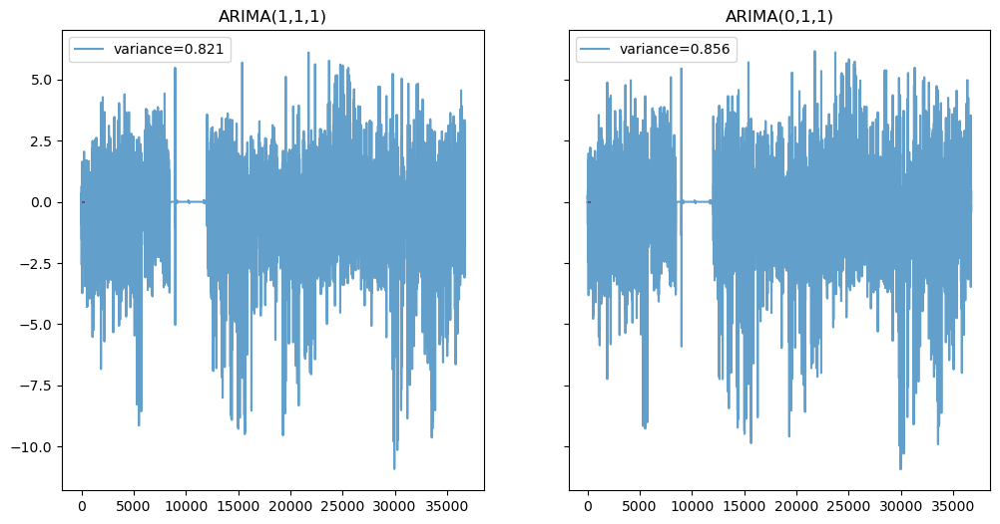

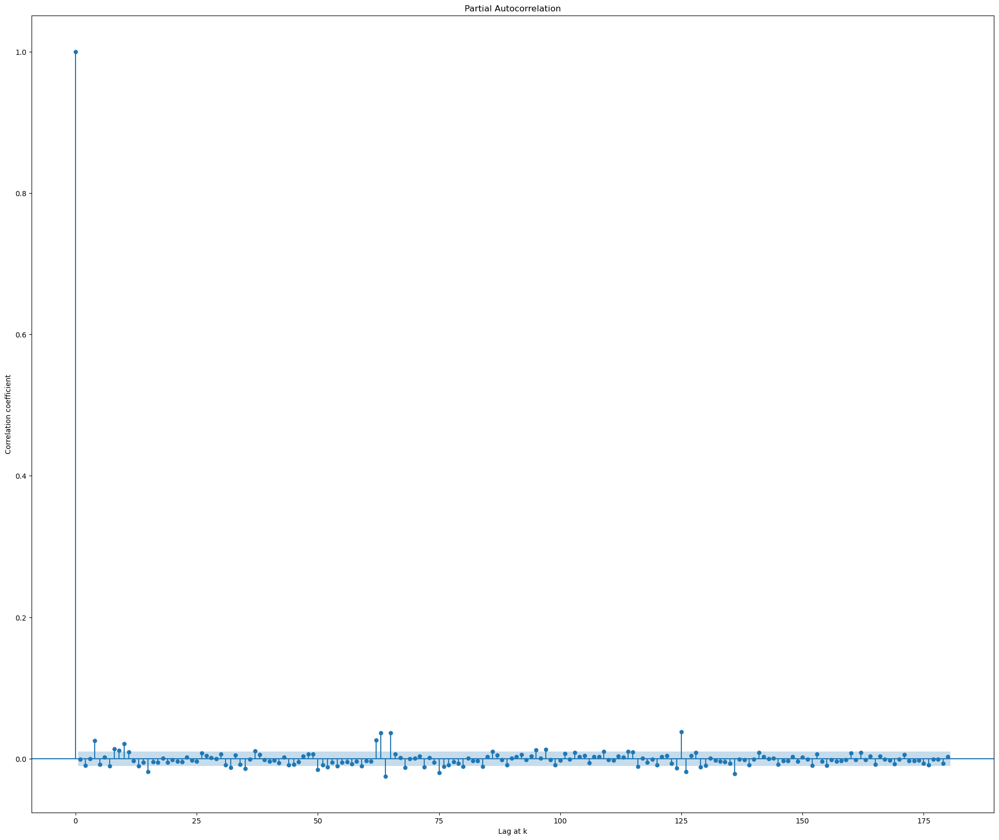

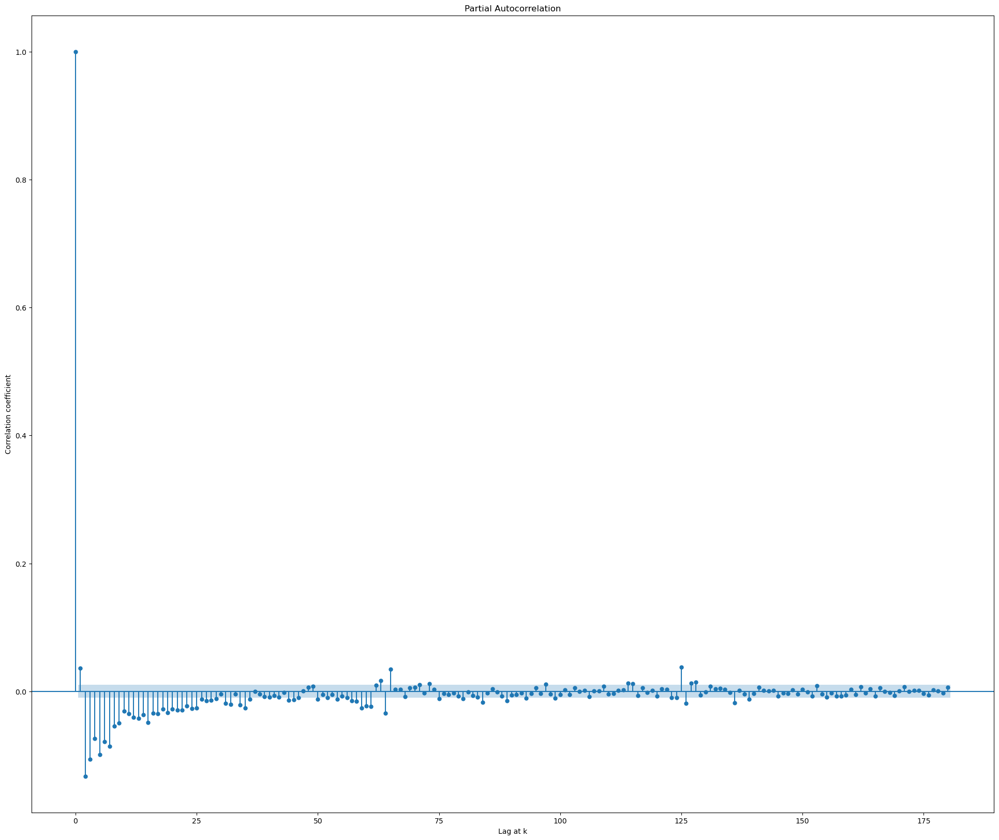

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 3   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -37655.800
Method:                       css-mle   S.D. of innovations              0.675
Date:                Sun, 10 Oct 2021   AIC                          75319.600
Time:                        11:32:37   BIC                          75353.644
Sample:                    08-01-2019   HQIC                         75330.419
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const         7.018e-05      0.001      0.131      0.896      -0.001       0.001
ar.L1.D.AC 3     0.6627      0.006    119.804      0.000       0.652       0.674
ma.L1.D.AC 3    -0.9488      0.003   -365.98

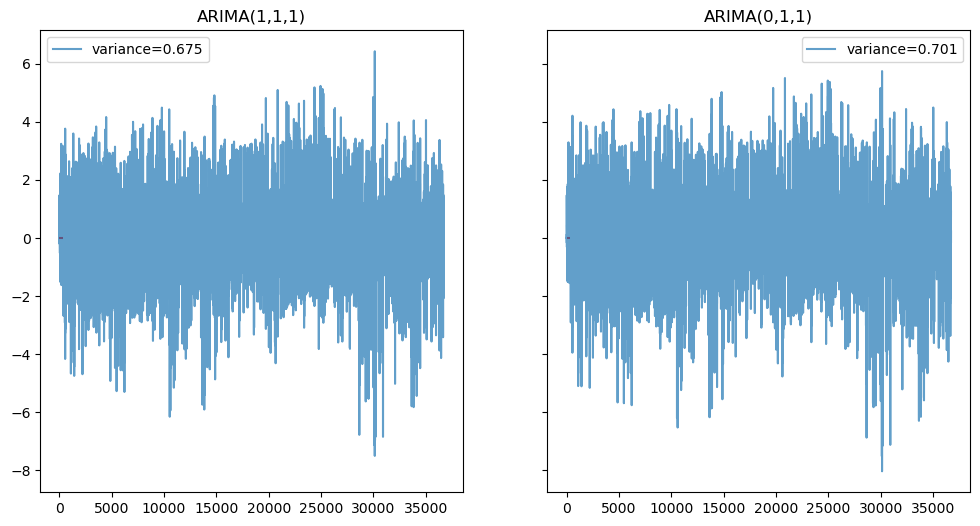

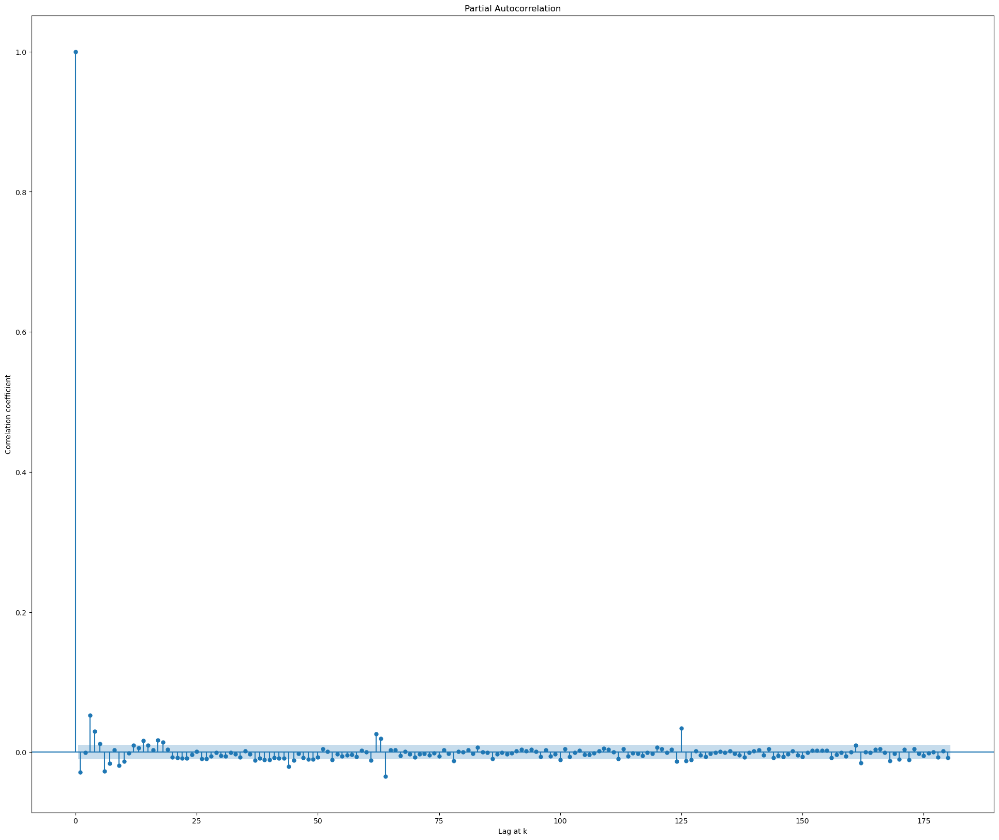

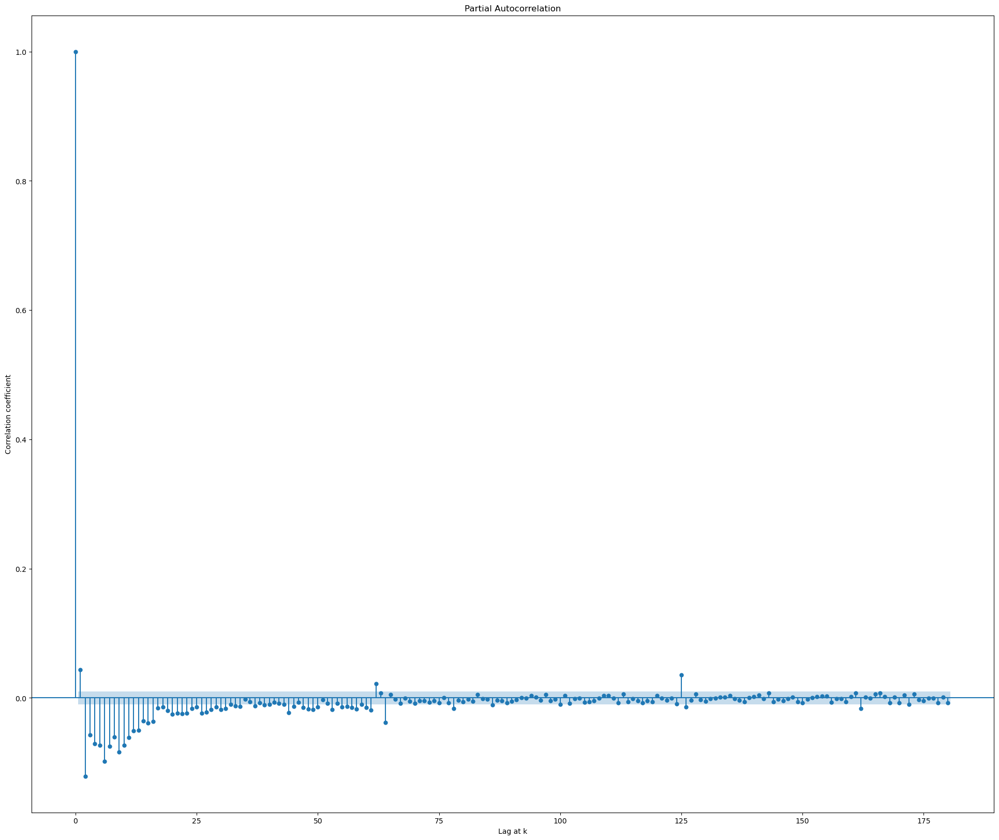

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 4   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -40654.928
Method:                       css-mle   S.D. of innovations              0.732
Date:                Sun, 10 Oct 2021   AIC                          81317.857
Time:                        11:34:49   BIC                          81351.901
Sample:                    08-01-2019   HQIC                         81328.676
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const         2.385e-05      0.001      0.039      0.969      -0.001       0.001
ar.L1.D.AC 4     0.6522      0.005    119.150      0.000       0.641       0.663
ma.L1.D.AC 4    -0.9444      0.003   -373.36

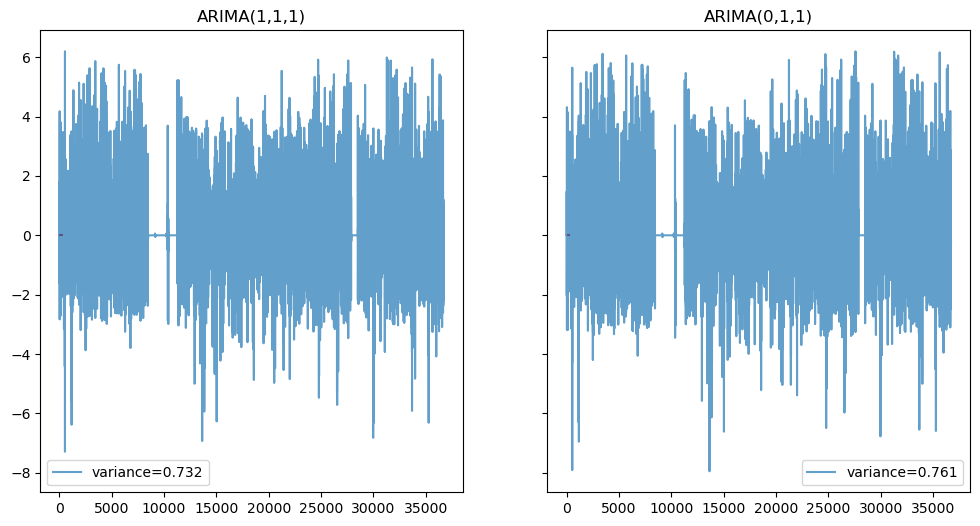

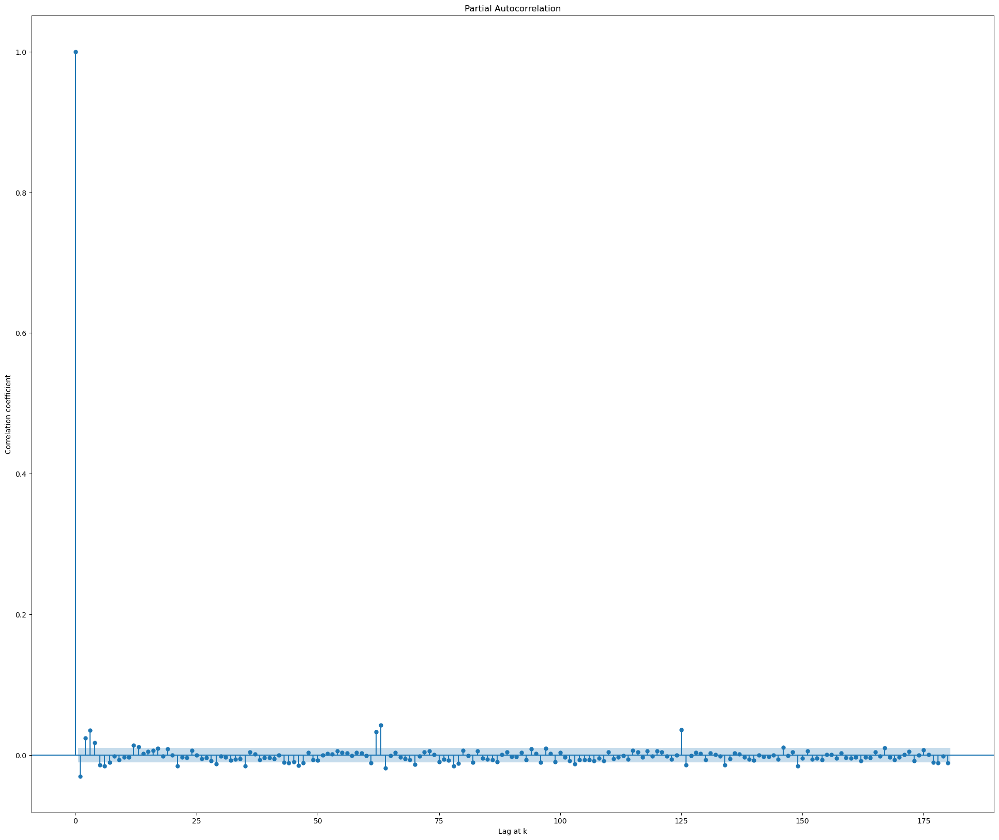

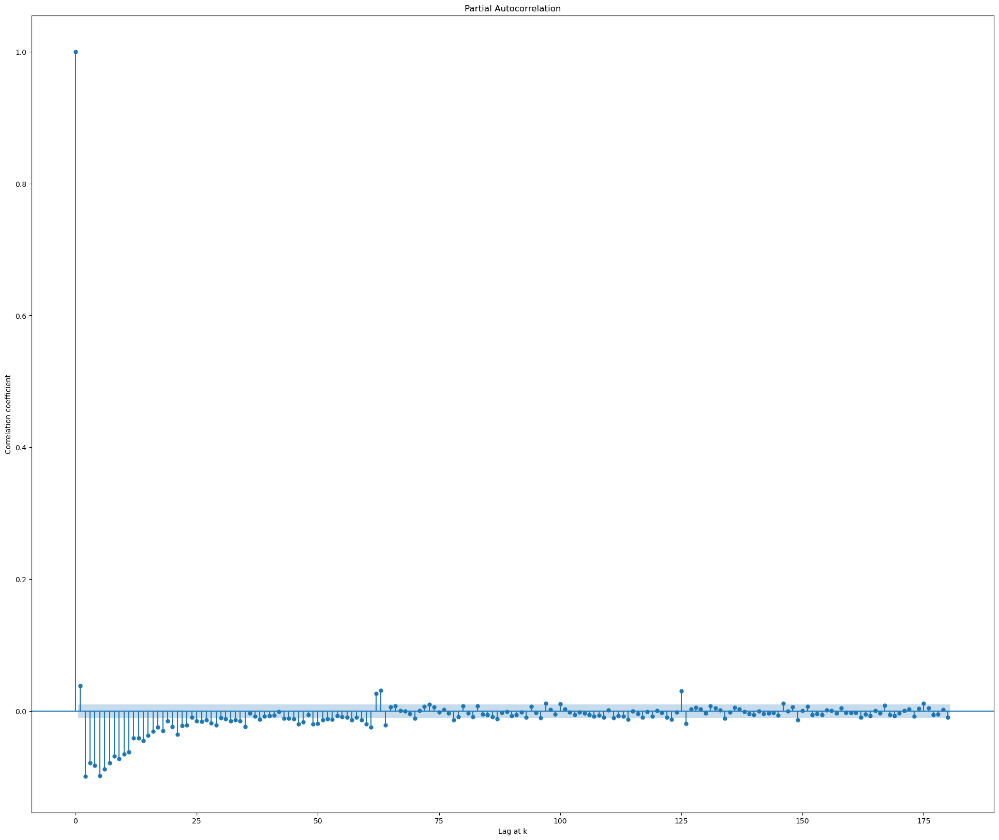

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 5   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -25957.777
Method:                       css-mle   S.D. of innovations              0.491
Date:                Sun, 10 Oct 2021   AIC                          51923.553
Time:                        11:36:38   BIC                          51957.597
Sample:                    08-01-2019   HQIC                         51934.373
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const        -1.491e-05      0.000     -0.063      0.950      -0.000       0.000
ar.L1.D.AC 5     0.6259      0.005    129.797      0.000       0.616       0.635
ma.L1.D.AC 5    -0.9653      0.002   -573.28

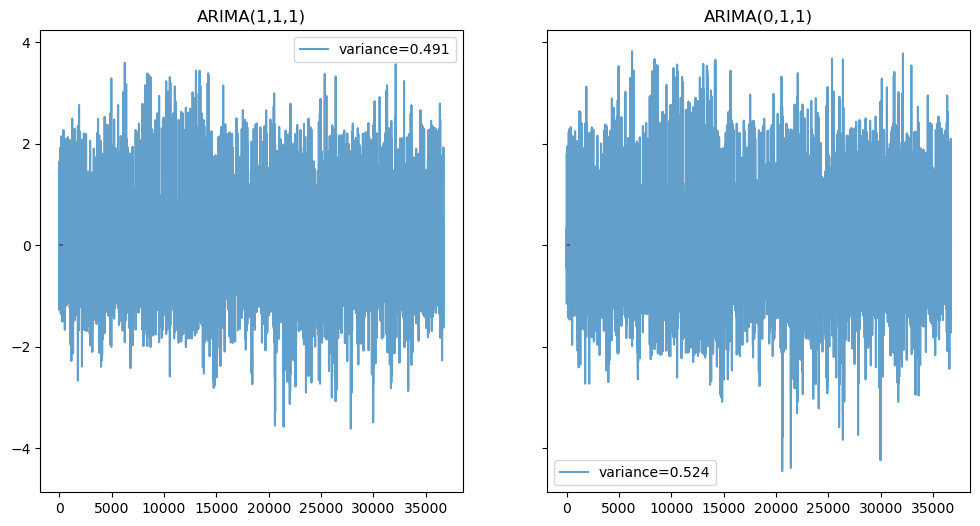

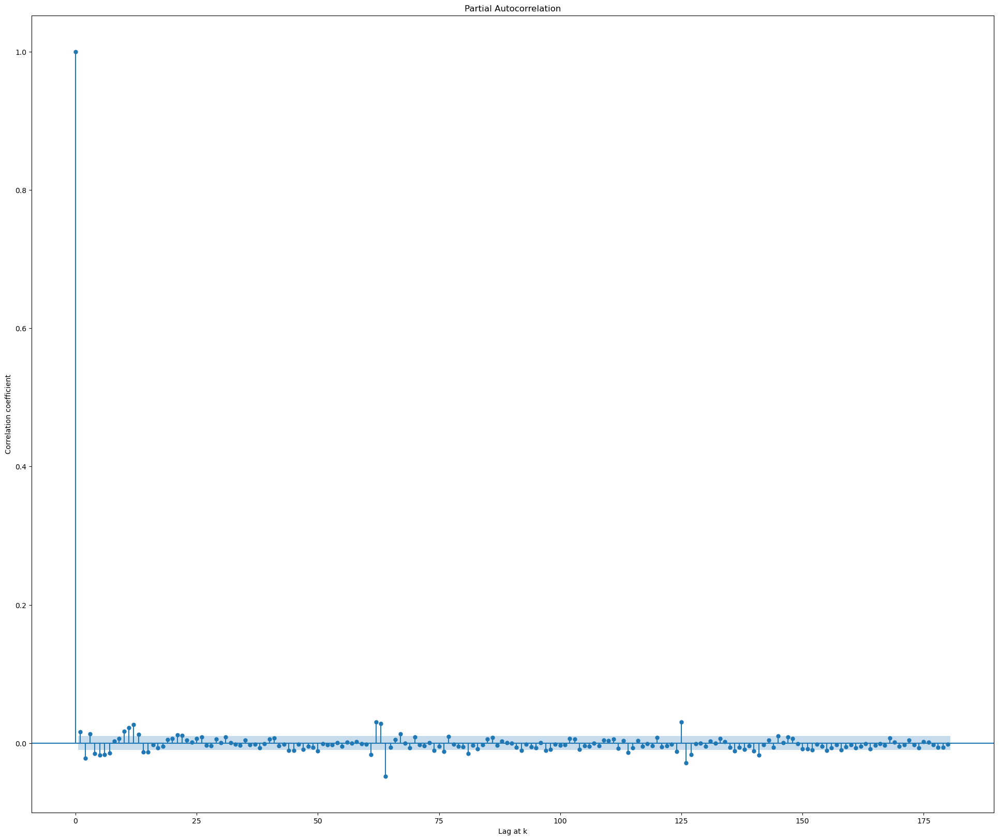

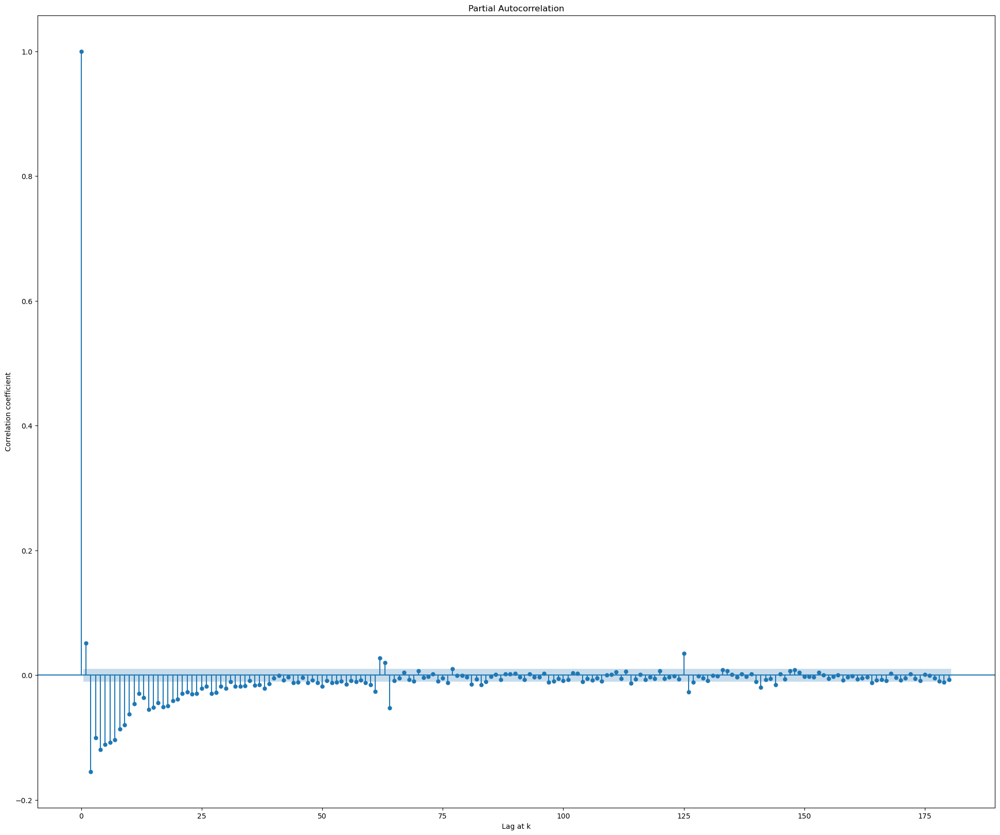

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 6   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -46264.030
Method:                       css-mle   S.D. of innovations              0.853
Date:                Sun, 10 Oct 2021   AIC                          92536.061
Time:                        11:38:30   BIC                          92570.105
Sample:                    08-01-2019   HQIC                         92546.880
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const         -2.59e-05      0.000     -0.061      0.951      -0.001       0.001
ar.L1.D.AC 6     0.6842      0.004    155.723      0.000       0.676       0.693
ma.L1.D.AC 6    -0.9698      0.001   -698.17

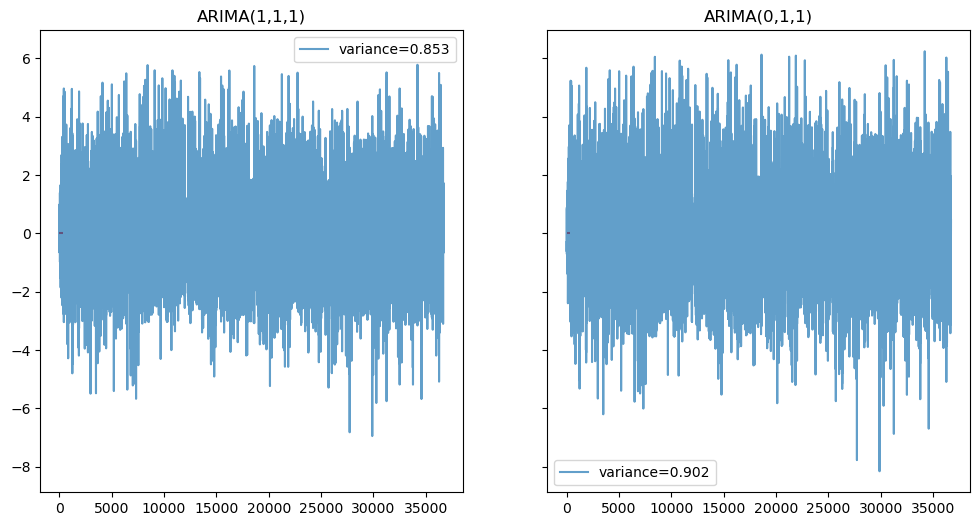

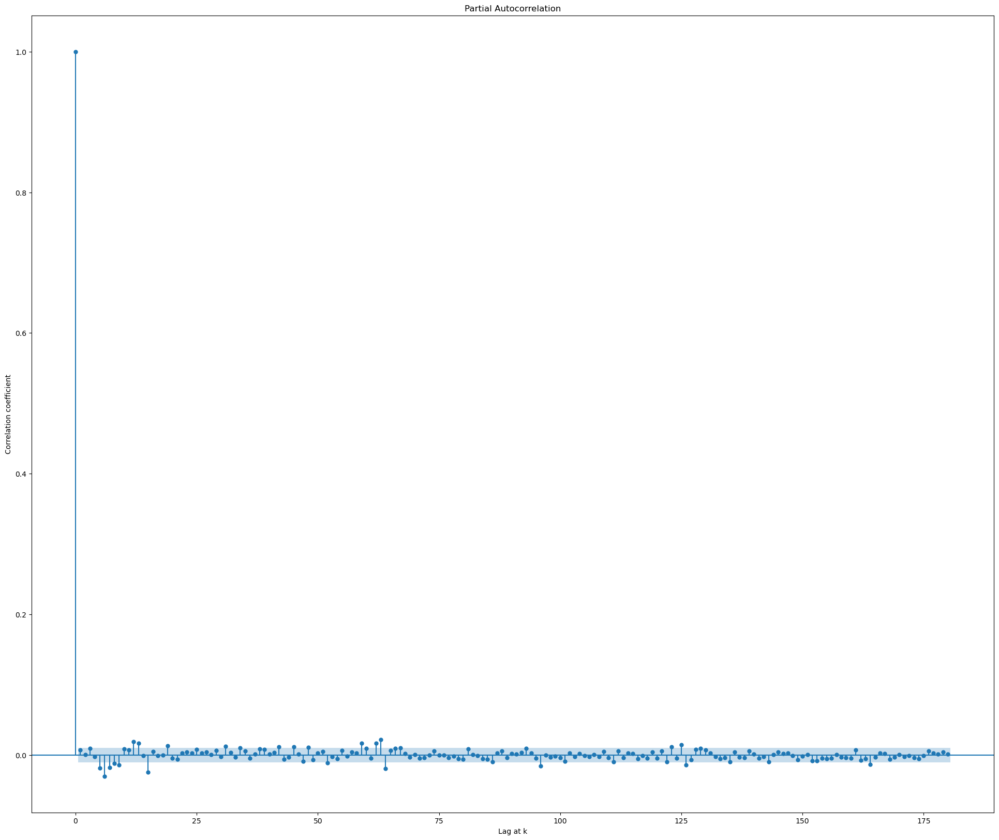

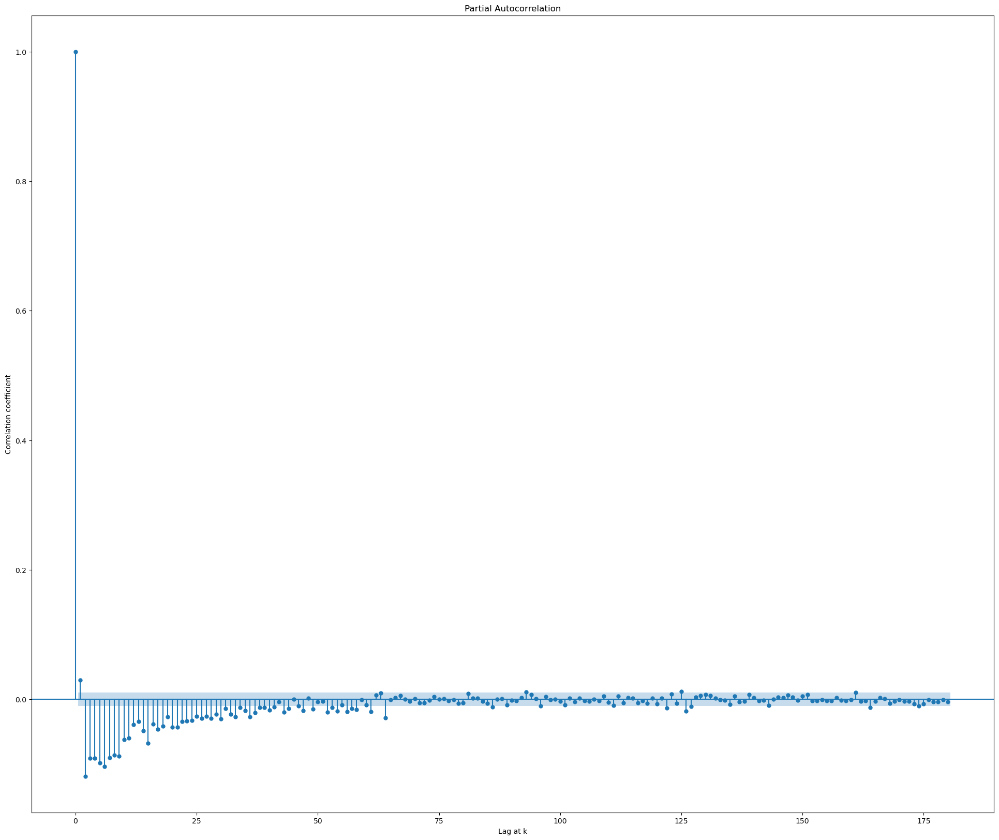

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 7   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -44939.013
Method:                       css-mle   S.D. of innovations              0.823
Date:                Sun, 10 Oct 2021   AIC                          89886.025
Time:                        11:40:26   BIC                          89920.069
Sample:                    08-01-2019   HQIC                         89896.845
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           1.9e-05      0.001      0.037      0.970      -0.001       0.001
ar.L1.D.AC 7     0.6669      0.005    133.880      0.000       0.657       0.677
ma.L1.D.AC 7    -0.9607      0.002   -476.77

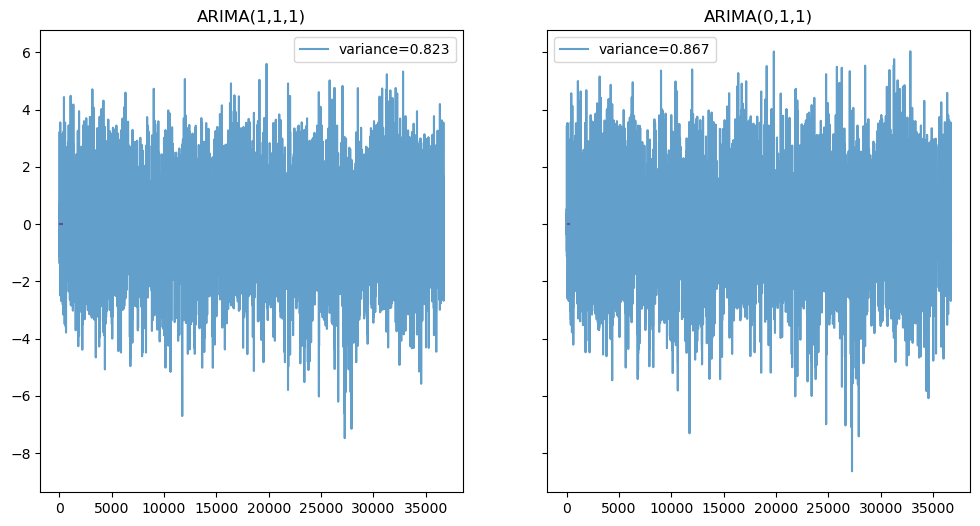

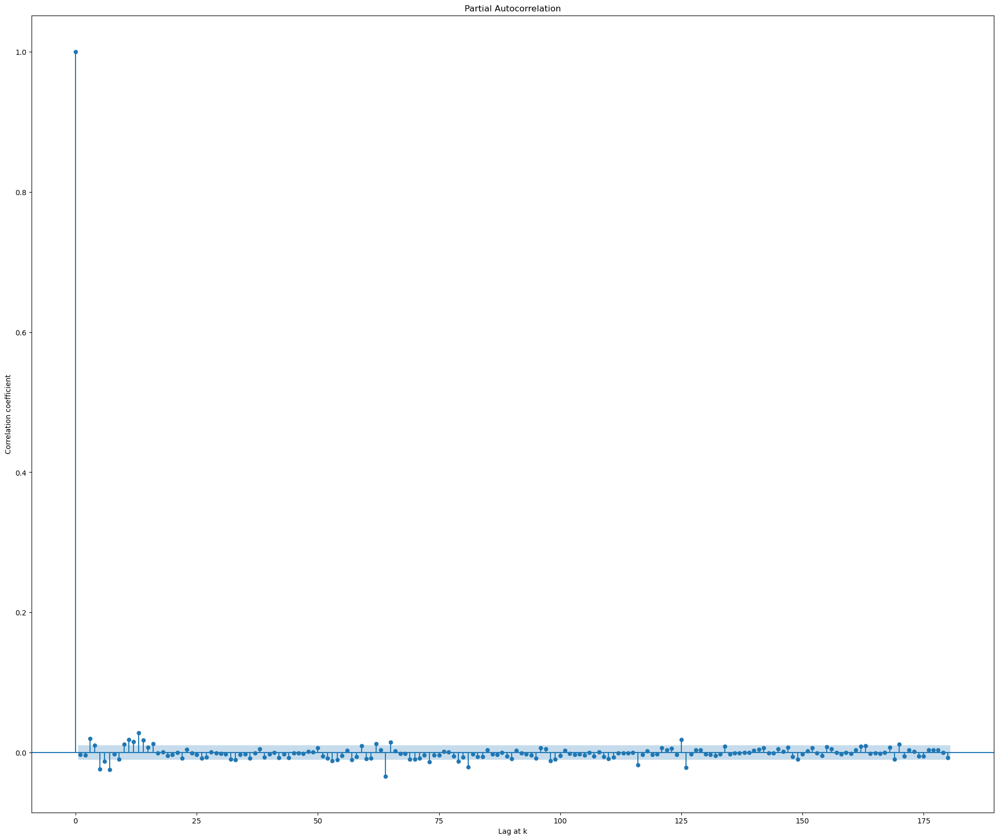

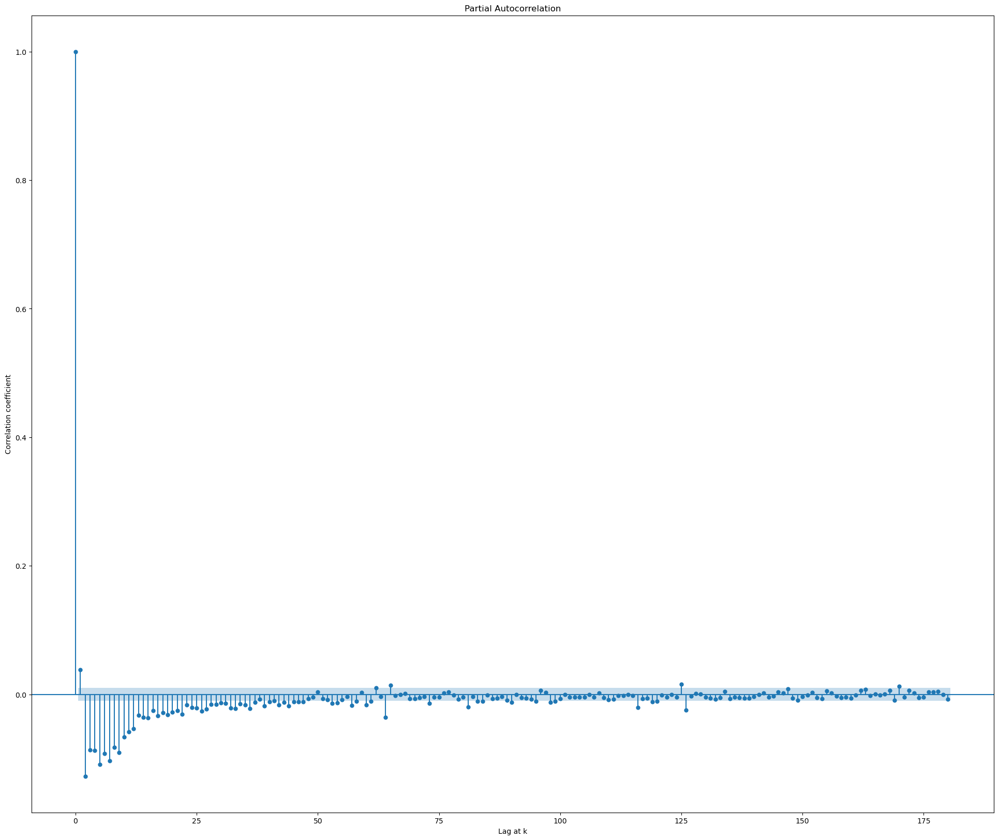

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 8   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -46573.513
Method:                       css-mle   S.D. of innovations              0.860
Date:                Sun, 10 Oct 2021   AIC                          93155.025
Time:                        11:42:51   BIC                          93189.069
Sample:                    08-01-2019   HQIC                         93165.845
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const        -4.814e-05      0.001     -0.089      0.929      -0.001       0.001
ar.L1.D.AC 8     0.6297      0.005    124.889      0.000       0.620       0.640
ma.L1.D.AC 8    -0.9554      0.002   -482.66

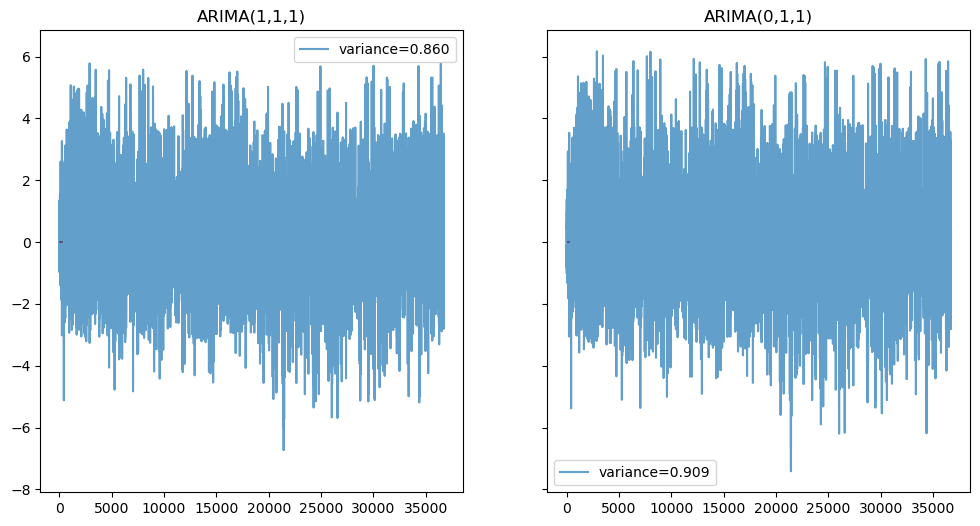

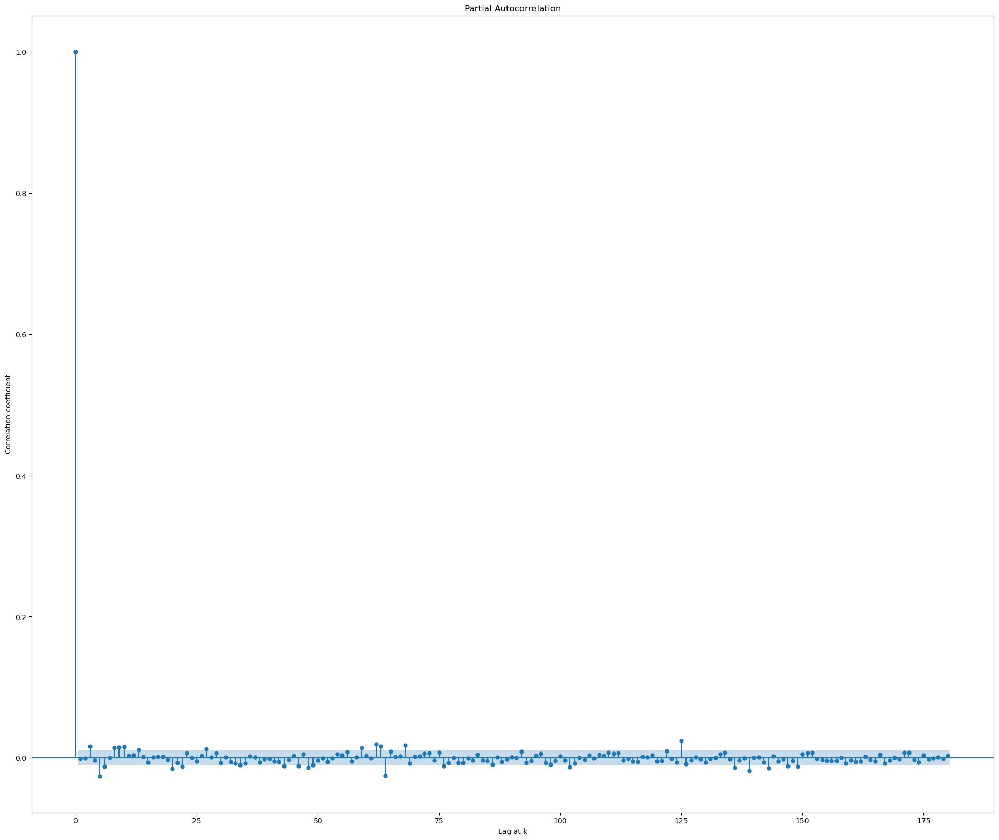

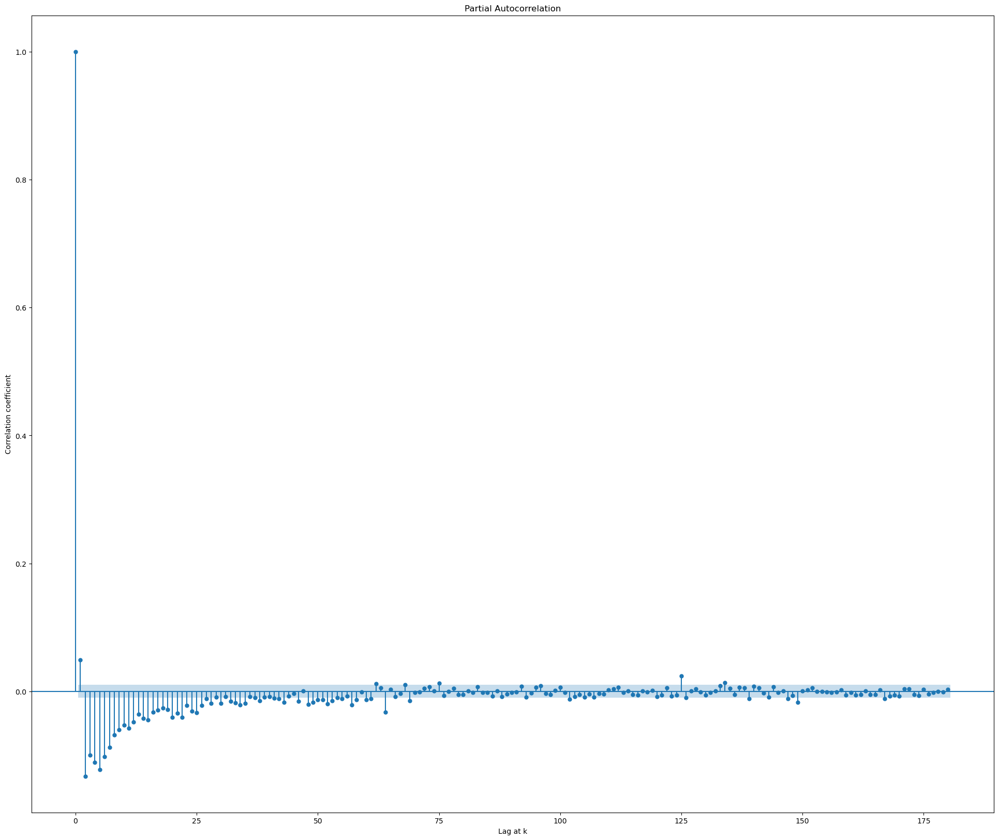

                             ARIMA Model Results                              
Dep. Variable:                 D.AC 9   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -45144.750
Method:                       css-mle   S.D. of innovations              0.827
Date:                Sun, 10 Oct 2021   AIC                          90297.500
Time:                        11:44:40   BIC                          90331.544
Sample:                    08-01-2019   HQIC                         90308.319
                         - 09-20-2019                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const        -1.129e-05      0.000     -0.024      0.981      -0.001       0.001
ar.L1.D.AC 9     0.7030      0.005    152.267      0.000       0.694       0.712
ma.L1.D.AC 9    -0.9680      0.002   -557.87

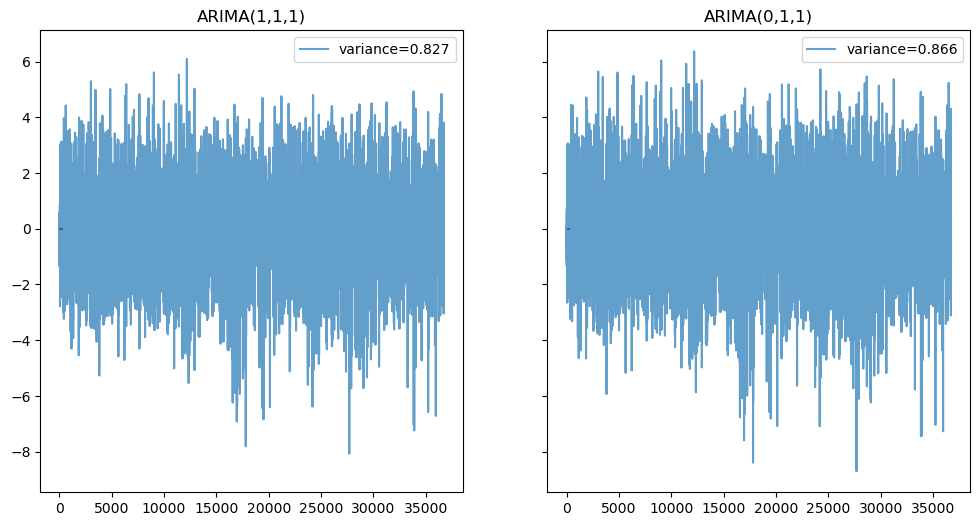

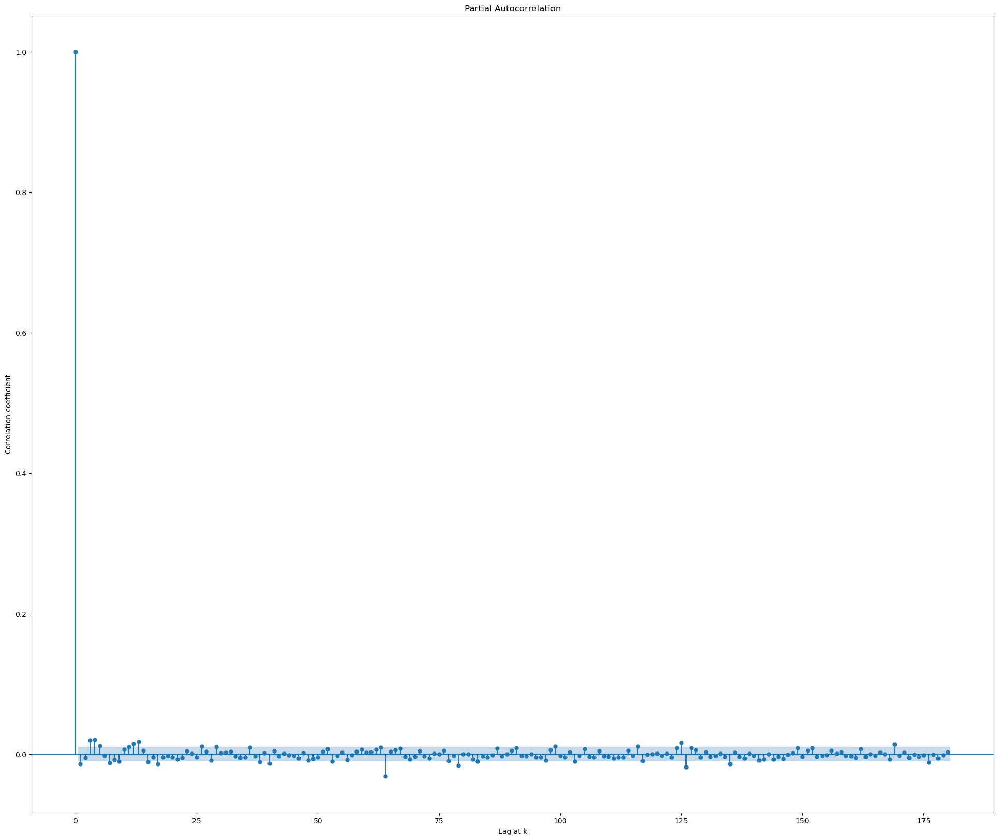

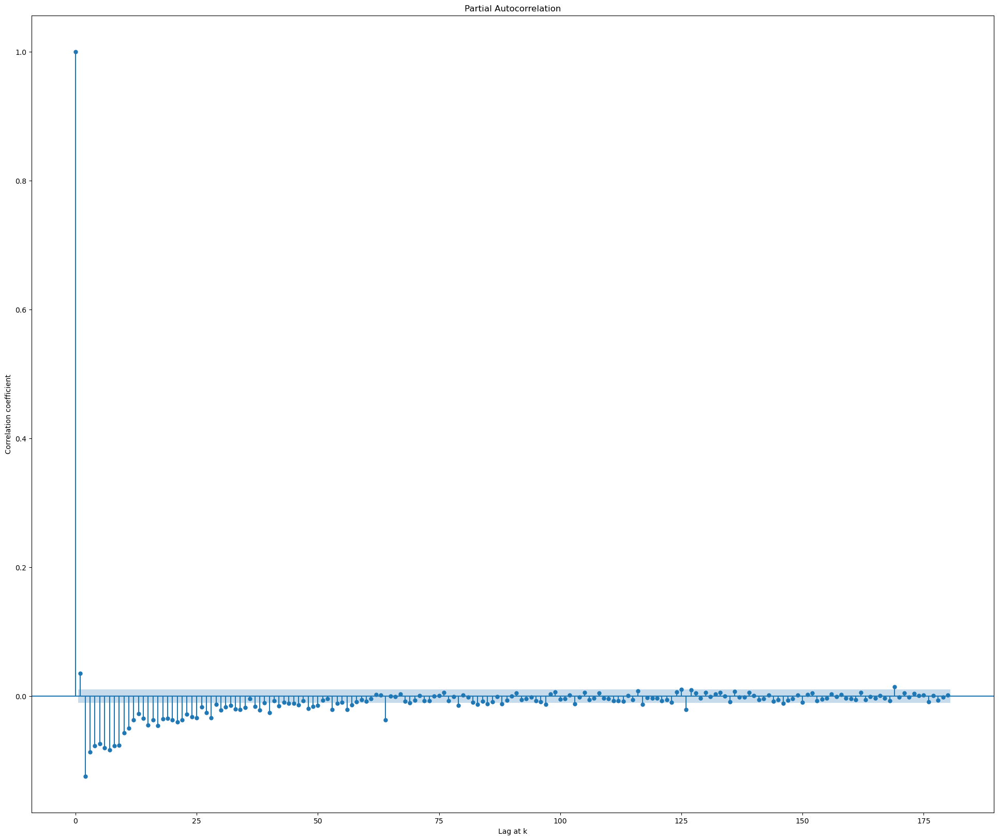

                             ARIMA Model Results                              
Dep. Variable:                D.AC 10   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -19404.415
Method:                       css-mle   S.D. of innovations              0.410
Date:                Sun, 10 Oct 2021   AIC                          38816.830
Time:                        11:46:39   BIC                          38850.875
Sample:                    08-01-2019   HQIC                         38827.650
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -3.797e-05      0.000     -0.160      0.873      -0.001       0.000
ar.L1.D.AC 10     0.6460      0.005    133.250      0.000       0.636       0.655
ma.L1.D.AC 10    -0.9607      0.002   -5

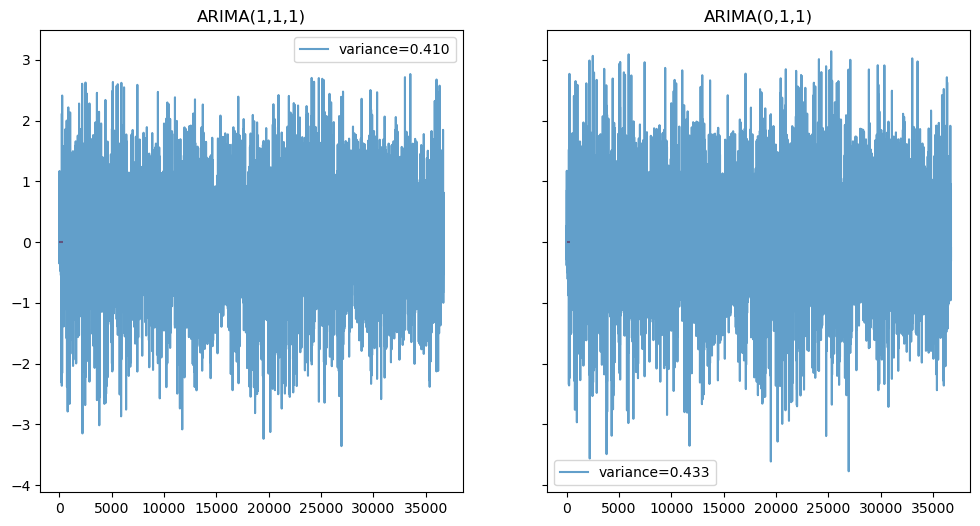

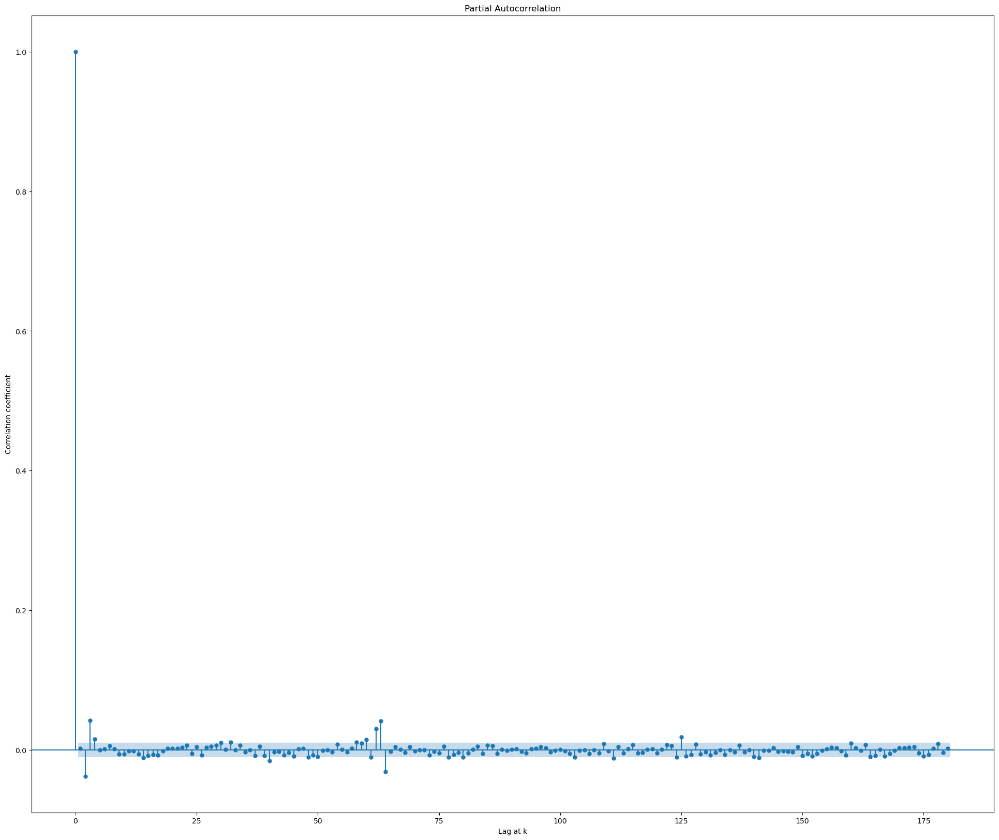

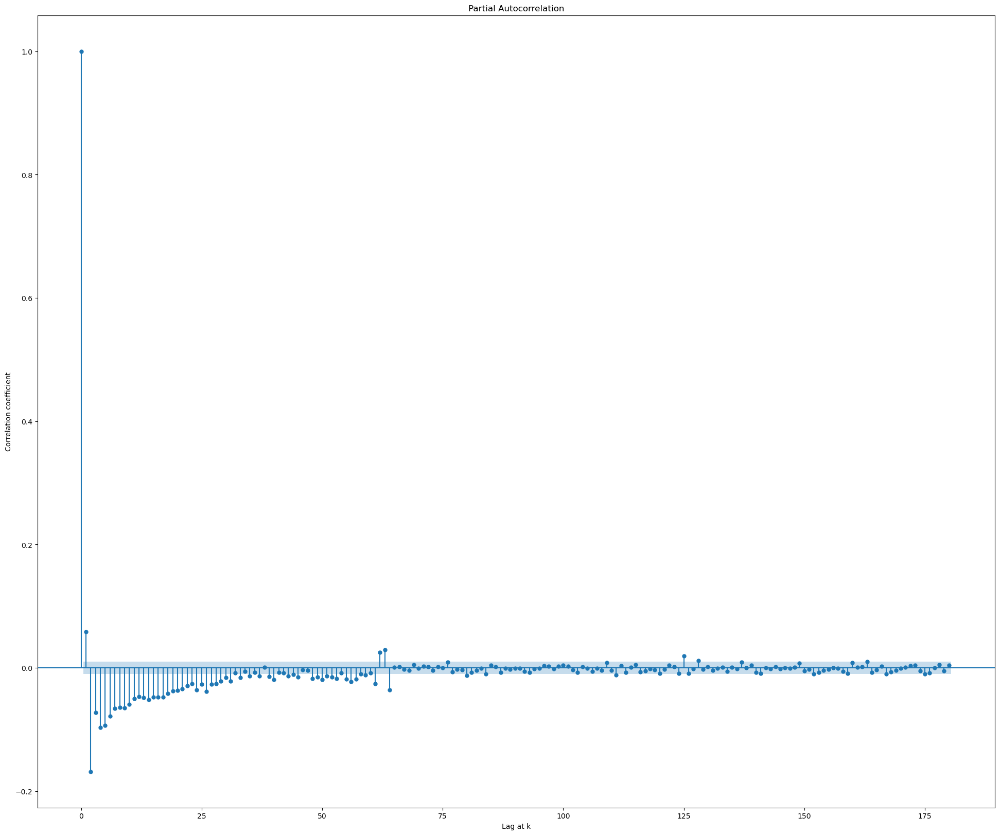

                             ARIMA Model Results                              
Dep. Variable:                D.AC 11   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -41686.133
Method:                       css-mle   S.D. of innovations              0.753
Date:                Sun, 10 Oct 2021   AIC                          83380.267
Time:                        11:48:30   BIC                          83414.311
Sample:                    08-01-2019   HQIC                         83391.086
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          3.081e-05      0.001      0.052      0.959      -0.001       0.001
ar.L1.D.AC 11     0.6766      0.005    125.802      0.000       0.666       0.687
ma.L1.D.AC 11    -0.9509      0.002   -3

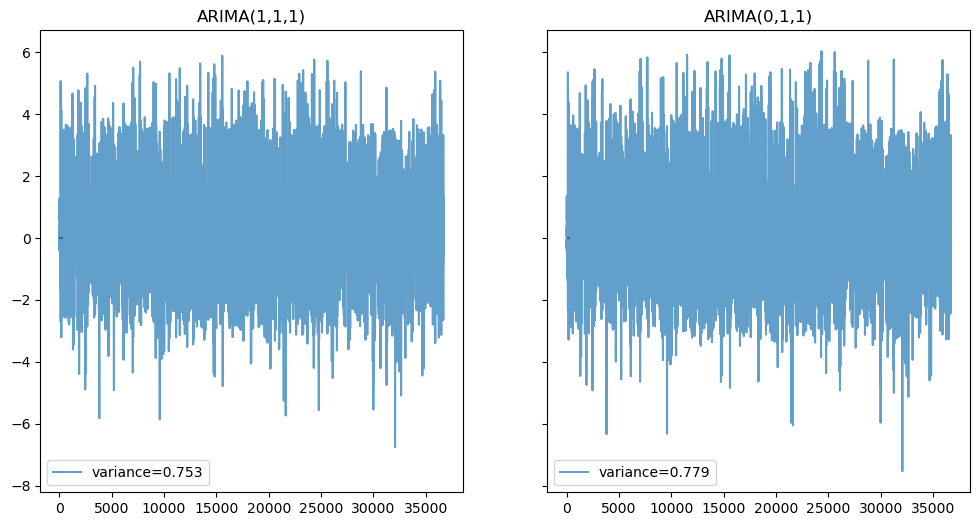

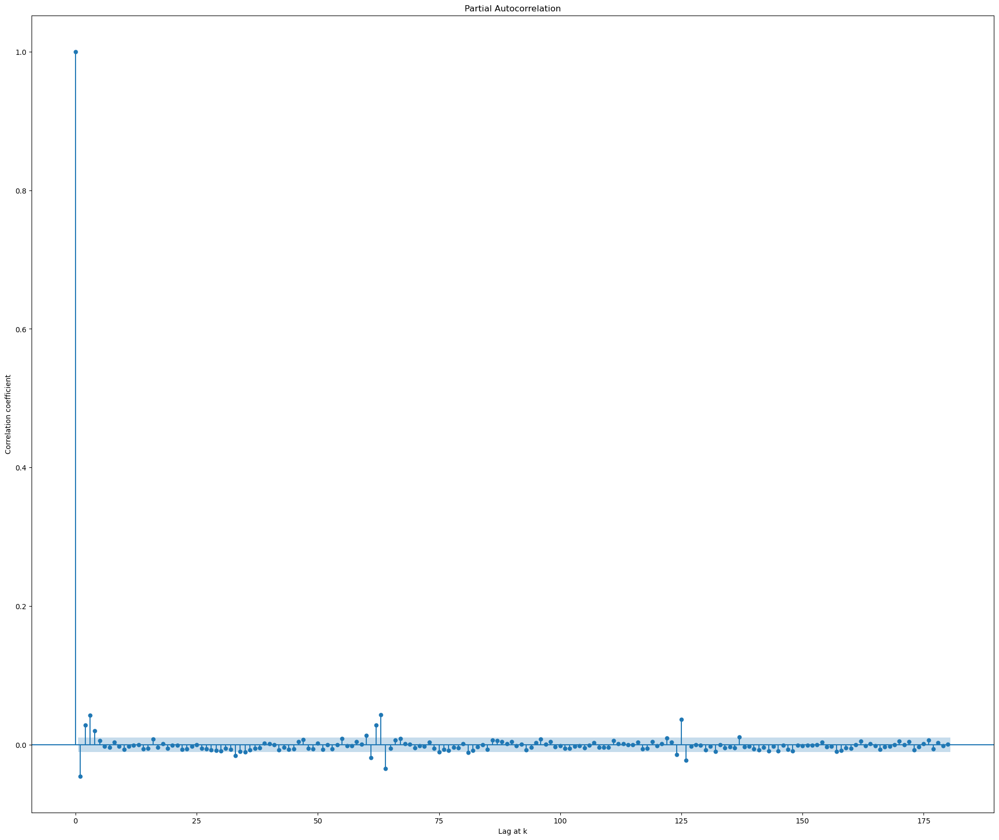

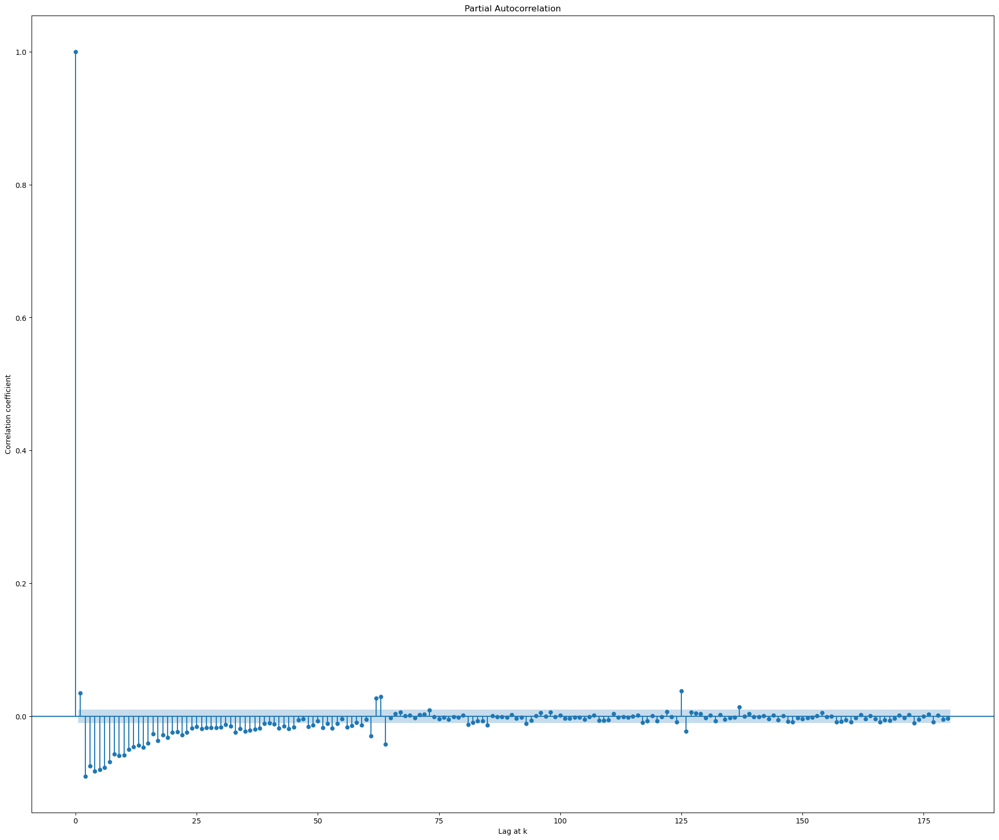

                             ARIMA Model Results                              
Dep. Variable:                D.AC 12   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -44400.365
Method:                       css-mle   S.D. of innovations              0.811
Date:                Sun, 10 Oct 2021   AIC                          88808.731
Time:                        11:50:27   BIC                          88842.775
Sample:                    08-01-2019   HQIC                         88819.550
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          4.725e-05      0.001      0.084      0.933      -0.001       0.001
ar.L1.D.AC 12     0.6607      0.005    128.476      0.000       0.651       0.671
ma.L1.D.AC 12    -0.9549      0.002   -4

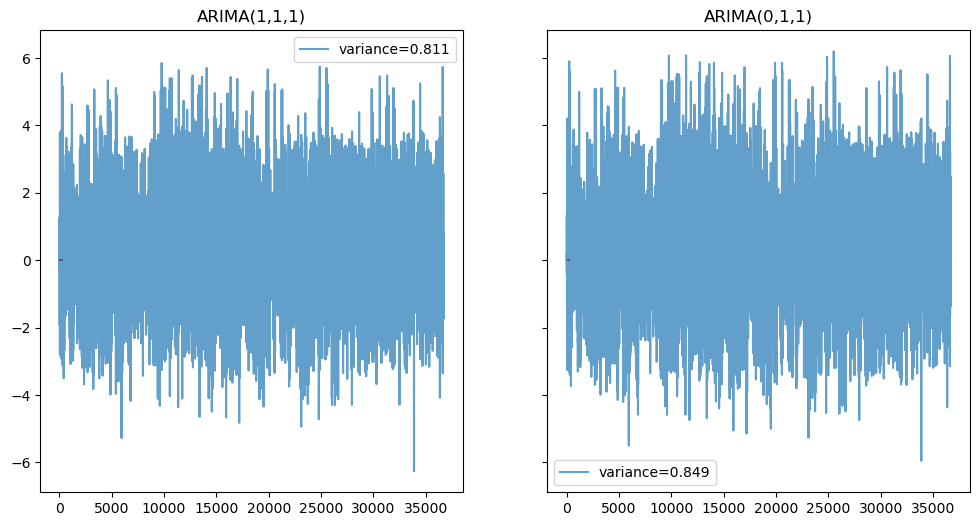

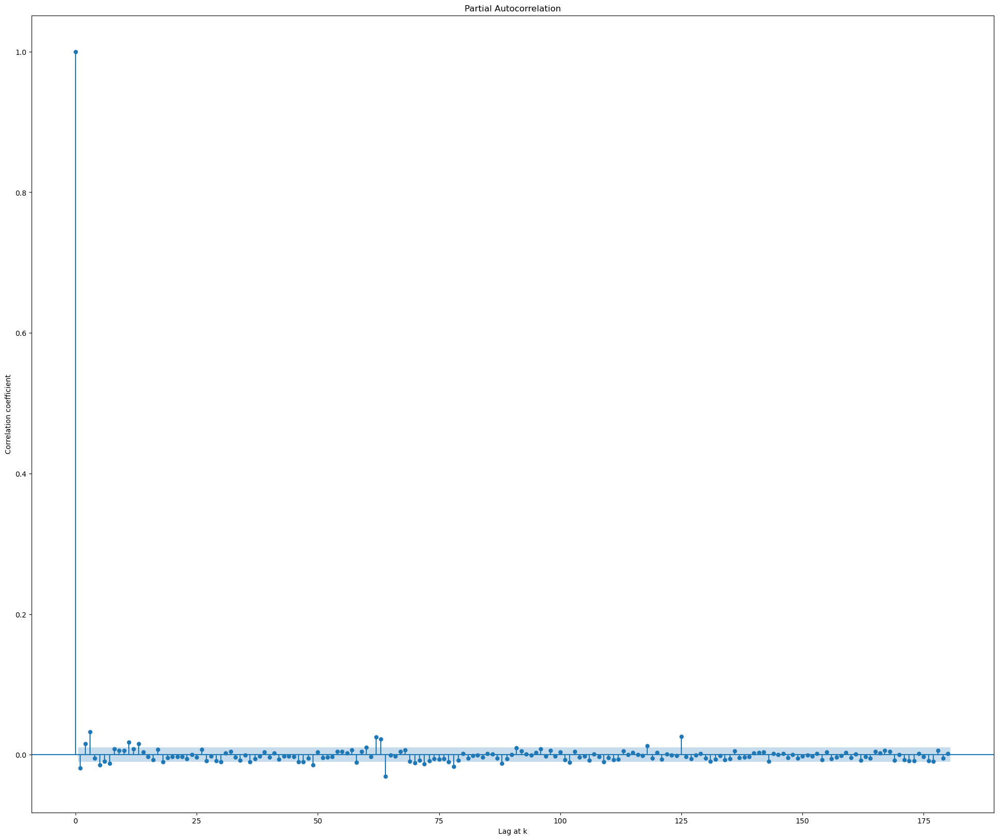

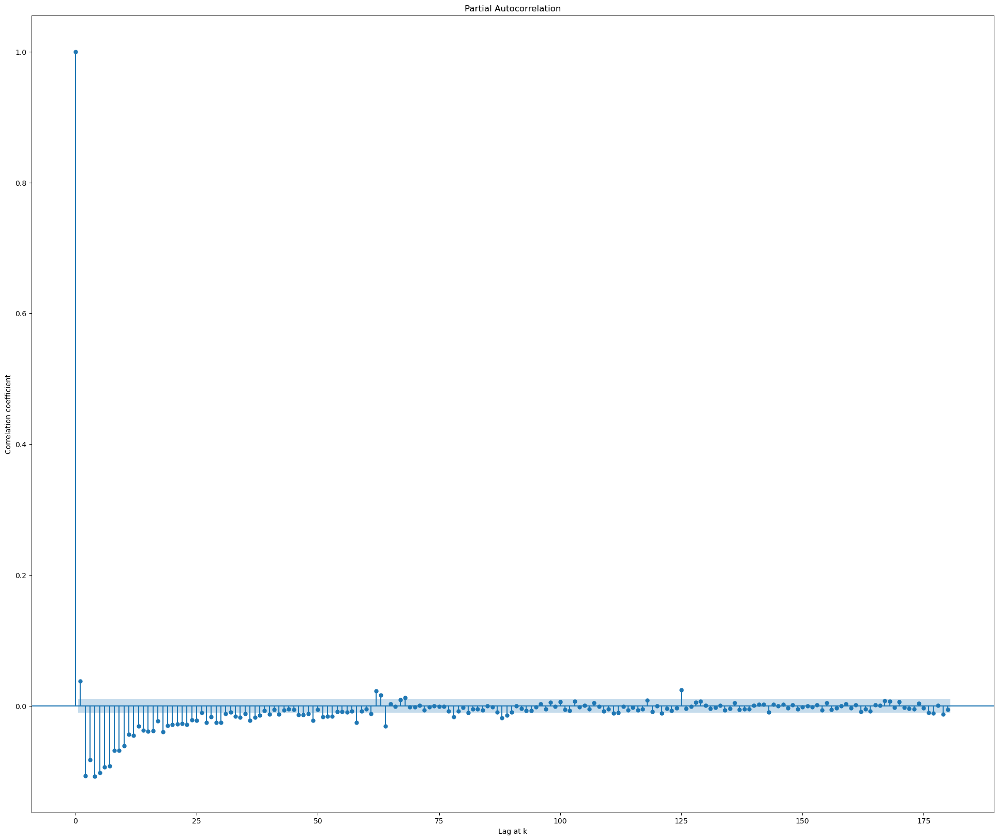

                             ARIMA Model Results                              
Dep. Variable:                D.AC 13   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -45383.134
Method:                       css-mle   S.D. of innovations              0.833
Date:                Sun, 10 Oct 2021   AIC                          90774.269
Time:                        11:52:21   BIC                          90808.313
Sample:                    08-01-2019   HQIC                         90785.088
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          6.186e-06      0.001      0.008      0.994      -0.002       0.002
ar.L1.D.AC 13     0.7491      0.005    146.307      0.000       0.739       0.759
ma.L1.D.AC 13    -0.9550      0.002   -3

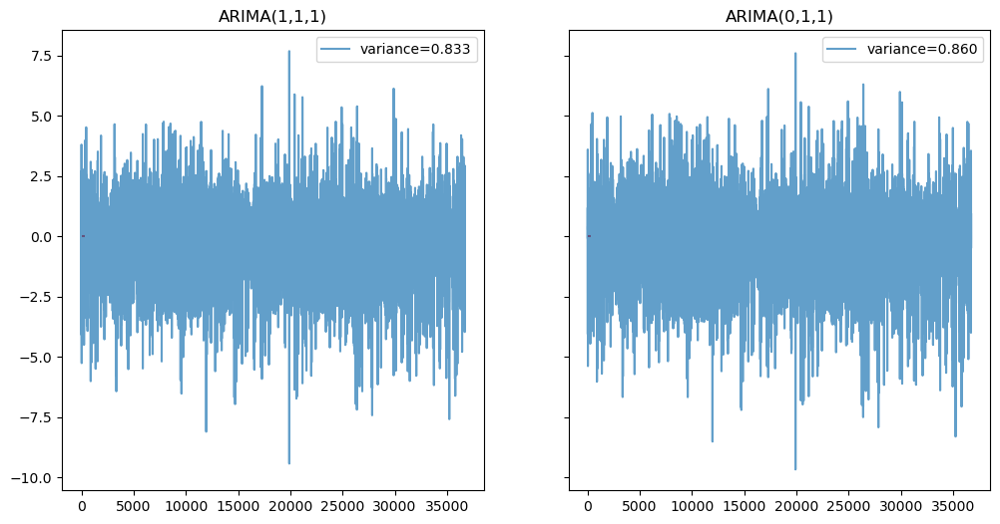

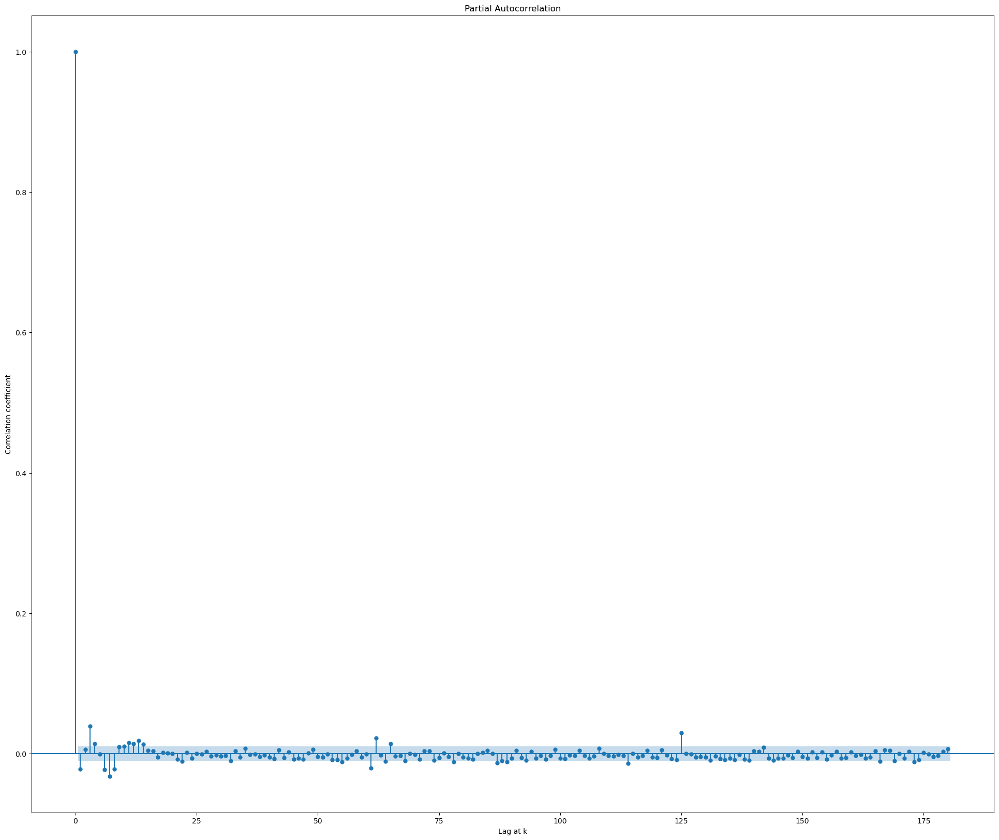

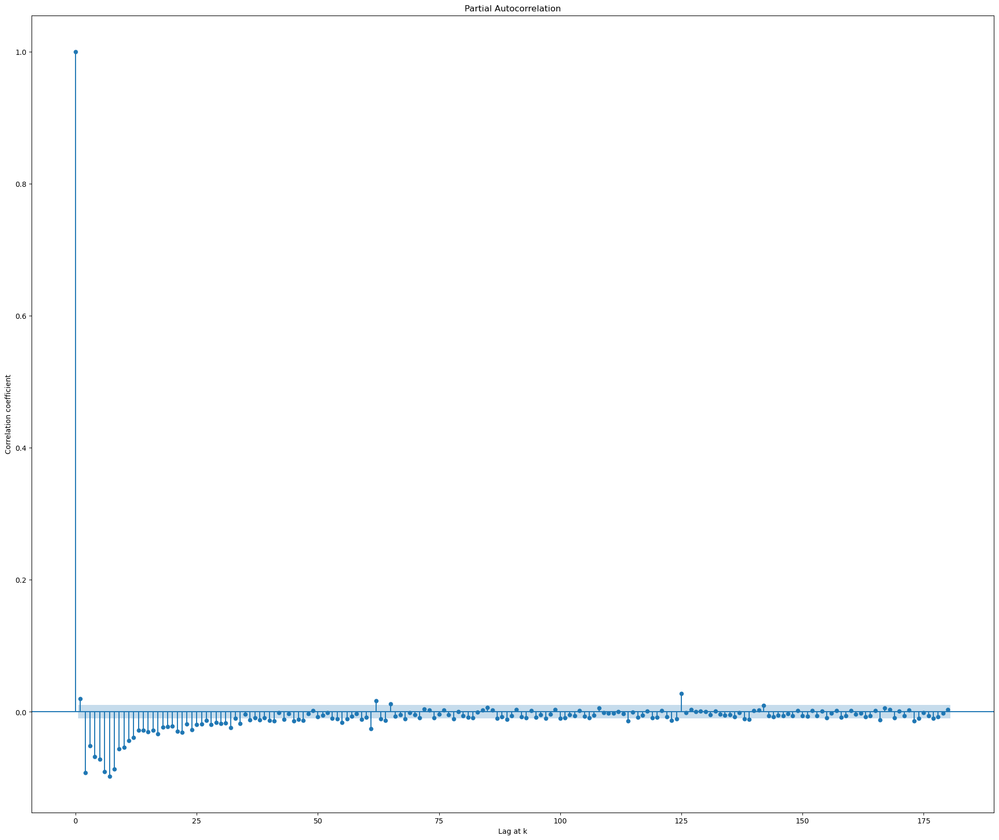

                             ARIMA Model Results                              
Dep. Variable:                D.AC 14   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -35598.194
Method:                       css-mle   S.D. of innovations              0.638
Date:                Sun, 10 Oct 2021   AIC                          71204.388
Time:                        11:54:17   BIC                          71238.432
Sample:                    08-01-2019   HQIC                         71215.207
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -1.513e-05      0.001     -0.019      0.985      -0.002       0.002
ar.L1.D.AC 14     0.6147      0.007     83.594      0.000       0.600       0.629
ma.L1.D.AC 14    -0.9058      0.004   -2

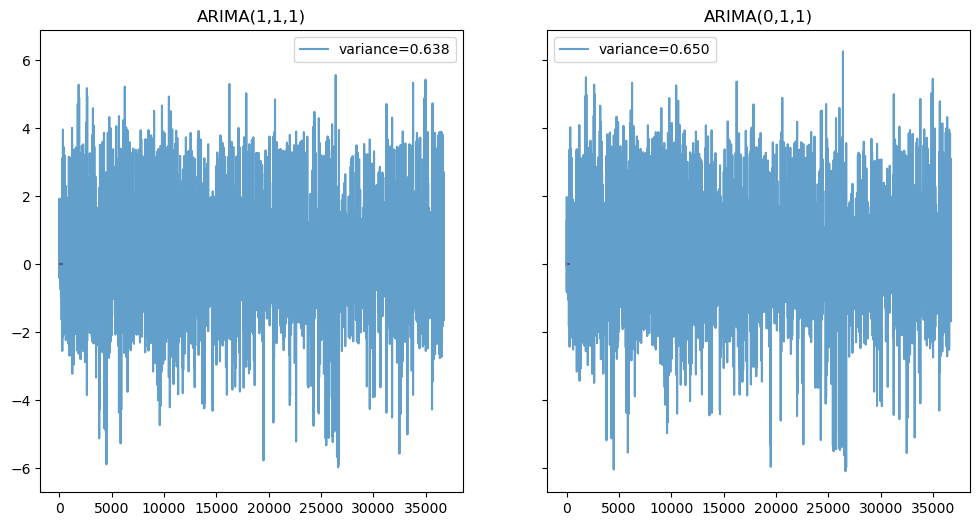

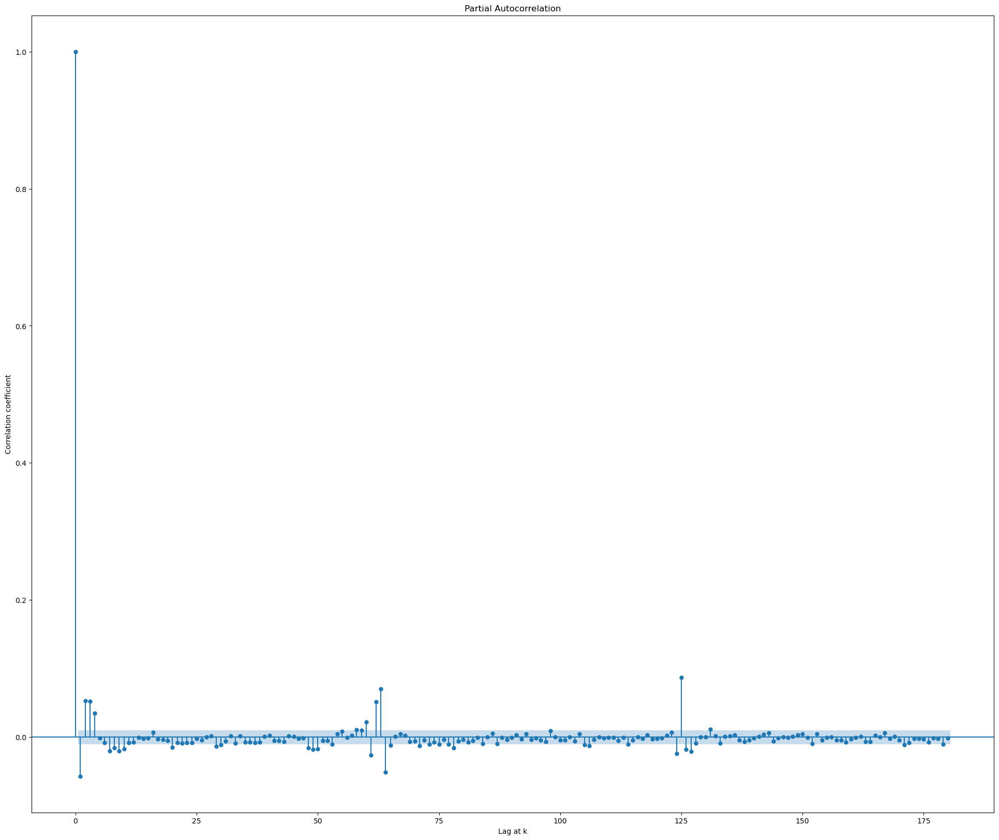

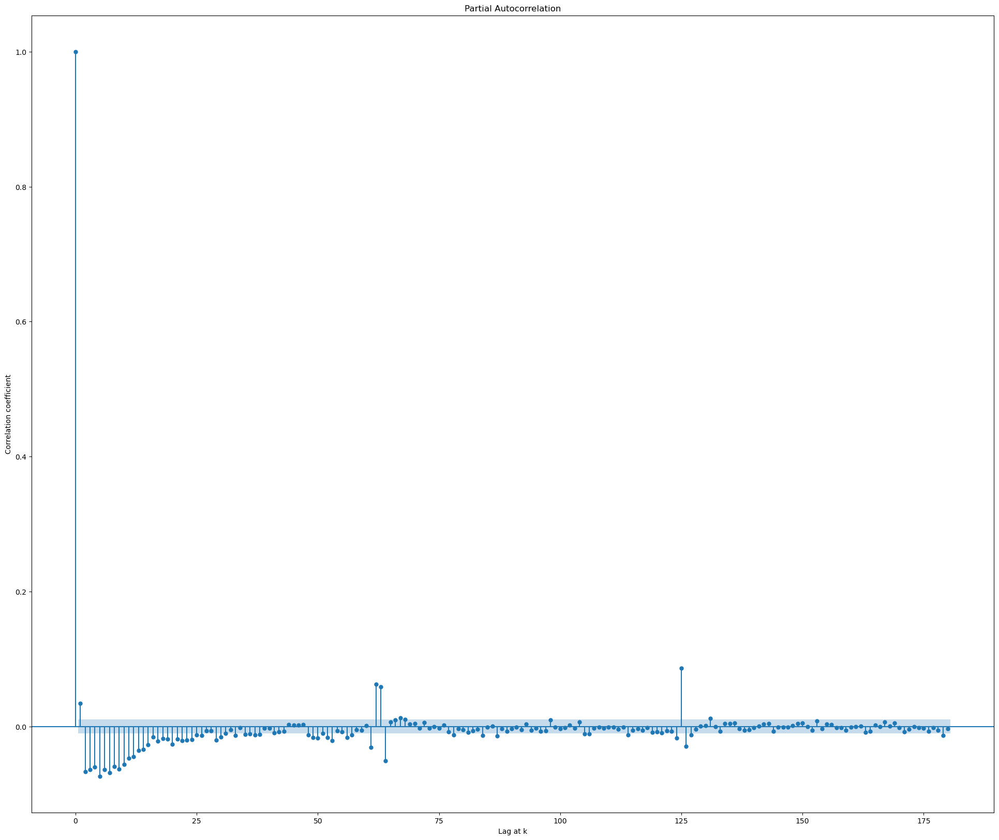

                             ARIMA Model Results                              
Dep. Variable:                D.AC 15   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -45569.998
Method:                       css-mle   S.D. of innovations              0.837
Date:                Sun, 10 Oct 2021   AIC                          91147.996
Time:                        11:56:10   BIC                          91182.040
Sample:                    08-01-2019   HQIC                         91158.815
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -2.652e-05      0.001     -0.032      0.974      -0.002       0.002
ar.L1.D.AC 15     0.7002      0.006    124.477      0.000       0.689       0.711
ma.L1.D.AC 15    -0.9432      0.003   -3

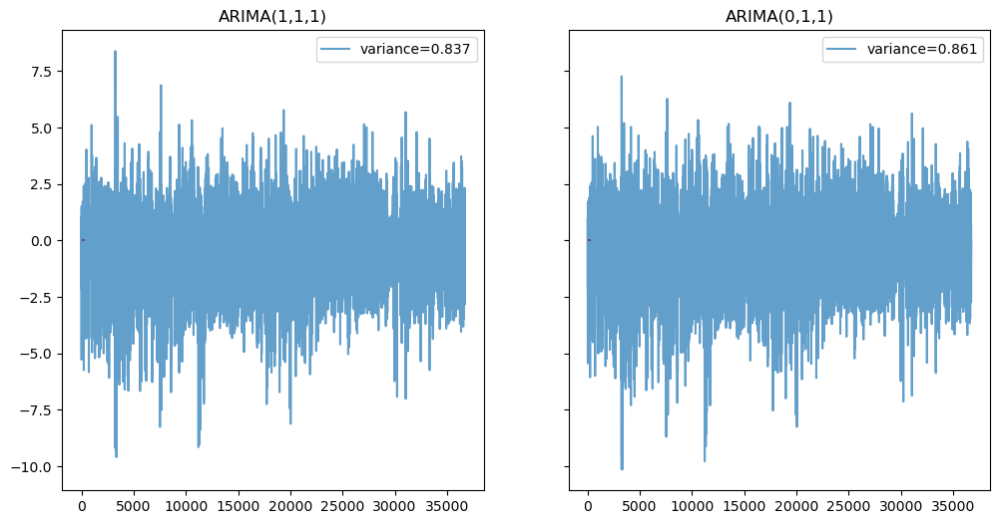

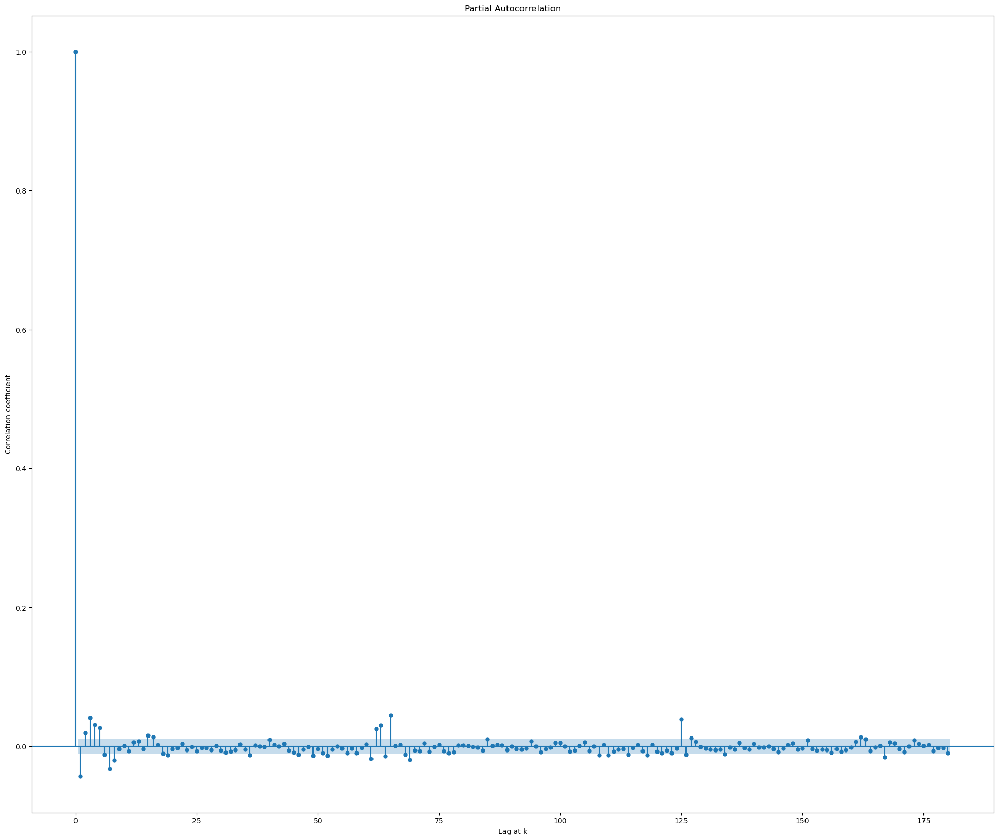

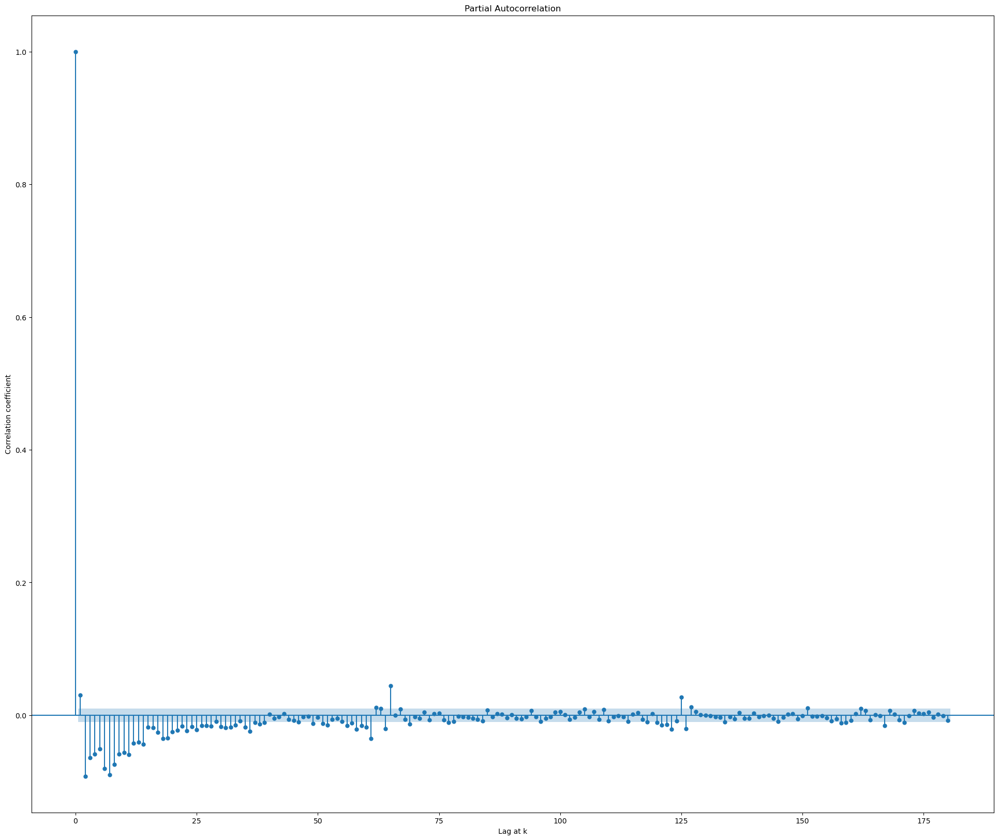

                             ARIMA Model Results                              
Dep. Variable:                D.AC 16   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -45519.019
Method:                       css-mle   S.D. of innovations              0.836
Date:                Sun, 10 Oct 2021   AIC                          91046.039
Time:                        11:57:53   BIC                          91080.083
Sample:                    08-01-2019   HQIC                         91056.858
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -5.021e-05      0.001     -0.092      0.927      -0.001       0.001
ar.L1.D.AC 16     0.6310      0.005    125.660      0.000       0.621       0.641
ma.L1.D.AC 16    -0.9537      0.002   -4

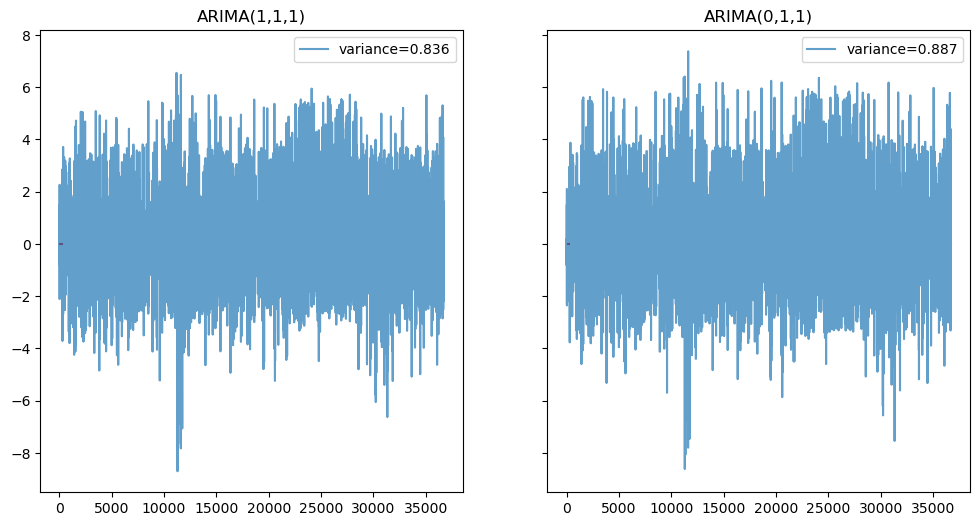

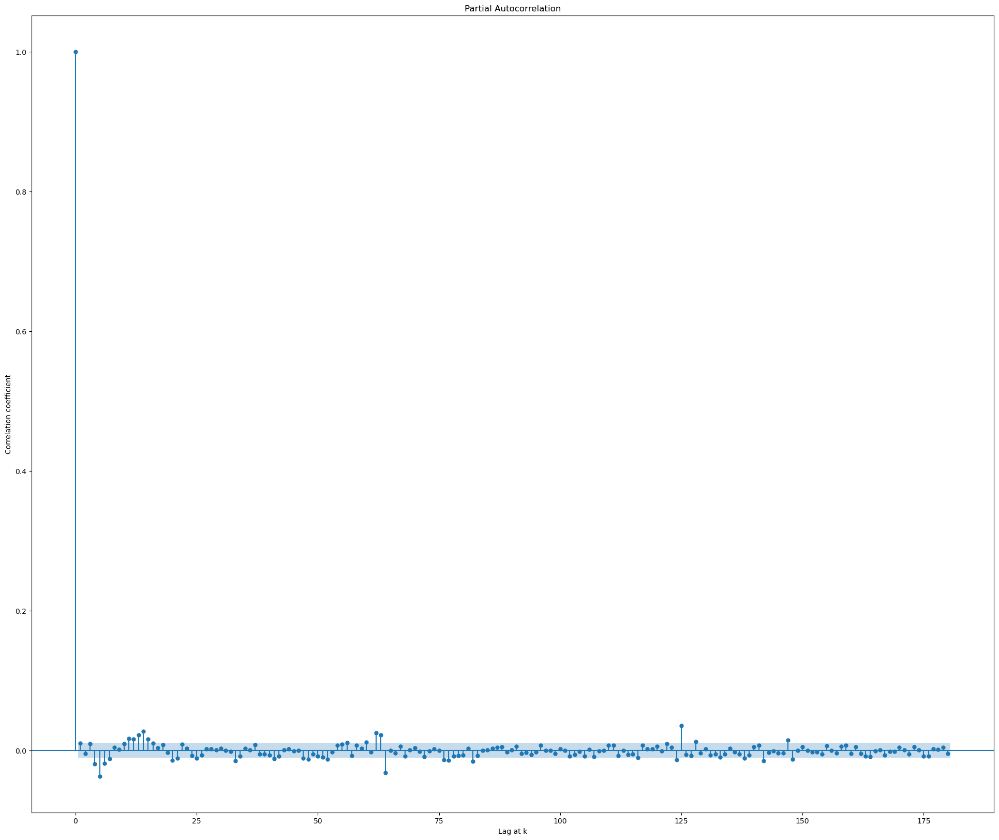

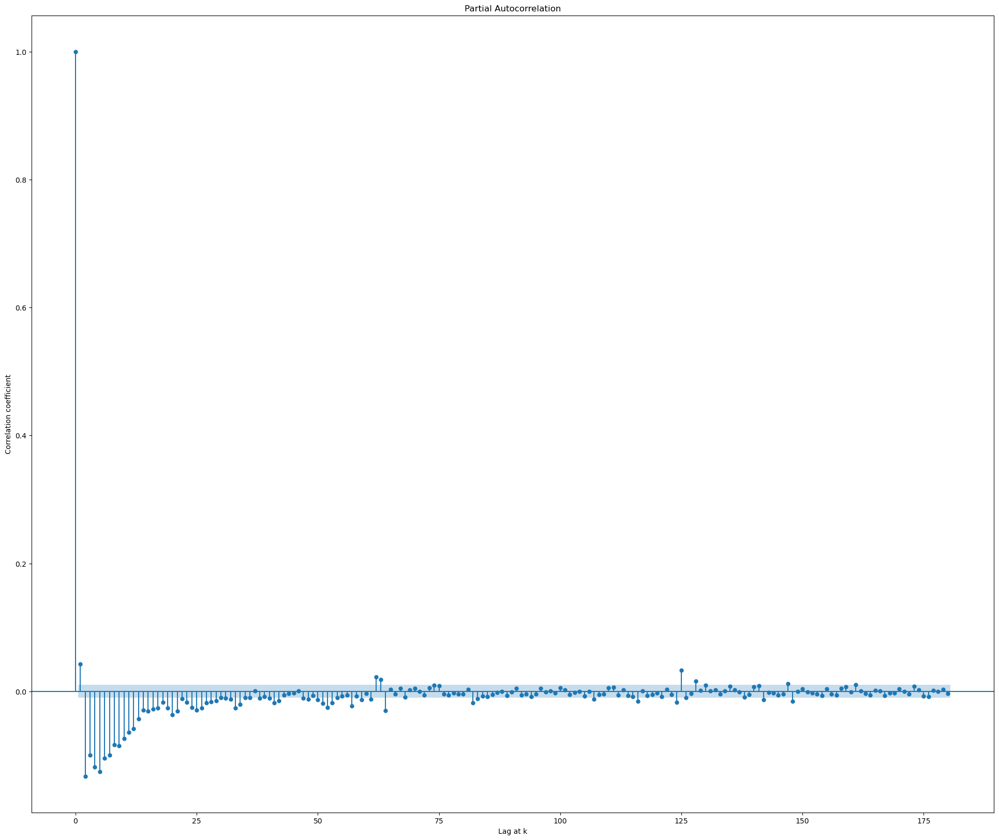

                             ARIMA Model Results                              
Dep. Variable:                D.AC 17   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -27140.021
Method:                       css-mle   S.D. of innovations              0.507
Date:                Sun, 10 Oct 2021   AIC                          54288.042
Time:                        11:59:47   BIC                          54322.086
Sample:                    08-01-2019   HQIC                         54298.861
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          8.836e-07      0.001      0.001      0.999      -0.002       0.002
ar.L1.D.AC 17     0.6346      0.010     63.178      0.000       0.615       0.654
ma.L1.D.AC 17    -0.8801      0.007   -1

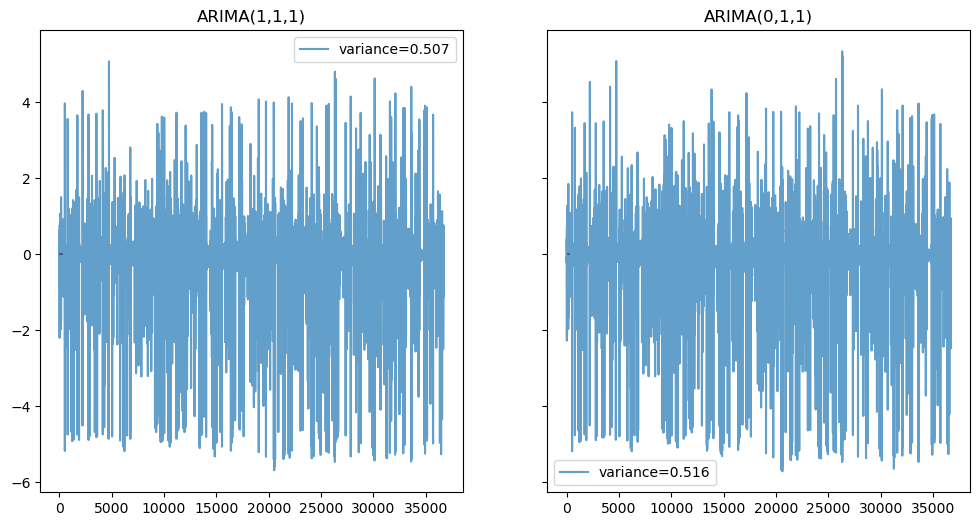

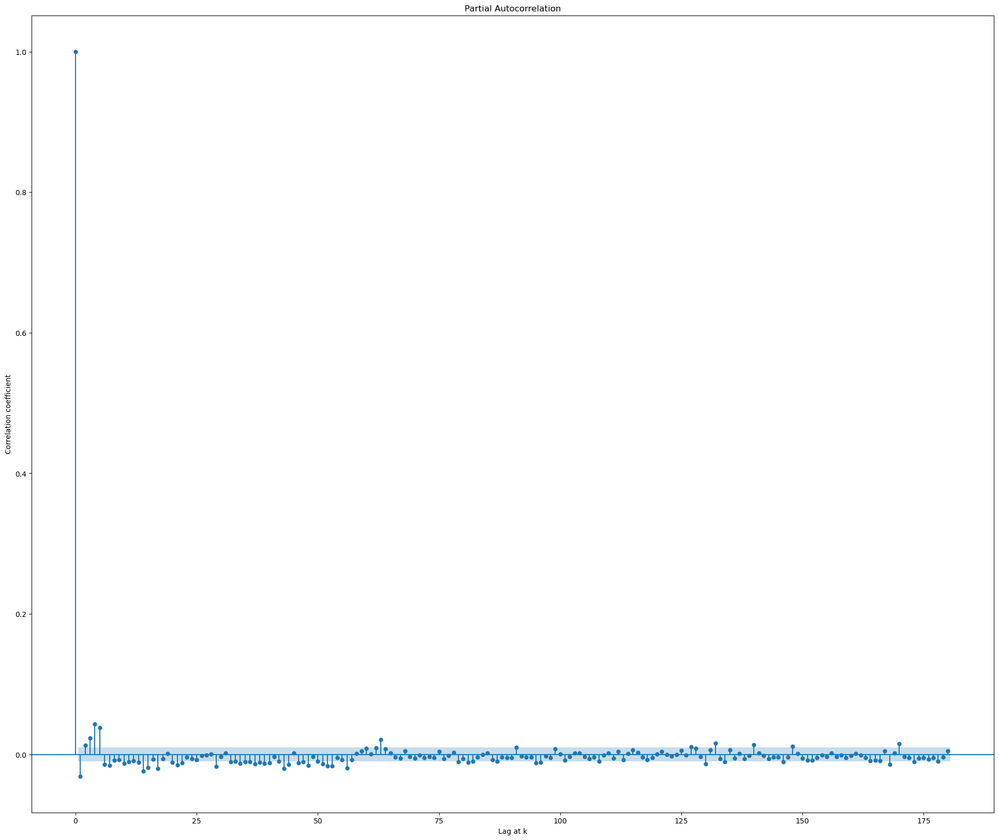

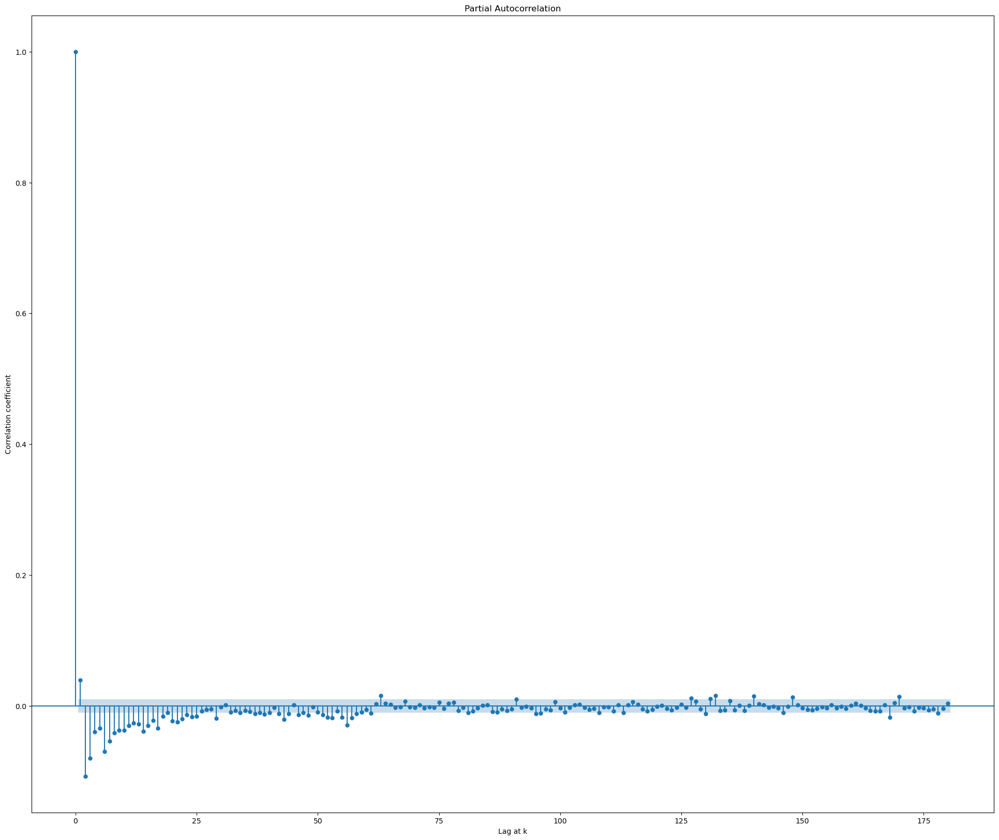

                             ARIMA Model Results                              
Dep. Variable:                D.AC 18   No. Observations:                36719
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -41622.341
Method:                       css-mle   S.D. of innovations              0.752
Date:                Sun, 10 Oct 2021   AIC                          83252.683
Time:                        12:01:58   BIC                          83286.727
Sample:                    08-01-2019   HQIC                         83263.502
                         - 09-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -6.132e-05      0.002     -0.037      0.971      -0.003       0.003
ar.L1.D.AC 18     0.7262      0.010     74.925      0.000       0.707       0.745
ma.L1.D.AC 18    -0.8840      0.007   -1

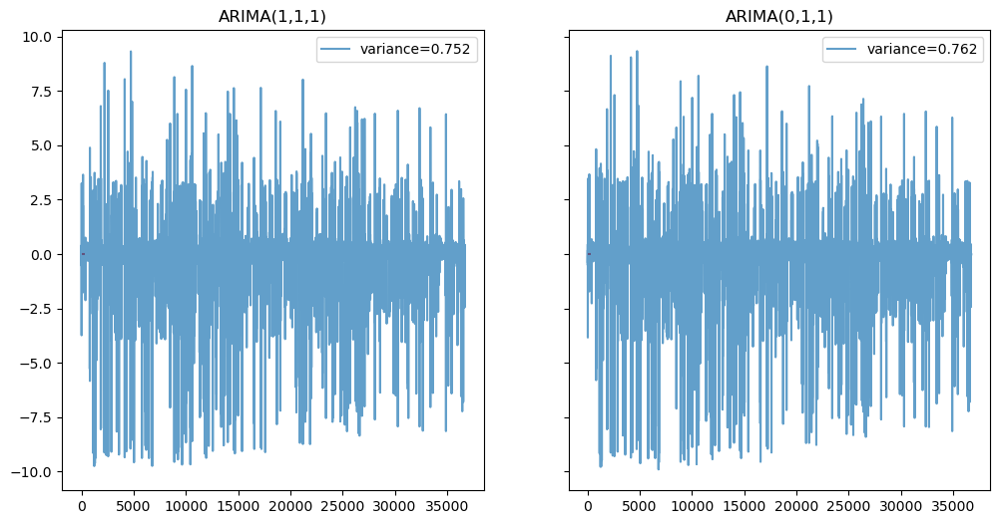

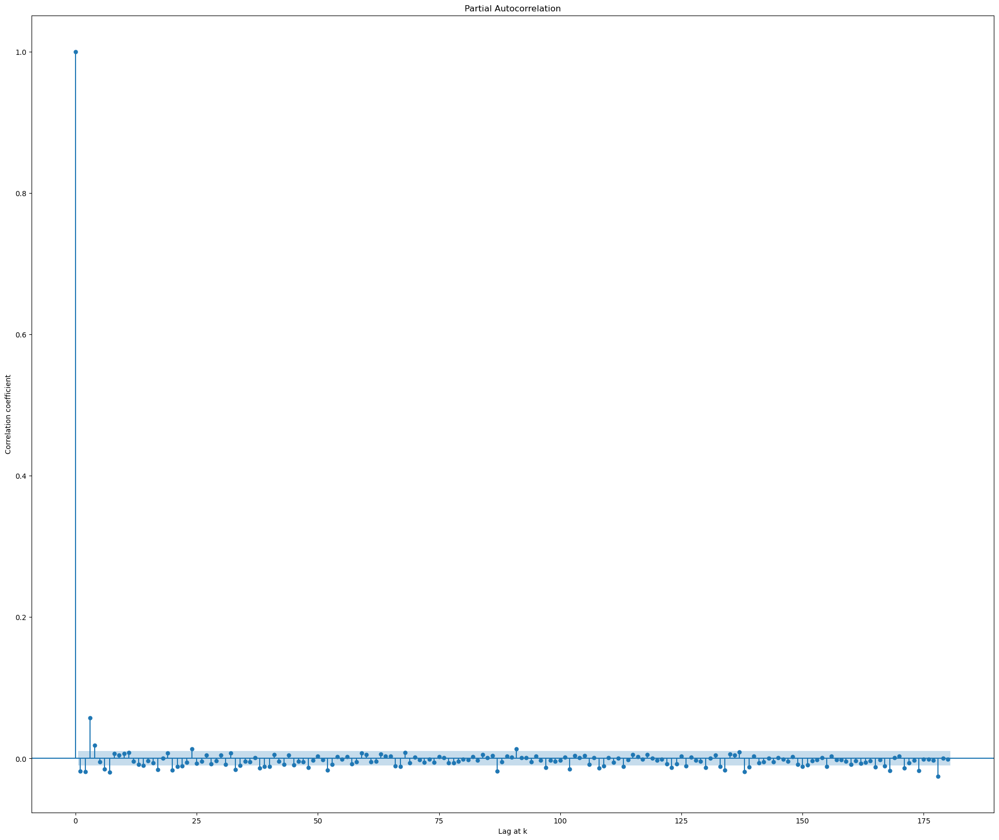

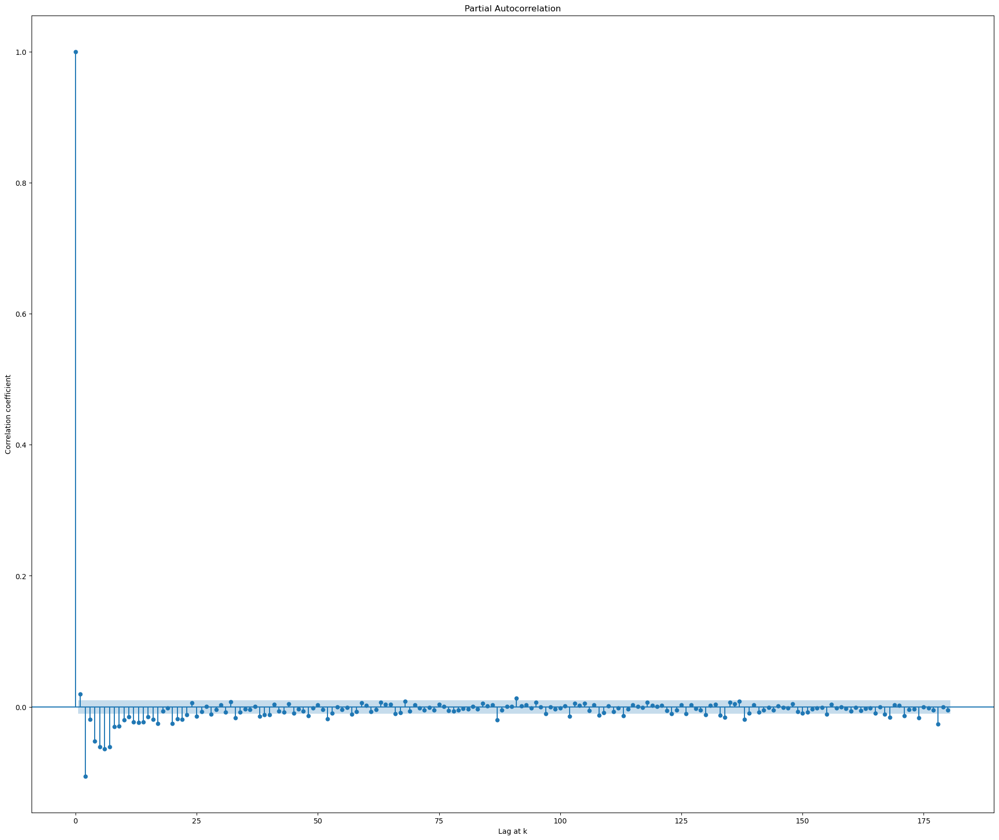

In [22]:
from statsmodels.tsa.arima_model import ARIMA

res_111 = {}
res_011 = {}

for name in train.columns.values.tolist():
    model = ARIMA(train[name], (1, 1, 1))
    res_111[name] = model.fit()
    print(res_111[name].summary())

    model = ARIMA(train[name], (0, 1, 1))
    res_011[name] = model.fit()
    print(res_011[name].summary())

    fig, ax = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
    ax[0].plot(res_111[name].resid.values, alpha=0.7, label='variance={:.3f}'.format(np.std(res_111[name].resid.values)))
    ax[0].hlines(0, xmin=0, xmax=350, color='r')
    ax[0].set_title("ARIMA(1,1,1)")
    ax[0].legend()
    ax[1].plot(res_011[name].resid.values, alpha=0.7, label='variance={:.3f}'.format(np.std(res_011[name].resid.values)))
    ax[1].hlines(0, xmin=0, xmax=350, color='r')
    ax[1].set_title("ARIMA(0,1,1)")
    ax[1].legend()
    plt.show()
    
    fig = tsaplots.plot_pacf(res_111[name].resid.values, lags=180)
    plt.xlabel("Lag at k")
    plt.ylabel("Correlation coefficient")
    plt.show()
    
    fig = tsaplots.plot_pacf(res_011[name].resid.values, lags=180)
    plt.xlabel("Lag at k")
    plt.ylabel("Correlation coefficient")
    plt.show()

Here, as you can see, our ARIMA model performs worse that Holt's seasonal Exponential Smoothing. A reason for this can be seasonality, which I have worked on by using SARIMA, also used the different optimized models for each univariate series (If one was to take a gander at the PACF plot for ARIMA(1, 1, 1) residuals, they will notice that for a few like AC 10 we need to add another AR term, i.e, AR=2 or 3), but it did not perform better than Holt's Seasonal Exponential Smoothing.

### FE/RE Model for Panel Data

Let us start with pooledOLS and a check for homoskedasticity and non-autocorrelation to check whether simple linear regression models can work or not. (White test and Breusch pagan test for homoskedaticity & Durbin-Watson for Autocorrelation)

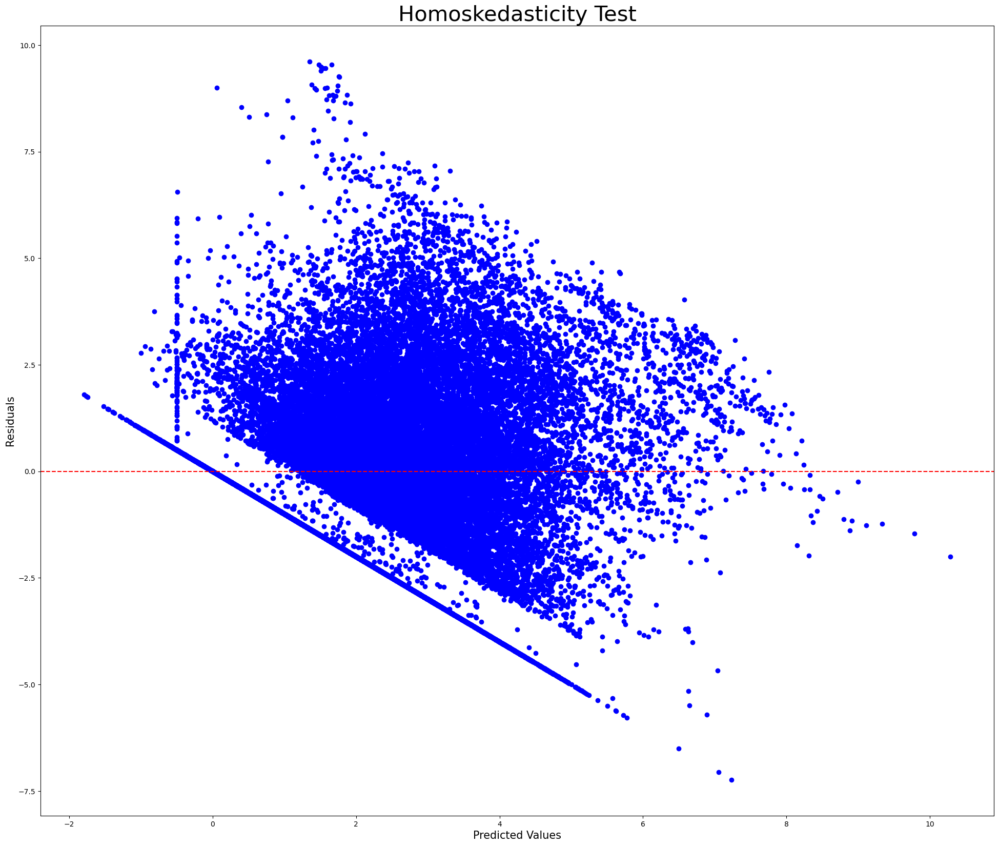

{'LM-Stat': 5968.47128554135, 'LM p-val': 0.0, 'F-Stat': 41.727773886333914, 'F p-val': 0.0}
{'LM-Stat': 1953.809633846482, 'LM p-val': 0.0, 'F-Stat': 121.32955680933684, 'F p-val': 0.0}
0.22863634349005094


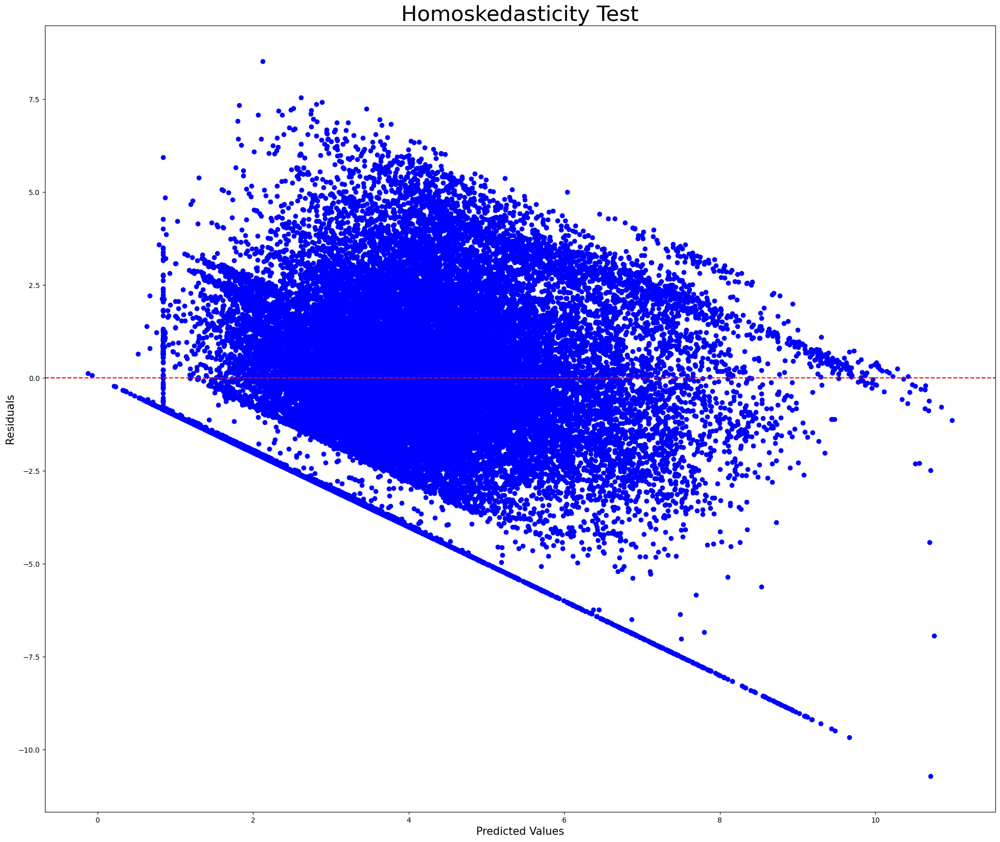

{'LM-Stat': 6692.706817985946, 'LM p-val': 0.0, 'F-Stat': 47.91977549202079, 'F p-val': 0.0}
{'LM-Stat': 1970.2261816664552, 'LM p-val': 0.0, 'F-Stat': 122.4068094356248, 'F p-val': 0.0}
0.24788659788763084


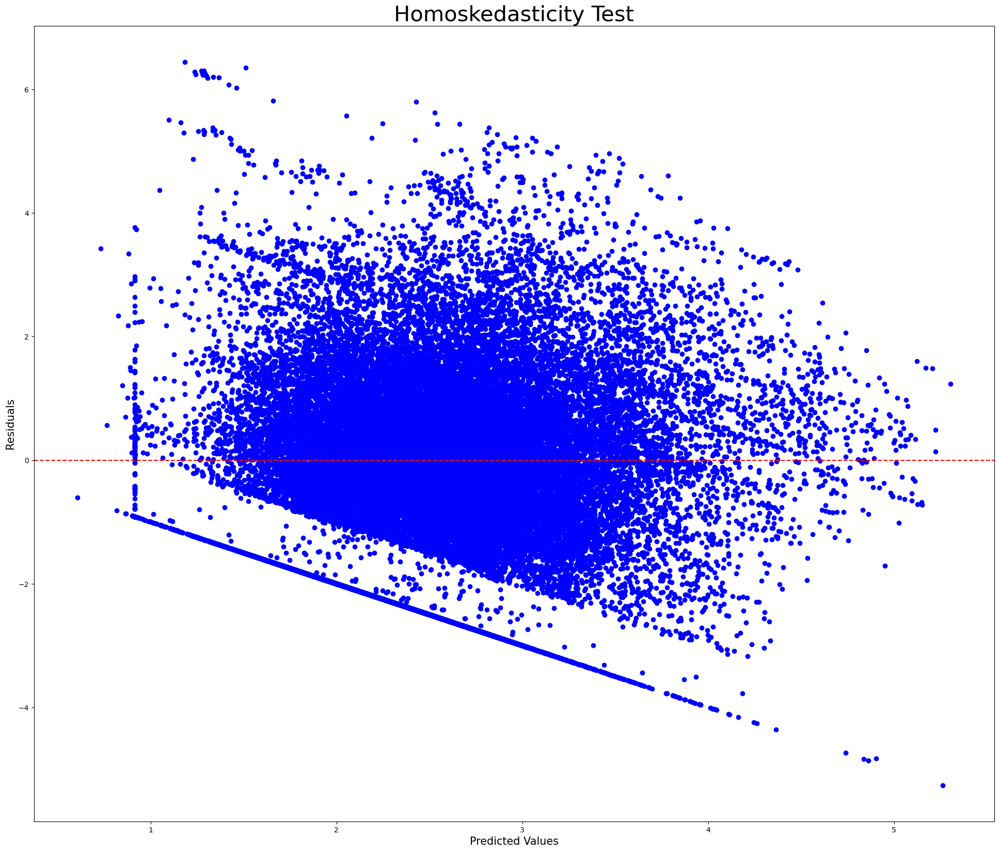

{'LM-Stat': 4242.339623135436, 'LM p-val': 0.0, 'F-Stat': 28.083340420861745, 'F p-val': 0.0}
{'LM-Stat': 1014.5105749420121, 'LM p-val': 7.084174092171913e-205, 'F-Stat': 61.342677416285596, 'F p-val': 7.214814532113117e-208}
0.30597687190994194


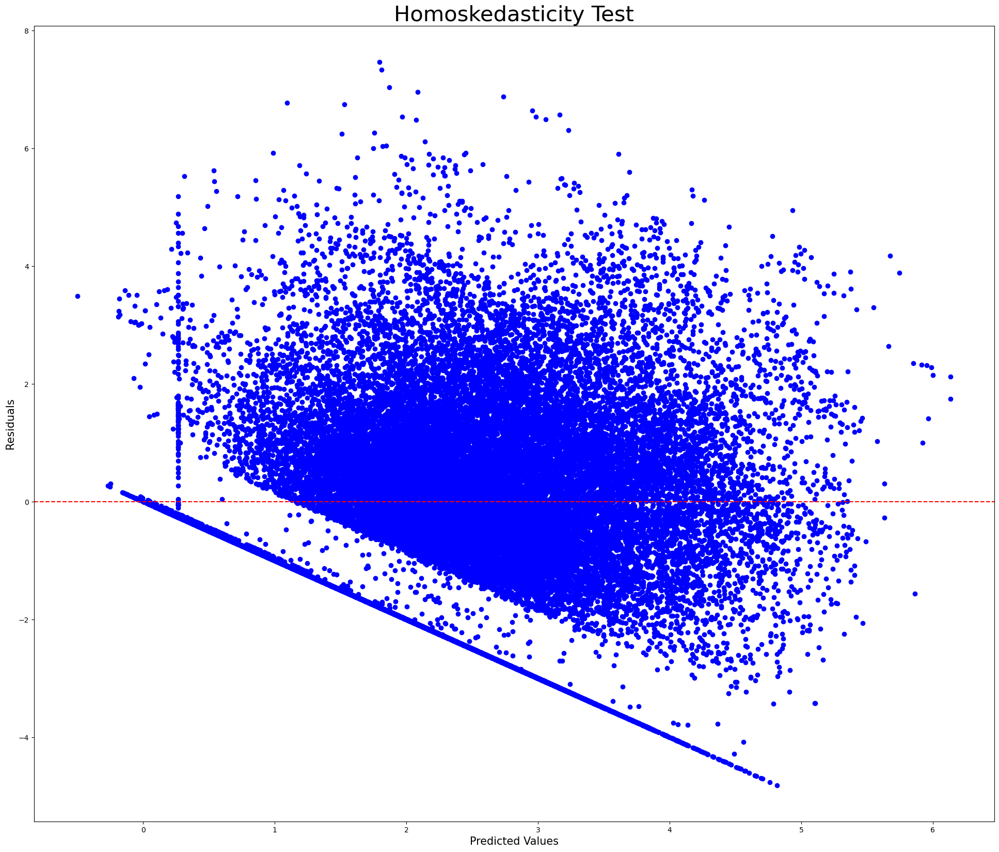

{'LM-Stat': 4745.837789570538, 'LM p-val': 0.0, 'F-Stat': 31.911116099710963, 'F p-val': 0.0}
{'LM-Stat': 1622.061679078317, 'LM p-val': 0.0, 'F-Stat': 99.77623410691717, 'F p-val': 0.0}
0.30752432560852394


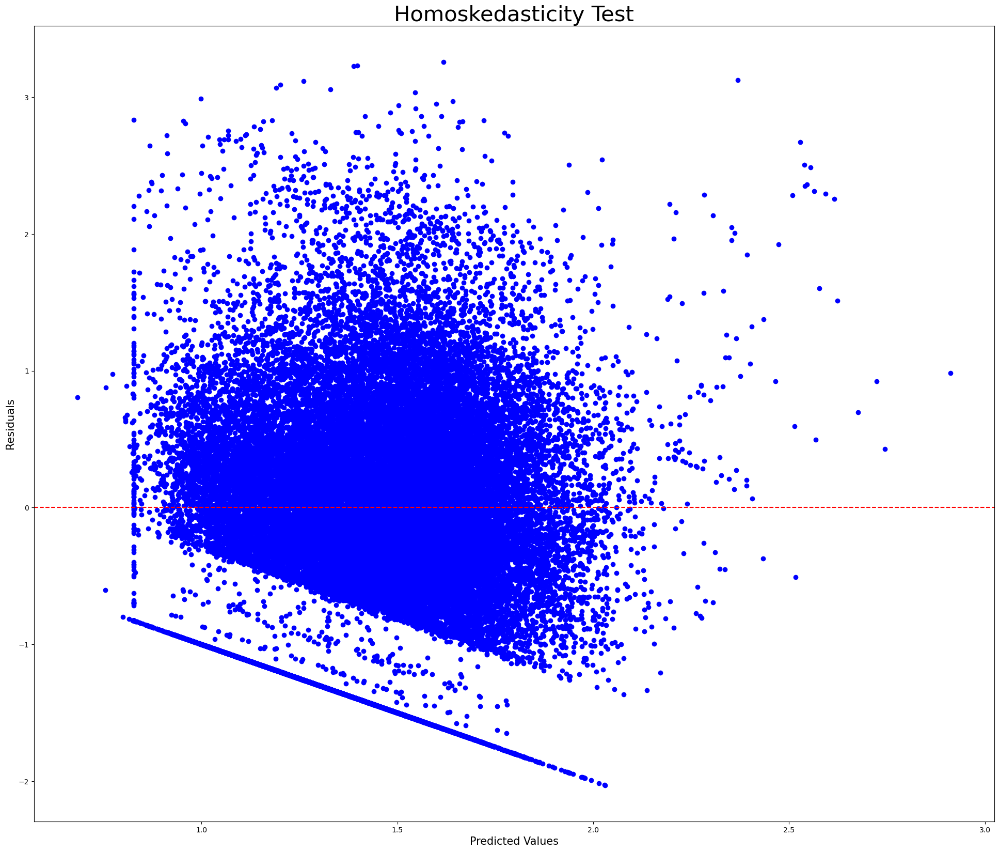

{'LM-Stat': 1549.630569453396, 'LM p-val': 5.296884465860776e-221, 'F-Stat': 9.472798258226458, 'F p-val': 8.525621084954756e-227}
{'LM-Stat': 368.103362177235, 'LM p-val': 8.417623860992121e-68, 'F-Stat': 21.86168502473399, 'F p-val': 3.632435522414806e-68}
0.5503682840983208


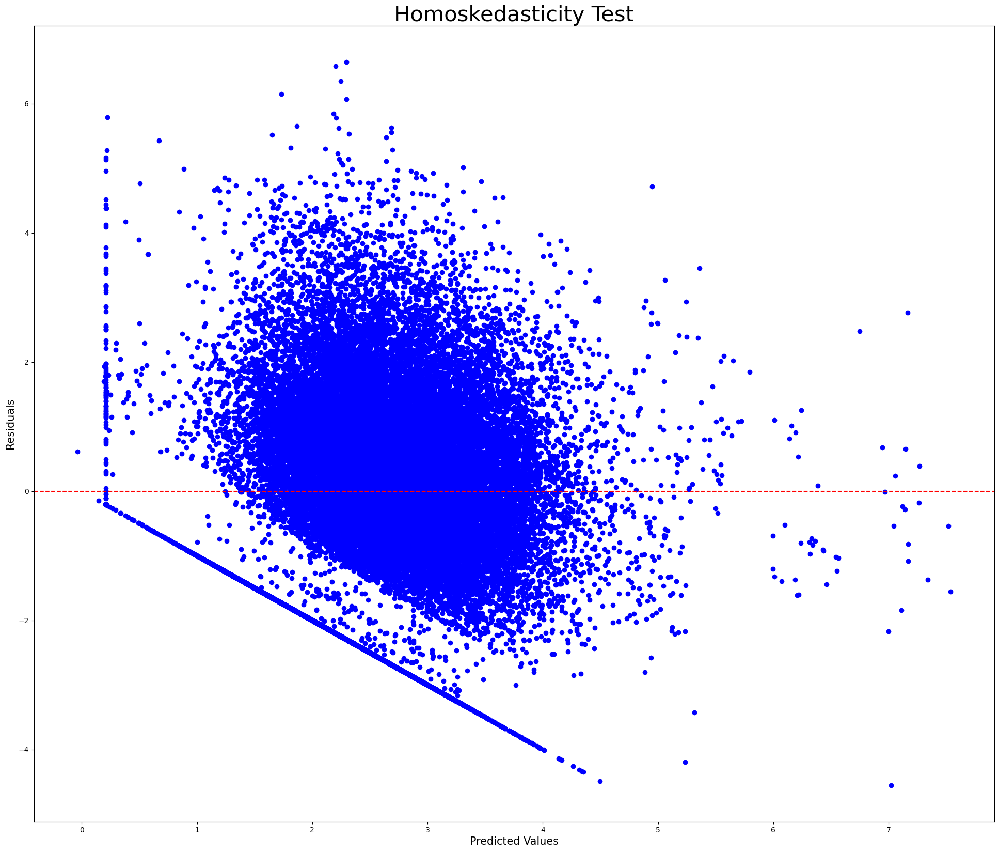

{'LM-Stat': 1508.5775087424101, 'LM p-val': 4.5764443756670244e-213, 'F-Stat': 9.211091303702894, 'F p-val': 1.6265961453706905e-218}
{'LM-Stat': 520.1319482350985, 'LM p-val': 1.0798737640600803e-99, 'F-Stat': 31.020408777420887, 'F p-val': 1.9078136514175588e-100}
0.4395101463969176


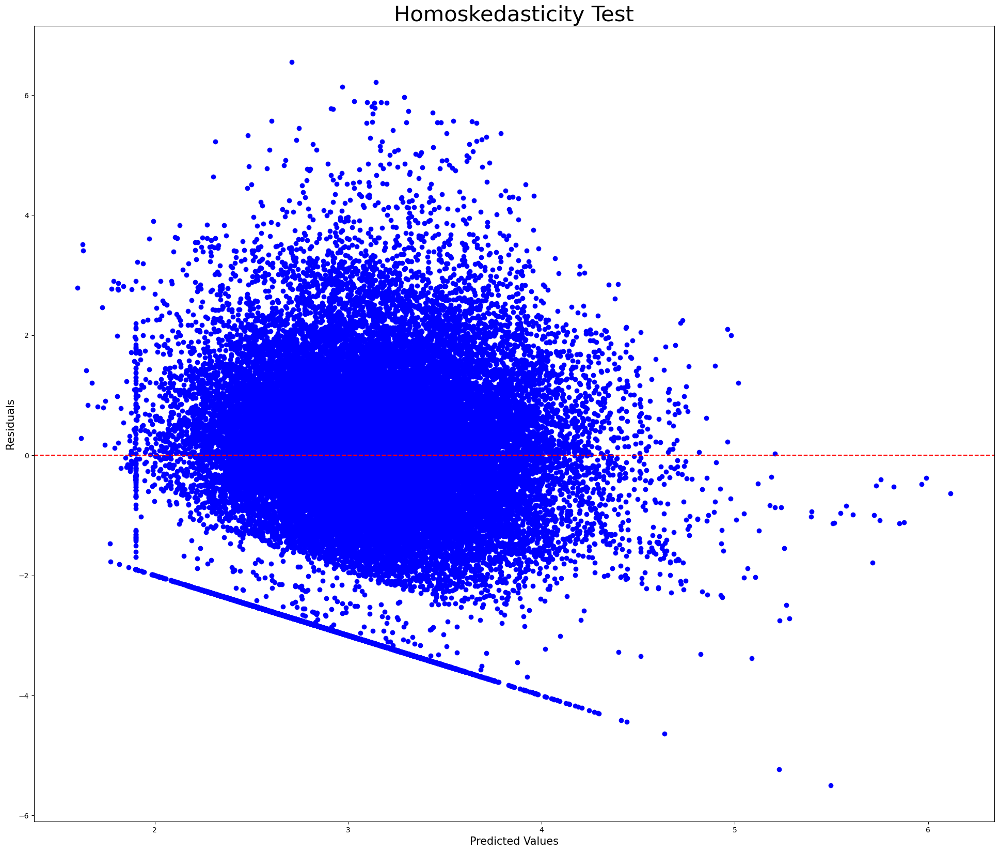

{'LM-Stat': 2162.4301333410713, 'LM p-val': 0.0, 'F-Stat': 13.453217148220636, 'F p-val': 0.0}
{'LM-Stat': 379.6913410056972, 'LM p-val': 3.2306687555420866e-70, 'F-Stat': 22.55708668961936, 'F p-val': 1.3172272884298598e-70}
0.4383592911584576


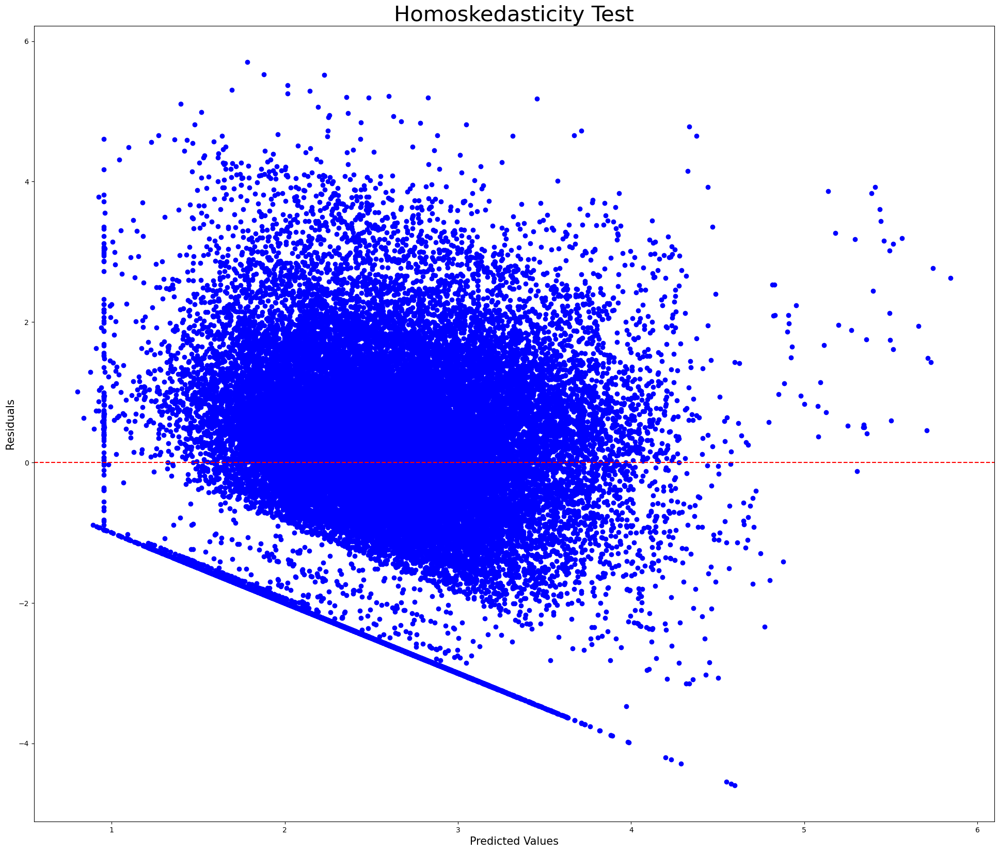

{'LM-Stat': 2020.667422287009, 'LM p-val': 0.0, 'F-Stat': 12.519901994161772, 'F p-val': 5e-324}
{'LM-Stat': 367.139878242595, 'LM p-val': 1.3363449126358943e-67, 'F-Stat': 21.8038857308573, 'F p-val': 5.7934757509461284e-68}
0.47553834568839465


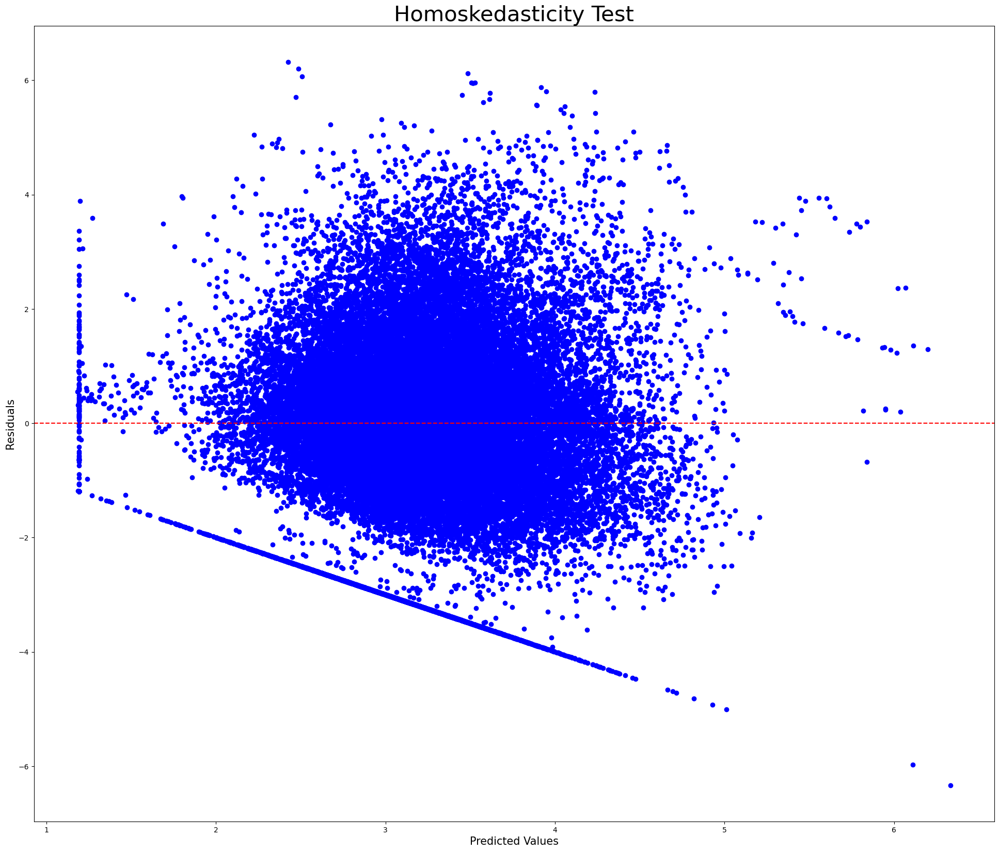

{'LM-Stat': 2913.664973178027, 'LM p-val': 0.0, 'F-Stat': 18.529728823122834, 'F p-val': 0.0}
{'LM-Stat': 892.1842394920304, 'LM p-val': 9.896711412941085e-179, 'F-Stat': 53.761987196605965, 'F p-val': 4.990310809330069e-181}
0.39746014419543335


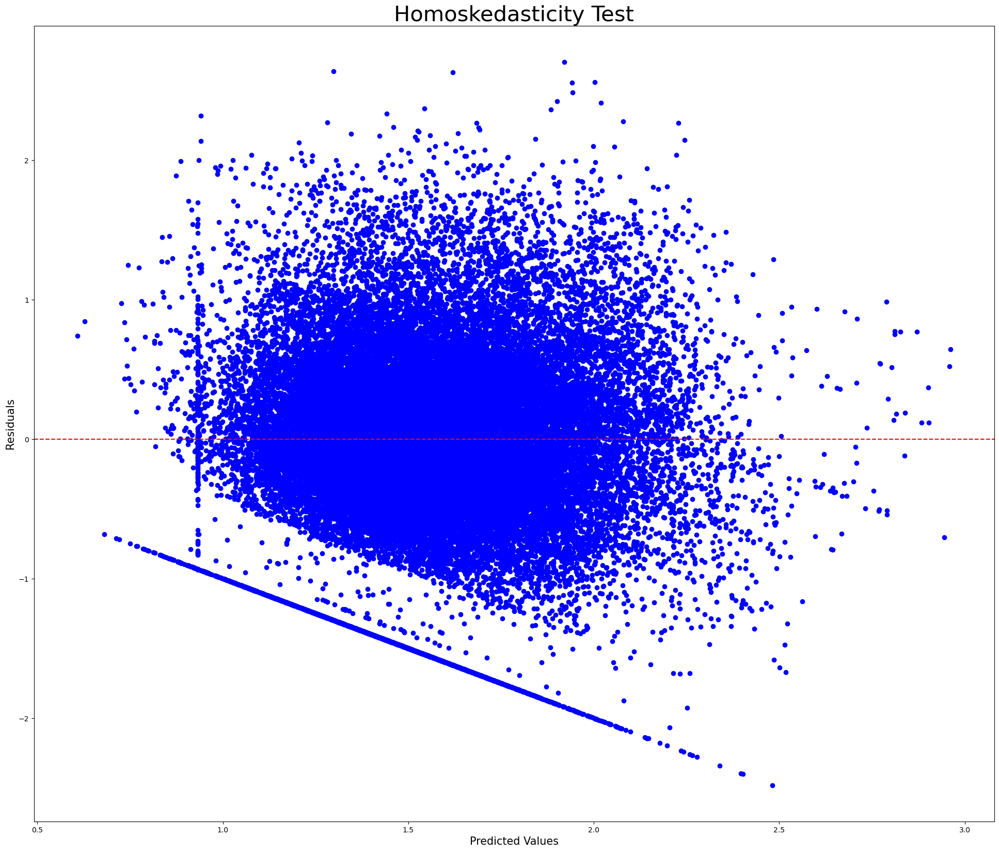

{'LM-Stat': 1309.4270570408905, 'LM p-val': 5.610162323074296e-175, 'F-Stat': 7.9501498844133165, 'F p-val': 6.547222374819503e-179}
{'LM-Stat': 222.65199285651647, 'LM p-val': 7.656122773819865e-38, 'F-Stat': 13.17061800624645, 'F p-val': 5.748923150577573e-38}
0.5344986067815669


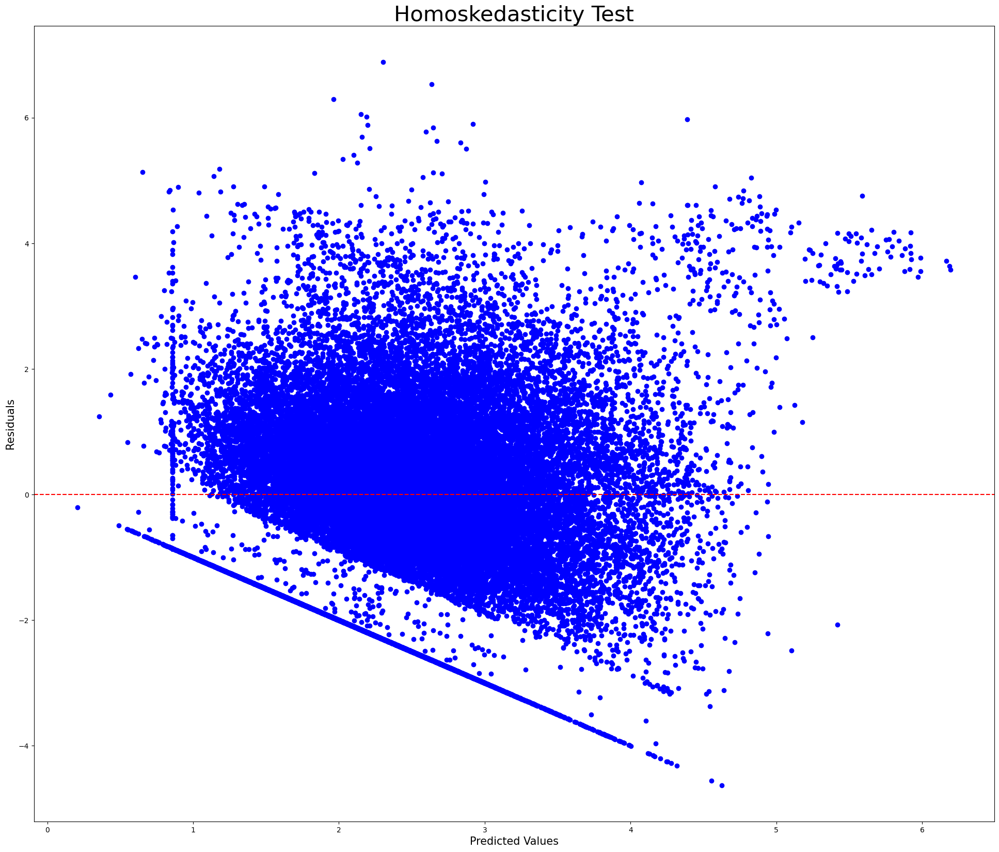

{'LM-Stat': 3903.5501376000343, 'LM p-val': 0.0, 'F-Stat': 25.573848872518997, 'F p-val': 0.0}
{'LM-Stat': 786.1713995558263, 'LM p-val': 4.025821029429728e-156, 'F-Stat': 47.2340093166827, 'F p-val': 6.829263414880411e-158}
0.3788238448858107


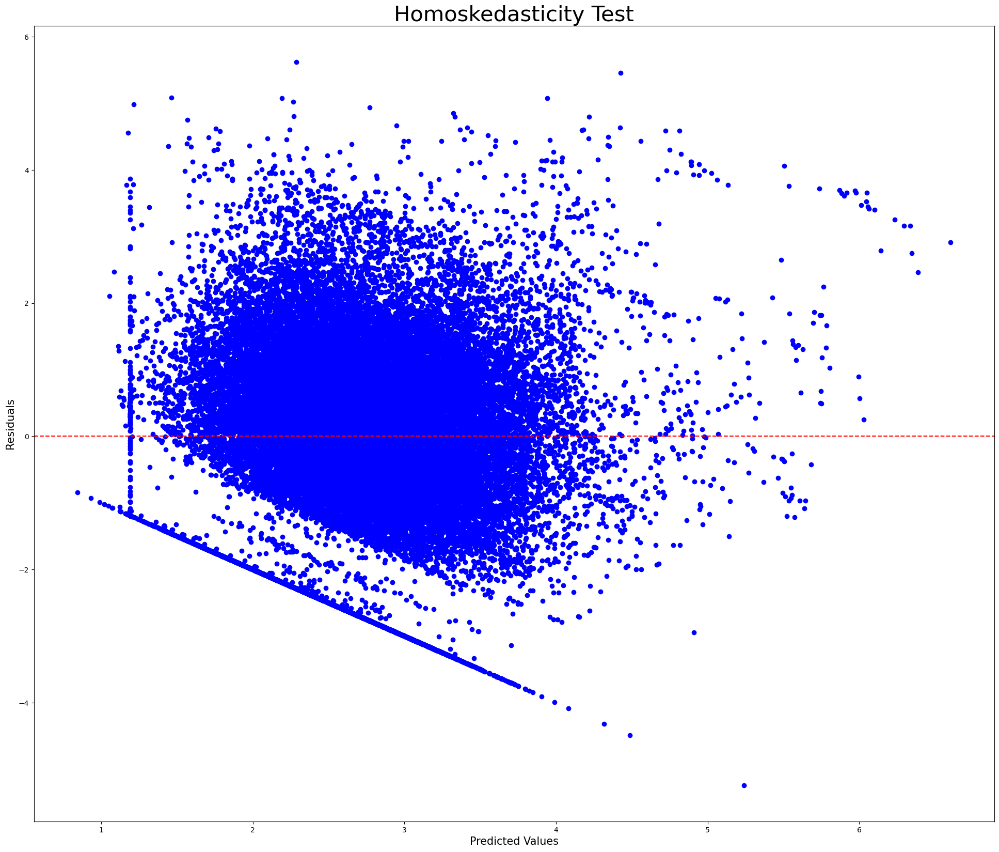

{'LM-Stat': 1800.0479636124987, 'LM p-val': 6.3680510559729034e-270, 'F-Stat': 11.082495681386911, 'F p-val': 4.7532096106969027e-278}
{'LM-Stat': 335.9338509511035, 'LM p-val': 4.117074496229608e-61, 'F-Stat': 19.933494873764605, 'F p-val': 2.0594797014058063e-61}
0.4545649721344248


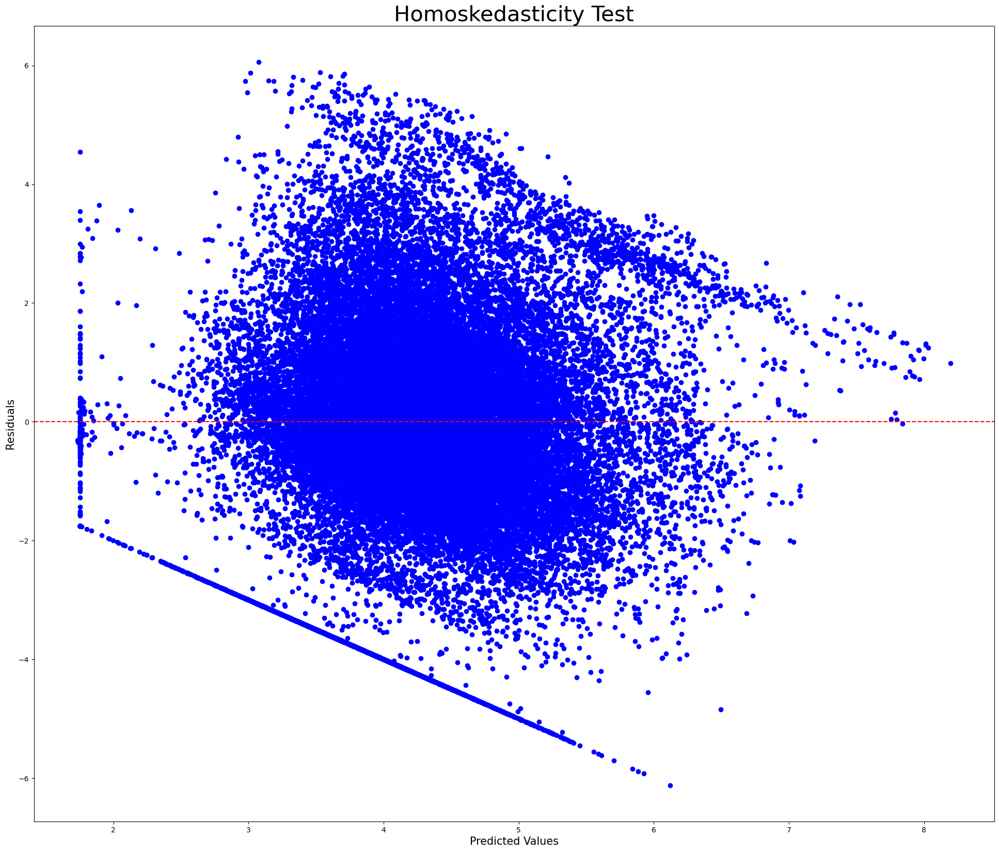

{'LM-Stat': 2024.728059782439, 'LM p-val': 0.0, 'F-Stat': 12.546529677094012, 'F p-val': 0.0}
{'LM-Stat': 337.41062297194645, 'LM p-val': 2.0328785394941065e-61, 'F-Stat': 20.021935602653024, 'F p-val': 1.010348972898185e-61}
0.2902284650170946


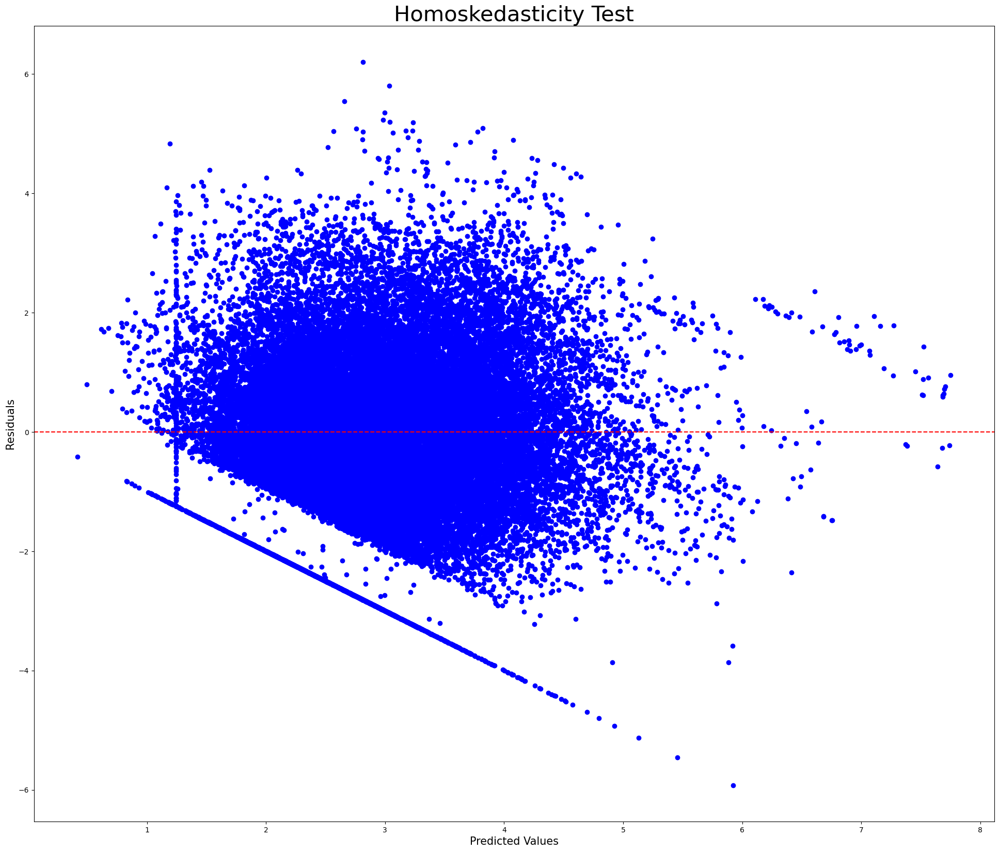

{'LM-Stat': 2933.4167104997564, 'LM p-val': 0.0, 'F-Stat': 18.66624816178944, 'F p-val': 0.0}
{'LM-Stat': 812.5737457168742, 'LM p-val': 9.527445205601073e-162, 'F-Stat': 48.85618823962493, 'F p-val': 1.2127723033453843e-163}
0.3686036385612408


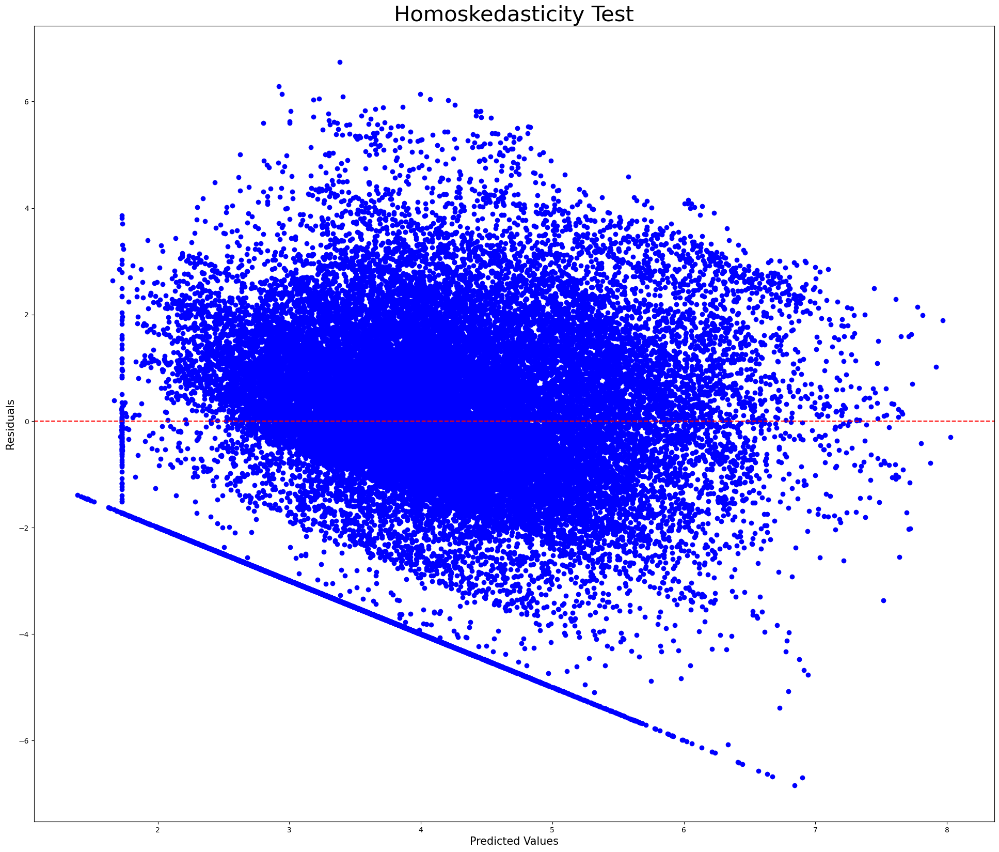

{'LM-Stat': 2376.448105129928, 'LM p-val': 0.0, 'F-Stat': 14.876832273674177, 'F p-val': 0.0}
{'LM-Stat': 705.4321607316161, 'LM p-val': 6.097545673354929e-139, 'F-Stat': 42.28809124932253, 'F p-val': 2.3409480539276846e-140}
0.3167834264240294


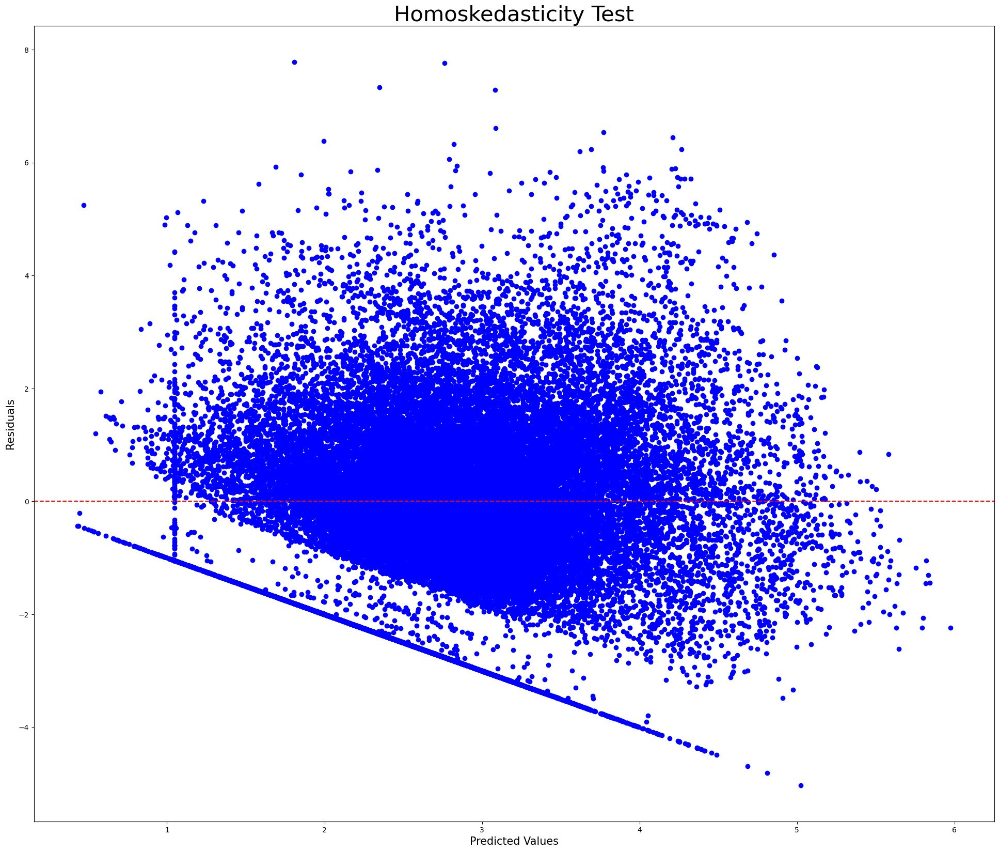

{'LM-Stat': 5825.026072845987, 'LM p-val': 0.0, 'F-Stat': 40.535804131130995, 'F p-val': 0.0}
{'LM-Stat': 1367.2140343832696, 'LM p-val': 1.705624290393244e-280, 'F-Stat': 83.49378032539406, 'F p-val': 5.1381998846091875e-286}
0.41504286753600045


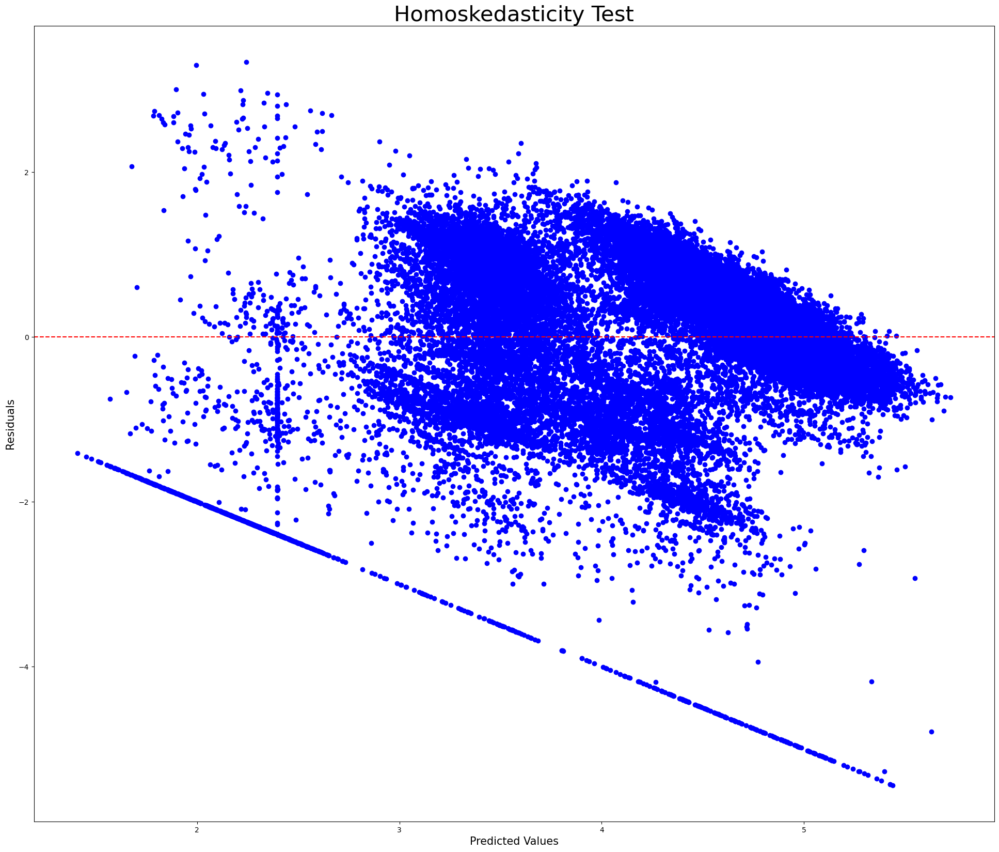

{'LM-Stat': 3388.61995572186, 'LM p-val': 0.0, 'F-Stat': 21.857339262116774, 'F p-val': 0.0}
{'LM-Stat': 2300.598534835633, 'LM p-val': 0.0, 'F-Stat': 144.30424908274432, 'F p-val': 0.0}
0.4325102470995701


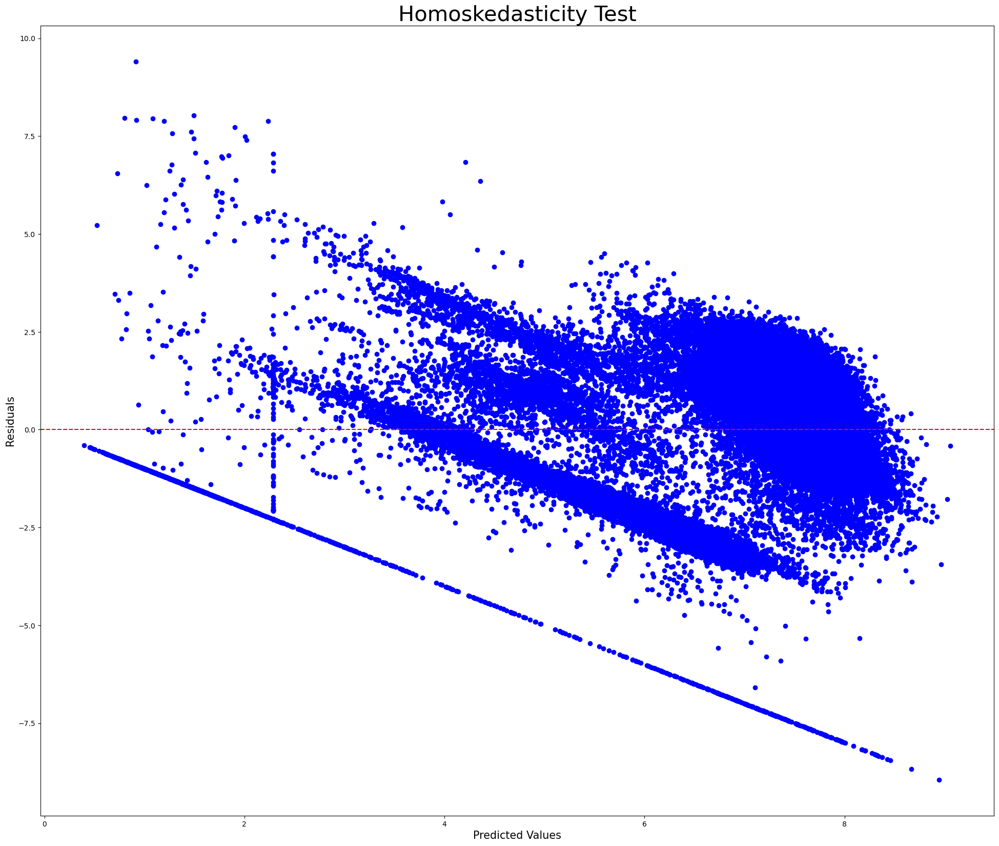

{'LM-Stat': 1884.9739681388273, 'LM p-val': 1.1024076036474651e-286, 'F-Stat': 11.633660335869717, 'F p-val': 1.0751701039207231e-295}
{'LM-Stat': 596.5172818710387, 'LM p-val': 7.783839848894848e-116, 'F-Stat': 35.6512215150013, 'F p-val': 7.771485117417826e-117}
0.3109827445959469


In [44]:
from linearmodels import PooledOLS
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_white, het_breuschpagan
from statsmodels.stats.stattools import durbin_watson

pooledOLS_res = {}
fitted_values = {}
residuals = {}

data_i = data_2.reset_index(drop=True)
data_i.set_index(['Month', 'Day'], inplace=True)

traini = data_i.iloc[:-7200, :]
testi = data_i.iloc[-7200:, :]

for name in traini.columns.values.tolist():
    exog = sm.tools.tools.add_constant(traini.iloc[:-1, traini.columns != name])
    endog = pd.DataFrame(traini[name].shift(-1).iloc[:-1])

    mod = PooledOLS(endog, exog)
    pooledOLS_res[name] = mod.fit(cov_type='clustered', cluster_entity=True)
    fittedvals_pooled_OLS = pooledOLS_res[name].predict().fitted_values
    residuals_pooled_OLS = pooledOLS_res[name].resids
    fitted_values[name] = fittedvals_pooled_OLS
    residuals[name] = residuals_pooled_OLS
    
    fig, ax = plt.subplots()
    ax.scatter(fittedvals_pooled_OLS, residuals_pooled_OLS, color = 'blue')
    ax.axhline(0, color = 'r', ls = '--')
    ax.set_xlabel('Predicted Values', fontsize = 15)
    ax.set_ylabel('Residuals', fontsize = 15)
    ax.set_title('Homoskedasticity Test', fontsize = 30)
    plt.show()
    
    #pooled_OLS_dataset = pd.concat([train, residuals_pooled_OLS], axis=1)
    
    white_test_results = het_white(residuals_pooled_OLS, exog)
    labels = ['LM-Stat', 'LM p-val', 'F-Stat', 'F p-val'] 
    print(dict(zip(labels, white_test_results)))
    
    breusch_pagan_test_results = het_breuschpagan(residuals_pooled_OLS, exog)
    labels = ['LM-Stat', 'LM p-val', 'F-Stat', 'F p-val'] 
    print(dict(zip(labels, breusch_pagan_test_results)))
    
    durbin_watson_test_results = durbin_watson(residuals_pooled_OLS) 
    print(durbin_watson_test_results)

As we can see from above, the residuals spread out with respect to the predicted values which is a sign of growing variance and heteroskedaticity. Our test results confirm this as p-val < 0.05 for all in both tests for homoskedaticity. Also, the Durbin-Watson test tells us that for each OLS model, we had strong-autocorrelation.

Hence, simple linear regression models will not work. Let us build the FE and RE models for this data now.

In [46]:
from linearmodels import PanelOLS
from linearmodels import RandomEffects

for name in traini.columns.values.tolist():
    exog = sm.tools.tools.add_constant(traini.iloc[:-1, traini.columns != name])
    endog = pd.DataFrame(traini[name].shift(-1).iloc[:-1])
    
    model_re = RandomEffects(endog, exog) 
    re_res = model_re.fit() 

    model_fe = PanelOLS(endog, exog, entity_effects = True) 
    fe_res = model_fe.fit() 

    print(re_res)
    print(fe_res)

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 1   R-squared:                        0.3359
Estimator:              RandomEffects   R-squared (Between):             -6.8794
No. Observations:               36719   R-squared (Within):               0.3362
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.3359
Time:                        14:09:48   Log-likelihood                -7.628e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1092.0
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             1092.0
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 3   R-squared:                        0.1697
Estimator:              RandomEffects   R-squared (Between):             -0.0490
No. Observations:               36719   R-squared (Within):               0.1710
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.1697
Time:                        14:09:50   Log-likelihood                -6.404e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      441.37
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             441.37
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 5   R-squared:                        0.0996
Estimator:              RandomEffects   R-squared (Between):              0.8050
No. Observations:               36719   R-squared (Within):               0.0781
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0996
Time:                        14:09:51   Log-likelihood                -4.113e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      238.73
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             238.73
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 7   R-squared:                        0.1084
Estimator:              RandomEffects   R-squared (Between):              0.9922
No. Observations:               36719   R-squared (Within):               0.1064
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.1084
Time:                        14:09:52   Log-likelihood                -6.399e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      262.53
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             262.53
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 9   R-squared:                        0.1263
Estimator:              RandomEffects   R-squared (Between):              0.9039
No. Observations:               36719   R-squared (Within):               0.1194
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.1263
Time:                        14:09:53   Log-likelihood                -6.593e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      312.18
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             312.18
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 11   R-squared:                        0.2156
Estimator:              RandomEffects   R-squared (Between):              0.6114
No. Observations:               36719   R-squared (Within):               0.1971
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.2156
Time:                        14:09:54   Log-likelihood                -6.425e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      593.44
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             593.44
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 13   R-squared:                        0.1604
Estimator:              RandomEffects   R-squared (Between):              0.9677
No. Observations:               36719   R-squared (Within):               0.1588
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.1604
Time:                        14:09:56   Log-likelihood                -7.207e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      412.41
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             412.41
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 15   R-squared:                        0.2433
Estimator:              RandomEffects   R-squared (Between):              0.2396
No. Observations:               36719   R-squared (Within):               0.2431
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.2433
Time:                        14:09:57   Log-likelihood                -7.279e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      694.15
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             694.15
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 17   R-squared:                        0.3986
Estimator:              RandomEffects   R-squared (Between):              0.0182
No. Observations:               36719   R-squared (Within):               0.4078
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.3986
Time:                        14:09:58   Log-likelihood                -4.881e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1430.9
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36701)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             1430.9
                            

As we can see from above, for most of them, RE model fares better than FE model. For some it is vice-versa. Why? Endogeneity of the model. If the model is endogeneous, explanatory variables (power consumptions for ACs) are correlated with the error terms. A fix for this can be using our differnced series as we saw that the correlations there were not significant between variables. 

In [48]:
traini = traini.diff().iloc[1:]

fe_res = {}
re_res = {}

for name in traini.columns.values.tolist():
    exog = sm.tools.tools.add_constant(traini.iloc[:-1, traini.columns != name])
    endog = pd.DataFrame(traini[name].shift(-1).iloc[:-1])
    
    model_re = RandomEffects(endog, exog) 
    re_res[name] = model_re.fit() 

    model_fe = PanelOLS(endog, exog, entity_effects = True) 
    fe_res[name] = model_fe.fit() 

    print(re_res[name])
    print(fe_res[name])

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 1   R-squared:                        0.0117
Estimator:              RandomEffects   R-squared (Between):              0.0501
No. Observations:               36717   R-squared (Within):               0.0117
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0117
Time:                        14:23:59   Log-likelihood                -5.867e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      25.497
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             25.497
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 3   R-squared:                        0.0089
Estimator:              RandomEffects   R-squared (Between):             -0.1011
No. Observations:               36717   R-squared (Within):               0.0089
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0089
Time:                        14:24:00   Log-likelihood                -5.608e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      19.309
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             19.309
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 5   R-squared:                        0.0144
Estimator:              RandomEffects   R-squared (Between):             -30.626
No. Observations:               36717   R-squared (Within):               0.0144
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0144
Time:                        14:24:01   Log-likelihood                 -4.44e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      31.515
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             31.515
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 7   R-squared:                        0.0102
Estimator:              RandomEffects   R-squared (Between):              0.3613
No. Observations:               36717   R-squared (Within):               0.0102
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0102
Time:                        14:24:03   Log-likelihood                -6.297e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      22.339
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             22.339
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                   AC 9   R-squared:                        0.0080
Estimator:              RandomEffects   R-squared (Between):             -0.7359
No. Observations:               36717   R-squared (Within):               0.0080
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0080
Time:                        14:24:04   Log-likelihood                 -6.29e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      17.408
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             17.408
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 11   R-squared:                        0.0135
Estimator:              RandomEffects   R-squared (Between):             -0.0693
No. Observations:               36717   R-squared (Within):               0.0135
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0135
Time:                        14:24:05   Log-likelihood                -6.011e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      29.635
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             29.635
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 13   R-squared:                        0.0207
Estimator:              RandomEffects   R-squared (Between):             -0.3133
No. Observations:               36717   R-squared (Within):               0.0207
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0207
Time:                        14:24:06   Log-likelihood                -6.194e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      45.743
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             45.743
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 15   R-squared:                        0.0186
Estimator:              RandomEffects   R-squared (Between):             -0.2421
No. Observations:               36717   R-squared (Within):               0.0186
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0186
Time:                        14:24:08   Log-likelihood                -6.326e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      41.021
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             41.021
                            

                        RandomEffects Estimation Summary                        
Dep. Variable:                  AC 17   R-squared:                        0.0807
Estimator:              RandomEffects   R-squared (Between):              0.8628
No. Observations:               36717   R-squared (Within):               0.0807
Date:                Sun, Oct 10 2021   R-squared (Overall):              0.0807
Time:                        14:24:09   Log-likelihood                -4.349e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      189.43
Entities:                           2   P-value                           0.0000
Avg Obs:                    1.836e+04   Distribution:                F(17,36699)
Min Obs:                     1.44e+04                                           
Max Obs:                    2.232e+04   F-statistic (robust):             189.43
                            

And Voila! Our results are better, which means endogeneity was removed to some extent. And RE fares better than FE for in all of the models. Let us do a test for endogeneity to lay this FE vs RE to rest. (Hausmann Test)

In [51]:
import numpy.linalg as la
from scipy import stats
import numpy as np

def hausman(fe, re):
    b = fe.params
    B = re.params
    v_b = fe.cov
    v_B = re.cov
    df = b[np.abs(b) < 1e8].size
    chi2 = np.dot((b - B).T, la.inv(v_b - v_B).dot(b - B)) 
 
    pval = stats.chi2.sf(chi2, df)
    return chi2, df, pval

for name in traini.columns.values.tolist():
    hausman_results = hausman(fe_res[name], re_res[name]) 

    print('chi-Squared: ' + str(hausman_results[0]))
    print('degrees of freedom: ' + str(hausman_results[1]))
    print('p-Value: ' + str(hausman_results[2]))

chi-Squared: 8.975749338323184e-10
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 9.210780464836558e-10
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 3.0355959512514955e-07
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 2.8147260168634506e-11
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 4.182637778629243e-10
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 2.4057141517131296e-08
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 1.1234326211039456e-08
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 2.2995541819313128e-08
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 6.296450804950779e-10
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 1.3458049801135033e-09
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 1.4358905471378043e-08
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 1.5020300354455498e-09
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 3.589738999119982e-08
degrees of freedom: 18
p-Value: 1.0
chi-Squared: 4.660117982134907e-12
degrees of freedom: 18
p-Value: 1.

And here we are. We have to accept the null hypothesis that there is no statistically significant endogenity in our model when using the differnced series for forecast. Now, there is a slight issue with linearmodels librarty in python, it does not offer a predict function for models. But our analysis shows that we can forecast power values for individuals using RE model on the differnced series.

## Temperature related with Power Consumption (Optional)

In [70]:
temp_aug = pd.read_csv("aug_temp2.csv")
temp_sept = pd.read_csv("sept_temp.csv")

temperature = [temp_aug, temp_sept]
temperature = pd.concat(temperature)
temperature.drop(["Time_num"], axis=1, inplace=True)
print(temperature.shape)
print(temperature.head())

(1464, 3)
         Date  Temp      Time
0  01-08-2019    31  00:00:00
1  01-08-2019    31  01:00:00
2  01-08-2019    31  02:00:00
3  01-08-2019    30  03:00:00
4  01-08-2019    31  04:00:00


The data that I could find online was an hourly temperature dataset. Hence, we will resample our power data accordingly. 

In [74]:
data_h = data.resample('H').sum()
data_h = data_h.loc[:"2019-09-16 00:00:00"]
data_h.reset_index(drop=False, inplace=True)
print(data_h.shape)
print(data_h.head())

(1105, 19)
            Date_Time        AC 1        AC 2       AC 3       AC 4  \
0 2019-08-01 00:00:00  205.245213  255.051086  54.055665  29.255579   
1 2019-08-01 01:00:00  222.230520  253.772243  44.703934  55.266208   
2 2019-08-01 02:00:00  220.526540  243.397378  44.469689  43.961705   
3 2019-08-01 03:00:00  199.178419  237.699376  67.146196  43.220318   
4 2019-08-01 04:00:00  197.929595  219.027004  52.349741  76.439507   

        AC 5        AC 6       AC 7        AC 8        AC 9      AC 10  \
0  66.960217  129.089322  80.320214  144.775203  109.584198  76.679951   
1  67.100296  129.442455  78.308407  133.896818   91.611631  79.768370   
2  59.740380  126.486130  82.591836  114.041240   93.468669  84.098961   
3  62.731445  142.045032  91.343533  116.870897   85.345919  81.955078   
4  56.164297  108.017994  87.555958  113.062609  101.495620  77.929729   

       AC 11      AC 12       AC 13       AC 14       AC 15       AC 16  \
0  49.562069  60.468362  136.477574  155.9

In [77]:
temp_corrs = []
for name in data_h.drop("Date_Time", axis=1).columns.values.tolist():
     temp_corrs.append(data_h[name].corr(temperature["Temp"]))
print(temp_corrs)

[-0.08935992294143122, -0.14712297942481248, -0.08840894372099717, -0.2295231108140256, 0.008778423840451867, -0.09899696930829521, -0.2845039657419522, -0.31695558911181987, -0.3556412955248107, -0.3914860090602673, -0.2882296078319982, -0.1974042642528923, -0.04338290894243937, -0.4471499375549197, -0.10817316023331207, -0.21919986045189985, 0.34343031863460594, 0.34530542315932355]


Well, what we can see here is that temperature and power series given here are not well correlated. And all of them are negatively correlated except AC 17 and AC 18. This is kind of weird as when temperature increase, the general idea is that the AC will have to work harder to maintain the specified temperature. But here, what we are seeing is that as temperature is increasing, there is a tendency for power consumption to reduce in these ACs.

Obviously there are many more factors to be taken into account, for example, the zero values in our data. They will cause this kind of shifts. To fill them, we need a goofd metric that defines what to do with zero vectors of different lengths. And, then we can impute them by designing a custom imputer in sk-learn. I worked with a KNN imputer but the results were not very good as the metric was euclidean, something that won't work well in the given context.

## DUMP

Here is the extra code that was generated while working with this dataset. An observation I found interesting was the smoothness of trends and seasonality when doing a seasonal decomposition over hourly moving average. Also, you can check here the day by day correlation for a single AC.

In [ ]:
grouped = data_2.drop(["0"], axis=1).groupby(['Month', 'Day'])
groups = grouped.groups

AC_by_day = {}
ACs = data_2.drop(["0", "Month", "Day", "Time"], axis=1).columns.values.tolist()
for name in ACs:
    AC_by_day[name] = pd.DataFrame()

dfs = {}
for key, df in groups.items():
    dfs[key] = pd.DataFrame(data_2.drop(["0", "Month", "Day"], axis=1).loc[groups[key]])
    
for key, df1 in dfs.items(): 
    for name, df2 in AC_by_day.items():
        m, n = key
        df2.loc[:, "0{} {}".format(m , n)] = list(df1.loc[:, name])

corrs_day = {}
corrs_noon = {}

for name, df2 in AC_by_day.items():
    df2.loc[:, "Time"] = data_2["Time"]
    corrs_day[name] = df2.drop(["Time"], axis = 1).corr()
    corrs_noon[name] = df2.loc[noon(df2)].drop(["Time"], axis = 1).corr()
    
means_noon = data_2.drop(["0", "Time"], axis=1).loc[noon(data_2)].groupby(["Month", "Day"]).mean()
means_day = data_2.drop(["0", "Time"], axis=1).groupby(["Month", "Day"]).mean()

hourly_mavg = pd.DataFrame(data_2.loc[:, ["0", "Month", "Day", "Time"]])

for name in ACs:
    hourly_mavg.loc[:, name] = data_2[name].rolling(window=30).mean()
    
hmavg_nm = hourly_mavg.drop(["0", "Time"], axis=1).loc[noon(hourly_mavg)].groupby(["Month", "Day"]).mean()
hmavg_dm = hourly_mavg.drop(["0", "Time"], axis = 1).groupby(["Month", "Day"]).mean()

corr_hmavg = hourly_mavg.corrwith(data_2, axis = 0)

plt.figure()
data_2.plot(x = "0", y = "AC 1", kind = "line")
hourly_mavg.plot(x = "0", y = "AC 1", kind = "line")
plt.show()

plt.figure()
plt.plot(AC_by_day['AC 1'].drop(["Time"], axis = 1).columns.values.tolist(), list(means_noon["AC 1"]), "r")
plt.plot(AC_by_day['AC 1'].drop(["Time"], axis = 1).columns.values.tolist(), list(hmavg_nm["AC 1"]))
plt.show()

plt.figure()
plt.plot(AC_by_day['AC 1'].drop(["Time"], axis = 1).columns.values.tolist(), list(means_day["AC 1"]), "r")
plt.plot(AC_by_day['AC 1'].drop(["Time"], axis = 1).columns.values.tolist(), list(hmavg_dm["AC 1"]))
plt.show()

imputer = KNNImputer(missing_values = 0, n_neighbors = 5, weights = 'uniform')
#imputed = []

#for key, df in groups.items():
#    imputed.append(pd.DataFrame(imputer.fit_transform(data_2.drop(["0", "Month", "Day", "Time"], axis=1).loc[groups[key]])))

imputed = pd.DataFrame(imputer.fit_transform(data_2.drop(["0", "Month", "Day", "Time"], axis=1)))
null_imp = imputed.isnull().sum()

#imputer_null = KNNImputer()
#imputed = pd.DataFrame(imputer_null.fit_transform(imputed))
#null_pass2 = imputed.isnull().sum()
station_test = pd.DataFrame()

for name in imputed.columns.values.tolist():
    station_test.loc[name, "ADF"] = adf_test(imputed[name])
    station_test.loc[name, "KPSS"] = kpss_test(imputed[name])

imputed_diff = imputed.diff()
imputed_diff.drop(0, inplace = True)
station_test_diff = pd.DataFrame()

for name in imputed_diff.columns.values.tolist():
    station_test_diff.loc[name, "ADF"] = adf_test(imputed_diff[name])
    station_test_diff.loc[name, "KPSS"] = kpss_test(imputed_diff[name])

imputed.loc[:, "Date_Time"] = data_2.loc[:, "0"]
imputed.set_index("Date_Time", drop=True, inplace=True)
seasonality = {}
trend = {}
residual = {}
decomp_freq = 6*60

for name in imputed.columns.values.tolist():
    decomp = seasonal.seasonal_decompose(imputed[name], model = "multiplicative", period= decomp_freq)
    seasonality[name] = decomp.seasonal
    trend[name] = decomp.trend
    residual[name] = decomp.resid

rcParams["figure.figsize"] = 24, 20
pd.DataFrame(seasonality)["2019-08-07":"2019-08-08"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(trend)["2019-08-07":"2019-08-27"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(residual)["2019-08-07":"2019-08-27"].plot(subplots = True, layout = (3 , 6), linewidth=1)

hourly_mavg.set_index("0", drop=True, inplace=True)
hourly_mavg.drop(pd.date_range( start = "2019-08-01 00:00:00", periods=29, freq= "2min"), inplace=True)
seasonality_avg = {}
trend_avg = {}
residual_avg = {}

for name in hourly_mavg.drop(["Month", "Day", "Time"], axis=1).columns.values.tolist():
    decomp = seasonal.seasonal_decompose(hourly_mavg[name], model = "additive", period= decomp_freq)
    seasonality_avg[name] = decomp.seasonal
    trend_avg[name] = decomp.trend
    residual_avg[name] = decomp.resid

rcParams["figure.figsize"] = 24, 20
pd.DataFrame(seasonality_avg)["2019-08-07":"2019-08-08"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(trend_avg)["2019-08-07":"2019-08-27"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(residual_avg)["2019-08-07":"2019-08-27"].plot(subplots = True, layout = (3 , 6), linewidth=1)

data_2.set_index("0", drop=True, inplace=True)
seasonality_data = {}
trend_data = {}
residual_data = {}

for name in data_2.drop(["Month", "Day", "Time"], axis=1).columns.values.tolist():
    decomp = seasonal.seasonal_decompose(data_2[name], model = "additive", period= decomp_freq)
    seasonality_data[name] = decomp.seasonal
    trend_data[name] = decomp.trend
    residual_data[name] = decomp.resid

rcParams["figure.figsize"] = 24, 20
pd.DataFrame(seasonality_data)["2019-08-07":"2019-08-08"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(trend_data)["2019-08-07":"2019-08-27"].plot(subplots = True, layout = (3 , 6), linewidth=1)
pd.DataFrame(residual_data)["2019-08-07":"2019-08-27"].plot(subplots = True, layout = (3 , 6), linewidth=1)

hmavg_diff = hourly_mavg.drop(["Month", "Day", "Time"], axis=1).diff()
hmavg_diff.drop("2019-08-01 00:58:00", inplace = True)

seasonality_mad = {}
trend_mad = {}
residual_mad = {}

for name in hmavg_diff.drop(["Month", "Day", "Time"], axis=1).columns.values.tolist():
    decomp = seasonal.seasonal_decompose(hmavg_diff[name], model = "additive", period= decomp_freq)
    seasonality_mad[name] = decomp.seasonal
    trend_mad[name] = decomp.trend
    residual_mad[name] = decomp.resid